In [32]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
from tqdm import tqdm

from skimage import io, transform
from unet import UNet
from pathlib import PureWindowsPath
import time
#os.environ['CUDA_VISIBLE_DEVICES'] = '3'
import pandas as pd
import numpy as np
from torch.utils.data import Dataset, DataLoader
import torch.optim
import glob
import torch
import torch.optim
import torchvision.transforms
from PIL import Image

from skimage.measure import compare_psnr
from pathlib import Path
import torch
import scipy
torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.FloatTensor
import imageio
imsize =-1
PLOT = True
sigma = 25
sigma_ = sigma/255.
import skimage

In [33]:
UseGoogleColab = False

In [34]:
import os
import sys

if UseGoogleColab:
    from google.colab import drive
    drive.mount('/content/drive/', force_remount=True)
    sys.path.append('/content/drive/My Drive/GoogleColabProjects/FGNet')
    LocalAppPath = 'drive/My Drive/GoogleColabProjects/FGNet'
#     !ls "/content/drive/My Drive/GoogleColabProjects/FGNet/Data/snowFall/input"
else:
    LocalAppPath = os.getcwd()


In [35]:
# check if GPU is available
train_on_gpu = torch.cuda.is_available()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

if not train_on_gpu:
    print('Bummer!  Training on CPU ...')
else:
    print('You are good to go!  Training on GPU ...')


You are good to go!  Training on GPU ...


In [36]:
class PTPDataset(Dataset):
    """PTPDataset   dataset."""

    def __init__(self, csv_file, transform=None,val_mode=False,scale = 1):
        """
        Args:
            csv_file (string): Path to the csv file with annotations.
             transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.scale = scale
        self.val_mode = val_mode
        self.frames = pd.read_csv(csv_file)
        # print(self.frames.values)
        self.transform = transform

    def __len__(self):
#         print(len(self.frames))
        return len(self.frames)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        pixel_size = self.frames.iloc[idx, 0]
        patch_img = io.imread(self.frames.iloc[idx, 1])

        orientation = self.frames.iloc[idx, 2]
        MTF_Y = self.frames.iloc[idx, 3:38]

#         print(pixel_size)
#         print(orientation)
#         print(MTF_Y)
        MTF_Y = []
        for i in range(3,39):
            MTF_Y.append(self.frames.iloc[idx, i].astype('float'))
      
        self.transform = torchvision.transforms.Compose([torchvision.transforms.ToTensor()])
        patch_img = self.transform(patch_img)
        MTF_Y_tensor = torch.from_numpy(np.array(MTF_Y))

        sample = {'MTF_Y': MTF_Y_tensor,'patch': patch_img}
#         print(MTF_Y_tensor)
#         if self.transform:
#             sample = self.transform(sample)

        return sample

In [37]:
train_dataset = PTPDataset(csv_file=str(Path(LocalAppPath) / 'data_ptp.csv'))


In [38]:
# sam = next(iter(train_dataset))
# print(sam['MTF_Y'].numpy().flatten())
# show_sample(sam)

In [39]:
import torch.nn.functional as F

class PTPNet(torch.nn.Module):
    def __init__(self):
        super(PTPNet, self).__init__()
 
        H = 35
        W = 55
        self.conv1 = torch.nn.Conv2d(1, 64, kernel_size=3, stride=1) #32, 33, 53
        self.bn1 = torch.nn.BatchNorm2d(64)
        self.act1 = torch.nn.LeakyReLU(negative_slope=0.2)
        
        self.conv2 = torch.nn.Conv2d(64, 128, kernel_size=3, stride=1) #64, 31, 51
        self.bn2= torch.nn.BatchNorm2d(128)
        self.act2 = torch.nn.LeakyReLU(negative_slope=0.2)
        
        self.m1 = torch.nn.MaxPool2d((2, 2), stride=(2, 2))#  64 X 15 x 25
        
        self.conv3 = torch.nn.Conv2d(128, 64, kernel_size=3, stride=1) #64, 13, 23
        self.bn3 = torch.nn.BatchNorm2d(64)
        self.act3 = torch.nn.Sigmoid()
        
  
        self.output_channels = [64,13,23]
        self.fc1 = torch.nn.Linear(self.output_channels[0]*self.output_channels[1]*self.output_channels[2], 36)


    def forward(self, x):
        
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.act1(x)
        
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.act2(x)
        
        x = self.m1(x)
        
        x = self.conv3(x)
        x = self.bn3(x)
        x = self.act3(x)
        

        x = x.view(-1, self.output_channels[0]*self.output_channels[1]*self.output_channels[2])

        output = F.sigmoid(self.fc1(x))
        return output

In [40]:

def show_sample(sample_batched,res=None):
        patch, MTF_Y  = sample_batched['patch'][0], sample_batched['MTF_Y']
        
#         print(MTF_Y)
#         print(MTF_Y.shape)
        fig_size = 6
        fig,ax = plt.subplots(1,2,figsize=(fig_size,fig_size))
        ax[0].imshow(patch.squeeze().numpy())
        ax[0].set_title('patch')
        MTF_Y = sample_batched['MTF_Y'].flatten()
        x = np.array(range(0,len(MTF_Y)))
#         print(x)
        ax[1].plot(x,MTF_Y.numpy().flatten())
        ax[1].set_title('MTF_Y')
        asp = np.diff(ax[1].get_xlim())[0] / np.diff(ax[1].get_ylim())[0]
  
        ax[1].set_aspect(asp) 

#         ax[1,1].plot(x,MTF_Y.numpy())
#         ax[1,1].set_title('MTF_Y')
        
        if not res is None:
            ax[1].plot(x,res.detach().cpu().numpy().flatten(),'r')

            
        
 

        plt.show()

In [41]:
train_dataset = PTPDataset(csv_file=str(Path(LocalAppPath) / 'data_ptp.csv'))
# print(len(train_dataset))
# face_dataset = FGDataset(csv_file=str(Path(r'C:\Users\Poz\MyProjects\FGNet\names.csv')))
from collections import defaultdict
dataloader = defaultdict()

print('Number of samples in 1 Epoch: {}'.format(len(train_dataset)))
batch_size = 1
dataloader['train'] = DataLoader(train_dataset, batch_size=batch_size,
                        shuffle=True, num_workers=0)




# INPUT = 'noise' # 'meshgrid'
# pad = 'reflection'
# OPT_OVER = 'net' # 'net,input'
net = PTPNet()
# reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 1e-5

optimizer = torch.optim.Adam(net.parameters(), lr=LR)
show_every = 100
exp_weight=0.99
# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]) / 1e6; 
print ('Number of params: %fm' % s)



 

Number of samples in 1 Epoch: 1
Number of params: 0.837732m


In [42]:

def train_model(model, criterion, optimizer, sched, num_epochs=5):
    since = time.time()
    num_epochs=1000
    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch+1, num_epochs))
        print('-' * 10)
 
        running_loss = 0.0
        for i_batch, sample_batched in enumerate(tqdm(dataloader['train'])):
#             print(i_batch)
    #     print(i_batch)
    #     observe 4th batch and stop.

    #         break
            optimizer.zero_grad()
#         print(max(sample_batched['image'].float().flatten()))
#         print(min(sample_batched['image'].float().flatten()))
            patch, MTF_Y  = sample_batched['patch'][0].to(device), sample_batched['MTF_Y'].to(device)
 
        
            output = net(patch.unsqueeze(0))
#             print(output)
#             print(MTF_Y)
            loss = criterion(output.squeeze(), MTF_Y.float().squeeze()).sum()
            #sched.step()
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * sample_batched['patch'].size(0)
            if i_batch % 200 == 0:
                plt.figure(1)
                show_sample(sample_batched,output)
                plt.axis('off')
                plt.ioff()
                plt.show()

        epoch_loss = running_loss / len(dataloader['train'].dataset)
        print('epoch_loss = {}'.format(epoch_loss))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    return net
        
      
    

Epoch 1/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

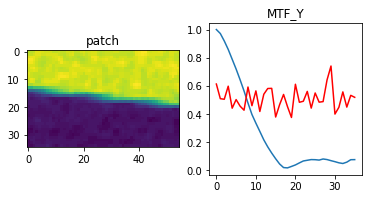

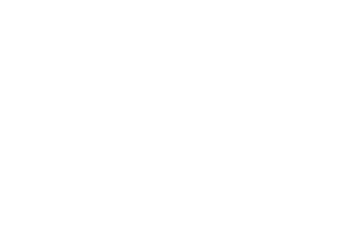

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.76it/s]


epoch_loss = 5.735084056854248
Epoch 2/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

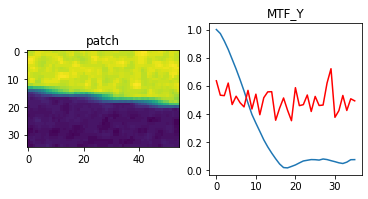

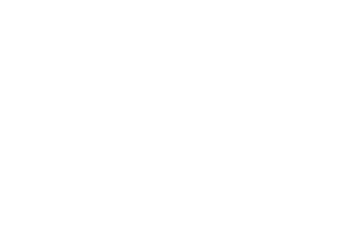

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.57it/s]


epoch_loss = 5.10854434967041
Epoch 3/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

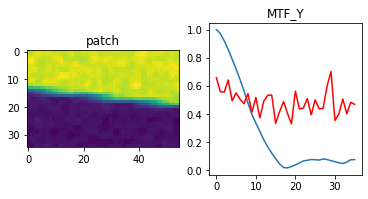

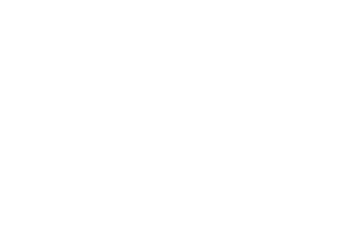

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 4.524923801422119
Epoch 4/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

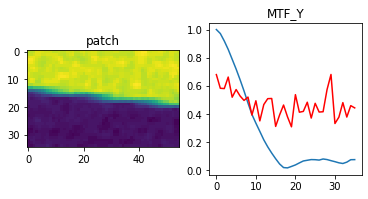

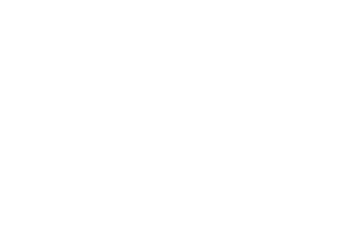

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.72it/s]


epoch_loss = 3.986736297607422
Epoch 5/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

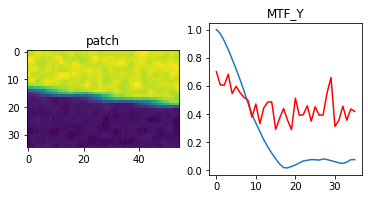

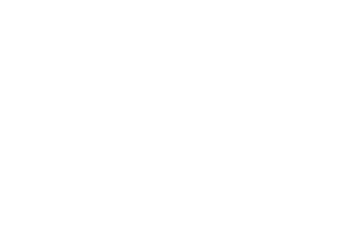

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.74it/s]


epoch_loss = 3.495182991027832
Epoch 6/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

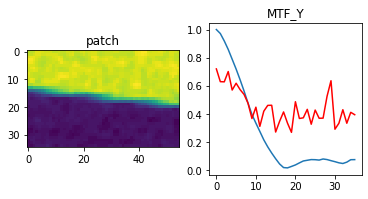

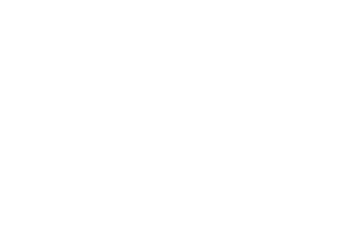

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 3.0502655506134033
Epoch 7/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

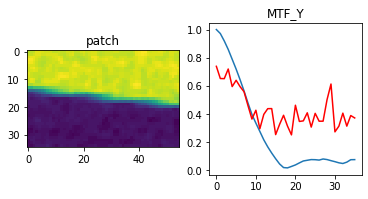

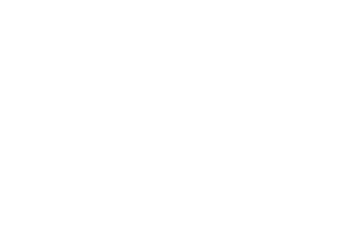

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]


epoch_loss = 2.6508960723876953
Epoch 8/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

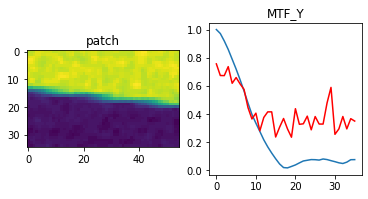

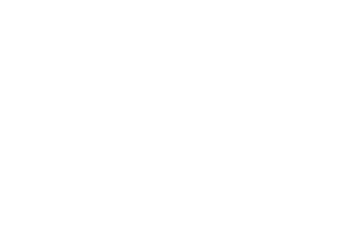

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.87it/s]


epoch_loss = 2.2952826023101807
Epoch 9/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

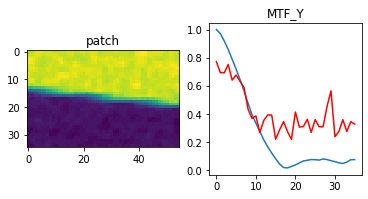

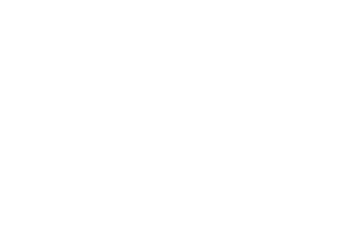

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.96it/s]


epoch_loss = 1.9809753894805908
Epoch 10/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

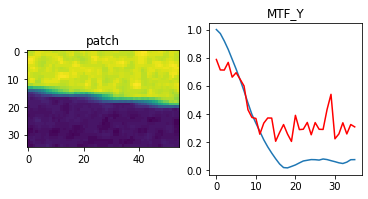

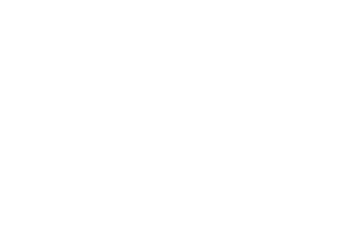

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 1.7049593925476074
Epoch 11/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

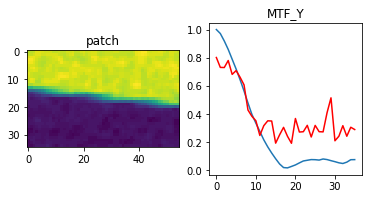

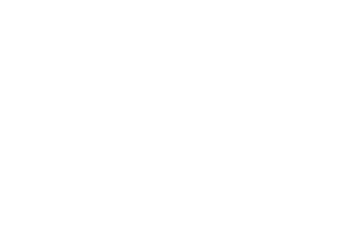

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 1.4641035795211792
Epoch 12/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

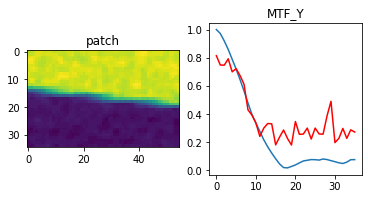

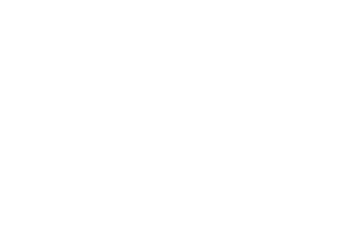

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]


epoch_loss = 1.2550549507141113
Epoch 13/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

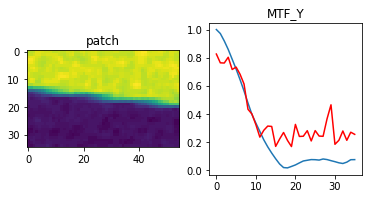

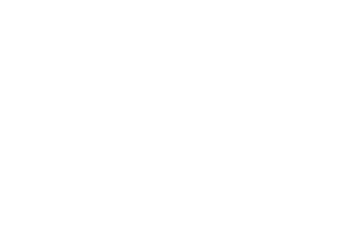

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 1.074432134628296
Epoch 14/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

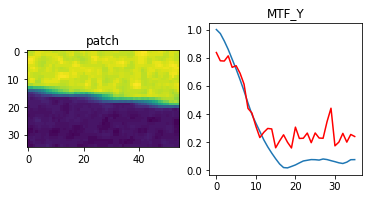

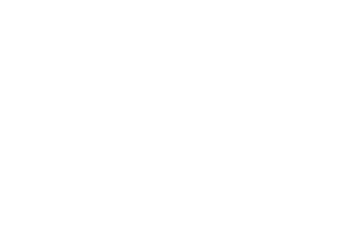

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 0.9190100431442261
Epoch 15/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

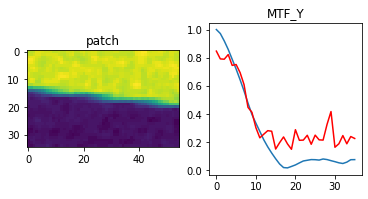

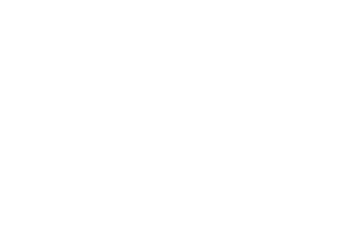

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.61it/s]


epoch_loss = 0.7857450246810913
Epoch 16/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

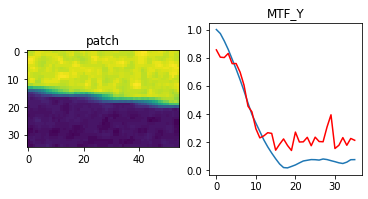

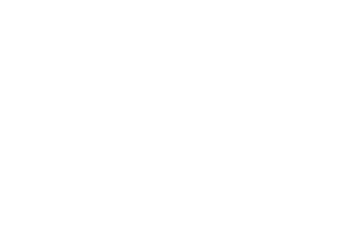

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 0.6718111038208008
Epoch 17/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

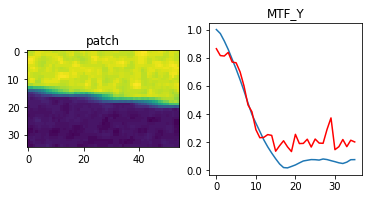

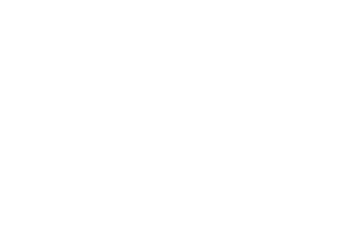

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 0.5746535658836365
Epoch 18/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

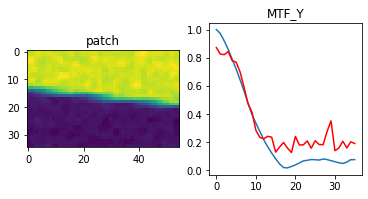

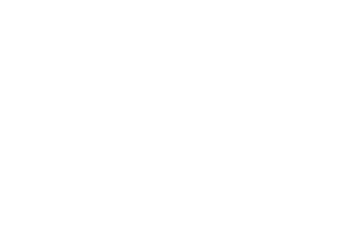

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.58it/s]


epoch_loss = 0.4920194149017334
Epoch 19/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

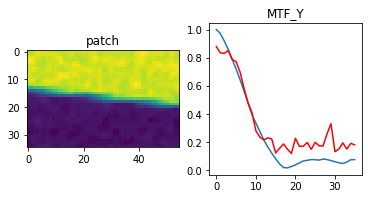

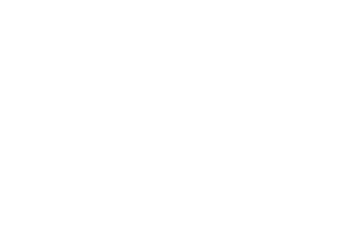

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]


epoch_loss = 0.4218977391719818
Epoch 20/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

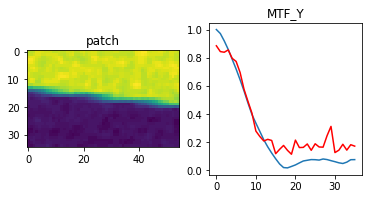

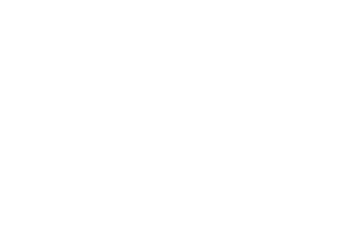

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.45it/s]


epoch_loss = 0.3625013828277588
Epoch 21/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

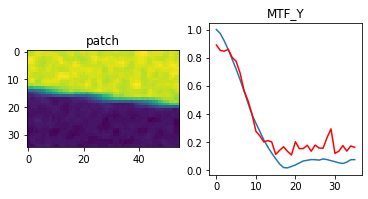

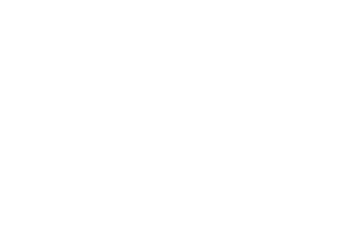

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.56it/s]


epoch_loss = 0.3122479319572449
Epoch 22/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

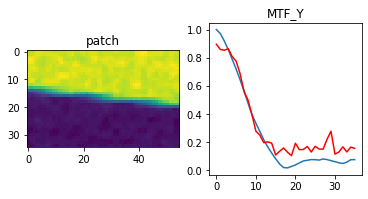

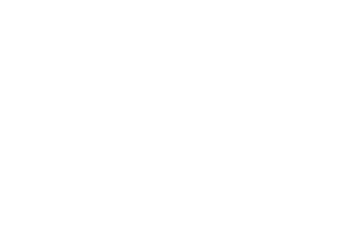

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]


epoch_loss = 0.2697299122810364
Epoch 23/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

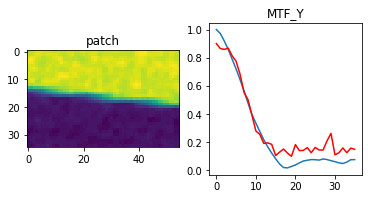

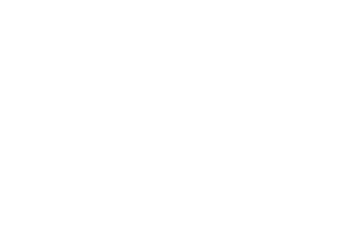

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 0.23371490836143494
Epoch 24/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

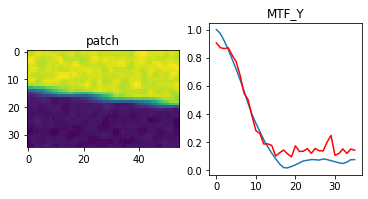

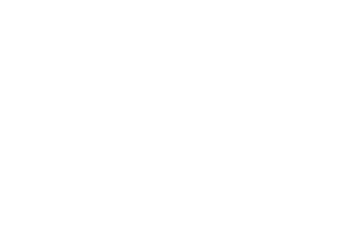

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]


epoch_loss = 0.2031383514404297
Epoch 25/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

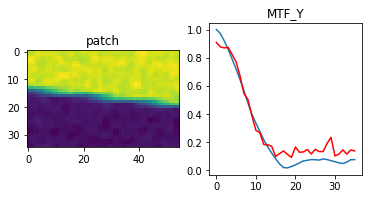

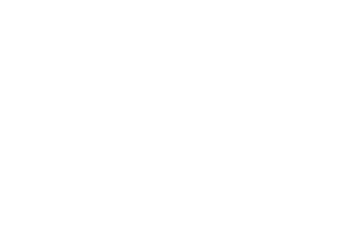

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.60it/s]


epoch_loss = 0.17711378633975983
Epoch 26/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

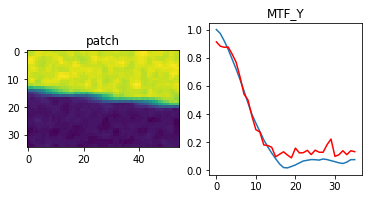

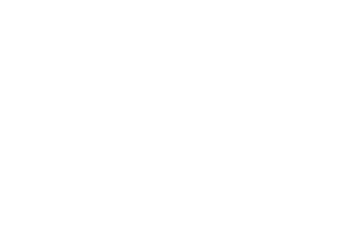

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.1549024134874344
Epoch 27/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

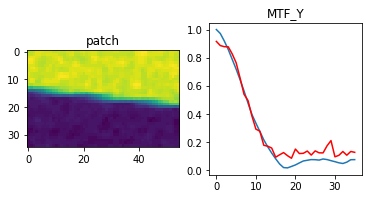

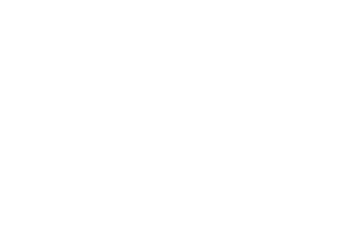

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.53it/s]


epoch_loss = 0.13591314852237701
Epoch 28/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

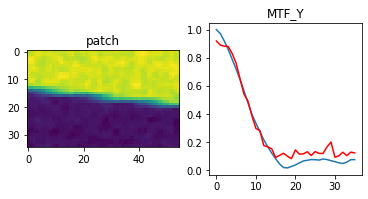

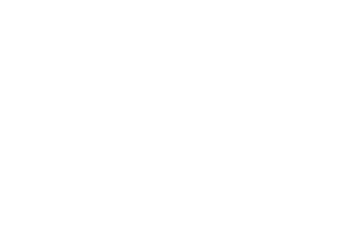

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]


epoch_loss = 0.1196742057800293
Epoch 29/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

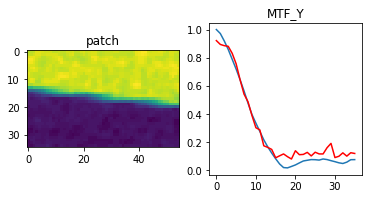

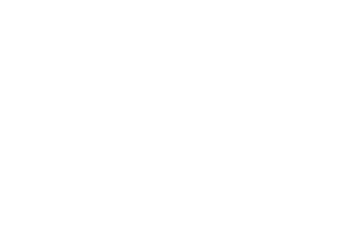

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.48it/s]


epoch_loss = 0.10580013692378998
Epoch 30/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

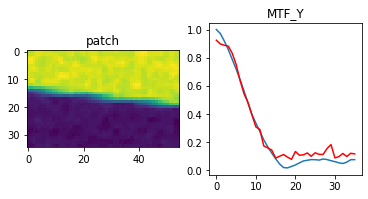

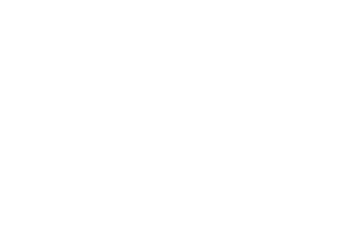

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.42it/s]


epoch_loss = 0.09396878629922867
Epoch 31/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

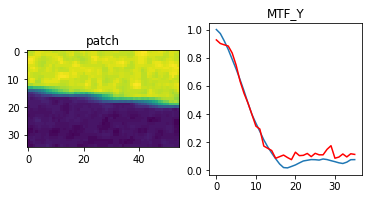

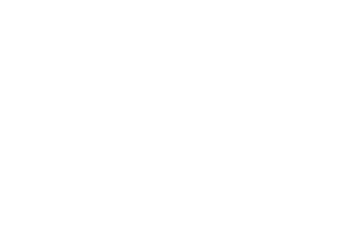

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 0.08389478921890259
Epoch 32/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

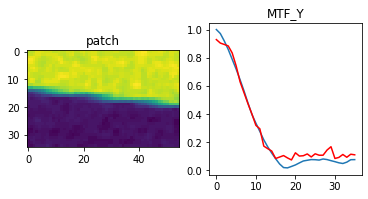

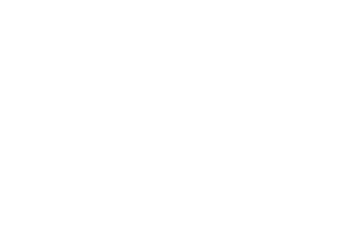

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 0.07531692832708359
Epoch 33/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

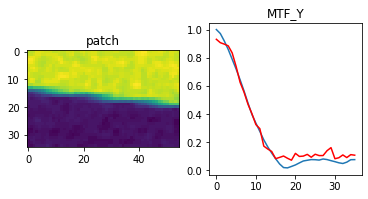

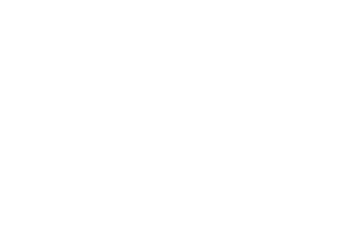

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 0.06799115985631943
Epoch 34/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

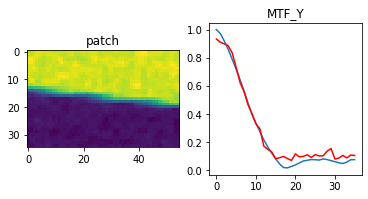

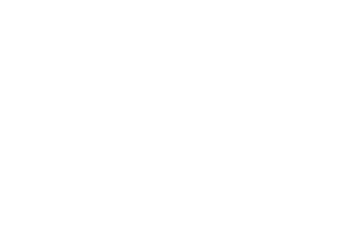

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 0.061695683747529984
Epoch 35/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

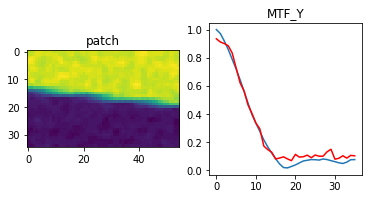

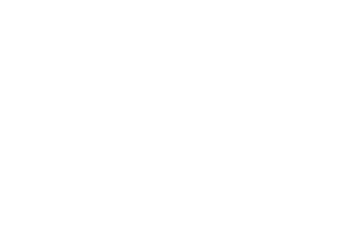

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]


epoch_loss = 0.05623966082930565
Epoch 36/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

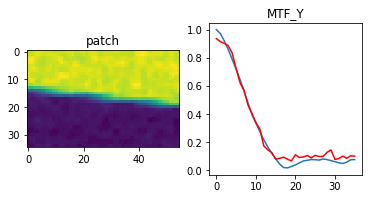

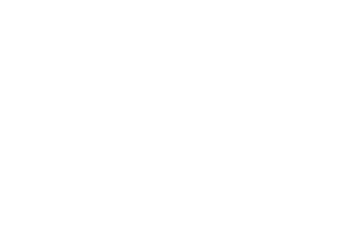

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.80it/s]


epoch_loss = 0.051466964185237885
Epoch 37/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

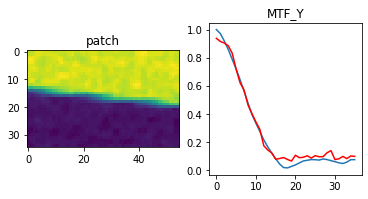

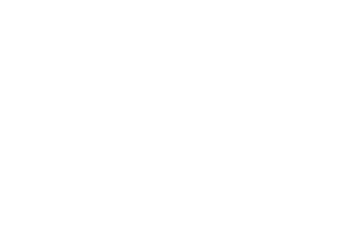

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 0.0472591333091259
Epoch 38/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

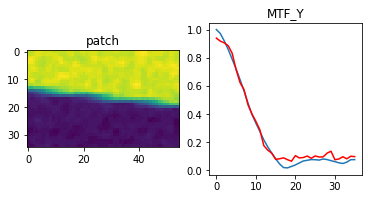

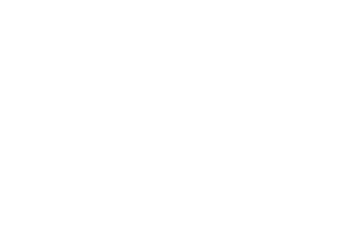

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 0.04352665692567825
Epoch 39/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

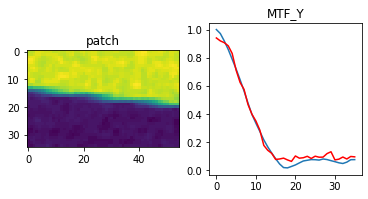

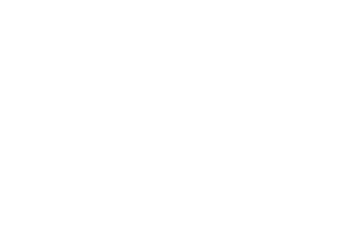

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]


epoch_loss = 0.040200140327215195
Epoch 40/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

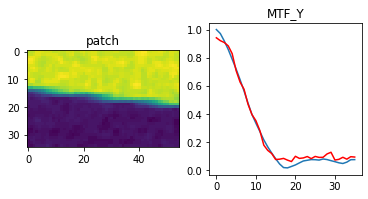

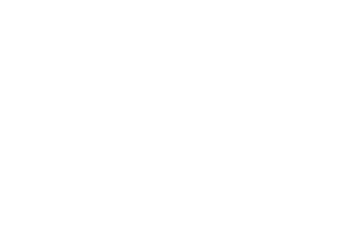

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]


epoch_loss = 0.03722471743822098
Epoch 41/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

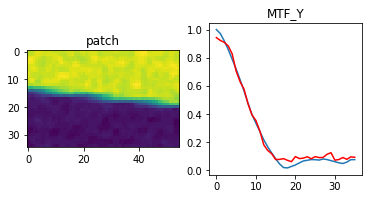

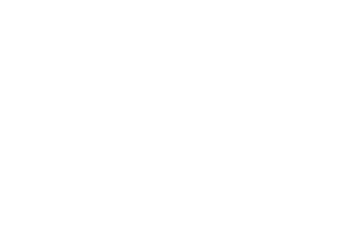

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]


epoch_loss = 0.03455207496881485
Epoch 42/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

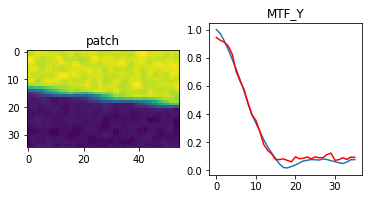

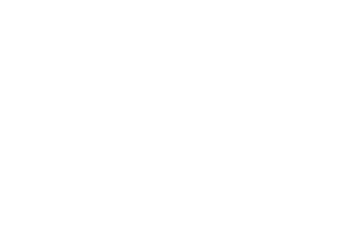

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.56it/s]


epoch_loss = 0.03213914856314659
Epoch 43/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

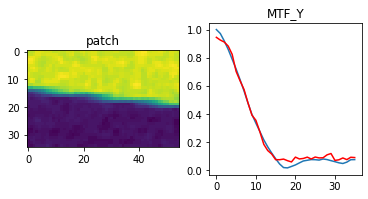

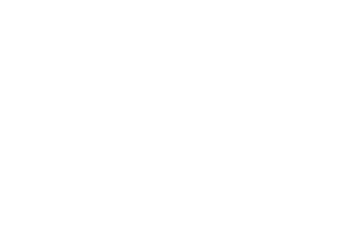

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.87it/s]


epoch_loss = 0.02994854375720024
Epoch 44/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

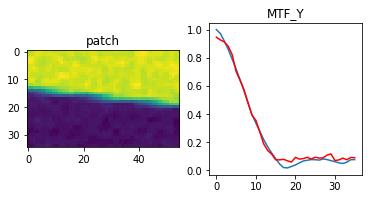

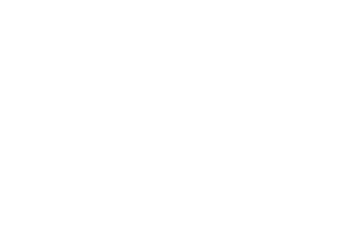

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.30it/s]


epoch_loss = 0.027948565781116486
Epoch 45/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

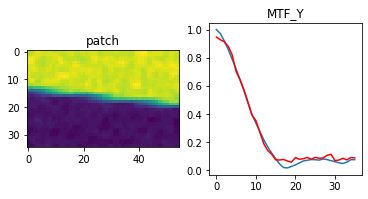

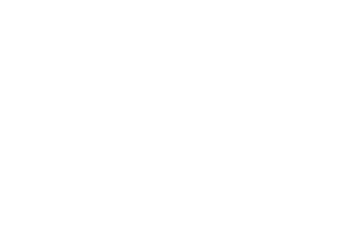

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.38it/s]


epoch_loss = 0.026114992797374725
Epoch 46/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

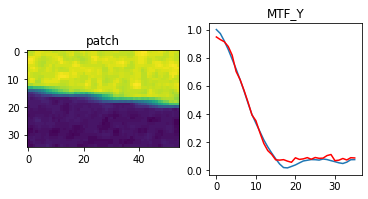

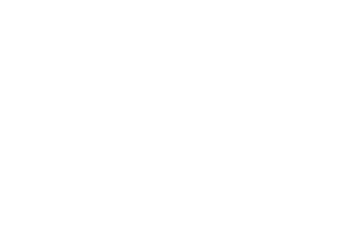

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]


epoch_loss = 0.024430343881249428
Epoch 47/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

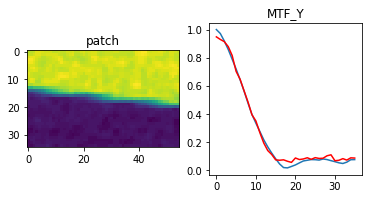

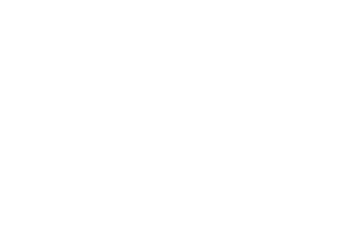

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.54it/s]


epoch_loss = 0.02288183569908142
Epoch 48/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

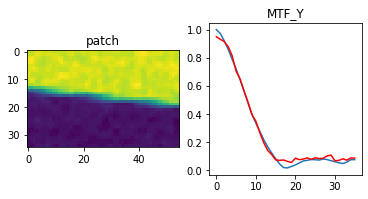

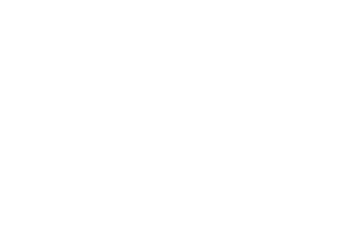

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.73it/s]


epoch_loss = 0.021459514275193214
Epoch 49/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

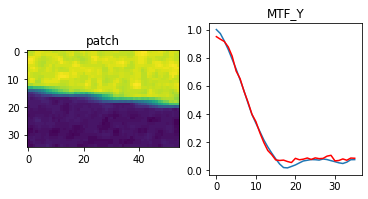

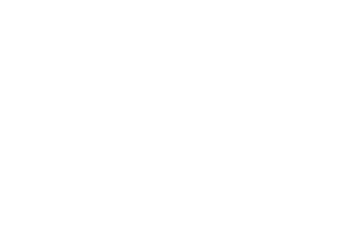

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 0.020154215395450592
Epoch 50/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

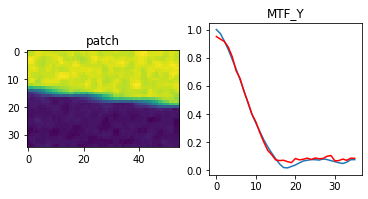

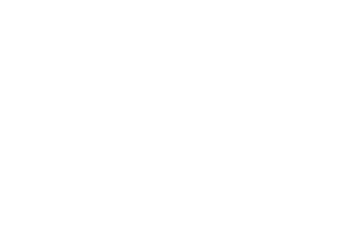

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.09it/s]


epoch_loss = 0.018957454711198807
Epoch 51/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

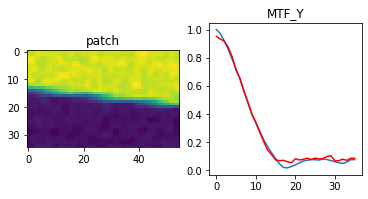

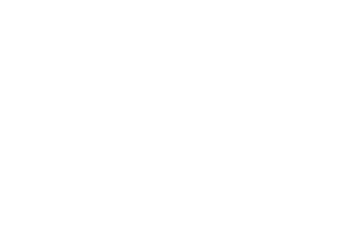

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]


epoch_loss = 0.01786193810403347
Epoch 52/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

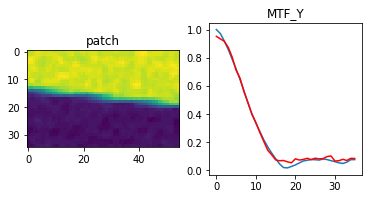

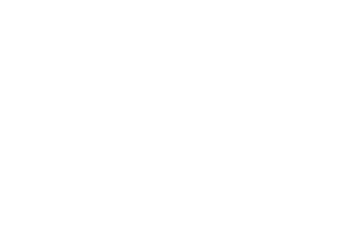

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.56it/s]


epoch_loss = 0.016862113028764725
Epoch 53/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

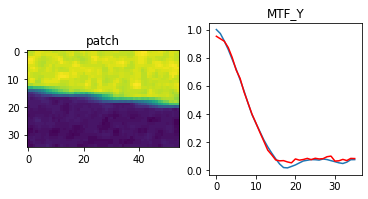

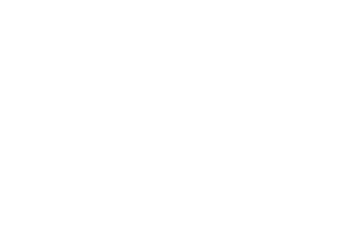

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.91it/s]


epoch_loss = 0.015954049304127693
Epoch 54/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

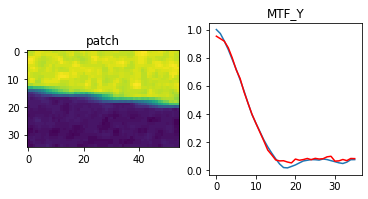

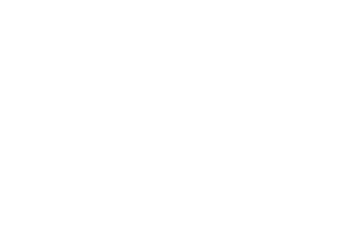

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.33it/s]


epoch_loss = 0.015134827233850956
Epoch 55/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

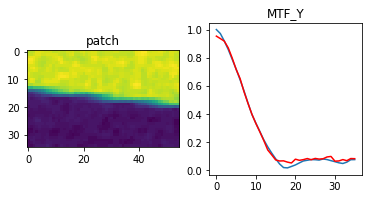

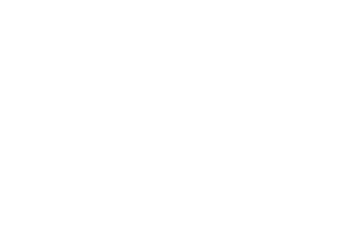

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.36it/s]


epoch_loss = 0.014400994405150414
Epoch 56/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

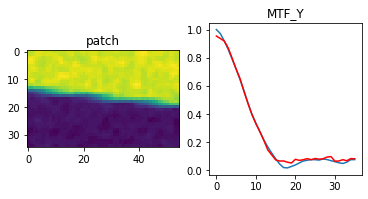

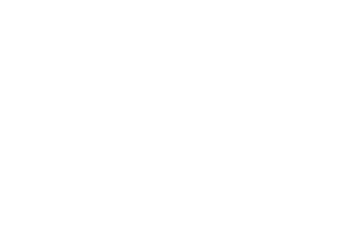

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]


epoch_loss = 0.013747140765190125
Epoch 57/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

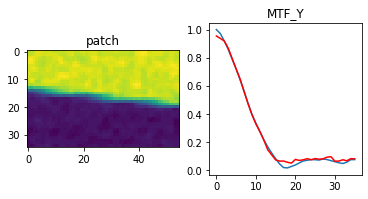

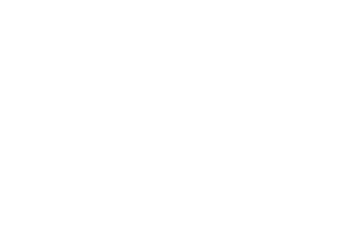

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.80it/s]


epoch_loss = 0.013165473937988281
Epoch 58/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

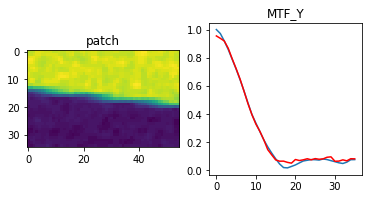

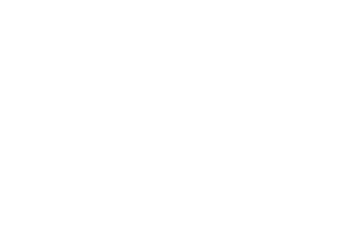

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 0.012646188959479332
Epoch 59/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

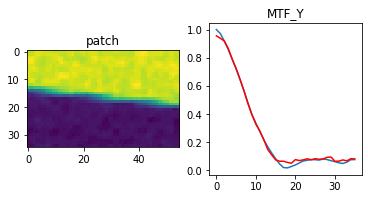

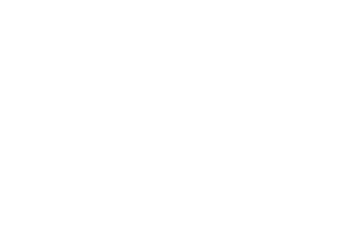

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]


epoch_loss = 0.01217886433005333
Epoch 60/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

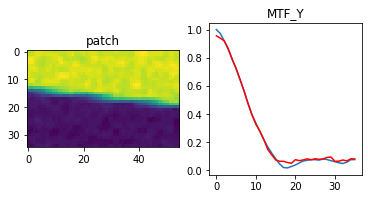

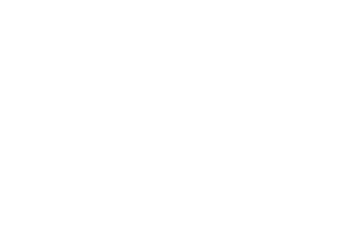

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]


epoch_loss = 0.011753697879612446
Epoch 61/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

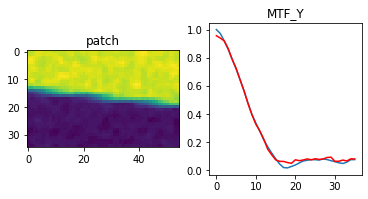

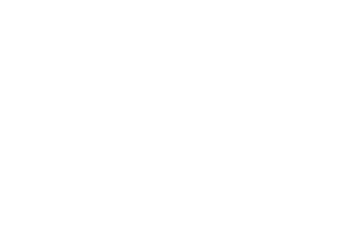

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]


epoch_loss = 0.011362571269273758
Epoch 62/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

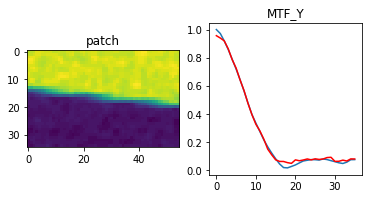

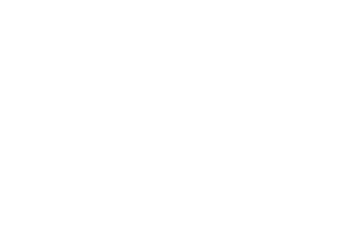

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 0.010998902842402458
Epoch 63/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

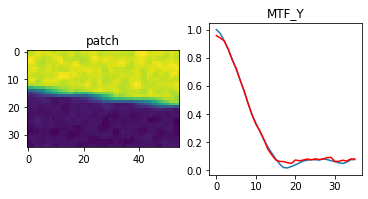

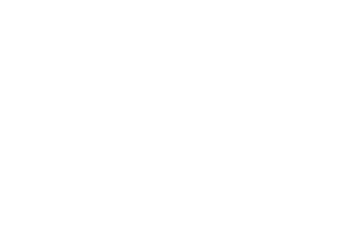

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 0.010657433420419693
Epoch 64/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

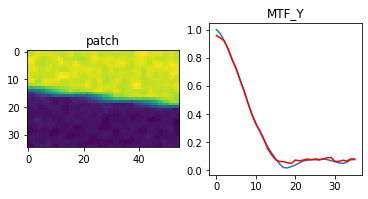

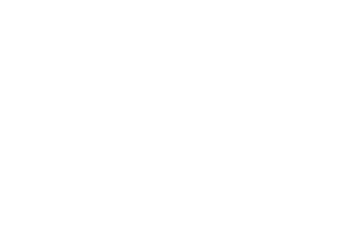

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.11it/s]


epoch_loss = 0.010333588346838951
Epoch 65/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

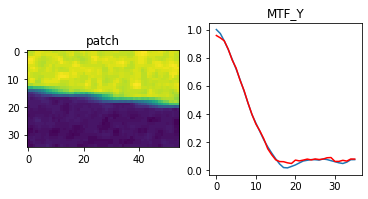

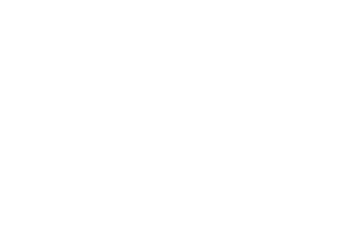

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 0.010023508220911026
Epoch 66/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

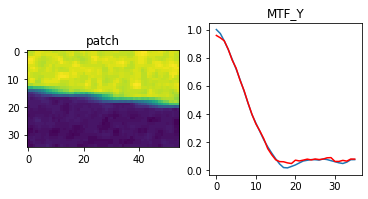

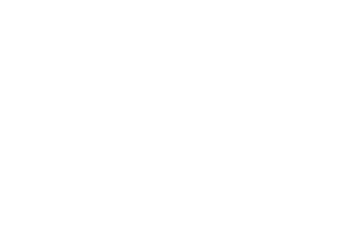

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 0.009724253788590431
Epoch 67/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

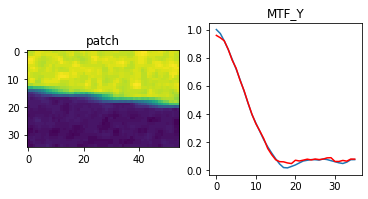

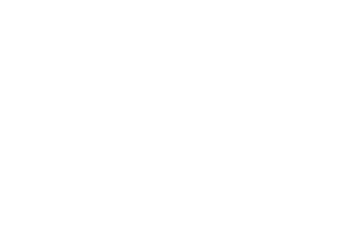

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]


epoch_loss = 0.00943420547991991
Epoch 68/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

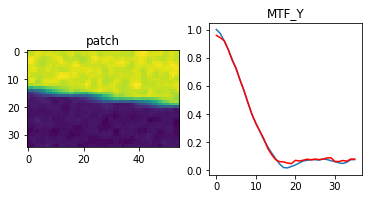

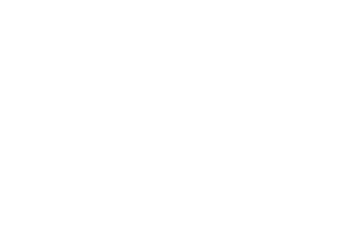

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.09it/s]


epoch_loss = 0.009153425693511963
Epoch 69/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

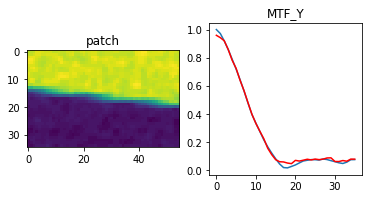

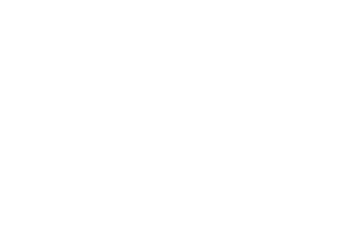

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]


epoch_loss = 0.008883258327841759
Epoch 70/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

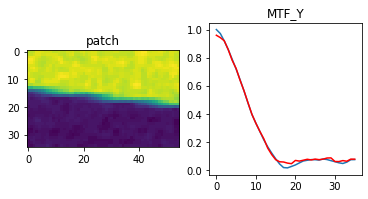

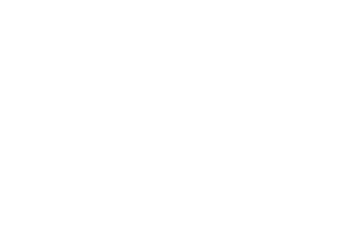

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.24it/s]


epoch_loss = 0.008625640533864498
Epoch 71/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

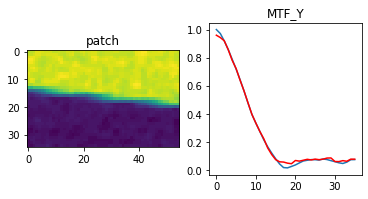

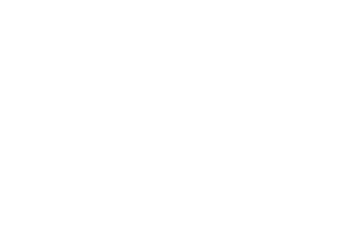

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]


epoch_loss = 0.008382190018892288
Epoch 72/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

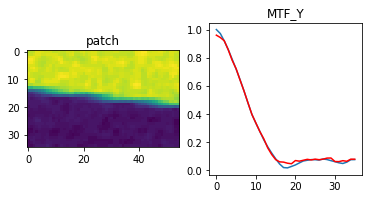

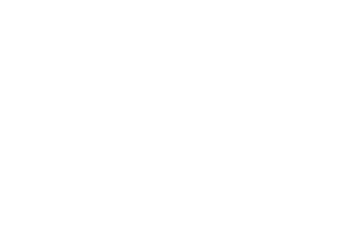

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.95it/s]


epoch_loss = 0.008153501898050308
Epoch 73/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

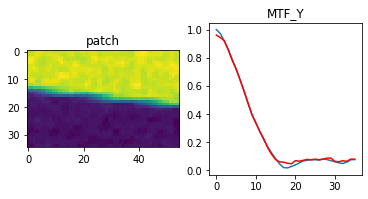

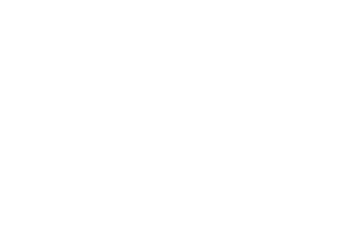

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]


epoch_loss = 0.007938862778246403
Epoch 74/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

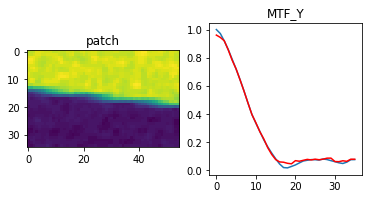

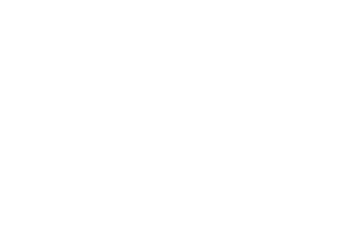

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.14it/s]


epoch_loss = 0.007736519910395145
Epoch 75/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

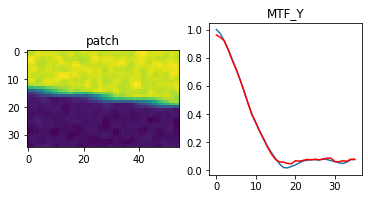

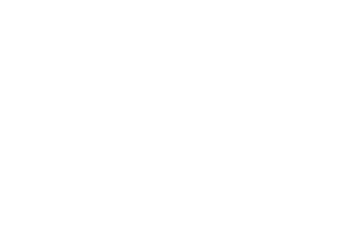

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]


epoch_loss = 0.007544329389929771
Epoch 76/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

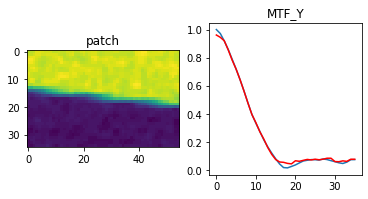

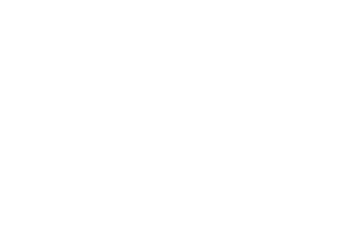

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 0.007360333576798439
Epoch 77/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

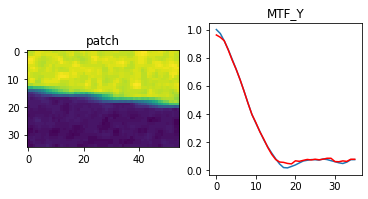

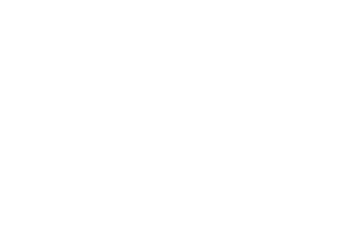

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.31it/s]


epoch_loss = 0.007182997651398182
Epoch 78/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

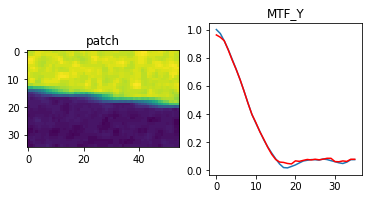

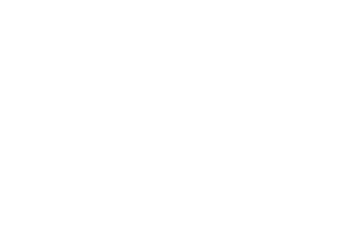

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.70it/s]


epoch_loss = 0.007011369802057743
Epoch 79/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

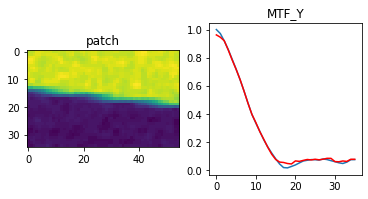

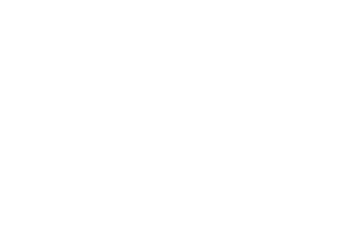

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]


epoch_loss = 0.006845102645456791
Epoch 80/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

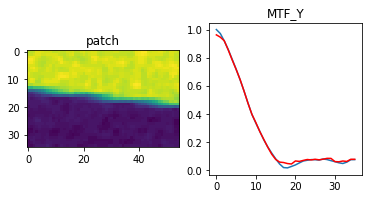

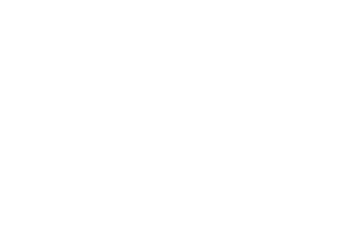

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]


epoch_loss = 0.006684157997369766
Epoch 81/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

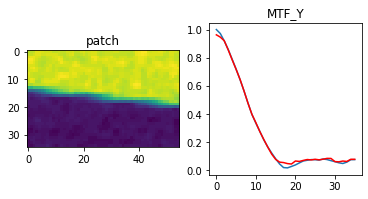

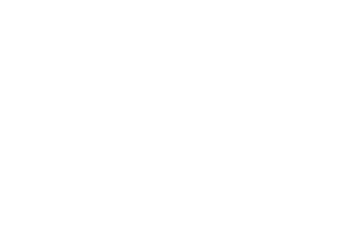

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 0.006528701167553663
Epoch 82/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

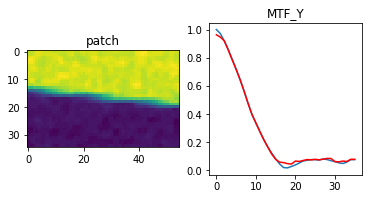

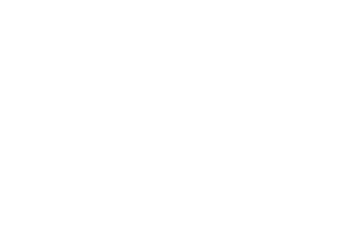

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]


epoch_loss = 0.006379046477377415
Epoch 83/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

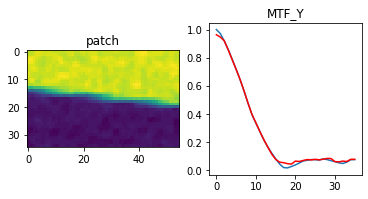

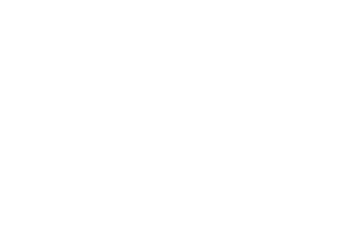

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]


epoch_loss = 0.006235525477677584
Epoch 84/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

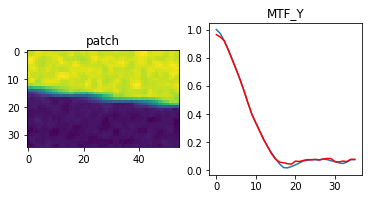

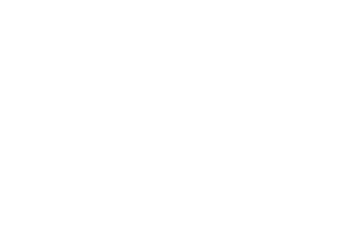

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 0.00609830766916275
Epoch 85/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

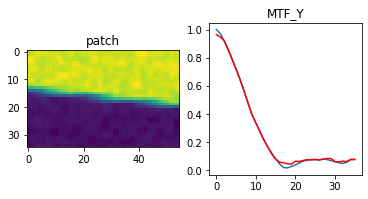

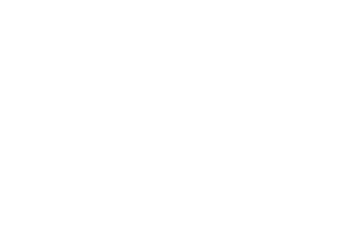

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]


epoch_loss = 0.005967336241155863
Epoch 86/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

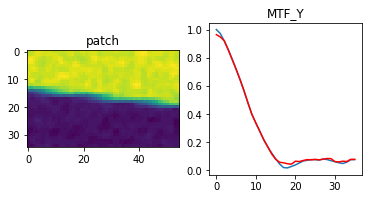

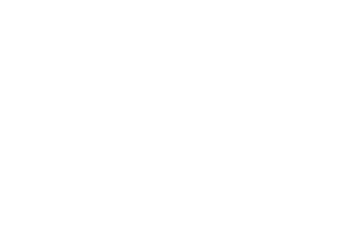

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 0.005842321086674929
Epoch 87/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

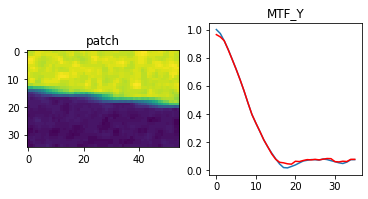

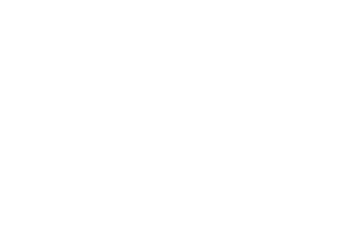

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]


epoch_loss = 0.005722751375287771
Epoch 88/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

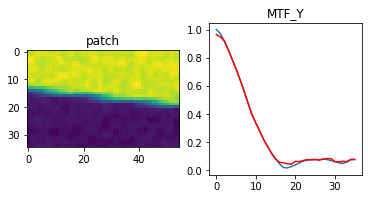

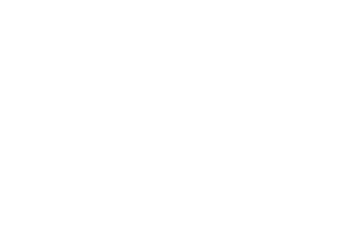

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]


epoch_loss = 0.005608038045465946
Epoch 89/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

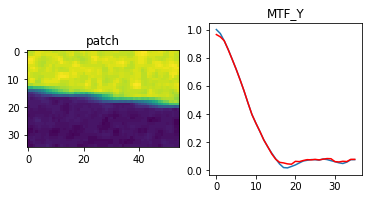

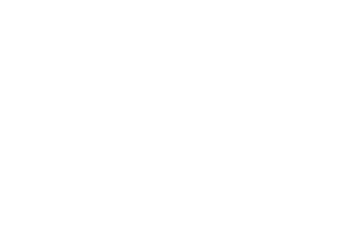

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.34it/s]


epoch_loss = 0.005497692618519068
Epoch 90/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

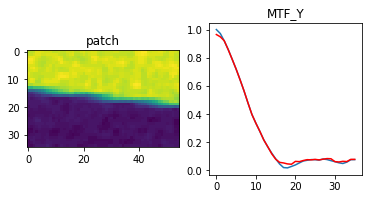

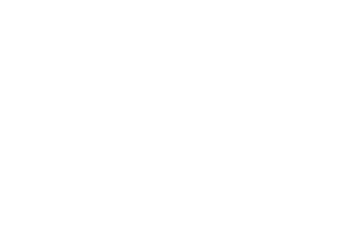

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.63it/s]


epoch_loss = 0.005391336977481842
Epoch 91/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

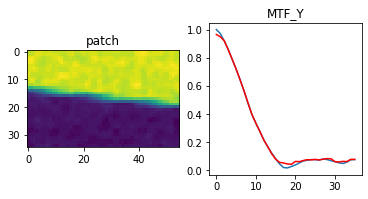

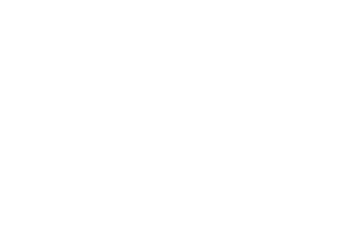

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]


epoch_loss = 0.005288758780807257
Epoch 92/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

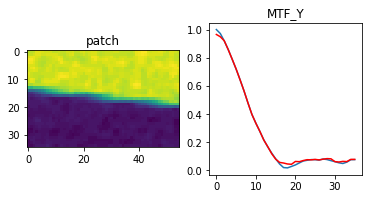

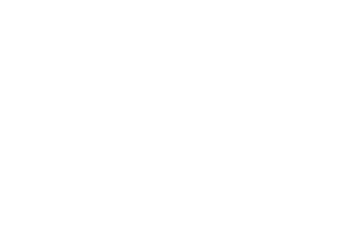

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.42it/s]


epoch_loss = 0.005189703777432442
Epoch 93/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

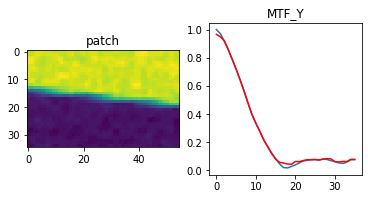

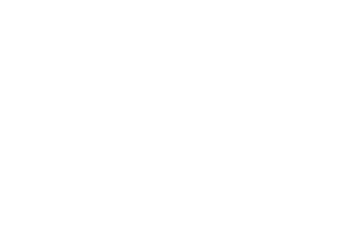

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 0.005093845538794994
Epoch 94/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

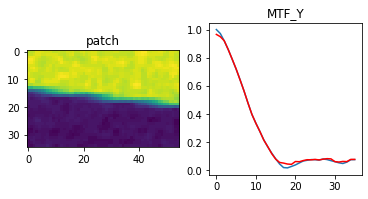

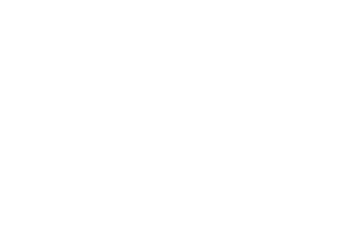

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 0.005000771023333073
Epoch 95/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

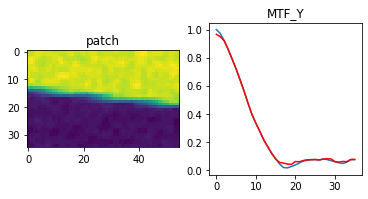

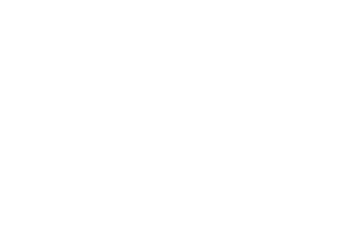

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]


epoch_loss = 0.0049100639298558235
Epoch 96/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

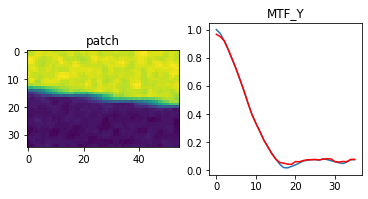

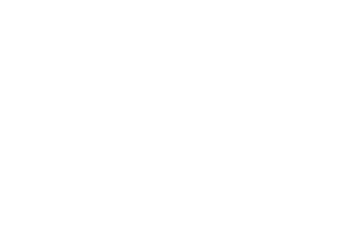

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.0048213619738817215
Epoch 97/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

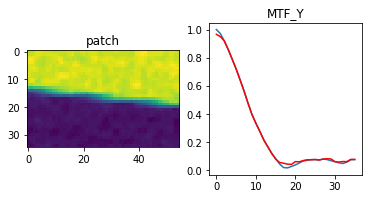

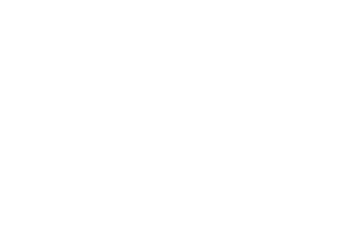

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]


epoch_loss = 0.00473446398973465
Epoch 98/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

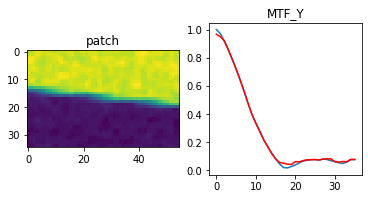

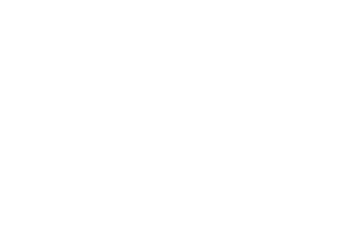

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.13it/s]


epoch_loss = 0.00464931596070528
Epoch 99/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

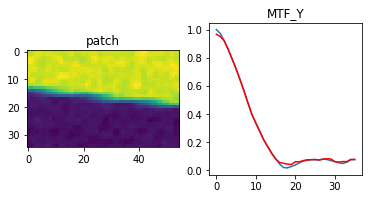

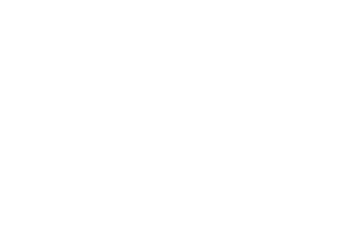

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.49it/s]


epoch_loss = 0.004566024988889694
Epoch 100/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

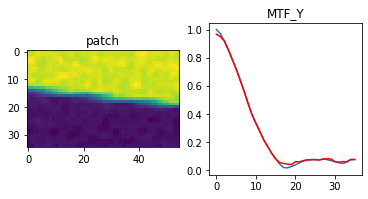

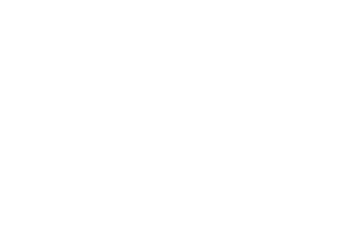

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 0.004484701901674271
Epoch 101/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

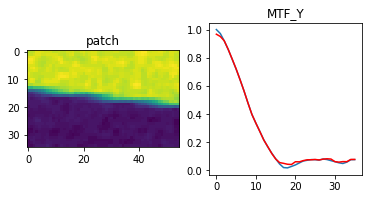

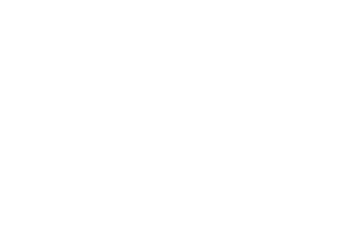

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]


epoch_loss = 0.00440541747957468
Epoch 102/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

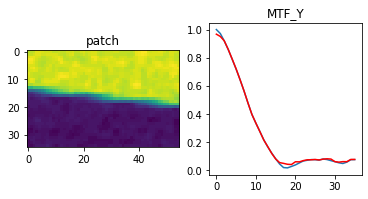

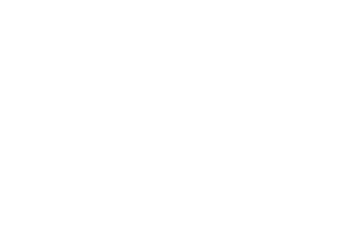

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 0.004328202456235886
Epoch 103/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

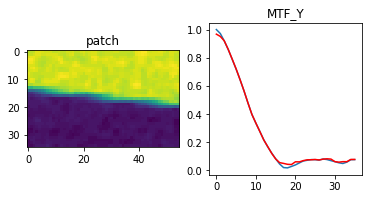

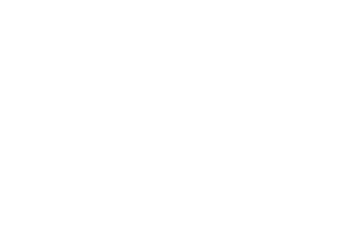

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.13it/s]


epoch_loss = 0.00425304938107729
Epoch 104/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

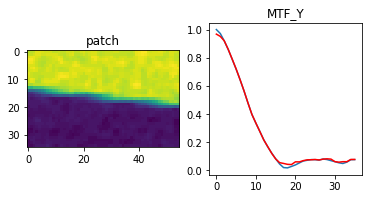

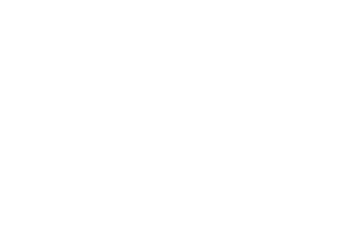

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]


epoch_loss = 0.004179853945970535
Epoch 105/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

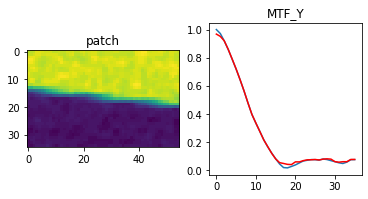

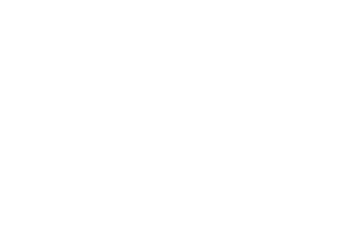

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 0.004108520224690437
Epoch 106/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

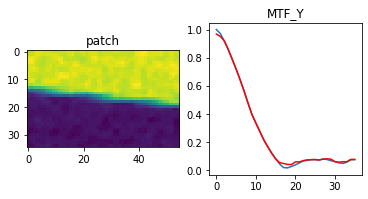

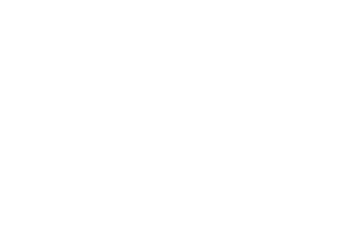

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]


epoch_loss = 0.004038956016302109
Epoch 107/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

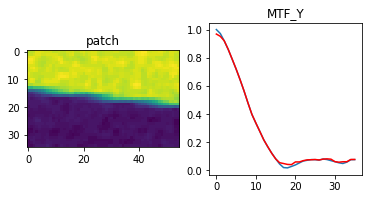

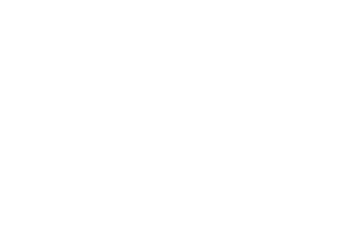

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]


epoch_loss = 0.003971058875322342
Epoch 108/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

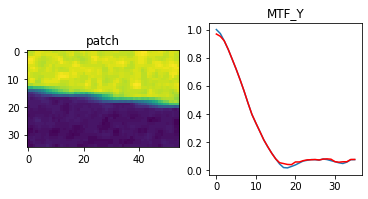

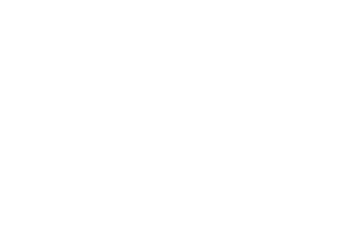

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]


epoch_loss = 0.0039047393947839737
Epoch 109/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

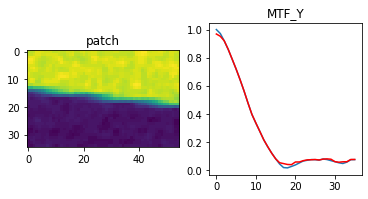

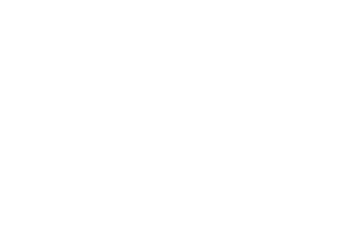

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 0.0038399696350097656
Epoch 110/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

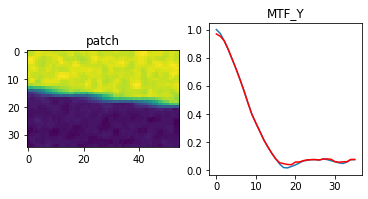

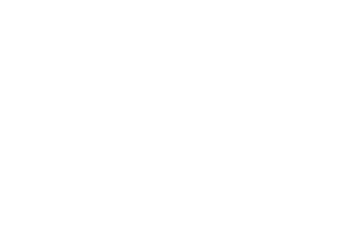

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 0.003776713740080595
Epoch 111/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

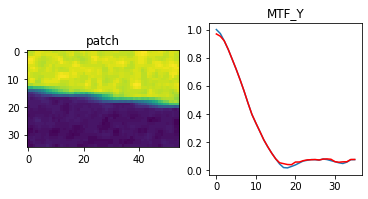

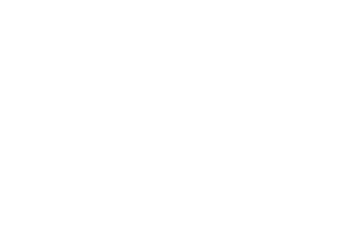

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]


epoch_loss = 0.0037149456329643726
Epoch 112/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

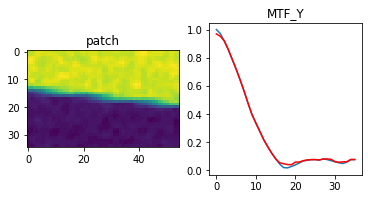

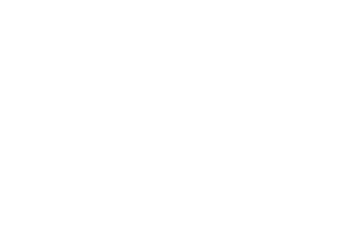

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]


epoch_loss = 0.0036546699702739716
Epoch 113/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

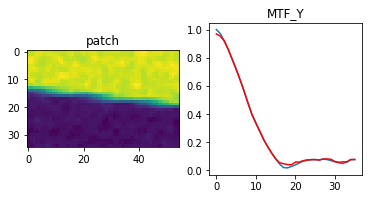

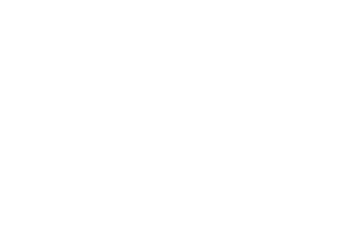

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]


epoch_loss = 0.003595826681703329
Epoch 114/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

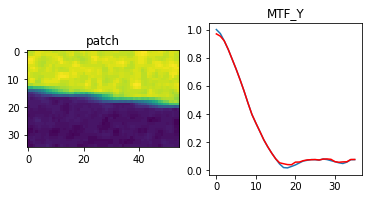

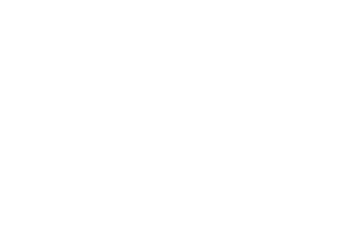

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.59it/s]


epoch_loss = 0.0035383522044867277
Epoch 115/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

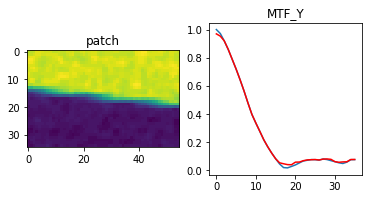

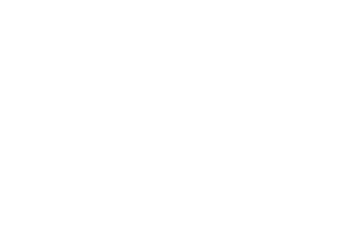

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]


epoch_loss = 0.0034821785520762205
Epoch 116/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

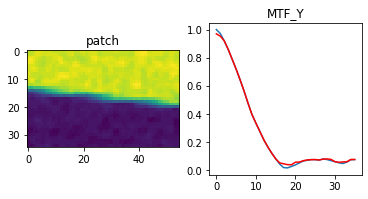

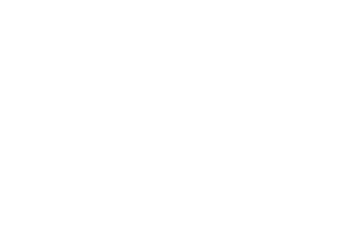

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.58it/s]


epoch_loss = 0.0034272419288754463
Epoch 117/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

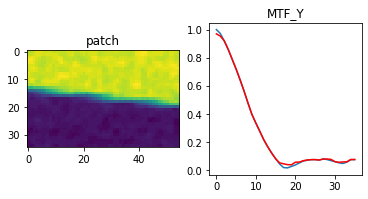

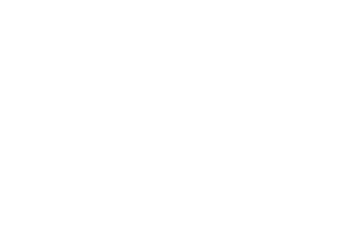

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.23it/s]


epoch_loss = 0.0033735022880136967
Epoch 118/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

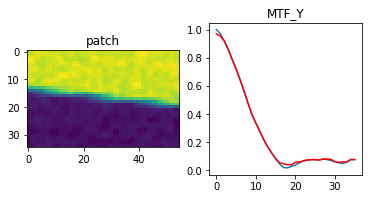

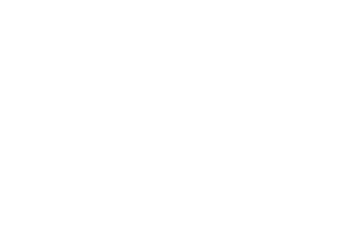

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.31it/s]


epoch_loss = 0.0033209321554750204
Epoch 119/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

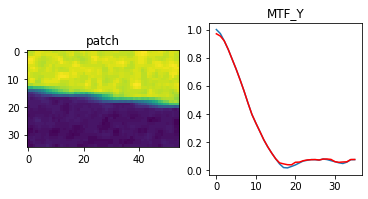

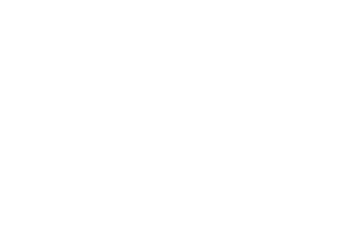

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.95it/s]


epoch_loss = 0.0032695007976144552
Epoch 120/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

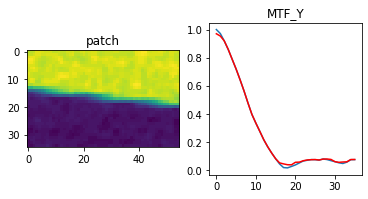

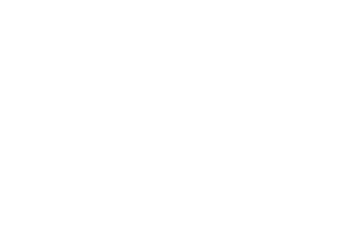

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.04it/s]


epoch_loss = 0.0032191933132708073
Epoch 121/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

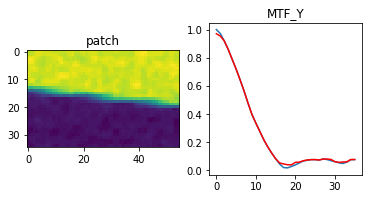

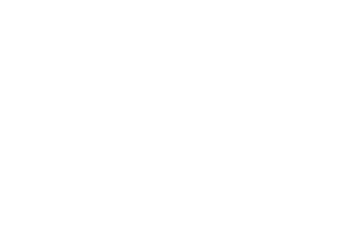

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.92it/s]


epoch_loss = 0.003169956151396036
Epoch 122/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

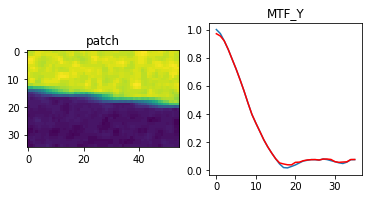

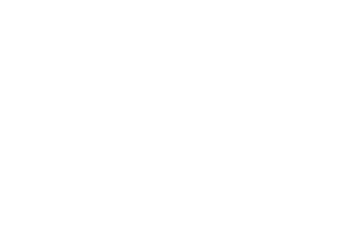

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]


epoch_loss = 0.003121750894933939
Epoch 123/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

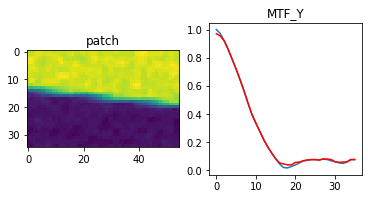

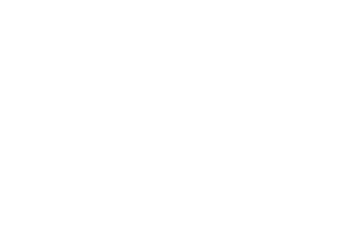

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.31it/s]


epoch_loss = 0.0030745293479412794
Epoch 124/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

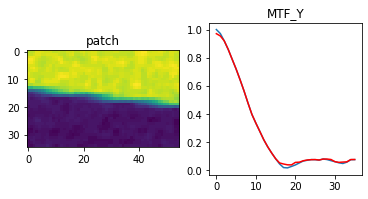

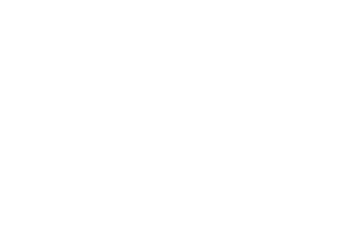

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 0.003028267063200474
Epoch 125/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

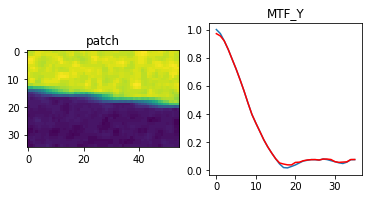

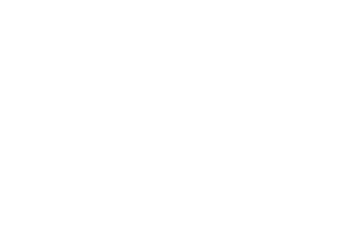

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]


epoch_loss = 0.002982919104397297
Epoch 126/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

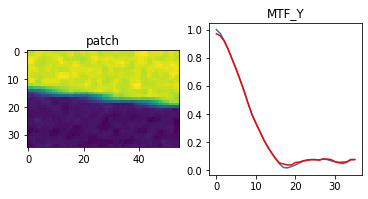

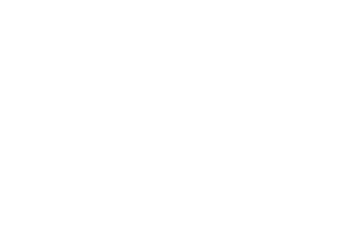

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 0.002938468474894762
Epoch 127/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

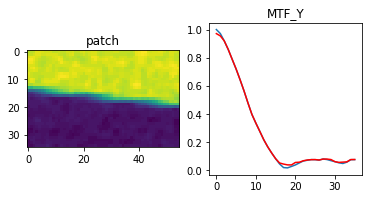

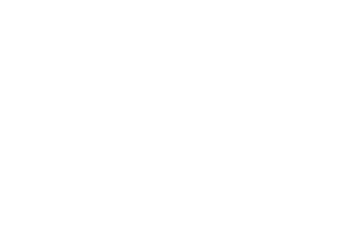

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.35it/s]


epoch_loss = 0.0028948895633220673
Epoch 128/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

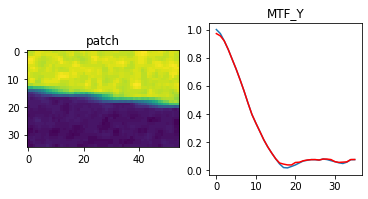

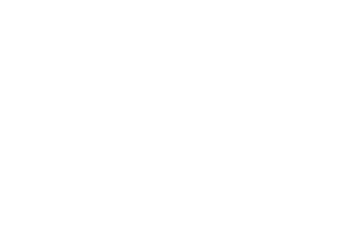

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.06it/s]


epoch_loss = 0.0028521642088890076
Epoch 129/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

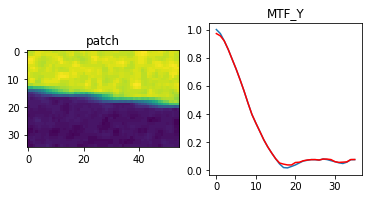

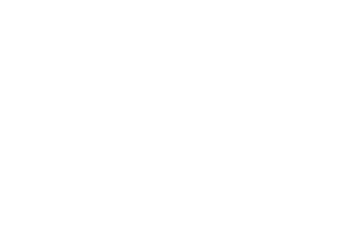

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]


epoch_loss = 0.0028102812357246876
Epoch 130/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

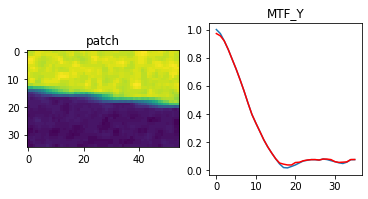

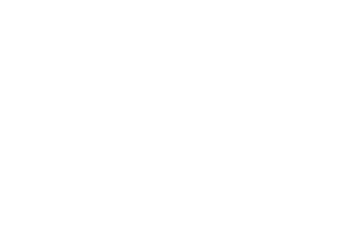

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 0.0027692250441759825
Epoch 131/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

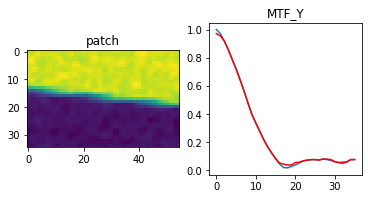

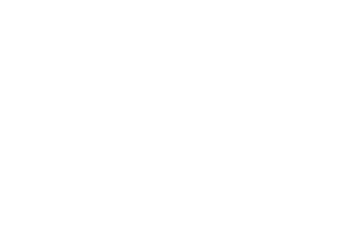

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]


epoch_loss = 0.0027289639692753553
Epoch 132/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

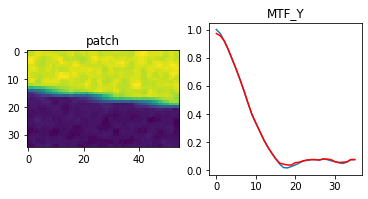

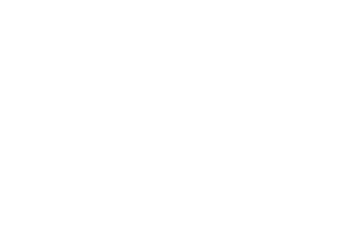

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]


epoch_loss = 0.0026894966140389442
Epoch 133/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

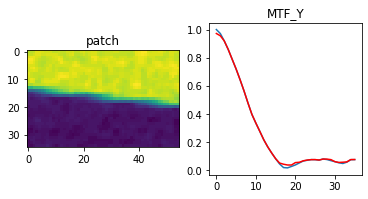

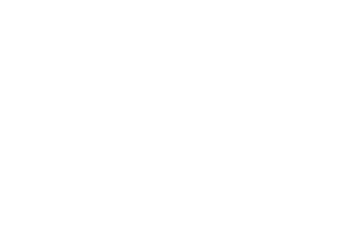

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 0.0026507838629186153
Epoch 134/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

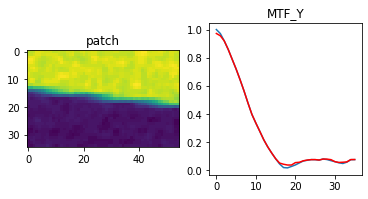

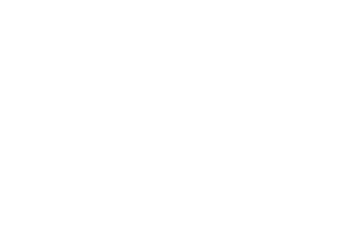

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.73it/s]


epoch_loss = 0.0026128061581403017
Epoch 135/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

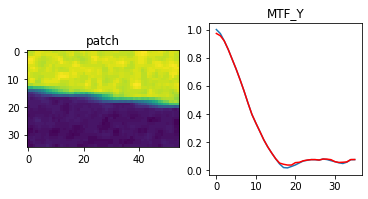

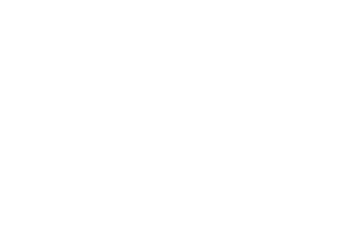

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.0025755618698894978
Epoch 136/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

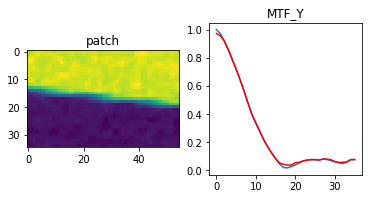

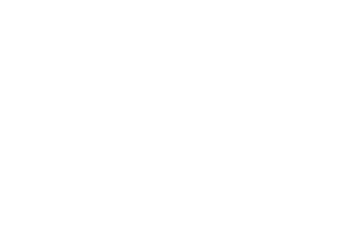

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.33it/s]


epoch_loss = 0.0025390193331986666
Epoch 137/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

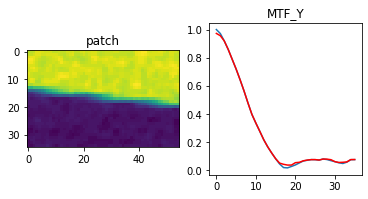

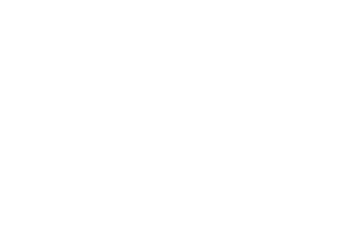

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]


epoch_loss = 0.0025031650438904762
Epoch 138/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

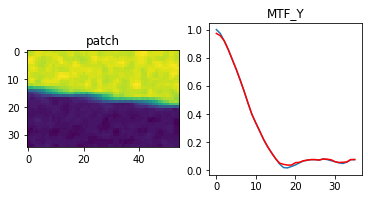

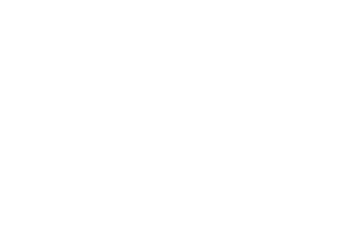

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]


epoch_loss = 0.0024679945781826973
Epoch 139/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

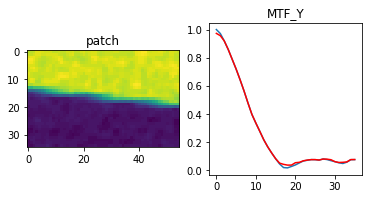

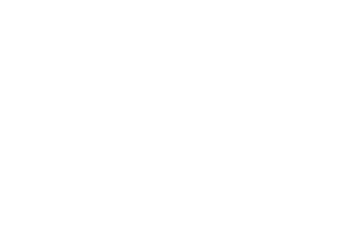

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.13it/s]


epoch_loss = 0.0024334685876965523
Epoch 140/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

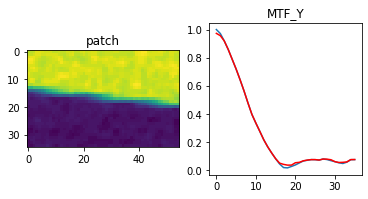

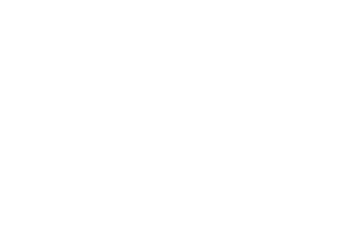

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]


epoch_loss = 0.002399594523012638
Epoch 141/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

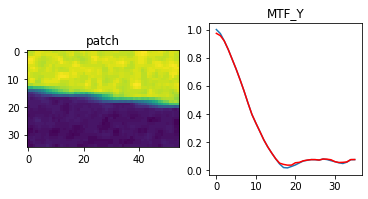

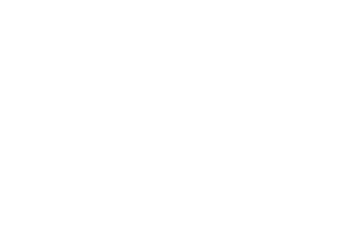

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.49it/s]


epoch_loss = 0.002366346772760153
Epoch 142/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

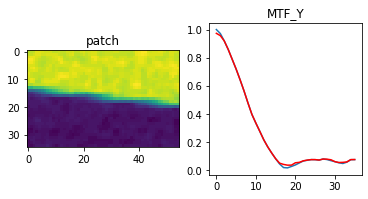

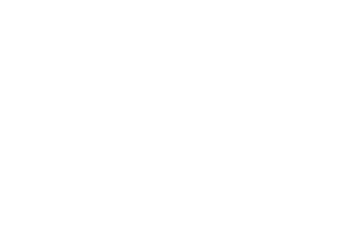

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]


epoch_loss = 0.0023337025195360184
Epoch 143/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

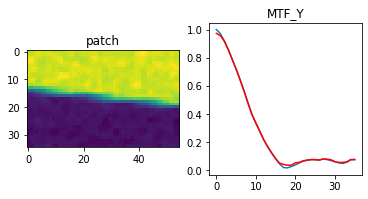

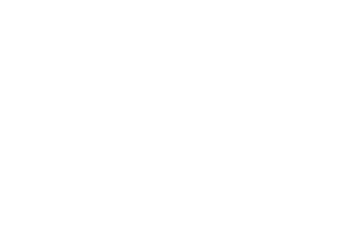

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 0.0023016571067273617
Epoch 144/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

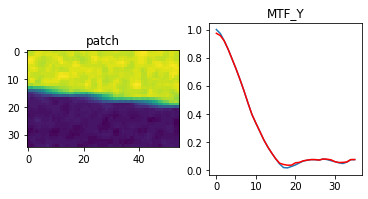

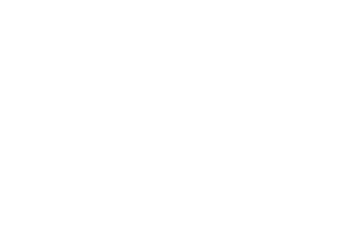

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.51it/s]


epoch_loss = 0.0022702000569552183
Epoch 145/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

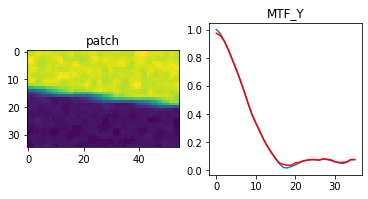

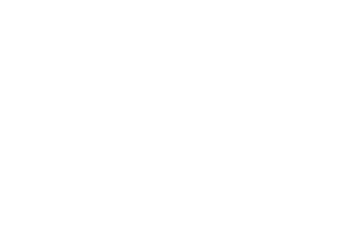

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.51it/s]


epoch_loss = 0.002239307388663292
Epoch 146/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

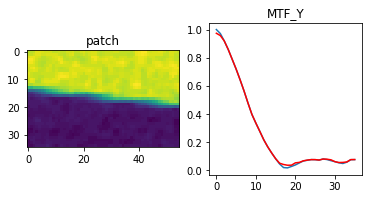

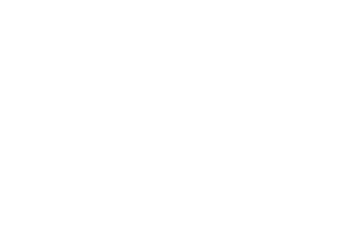

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.89it/s]


epoch_loss = 0.0022089811973273754
Epoch 147/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

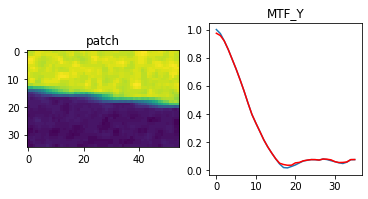

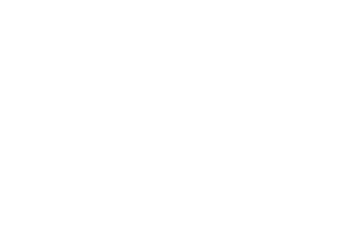

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.19it/s]


epoch_loss = 0.0021791881881654263
Epoch 148/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

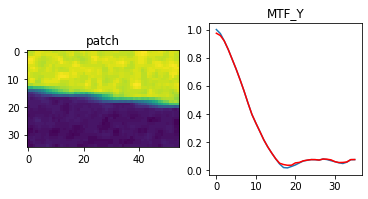

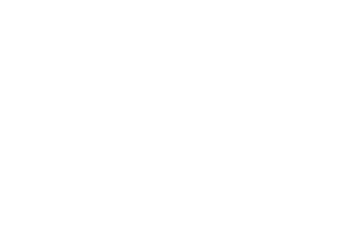

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]


epoch_loss = 0.002149938838556409
Epoch 149/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

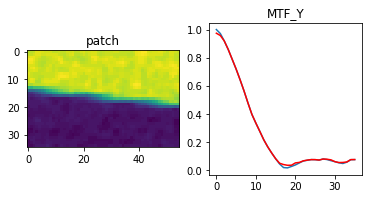

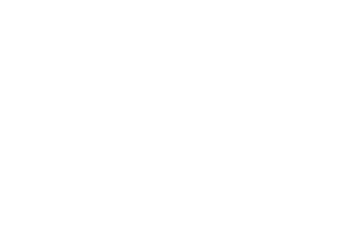

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]


epoch_loss = 0.0021212093997746706
Epoch 150/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

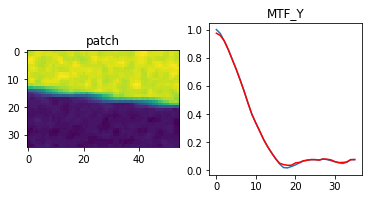

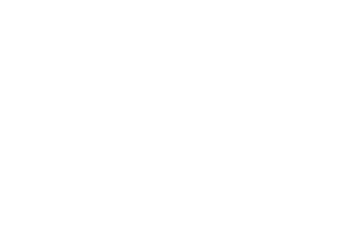

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]


epoch_loss = 0.002092994749546051
Epoch 151/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

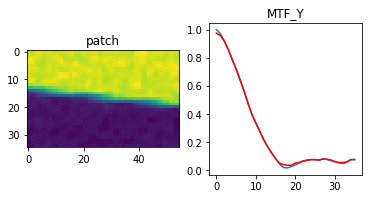

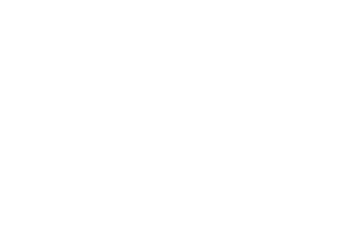

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.11it/s]


epoch_loss = 0.0020652846433222294
Epoch 152/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

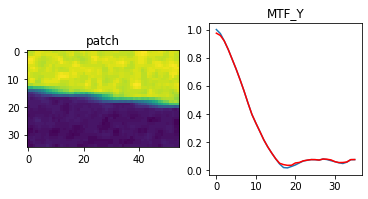

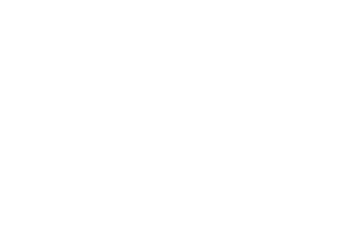

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]


epoch_loss = 0.0020380562637001276
Epoch 153/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

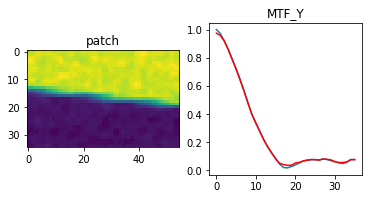

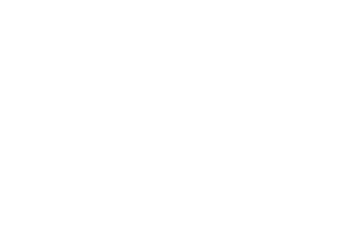

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.68it/s]


epoch_loss = 0.002011315431445837
Epoch 154/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

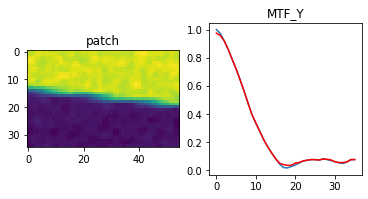

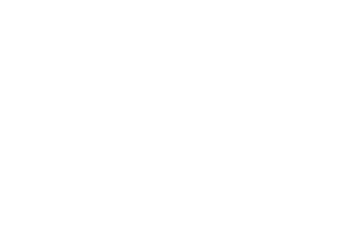

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 0.0019850425887852907
Epoch 155/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

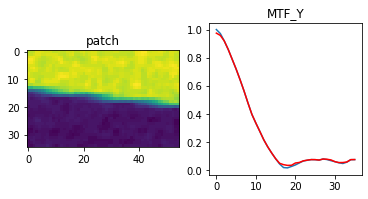

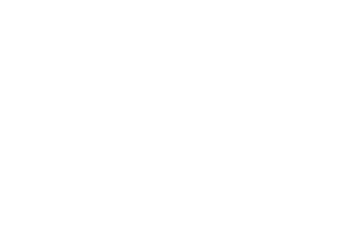

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.25it/s]


epoch_loss = 0.0019592272583395243
Epoch 156/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

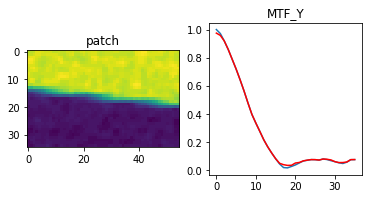

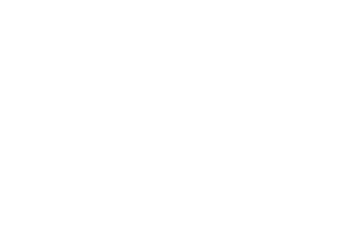

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.0019338623387739062
Epoch 157/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

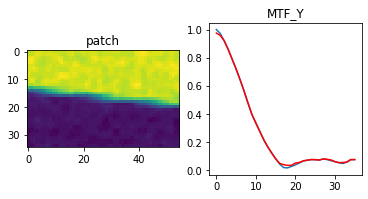

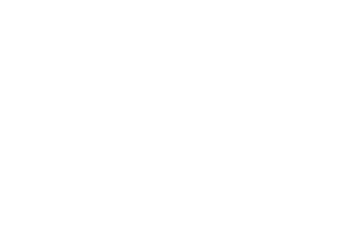

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 0.0019089423585683107
Epoch 158/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

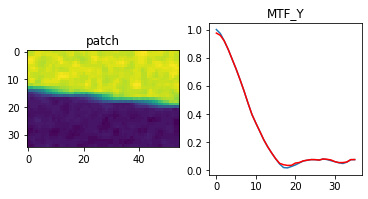

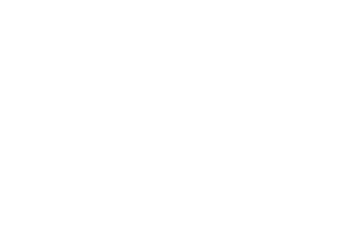

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 0.0018844525329768658
Epoch 159/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

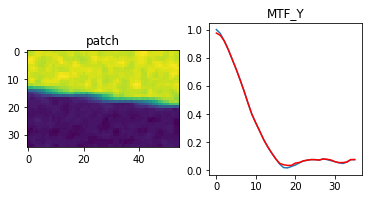

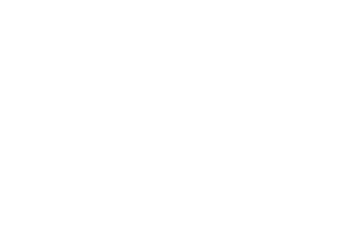

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 0.001860382268205285
Epoch 160/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

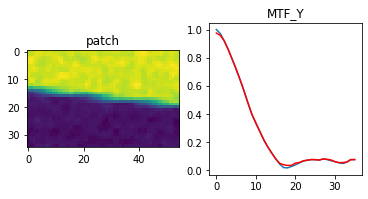

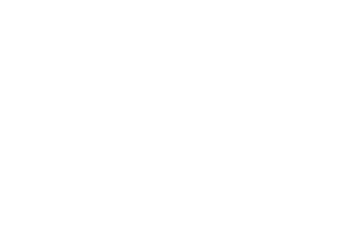

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 0.001836724579334259
Epoch 161/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

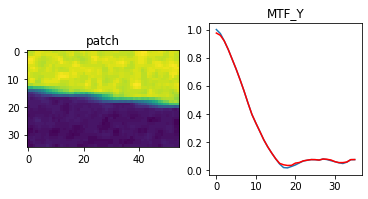

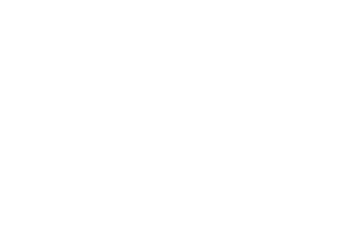

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]


epoch_loss = 0.0018134766723960638
Epoch 162/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

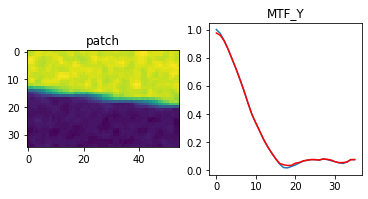

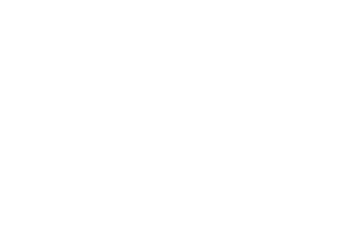

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.26it/s]


epoch_loss = 0.0017906153807416558
Epoch 163/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

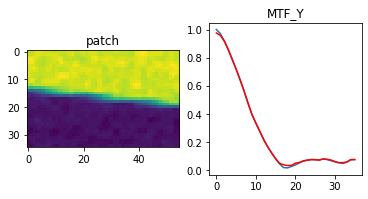

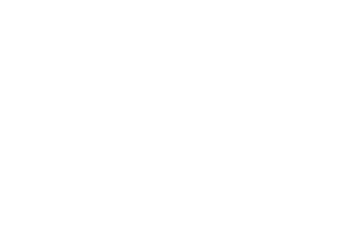

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.78it/s]


epoch_loss = 0.0017681540921330452
Epoch 164/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

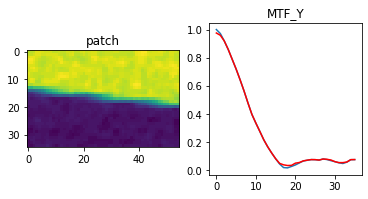

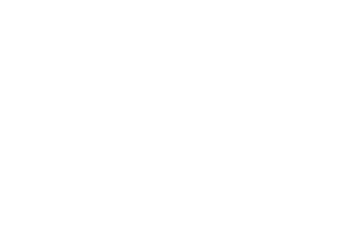

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.67it/s]


epoch_loss = 0.001746071968227625
Epoch 165/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

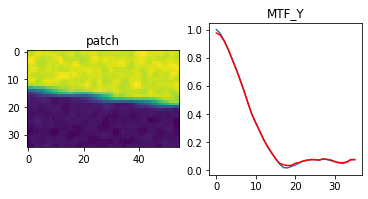

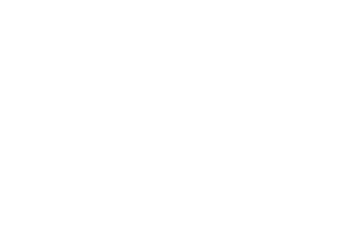

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.14it/s]


epoch_loss = 0.0017243570182472467
Epoch 166/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

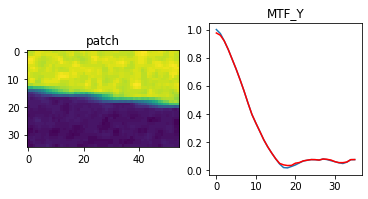

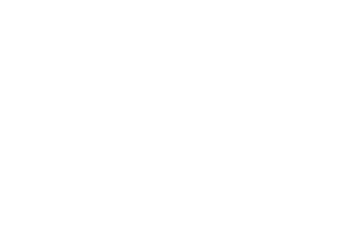

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]


epoch_loss = 0.001703009009361267
Epoch 167/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

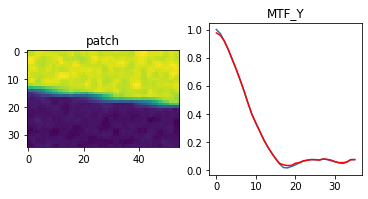

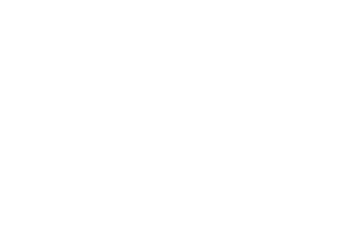

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.56it/s]


epoch_loss = 0.0016820176970213652
Epoch 168/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

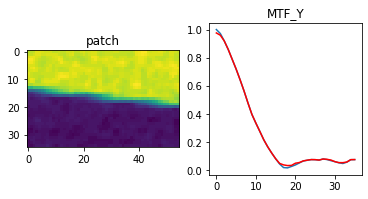

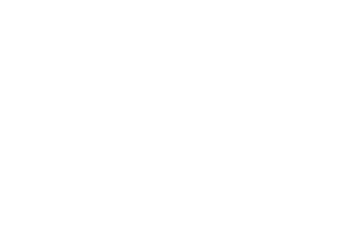

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.33it/s]


epoch_loss = 0.001661375630646944
Epoch 169/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

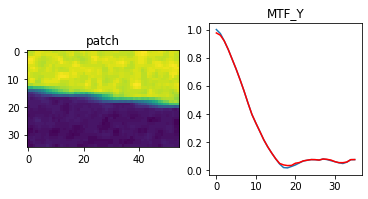

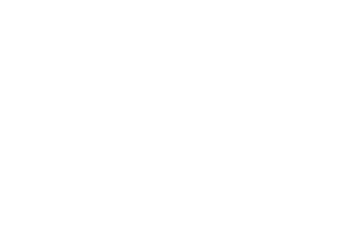

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.70it/s]


epoch_loss = 0.0016410762909799814
Epoch 170/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

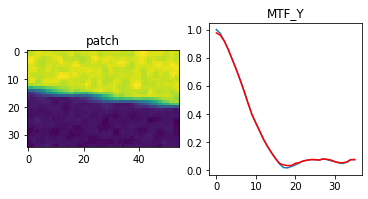

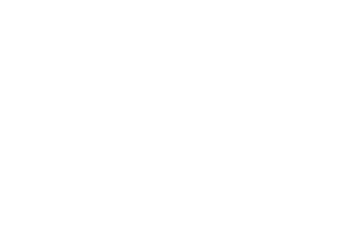

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.19it/s]


epoch_loss = 0.0016211154870688915
Epoch 171/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

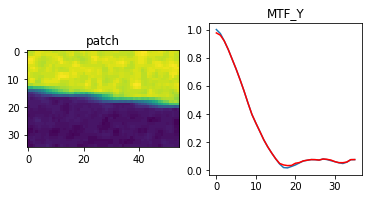

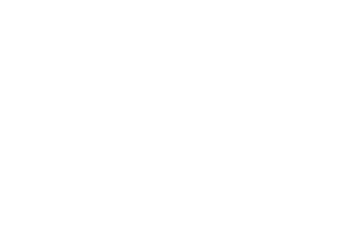

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 0.001601483440026641
Epoch 172/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

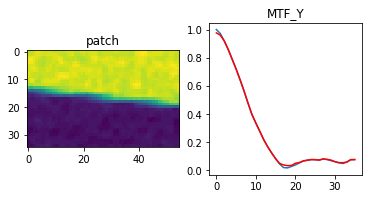

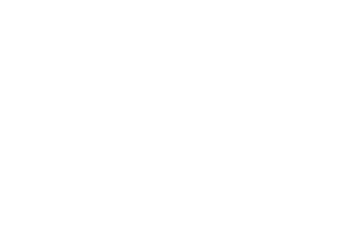

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 0.0015821682754904032
Epoch 173/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

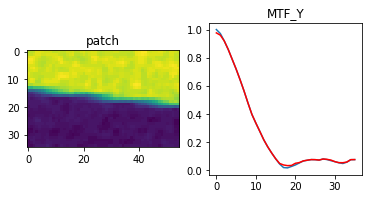

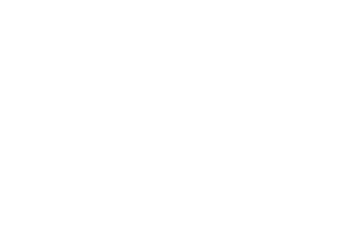

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 0.001563174882903695
Epoch 174/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

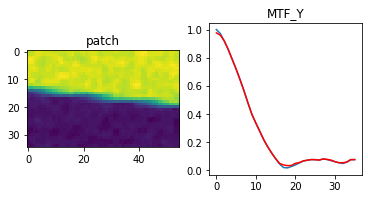

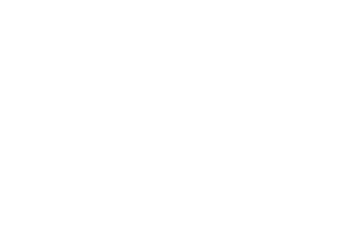

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.99it/s]


epoch_loss = 0.0015444911550730467
Epoch 175/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

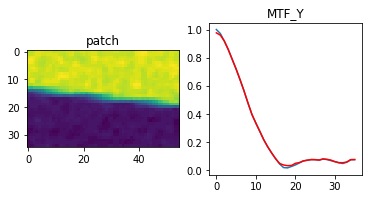

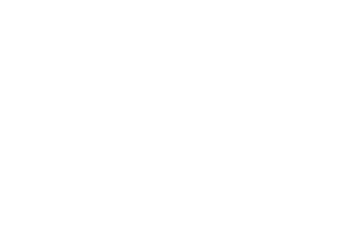

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]


epoch_loss = 0.0015261045191437006
Epoch 176/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

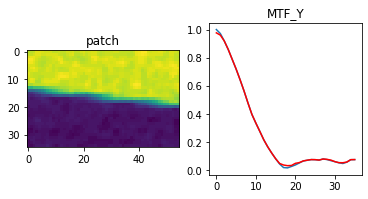

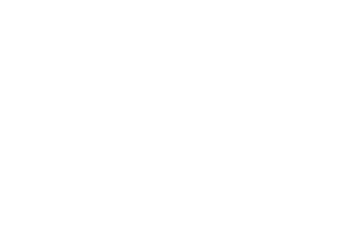

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.65it/s]


epoch_loss = 0.0015080188168212771
Epoch 177/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

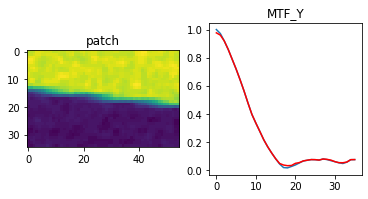

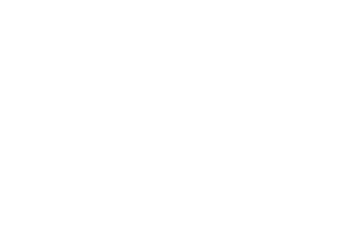

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 0.0014902267139405012
Epoch 178/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

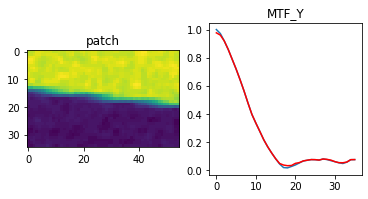

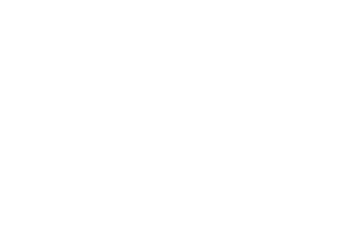

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 0.0014727185480296612
Epoch 179/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

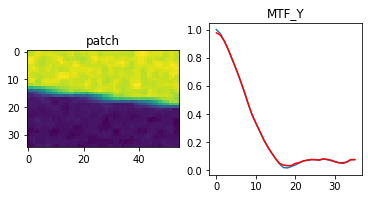

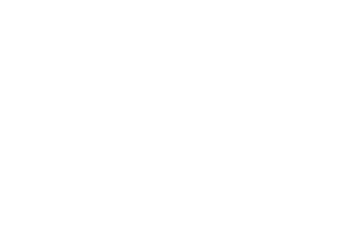

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 0.0014554888475686312
Epoch 180/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

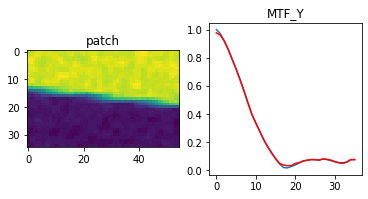

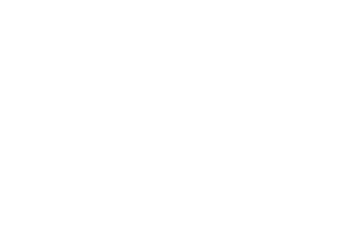

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]


epoch_loss = 0.0014385292306542397
Epoch 181/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

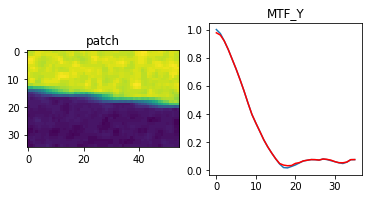

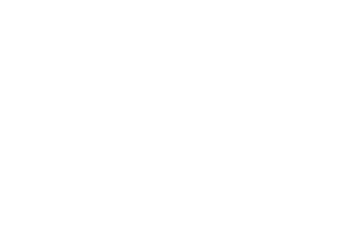

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 0.0014218492433428764
Epoch 182/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

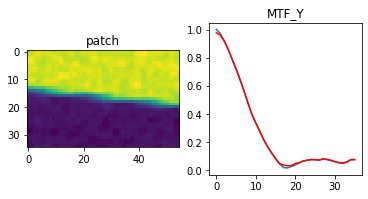

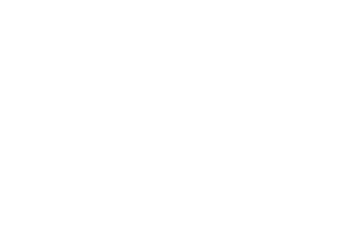

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]


epoch_loss = 0.0014054286293685436
Epoch 183/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

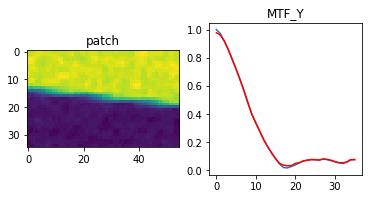

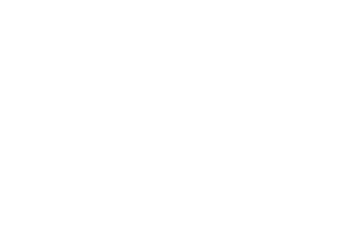

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.25it/s]


epoch_loss = 0.0013892656425014138
Epoch 184/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

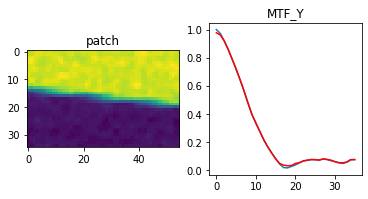

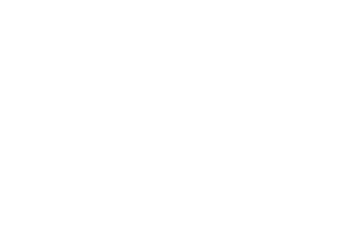

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.84it/s]


epoch_loss = 0.0013733565574511886
Epoch 185/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

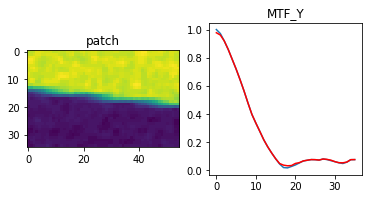

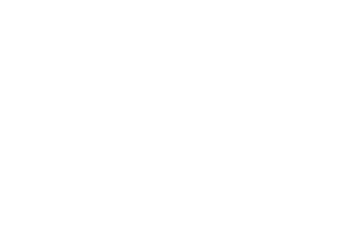

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.78it/s]


epoch_loss = 0.0013576914789155126
Epoch 186/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

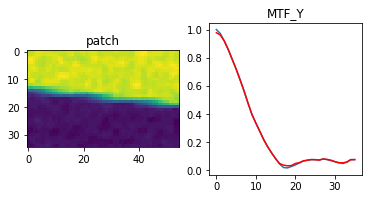

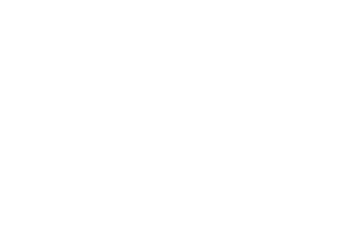

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]


epoch_loss = 0.0013422784395515919
Epoch 187/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

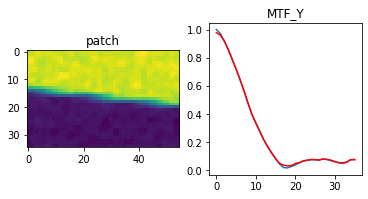

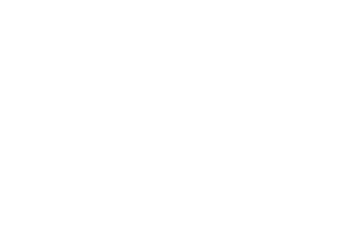

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.58it/s]


epoch_loss = 0.0013271006755530834
Epoch 188/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

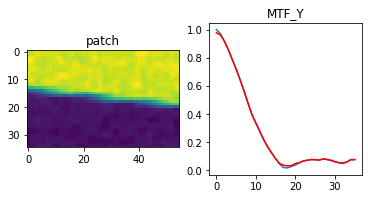

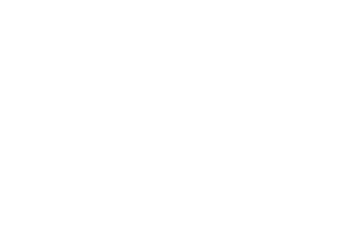

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.33it/s]


epoch_loss = 0.0013121599331498146
Epoch 189/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

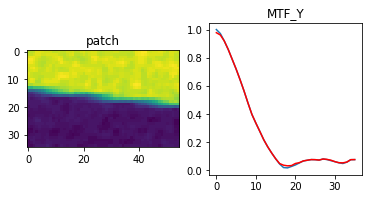

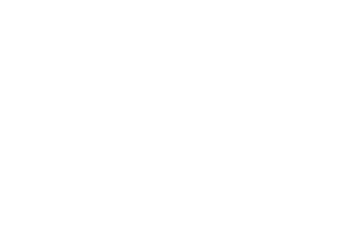

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.60it/s]


epoch_loss = 0.0012974473647773266
Epoch 190/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

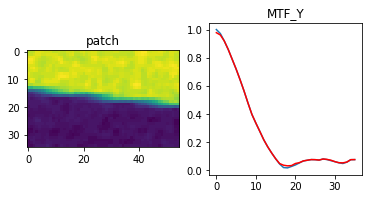

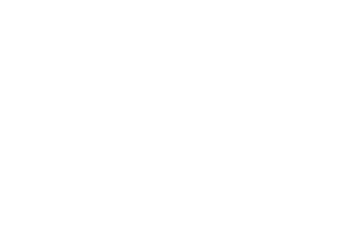

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.34it/s]


epoch_loss = 0.001282963901758194
Epoch 191/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

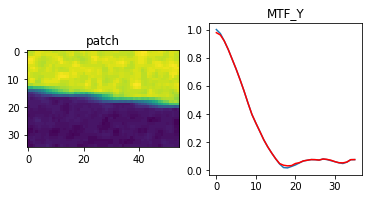

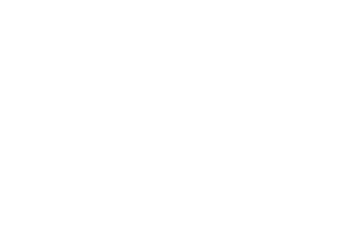

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.31it/s]


epoch_loss = 0.0012686948757618666
Epoch 192/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

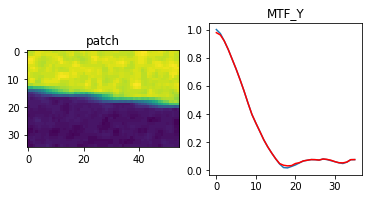

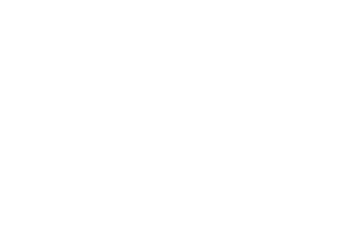

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]


epoch_loss = 0.0012546484358608723
Epoch 193/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

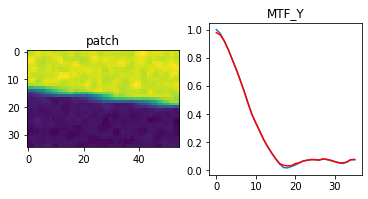

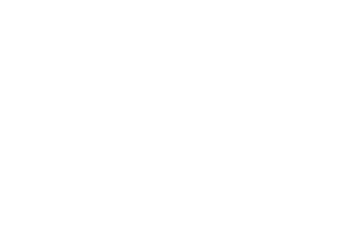

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 0.0012408142210915685
Epoch 194/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

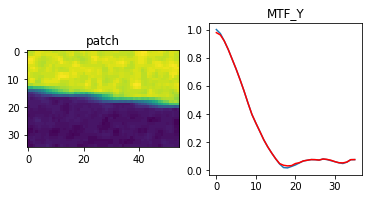

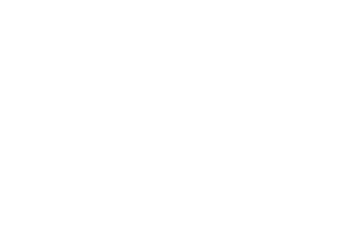

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 0.00122718489728868
Epoch 195/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

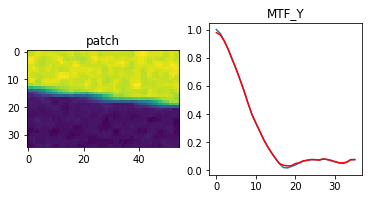

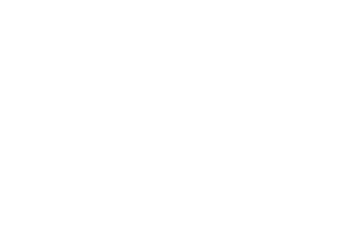

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 0.0012137622106820345
Epoch 196/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

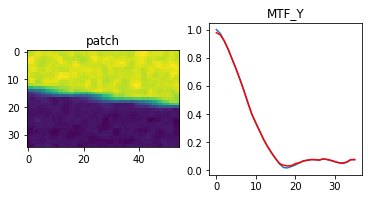

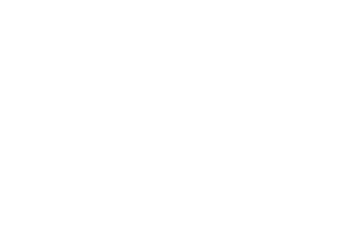

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.98it/s]


epoch_loss = 0.0012005483731627464
Epoch 197/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

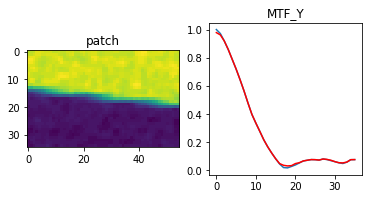

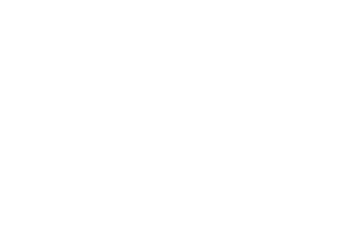

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.99it/s]


epoch_loss = 0.0011875301133841276
Epoch 198/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

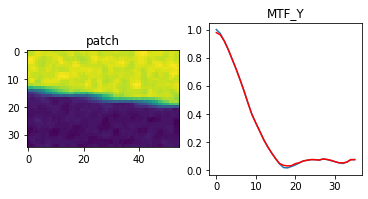

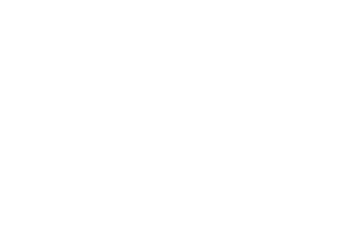

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 0.0011747044045478106
Epoch 199/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

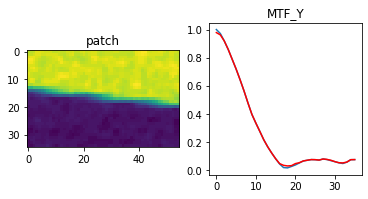

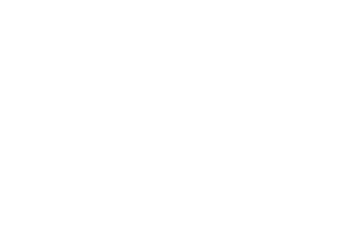

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 0.0011620665900409222
Epoch 200/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

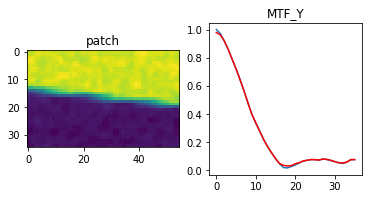

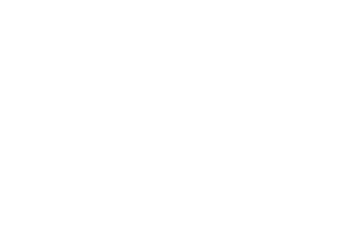

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]


epoch_loss = 0.0011496187653392553
Epoch 201/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

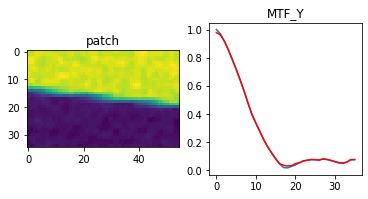

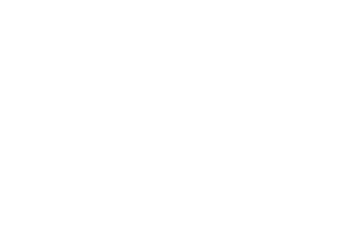

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]


epoch_loss = 0.0011373496381565928
Epoch 202/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

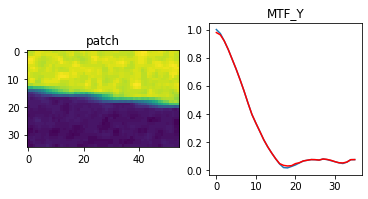

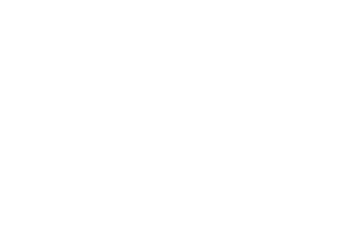

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]


epoch_loss = 0.0011252628173679113
Epoch 203/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

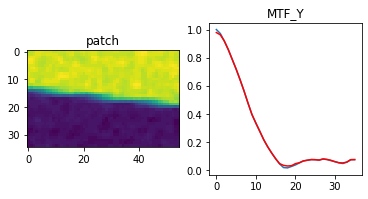

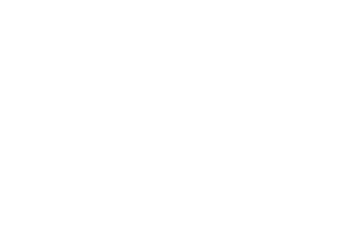

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]


epoch_loss = 0.0011133551597595215
Epoch 204/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

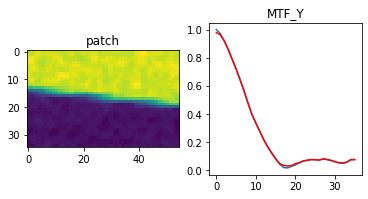

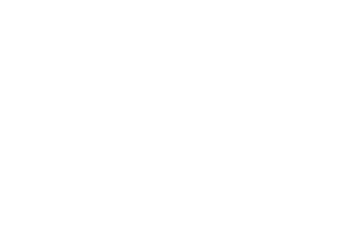

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.25it/s]


epoch_loss = 0.0011016239877790213
Epoch 205/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

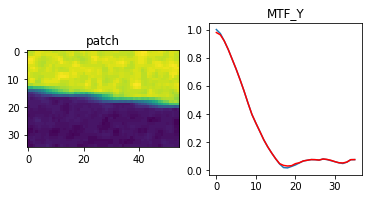

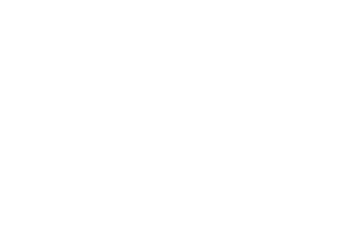

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 0.00109005905687809
Epoch 206/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

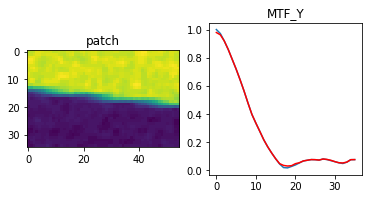

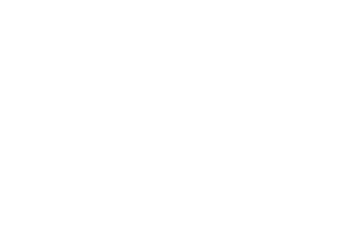

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 0.001078668050467968
Epoch 207/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

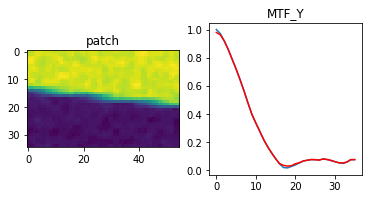

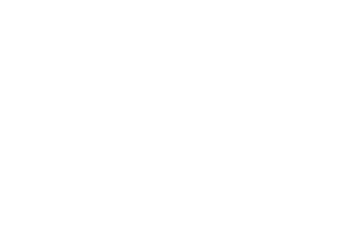

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.65it/s]


epoch_loss = 0.001067435136064887
Epoch 208/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

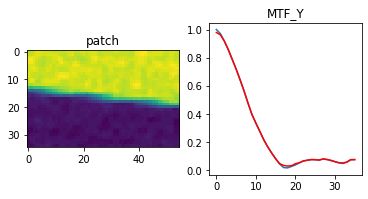

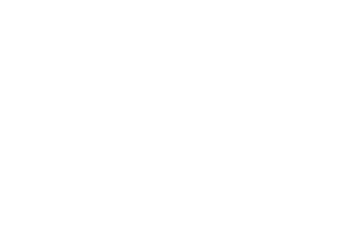

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.70it/s]


epoch_loss = 0.0010563674150034785
Epoch 209/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

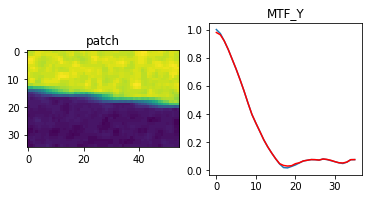

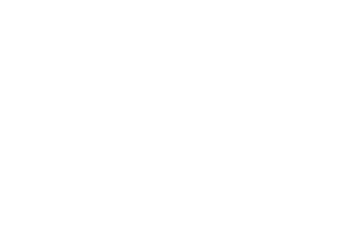

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 0.001045457785949111
Epoch 210/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

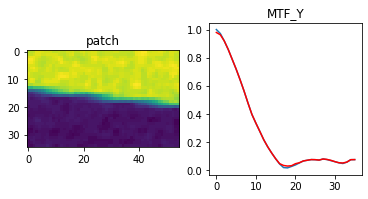

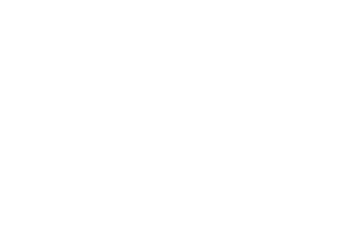

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.48it/s]


epoch_loss = 0.0010347082279622555
Epoch 211/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

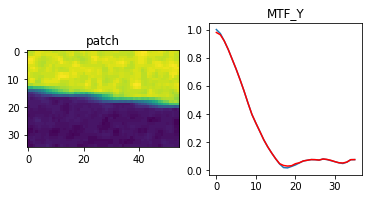

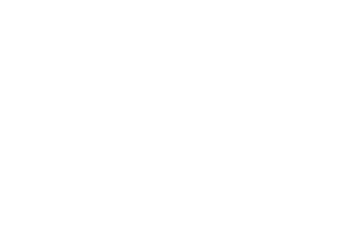

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.84it/s]


epoch_loss = 0.001024110009893775
Epoch 212/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

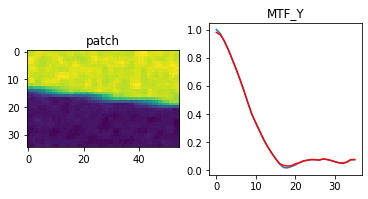

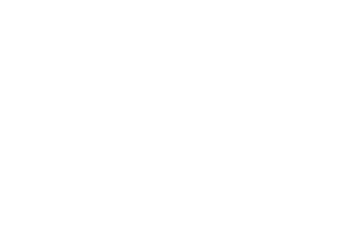

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]


epoch_loss = 0.0010136584751307964
Epoch 213/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

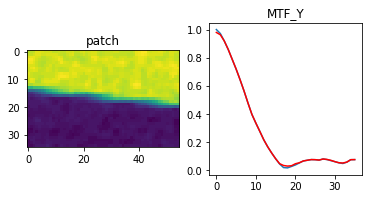

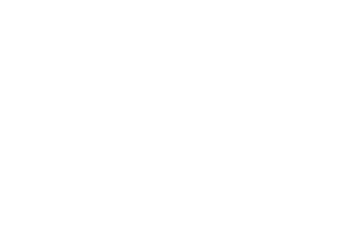

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.05it/s]


epoch_loss = 0.0010033558355644345
Epoch 214/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

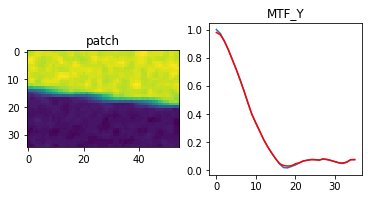

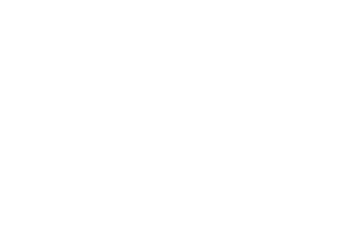

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]


epoch_loss = 0.000993203604593873
Epoch 215/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

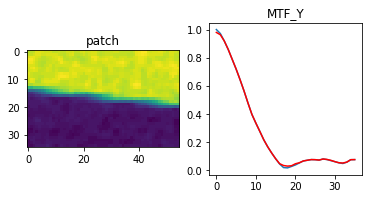

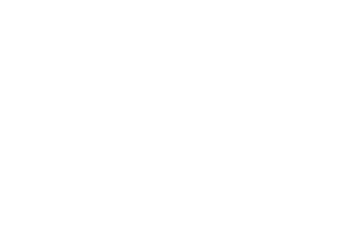

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.33it/s]


epoch_loss = 0.0009831847855821252
Epoch 216/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

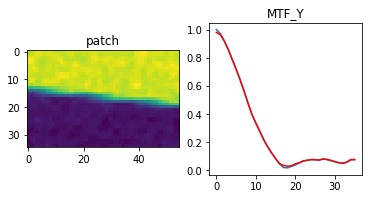

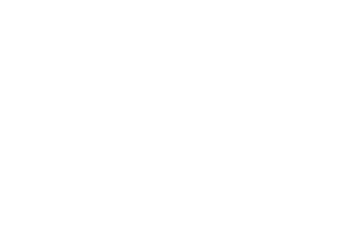

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]


epoch_loss = 0.0009733114275150001
Epoch 217/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

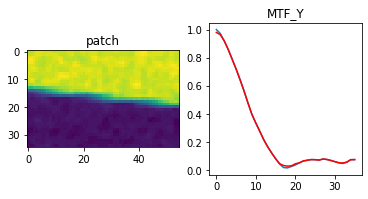

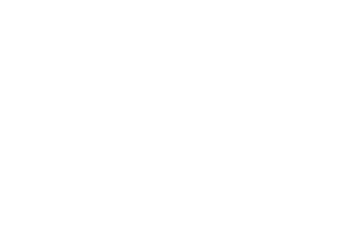

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.96it/s]


epoch_loss = 0.0009635775350034237
Epoch 218/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

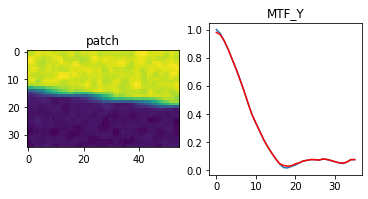

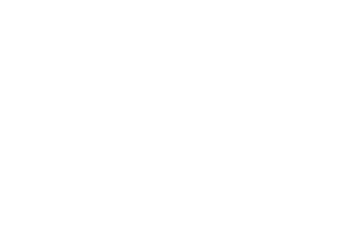

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]


epoch_loss = 0.0009539790917187929
Epoch 219/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

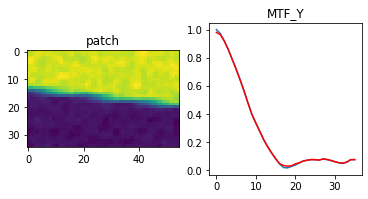

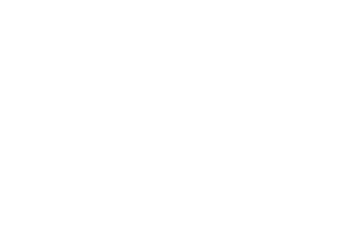

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 0.0009445069590583444
Epoch 220/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

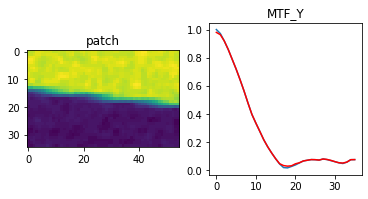

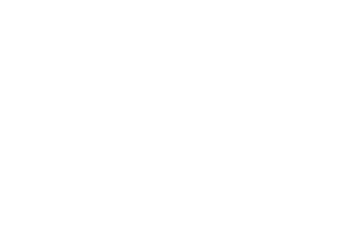

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.58it/s]


epoch_loss = 0.0009351694025099277
Epoch 221/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

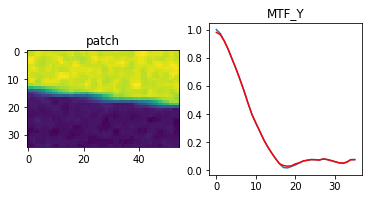

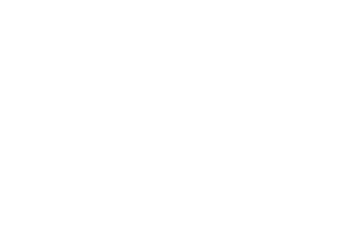

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]


epoch_loss = 0.0009259642101824284
Epoch 222/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

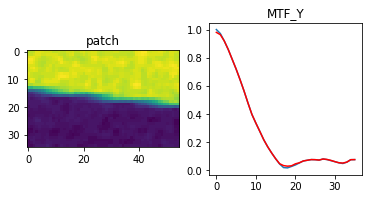

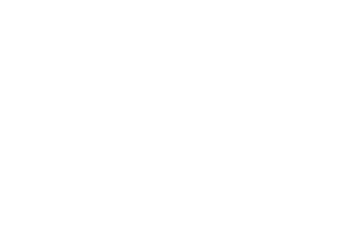

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 0.0009168802062049508
Epoch 223/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

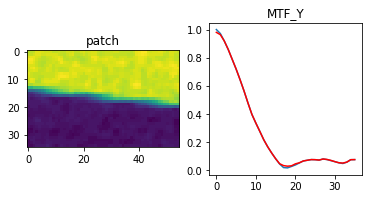

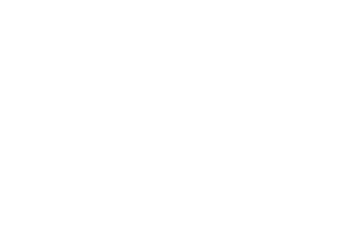

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]


epoch_loss = 0.0009079216979444027
Epoch 224/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

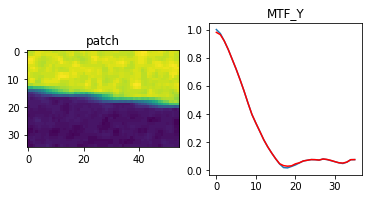

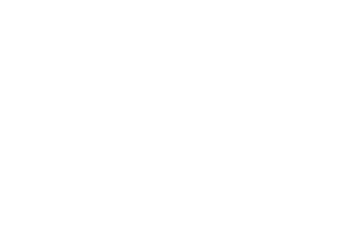

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 0.0008990867645479739
Epoch 225/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

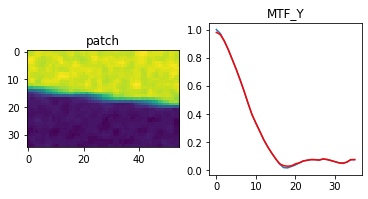

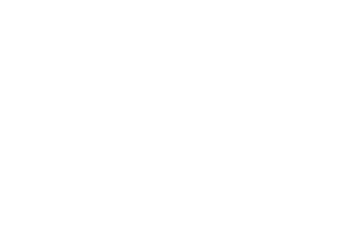

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]


epoch_loss = 0.0008903741836547852
Epoch 226/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

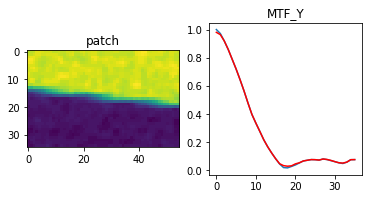

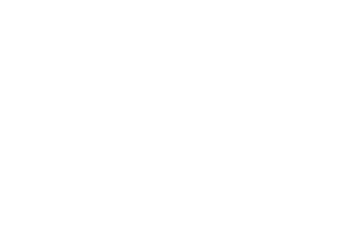

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 0.000881774933077395
Epoch 227/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

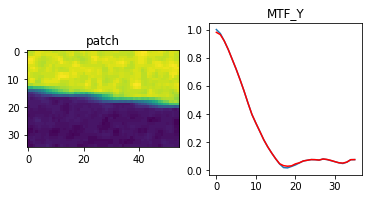

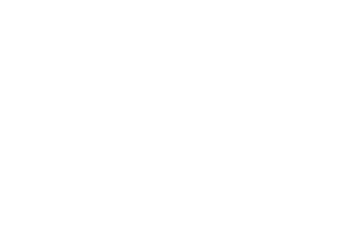

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 0.0008732931455597281
Epoch 228/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

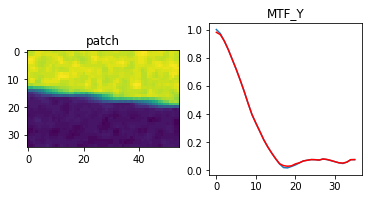

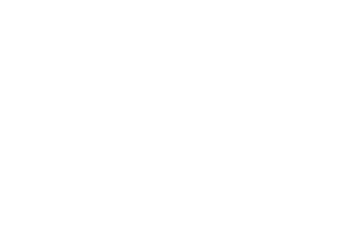

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 0.0008649268420413136
Epoch 229/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

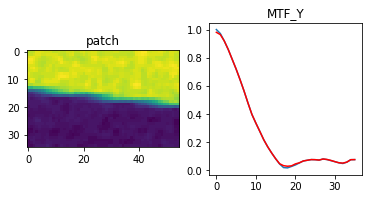

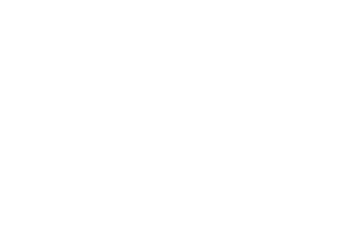

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.0008566692704334855
Epoch 230/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

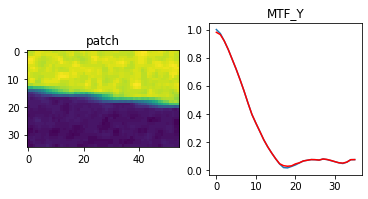

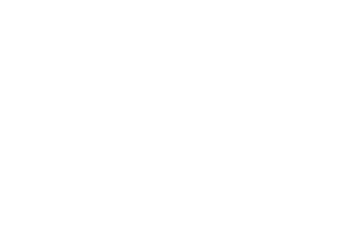

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 0.0008485282305628061
Epoch 231/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

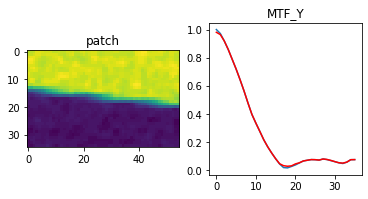

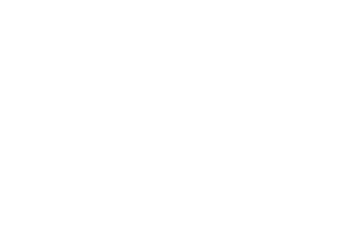

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.11it/s]


epoch_loss = 0.0008404924883507192
Epoch 232/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

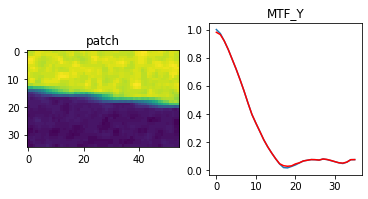

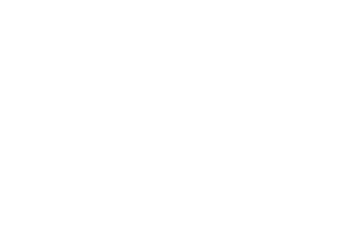

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.23it/s]


epoch_loss = 0.0008325586677528918
Epoch 233/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

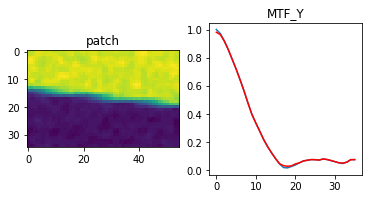

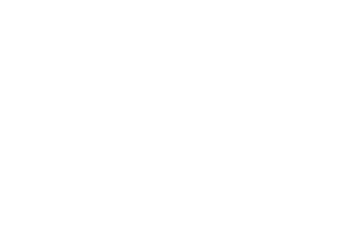

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.53it/s]


epoch_loss = 0.0008247367804870009
Epoch 234/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

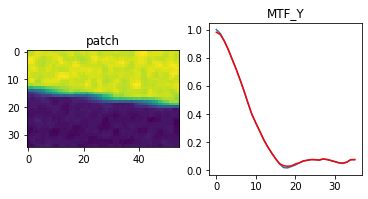

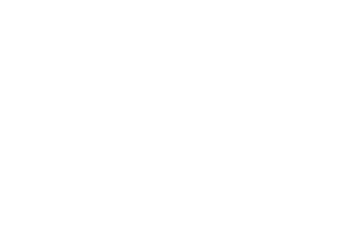

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.31it/s]


epoch_loss = 0.0008170165820047259
Epoch 235/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

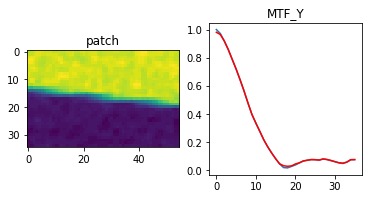

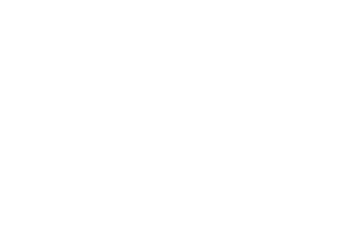

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.98it/s]


epoch_loss = 0.0008093947544693947
Epoch 236/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

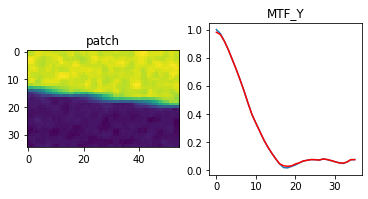

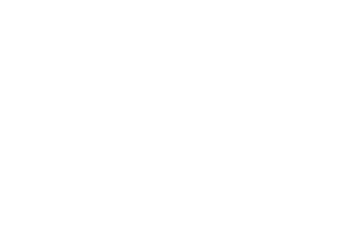

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 0.000801876129116863
Epoch 237/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

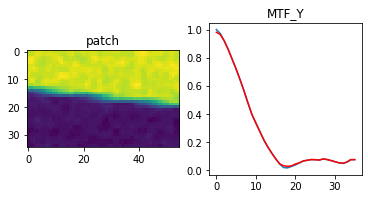

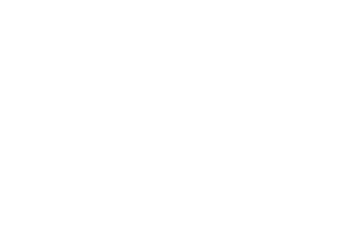

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.13it/s]


epoch_loss = 0.0007944522658362985
Epoch 238/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

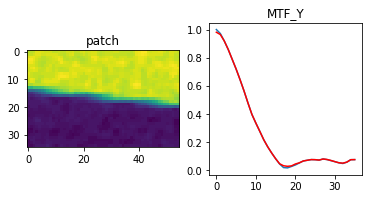

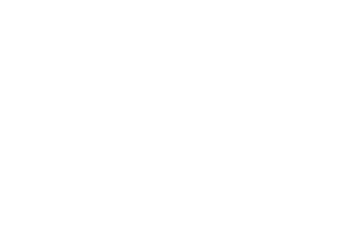

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]


epoch_loss = 0.0007871241541579366
Epoch 239/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

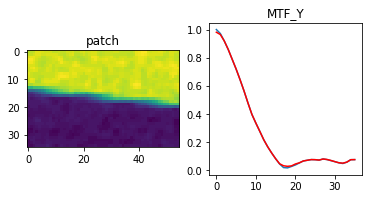

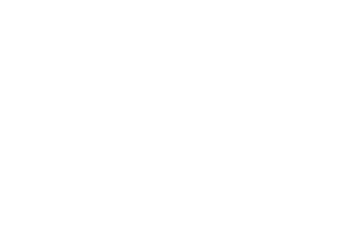

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.91it/s]


epoch_loss = 0.000779896043241024
Epoch 240/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

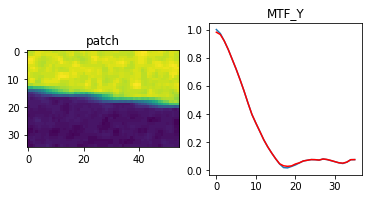

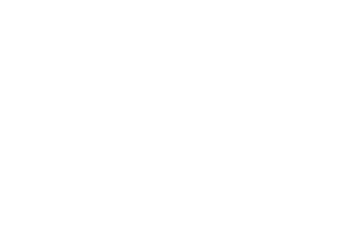

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]


epoch_loss = 0.0007727585034444928
Epoch 241/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

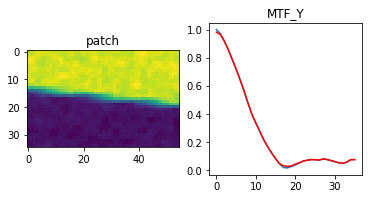

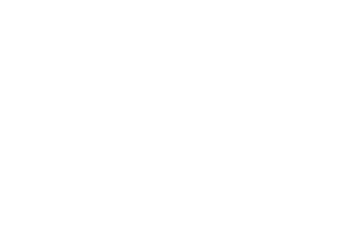

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.30it/s]


epoch_loss = 0.0007657133392058313
Epoch 242/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

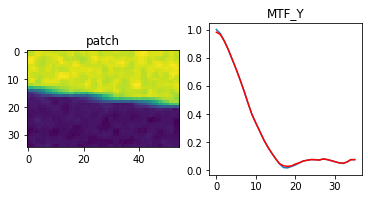

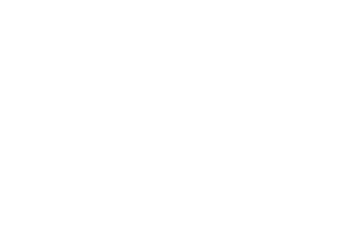

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]


epoch_loss = 0.0007587607251480222
Epoch 243/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

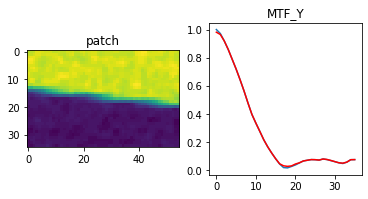

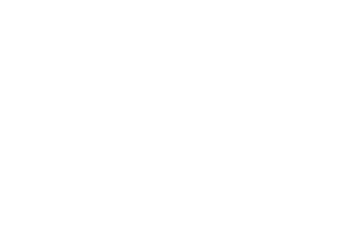

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 0.0007518916390836239
Epoch 244/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

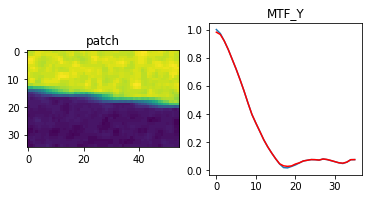

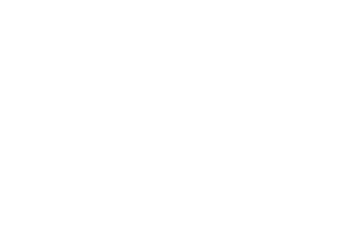

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]


epoch_loss = 0.0007451141136698425
Epoch 245/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

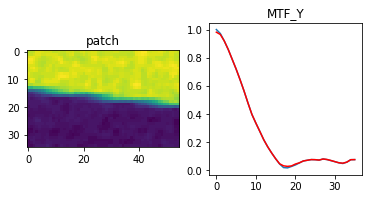

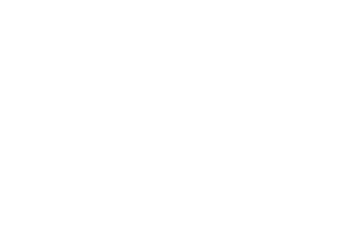

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.98it/s]


epoch_loss = 0.000738421396818012
Epoch 246/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

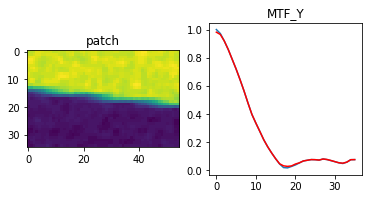

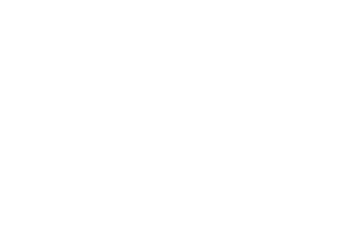

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.86it/s]


epoch_loss = 0.0007318112766370177
Epoch 247/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

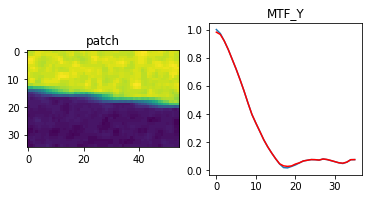

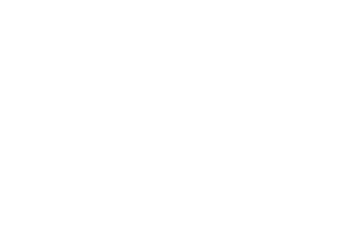

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]


epoch_loss = 0.0007252881769090891
Epoch 248/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

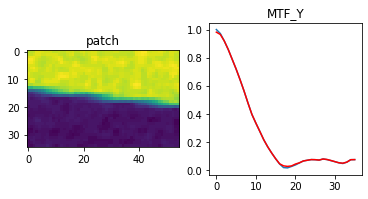

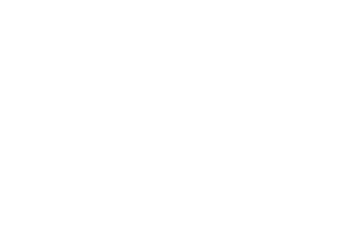

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]


epoch_loss = 0.0007188468589447439
Epoch 249/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

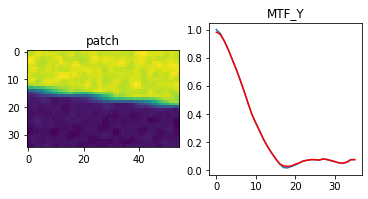

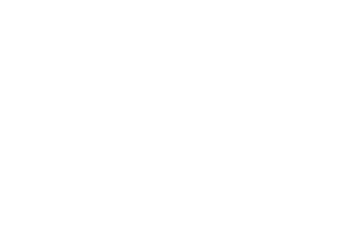

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 0.0007124877301976085
Epoch 250/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

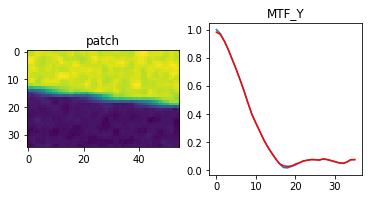

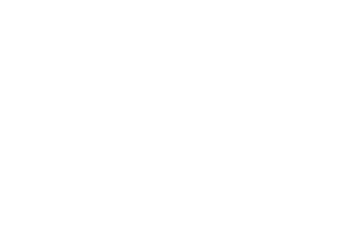

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 0.0007062056101858616
Epoch 251/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

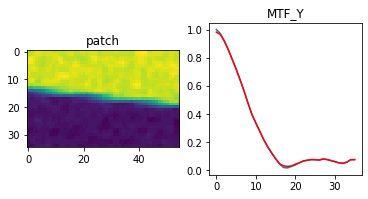

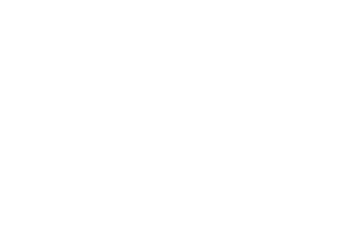

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 0.0007000038749538362
Epoch 252/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

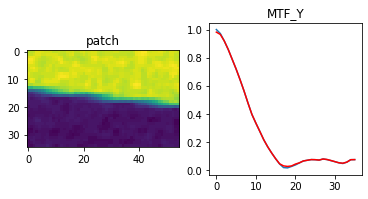

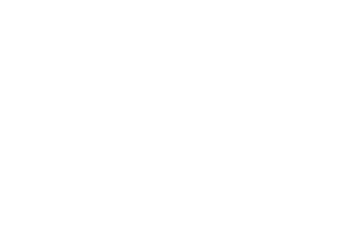

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.0006938768783584237
Epoch 253/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

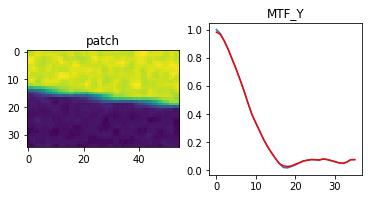

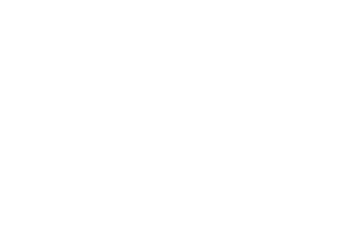

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.06it/s]


epoch_loss = 0.0006878300337120891
Epoch 254/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

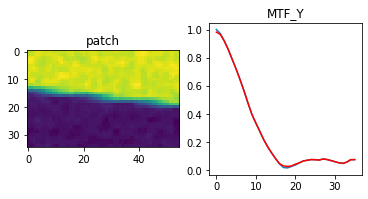

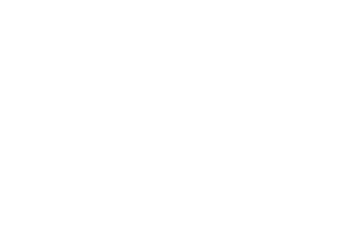

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 0.0006818546680733562
Epoch 255/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

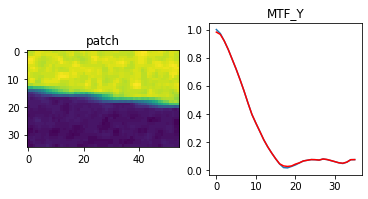

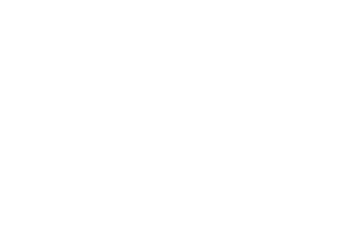

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 0.0006759497919119895
Epoch 256/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

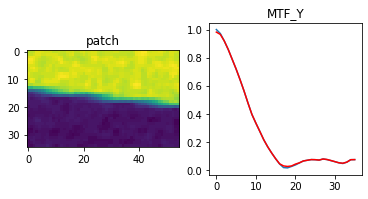

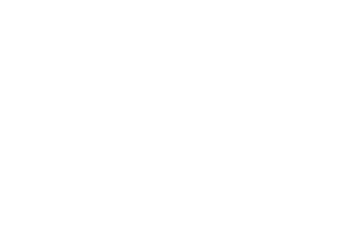

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.14it/s]


epoch_loss = 0.0006701223319396377
Epoch 257/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

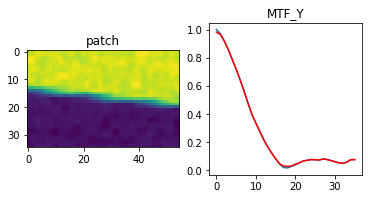

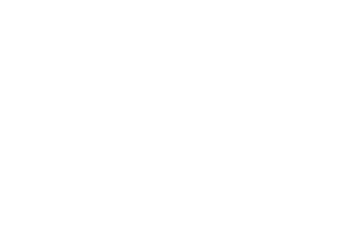

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 0.0006643615779466927
Epoch 258/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

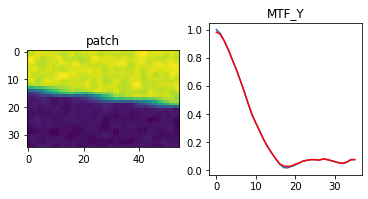

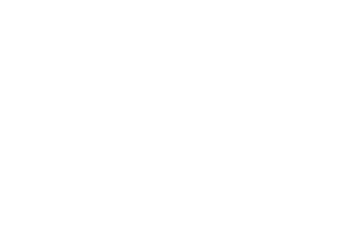

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 0.0006586752133443952
Epoch 259/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

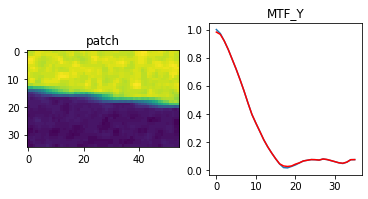

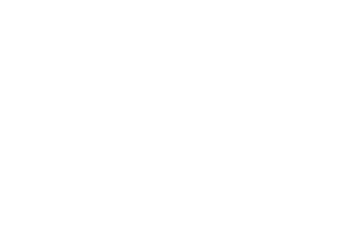

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]


epoch_loss = 0.0006530591053888202
Epoch 260/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

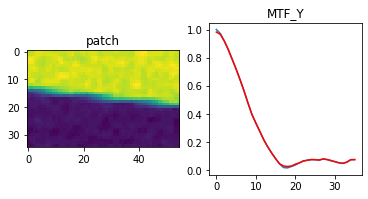

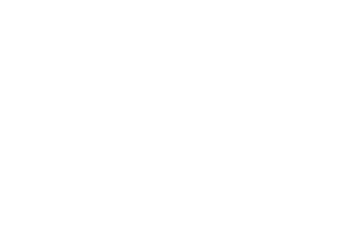

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.01it/s]


epoch_loss = 0.0006475106347352266
Epoch 261/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

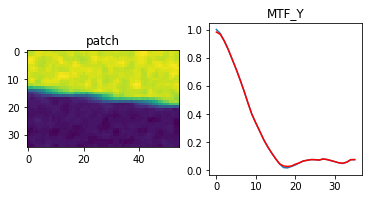

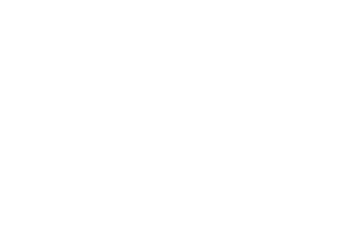

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.33it/s]


epoch_loss = 0.0006420228164643049
Epoch 262/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

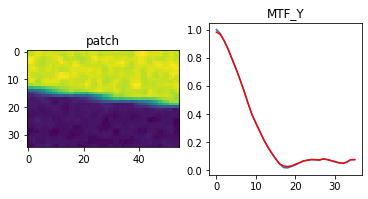

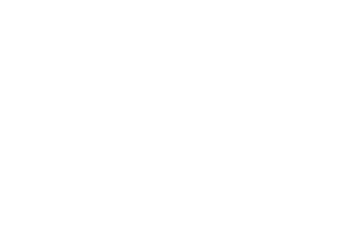

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 0.0006366029847413301
Epoch 263/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

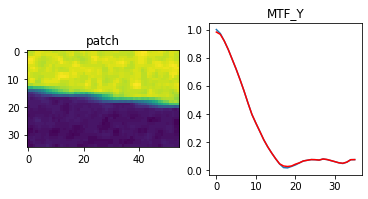

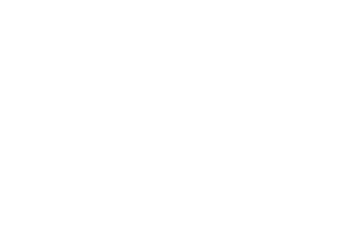

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 0.0006312537589110434
Epoch 264/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

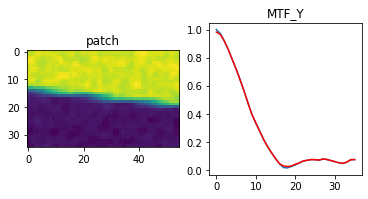

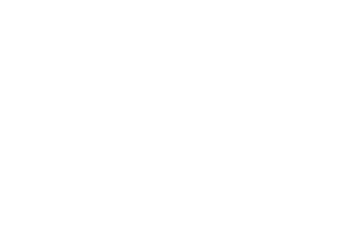

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.0006259643705561757
Epoch 265/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

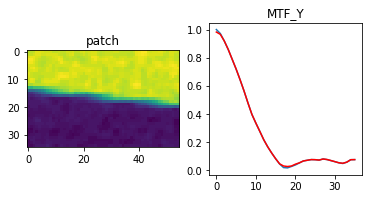

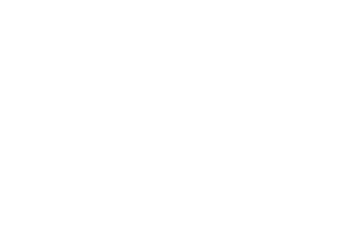

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 0.0006207397673279047
Epoch 266/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

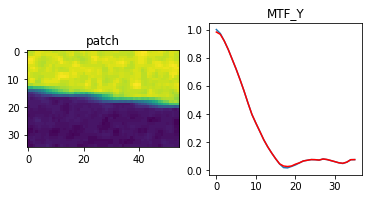

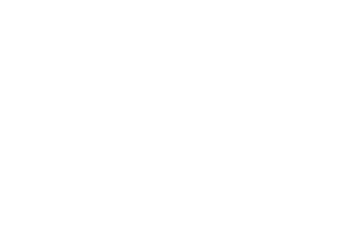

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.0006155758164823055
Epoch 267/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

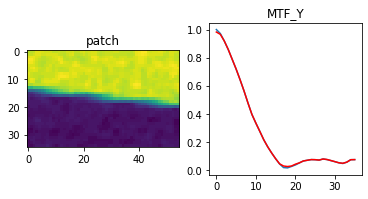

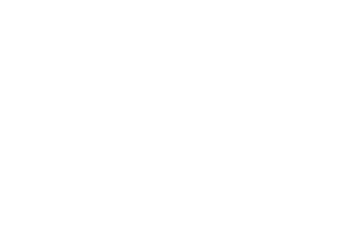

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]


epoch_loss = 0.0006104754284024239
Epoch 268/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

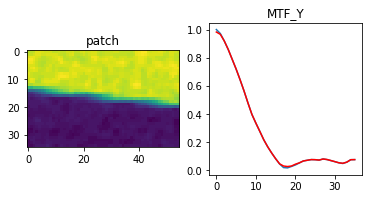

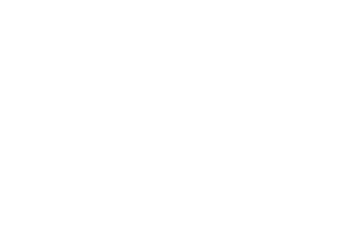

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.90it/s]


epoch_loss = 0.0006054344121366739
Epoch 269/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

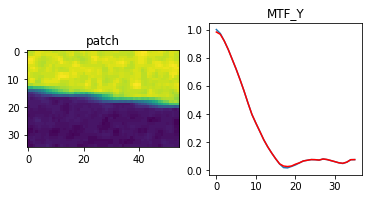

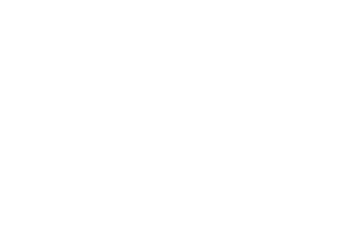

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]


epoch_loss = 0.0006004488095641136
Epoch 270/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

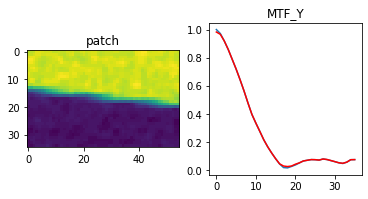

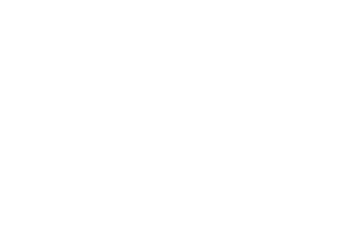

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.31it/s]


epoch_loss = 0.0005955256638117135
Epoch 271/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

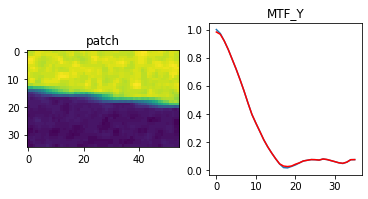

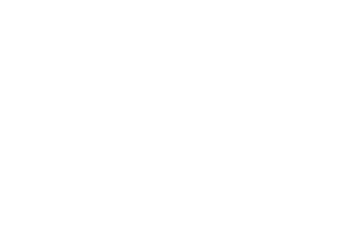

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.31it/s]


epoch_loss = 0.0005906597943976521
Epoch 272/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

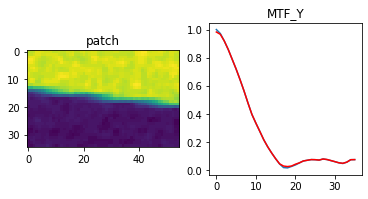

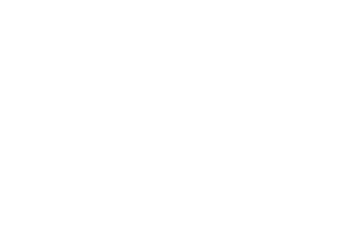

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]


epoch_loss = 0.000585853005759418
Epoch 273/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

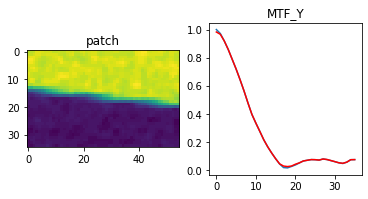

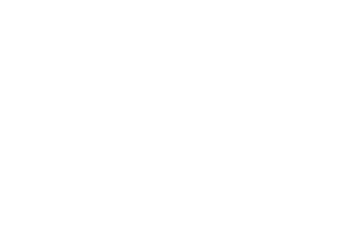

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]


epoch_loss = 0.000581099244300276
Epoch 274/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

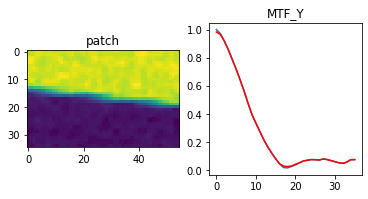

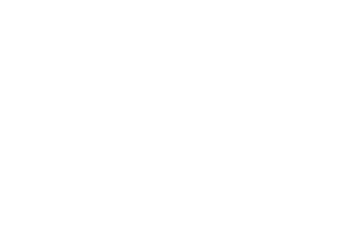

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.69it/s]


epoch_loss = 0.0005763990920968354
Epoch 275/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

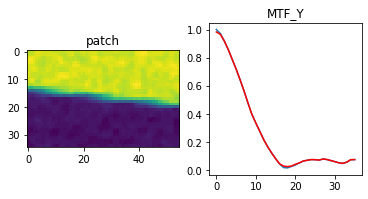

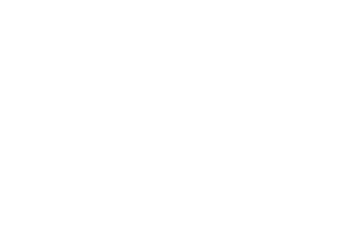

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.53it/s]


epoch_loss = 0.0005717534222640097
Epoch 276/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

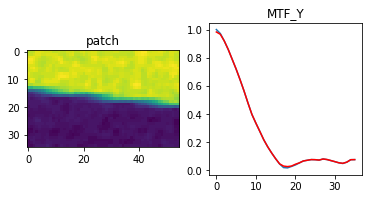

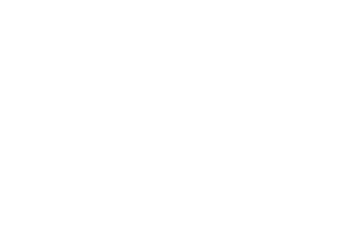

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.0005671647959388793
Epoch 277/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

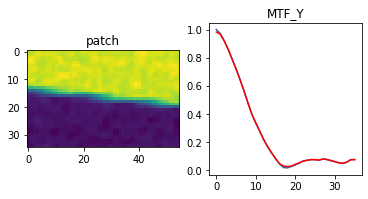

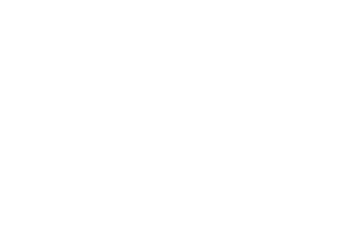

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.31it/s]


epoch_loss = 0.0005626250058412552
Epoch 278/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

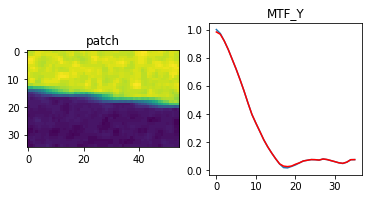

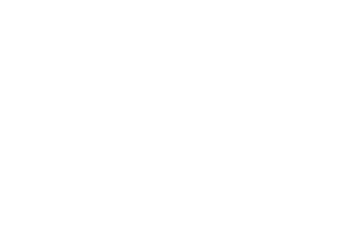

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]


epoch_loss = 0.0005581409204751253
Epoch 279/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

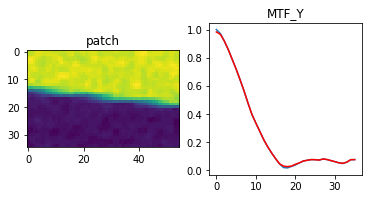

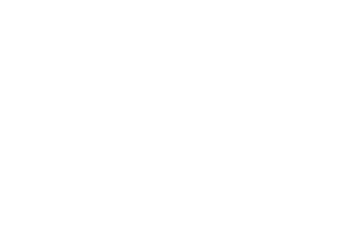

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.21it/s]


epoch_loss = 0.0005537065444514155
Epoch 280/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

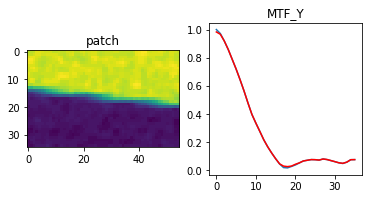

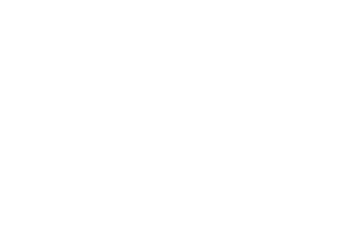

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 0.000549323158338666
Epoch 281/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

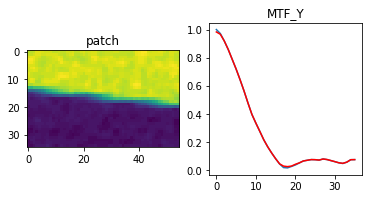

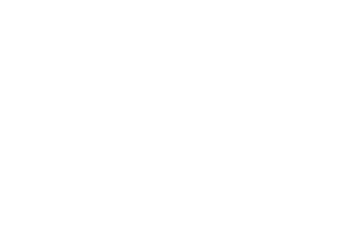

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.14it/s]


epoch_loss = 0.0005449879099614918
Epoch 282/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

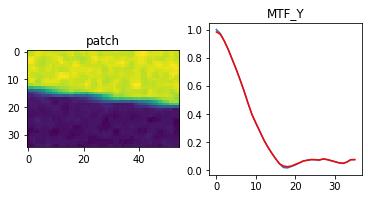

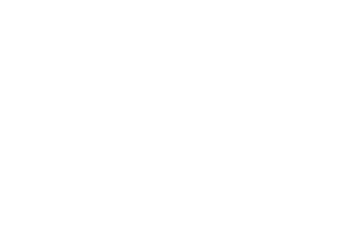

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]


epoch_loss = 0.000540702894795686
Epoch 283/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

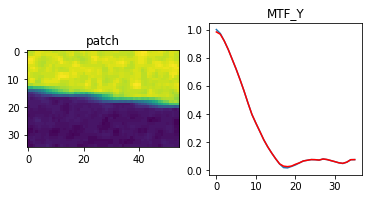

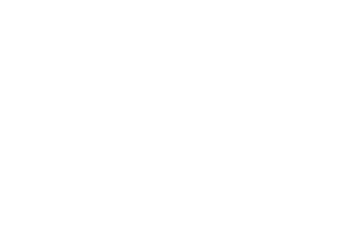

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 0.0005364686367101967
Epoch 284/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

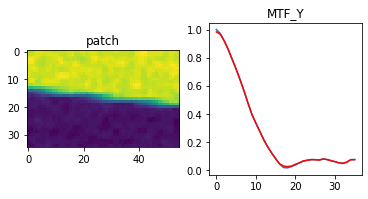

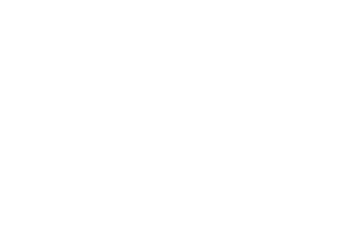

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 0.0005322794313542545
Epoch 285/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

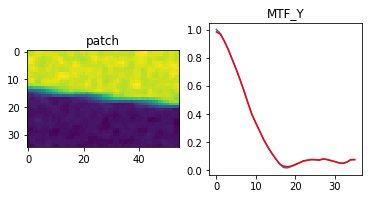

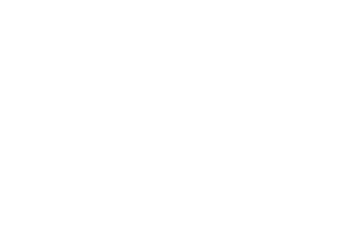

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]


epoch_loss = 0.0005281362682580948
Epoch 286/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

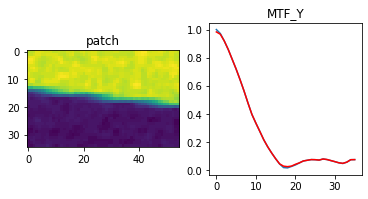

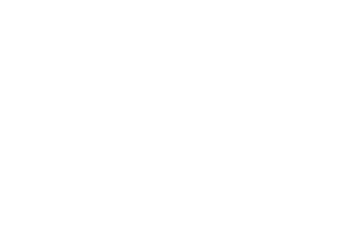

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]


epoch_loss = 0.0005240410682745278
Epoch 287/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

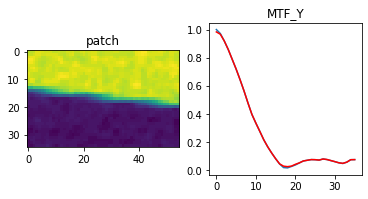

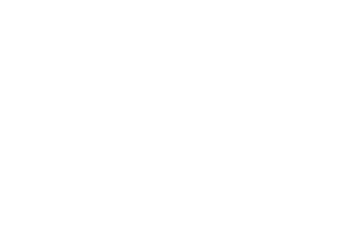

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 0.0005199930164963007
Epoch 288/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

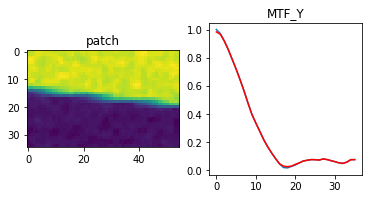

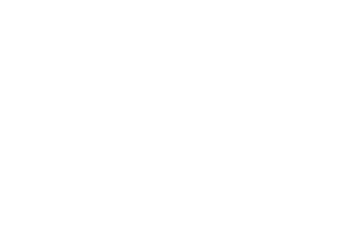

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]


epoch_loss = 0.0005159876309335232
Epoch 289/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

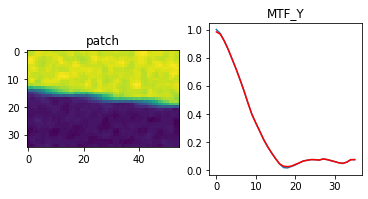

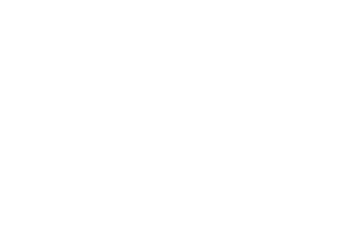

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.0005120268324390054
Epoch 290/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

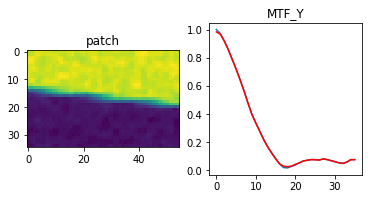

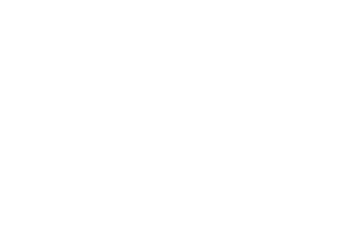

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]


epoch_loss = 0.0005081100389361382
Epoch 291/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

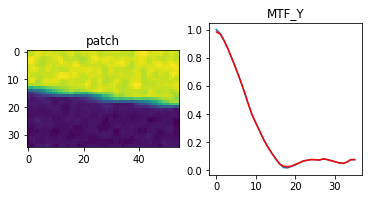

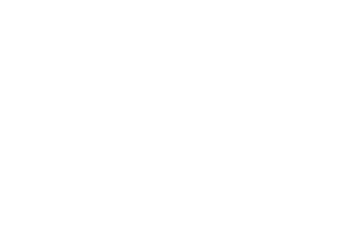

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]


epoch_loss = 0.0005042349803261459
Epoch 292/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

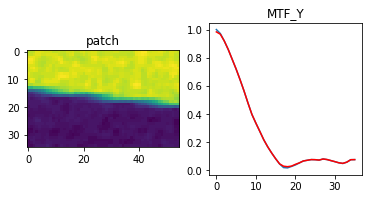

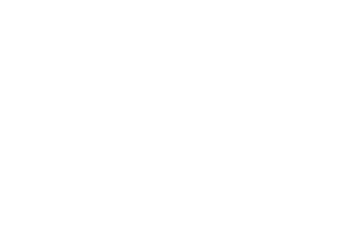

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]


epoch_loss = 0.0005004059057682753
Epoch 293/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

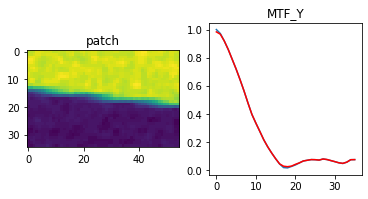

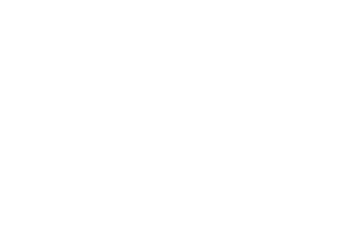

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.99it/s]


epoch_loss = 0.0004966181004419923
Epoch 294/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

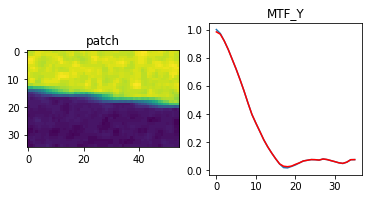

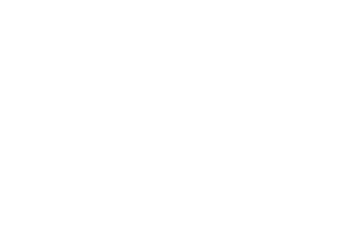

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 0.0004928664420731366
Epoch 295/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

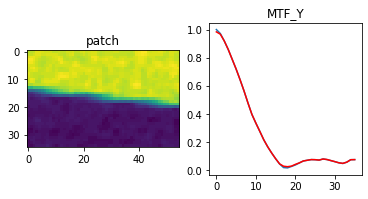

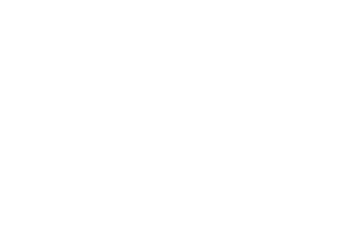

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.95it/s]


epoch_loss = 0.0004891612916253507
Epoch 296/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

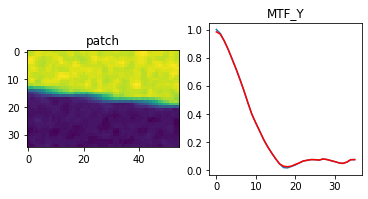

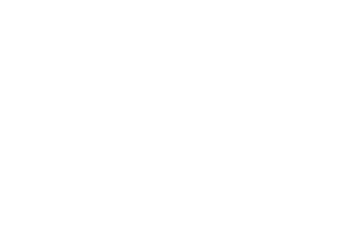

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.99it/s]


epoch_loss = 0.00048549784696660936
Epoch 297/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

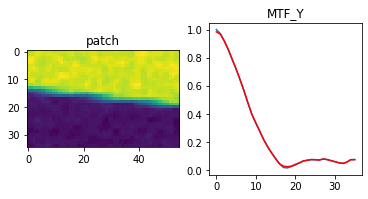

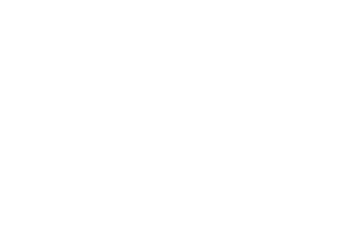

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 0.0004818694433197379
Epoch 298/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

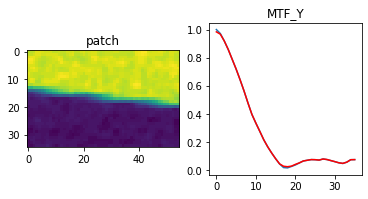

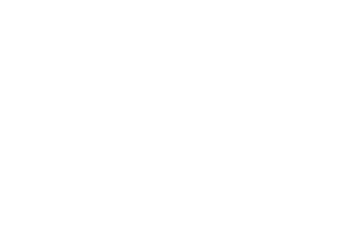

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.08it/s]


epoch_loss = 0.0004782813193742186
Epoch 299/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

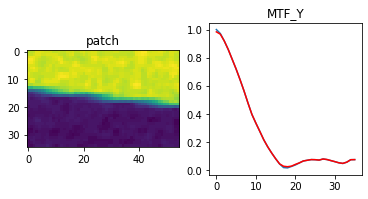

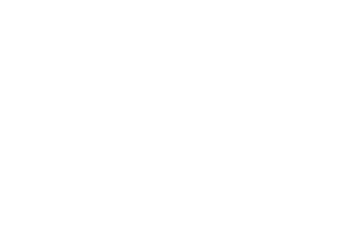

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.95it/s]


epoch_loss = 0.00047473557060584426
Epoch 300/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

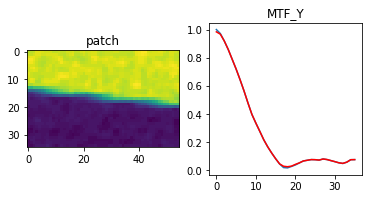

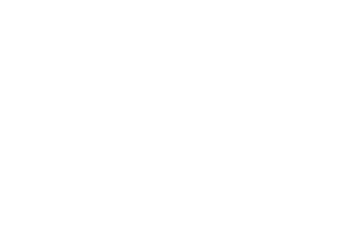

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 0.00047122573596425354
Epoch 301/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

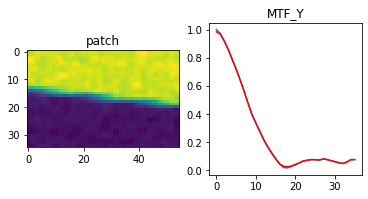

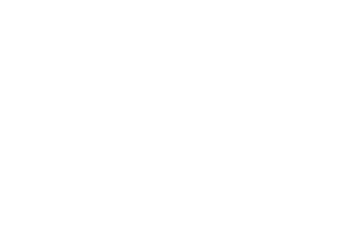

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 0.0004677486140280962
Epoch 302/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

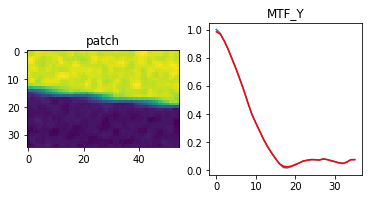

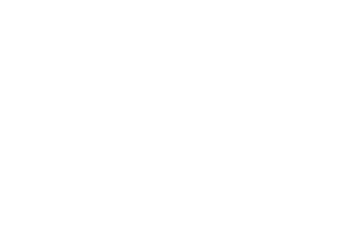

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.17it/s]


epoch_loss = 0.0004643155843950808
Epoch 303/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

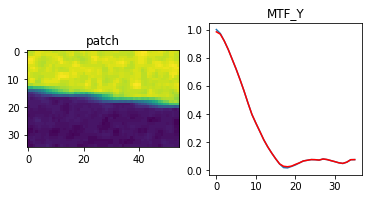

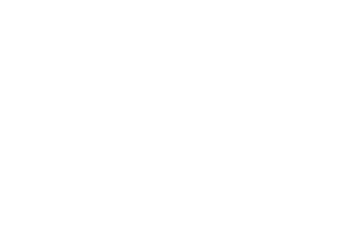

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]


epoch_loss = 0.0004609143943525851
Epoch 304/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

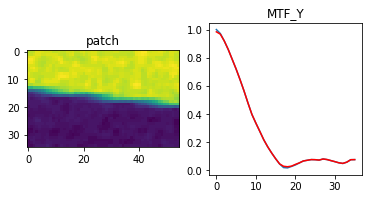

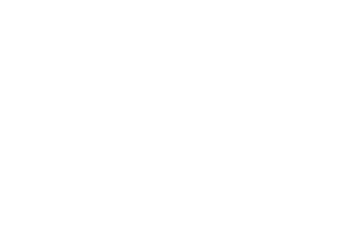

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 0.0004575519124045968
Epoch 305/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

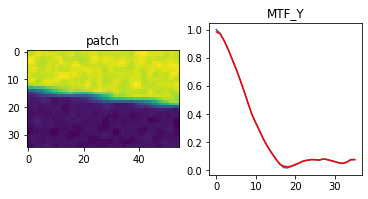

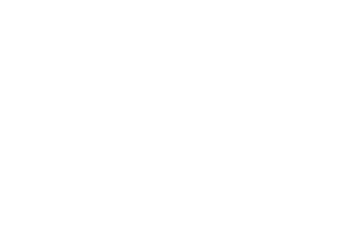

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]


epoch_loss = 0.0004542251699604094
Epoch 306/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

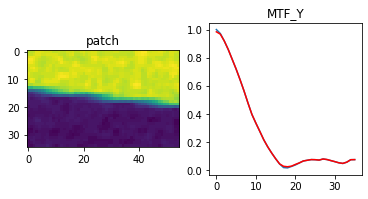

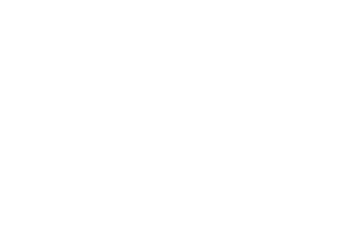

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]


epoch_loss = 0.00045093425433151424
Epoch 307/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

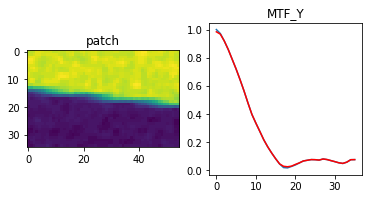

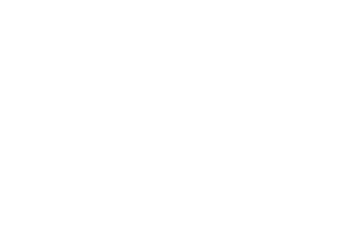

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 0.00044767558574676514
Epoch 308/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

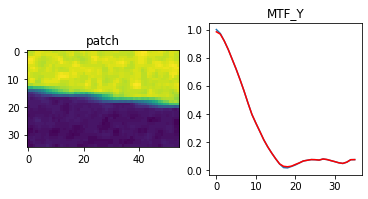

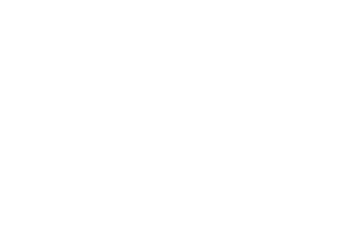

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]


epoch_loss = 0.0004444509104359895
Epoch 309/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

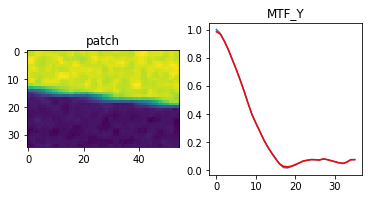

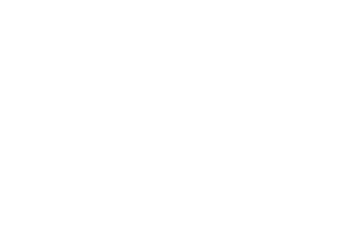

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]


epoch_loss = 0.0004412647685967386
Epoch 310/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

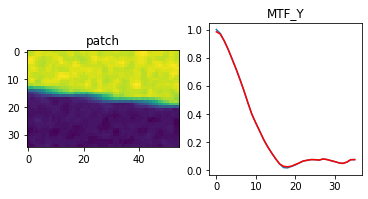

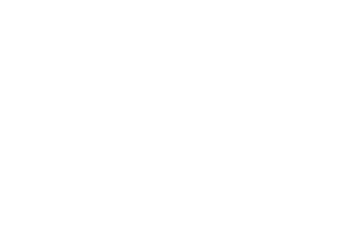

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 0.0004381062462925911
Epoch 311/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

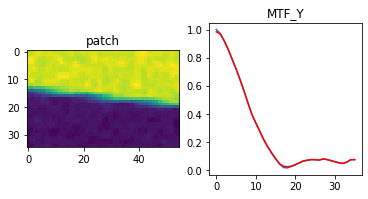

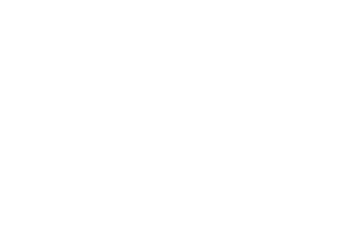

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.56it/s]


epoch_loss = 0.000434987829066813
Epoch 312/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

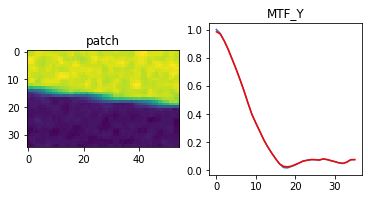

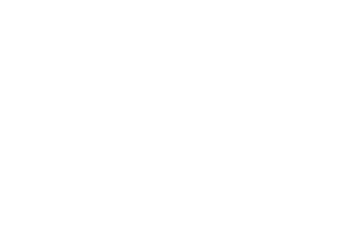

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.25it/s]


epoch_loss = 0.0004318944993428886
Epoch 313/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

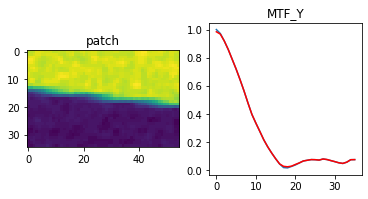

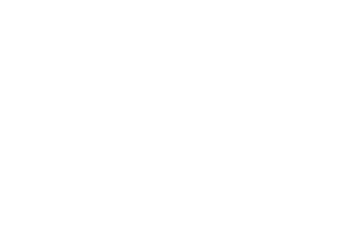

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]


epoch_loss = 0.00042883778223767877
Epoch 314/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

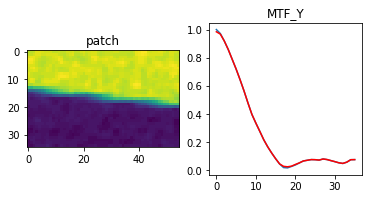

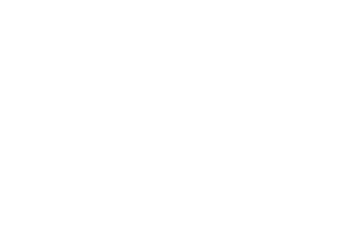

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.00it/s]


epoch_loss = 0.0004258065309841186
Epoch 315/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

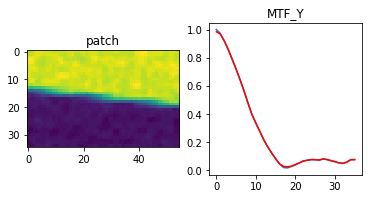

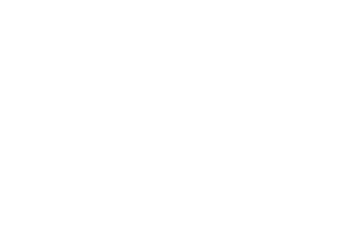

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.90it/s]


epoch_loss = 0.00042281148489564657
Epoch 316/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

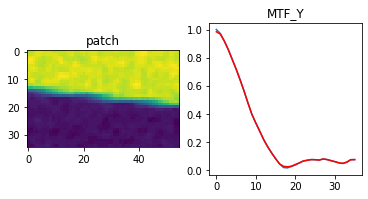

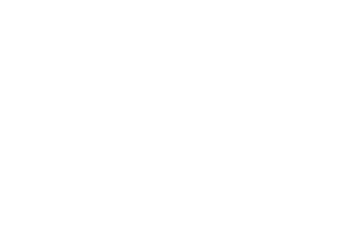

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.62it/s]


epoch_loss = 0.00041984685231000185
Epoch 317/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

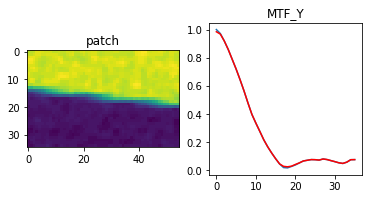

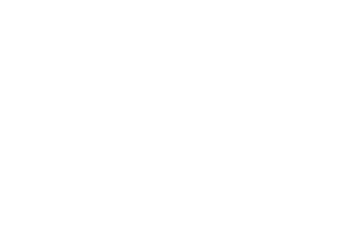

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]


epoch_loss = 0.0004169113817624748
Epoch 318/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

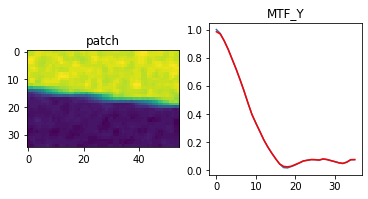

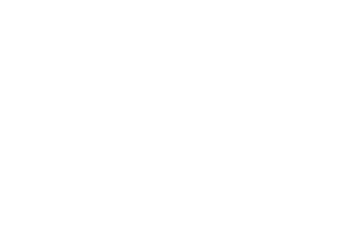

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.06it/s]


epoch_loss = 0.00041400664485991
Epoch 319/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

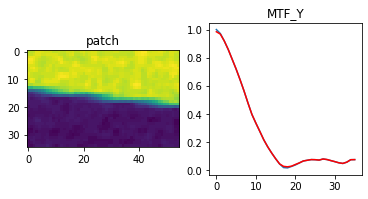

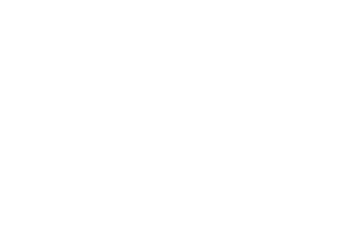

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.28it/s]


epoch_loss = 0.0004111314192414284
Epoch 320/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

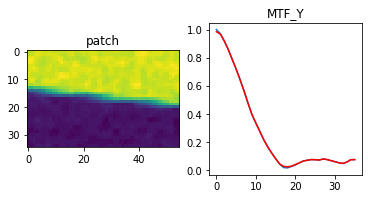

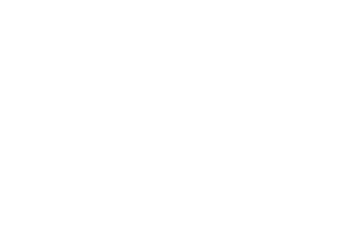

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]


epoch_loss = 0.0004082879167981446
Epoch 321/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

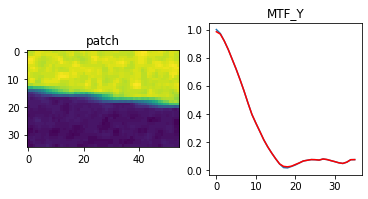

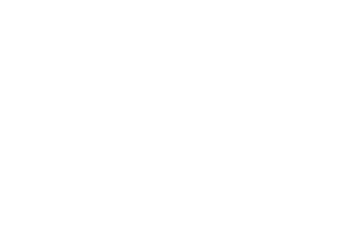

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.47it/s]


epoch_loss = 0.0004054696182720363
Epoch 322/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

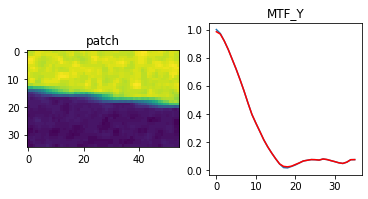

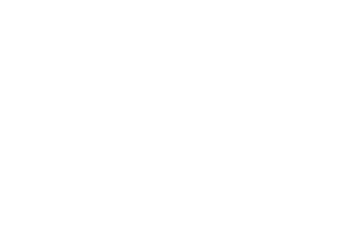

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.23it/s]


epoch_loss = 0.00040267896838486195
Epoch 323/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

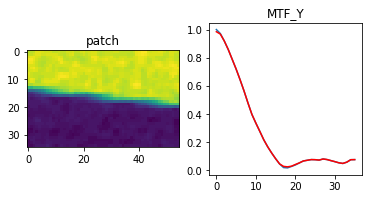

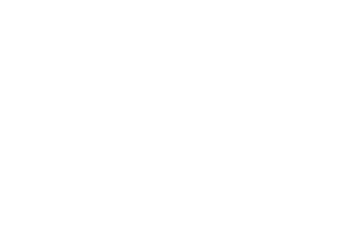

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]


epoch_loss = 0.0003999235341325402
Epoch 324/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

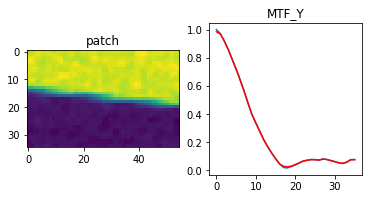

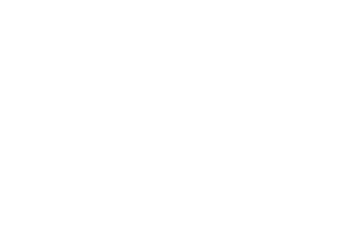

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]


epoch_loss = 0.00039718765765428543
Epoch 325/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

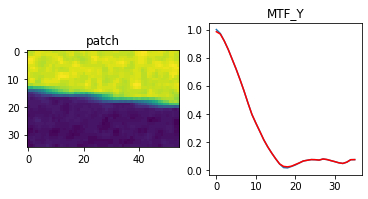

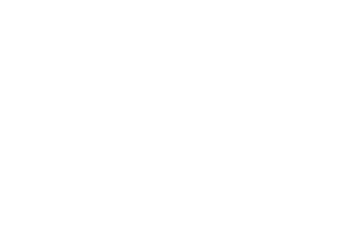

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]


epoch_loss = 0.00039448196184821427
Epoch 326/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

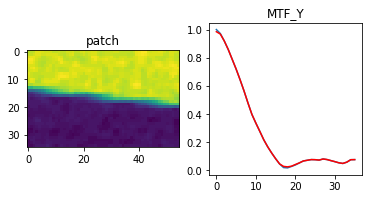

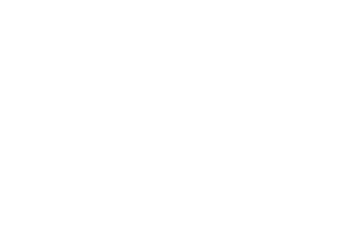

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]


epoch_loss = 0.0003918065340258181
Epoch 327/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

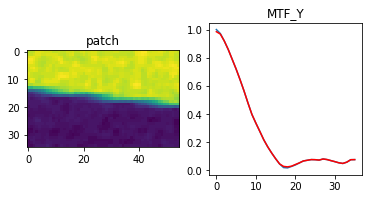

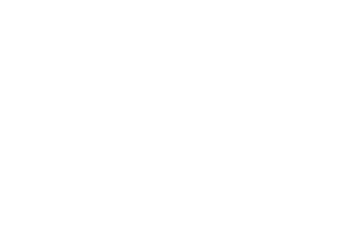

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 0.0003891543601639569
Epoch 328/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

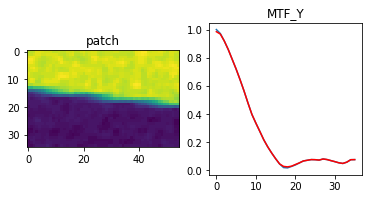

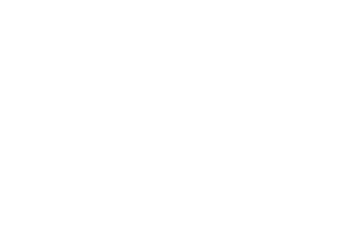

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 0.00038652788498438895
Epoch 329/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

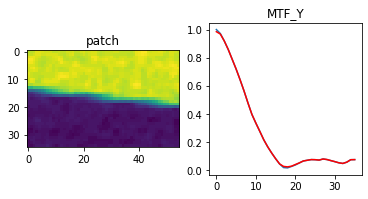

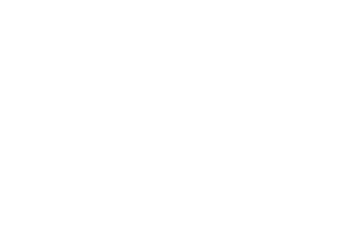

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 0.0003839277196675539
Epoch 330/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

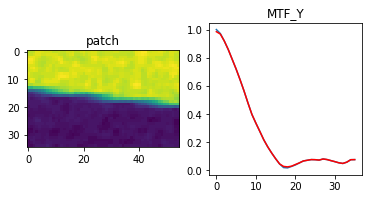

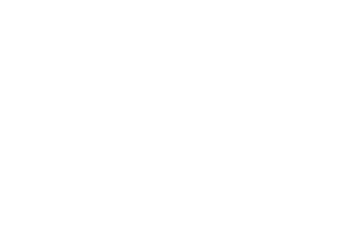

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.90it/s]


epoch_loss = 0.0003813534276559949
Epoch 331/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

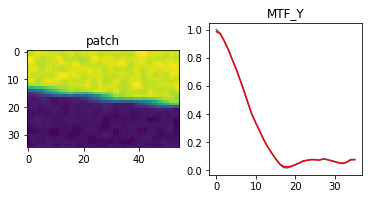

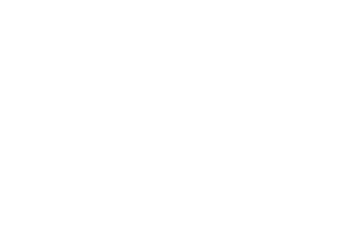

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 0.0003788076573982835
Epoch 332/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

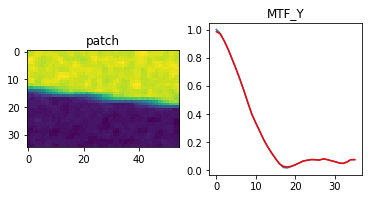

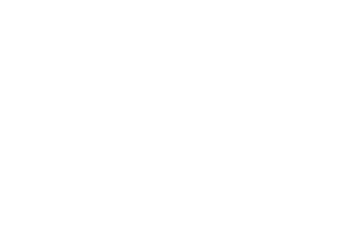

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 0.0003762833366636187
Epoch 333/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

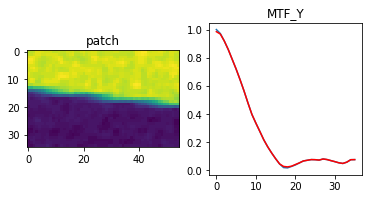

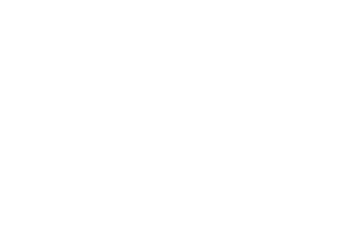

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.0003737857041414827
Epoch 334/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

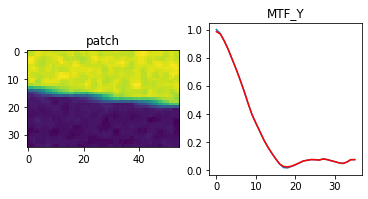

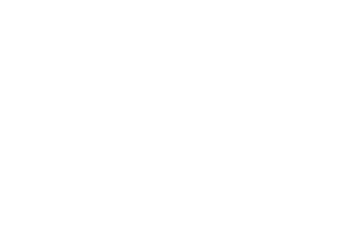

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 0.0003713119658641517
Epoch 335/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

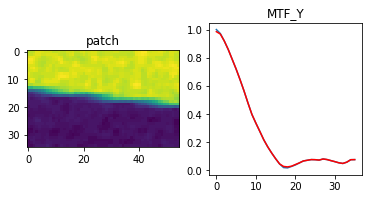

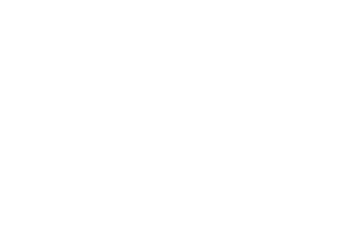

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 0.0003688607830554247
Epoch 336/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

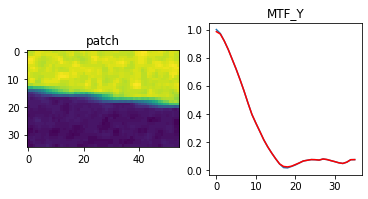

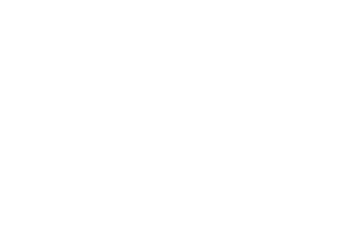

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]


epoch_loss = 0.0003664362011477351
Epoch 337/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

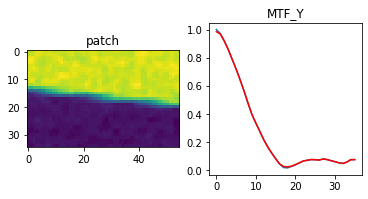

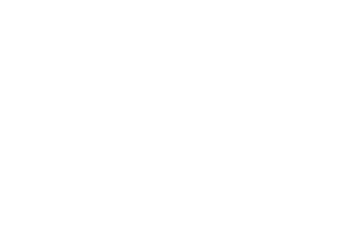

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.81it/s]


epoch_loss = 0.00036403321428224444
Epoch 338/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

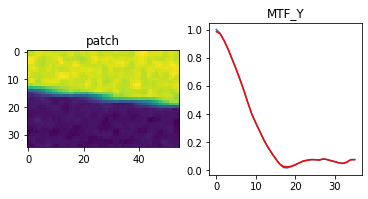

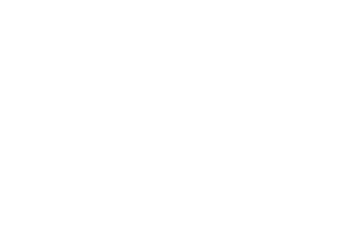

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.88it/s]


epoch_loss = 0.00036165447090752423
Epoch 339/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

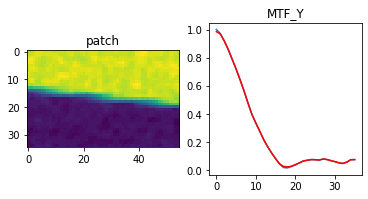

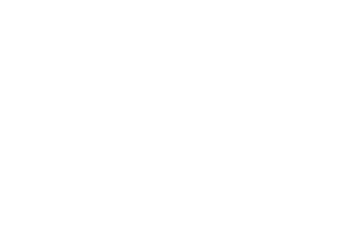

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]


epoch_loss = 0.0003592972061596811
Epoch 340/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

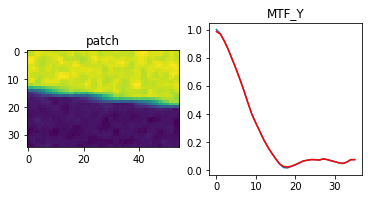

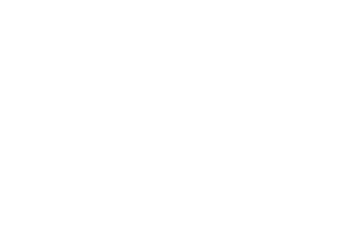

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]


epoch_loss = 0.00035696447594091296
Epoch 341/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

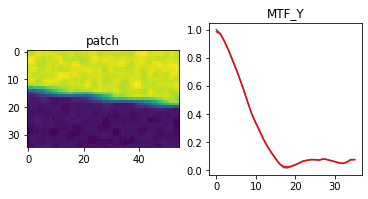

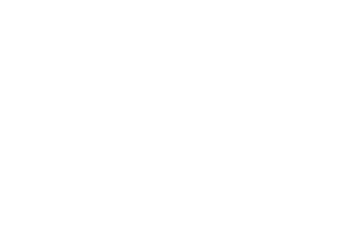

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.33it/s]


epoch_loss = 0.00035465182736516
Epoch 342/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

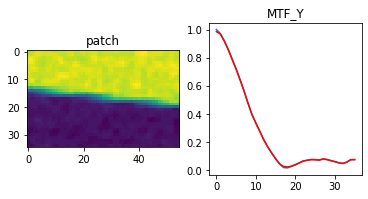

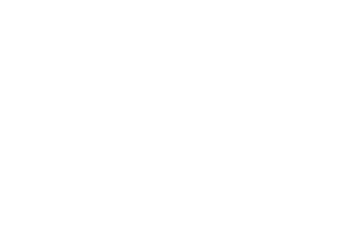

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]


epoch_loss = 0.0003523634222801775
Epoch 343/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

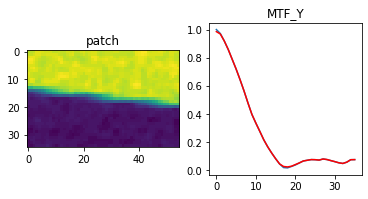

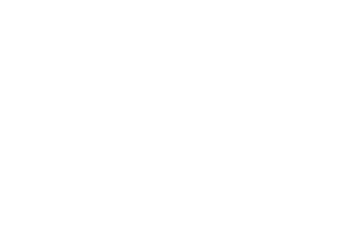

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.91it/s]


epoch_loss = 0.00035009789280593395
Epoch 344/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

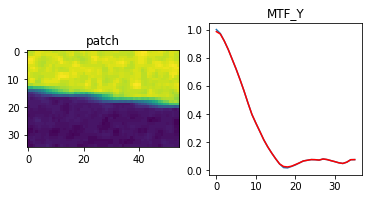

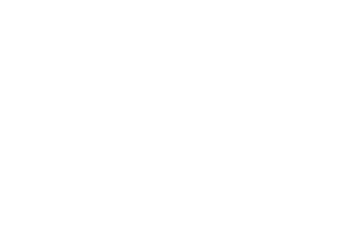

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.91it/s]


epoch_loss = 0.0003478555881883949
Epoch 345/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

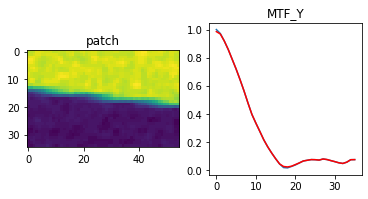

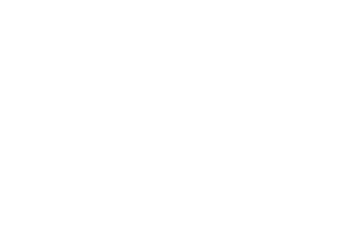

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.31it/s]


epoch_loss = 0.00034563016379252076
Epoch 346/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

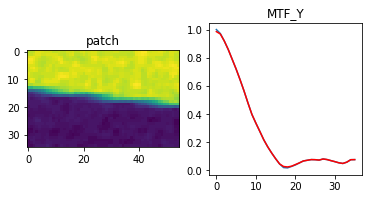

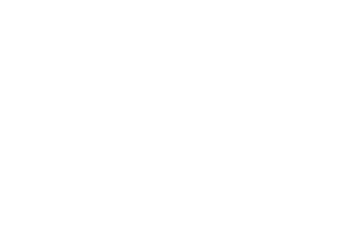

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 0.00034342450089752674
Epoch 347/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

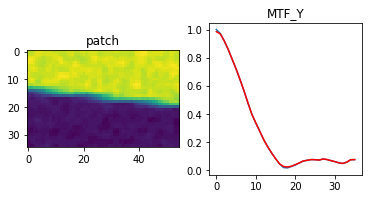

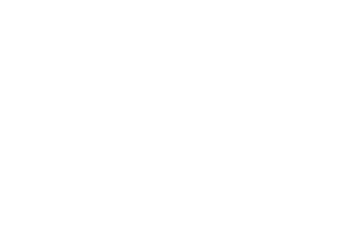

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]


epoch_loss = 0.0003412430523894727
Epoch 348/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

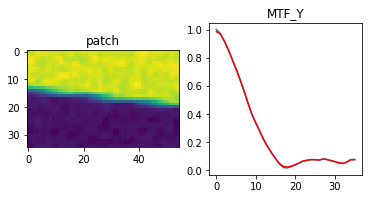

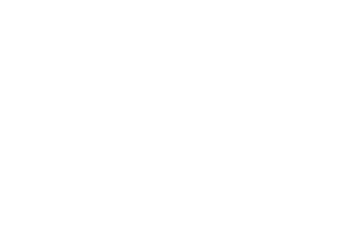

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 0.0003390850324649364
Epoch 349/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

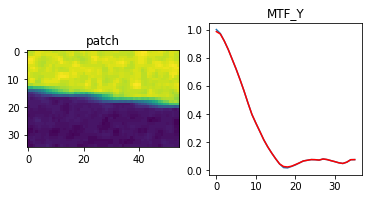

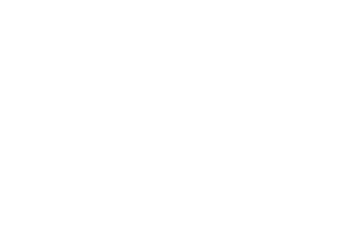

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 0.00033694057492539287
Epoch 350/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

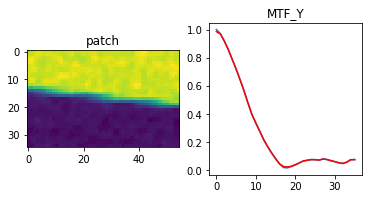

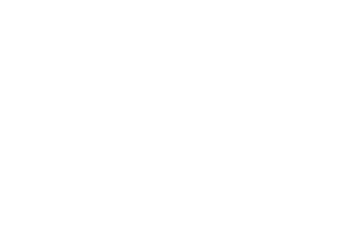

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 0.0003348200407344848
Epoch 351/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

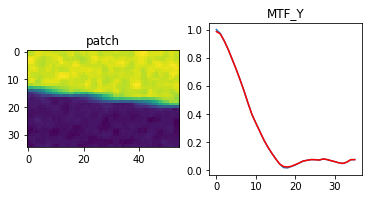

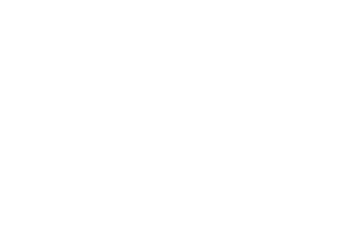

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.31it/s]


epoch_loss = 0.0003327195590827614
Epoch 352/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

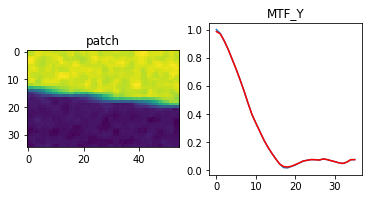

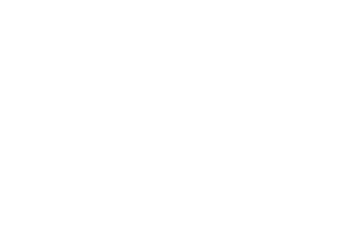

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]


epoch_loss = 0.00033064078888855875
Epoch 353/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

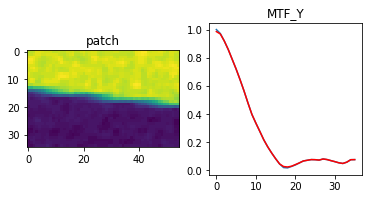

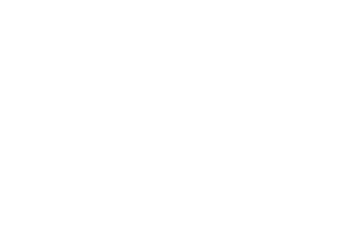

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 0.00032857622136361897
Epoch 354/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

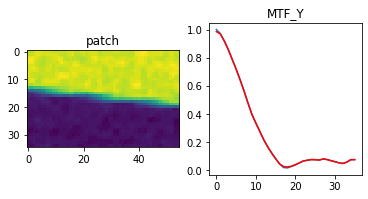

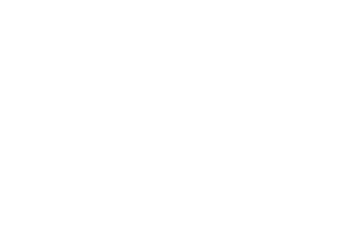

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.00032653508242219687
Epoch 355/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

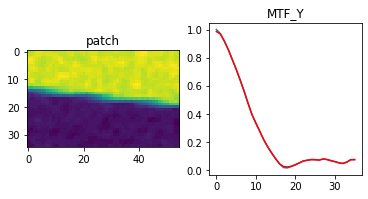

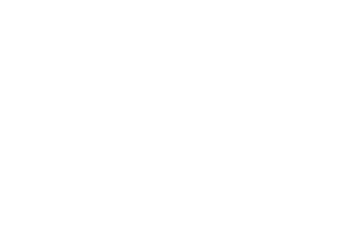

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 0.0003245109983254224
Epoch 356/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

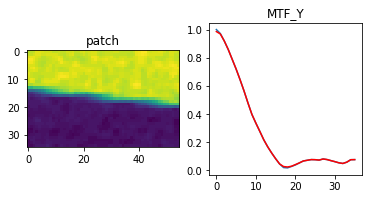

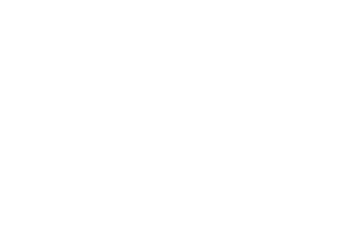

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]


epoch_loss = 0.00032250655931420624
Epoch 357/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

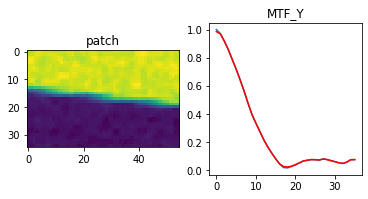

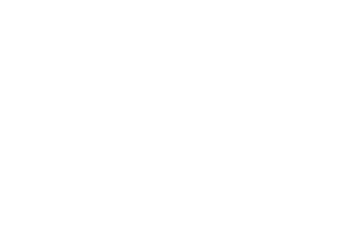

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 0.00032051821472123265
Epoch 358/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

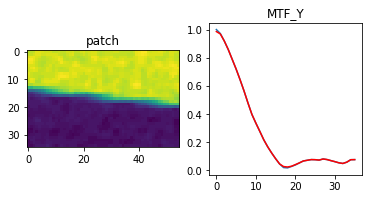

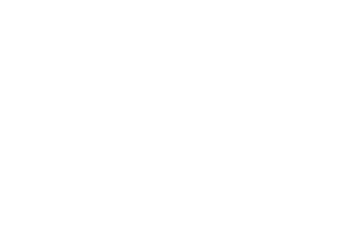

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]


epoch_loss = 0.0003185521927662194
Epoch 359/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

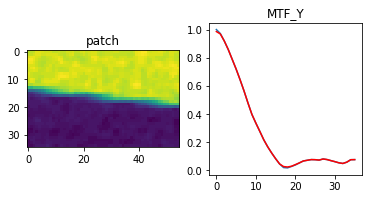

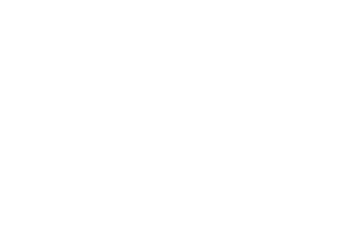

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 0.0003165994421578944
Epoch 360/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

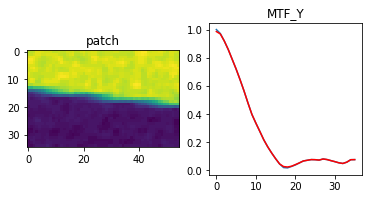

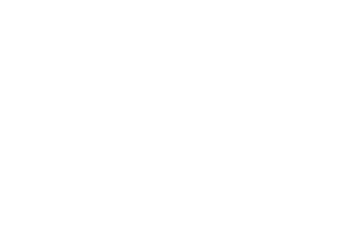

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 0.00031466924701817334
Epoch 361/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

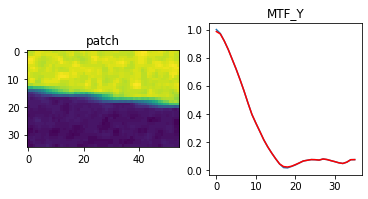

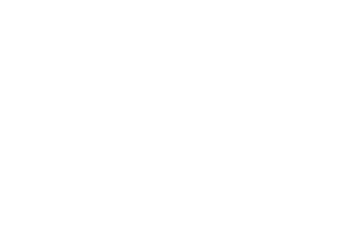

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]


epoch_loss = 0.00031275427318178117
Epoch 362/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

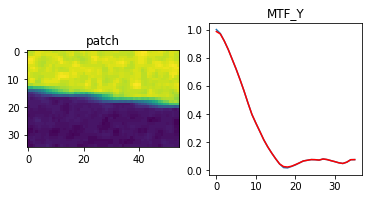

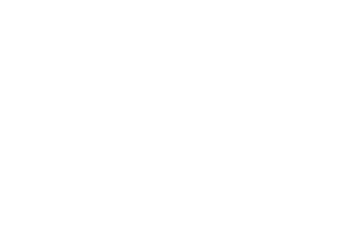

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.58it/s]


epoch_loss = 0.00031085696537047625
Epoch 363/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

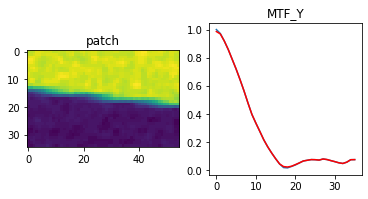

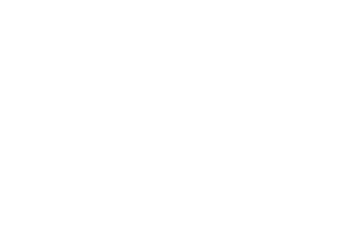

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.30it/s]


epoch_loss = 0.0003089762758463621
Epoch 364/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

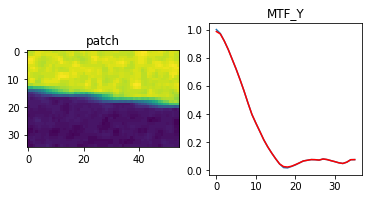

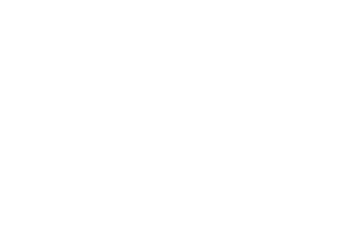

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.33it/s]


epoch_loss = 0.00030711604631505907
Epoch 365/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

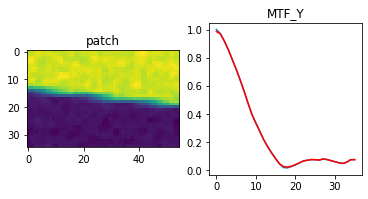

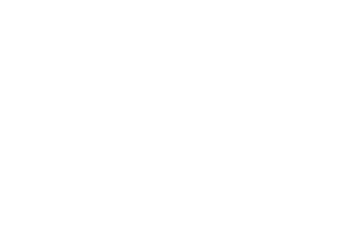

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.35it/s]


epoch_loss = 0.00030526830232702196
Epoch 366/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

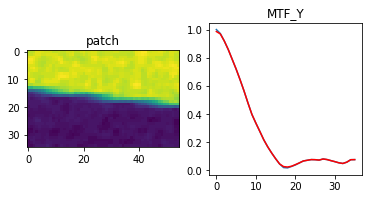

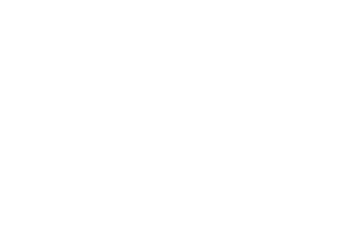

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]


epoch_loss = 0.0003034378751181066
Epoch 367/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

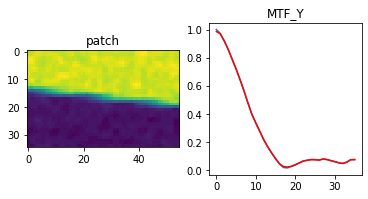

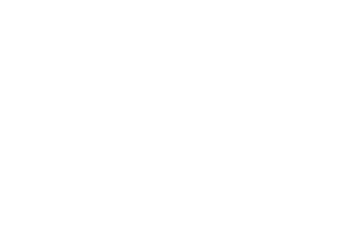

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]


epoch_loss = 0.00030162694747559726
Epoch 368/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

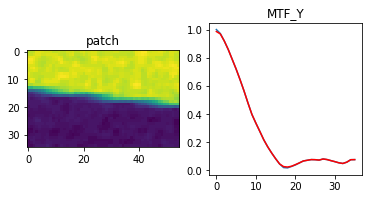

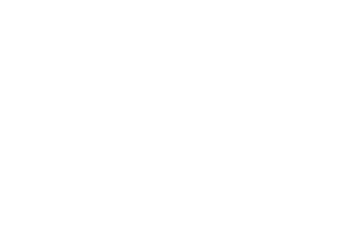

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]


epoch_loss = 0.0002998299023602158
Epoch 369/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

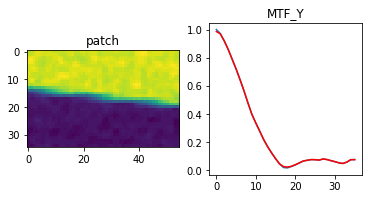

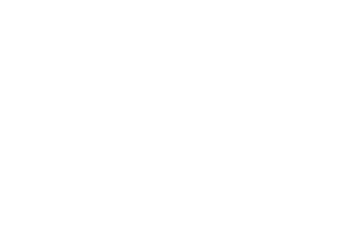

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.36it/s]


epoch_loss = 0.00029805139638483524
Epoch 370/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

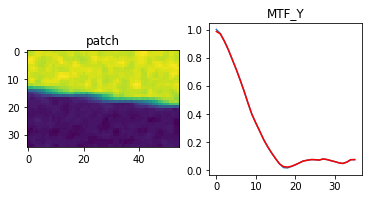

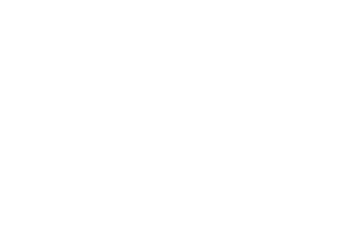

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.70it/s]


epoch_loss = 0.0002962848811876029
Epoch 371/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

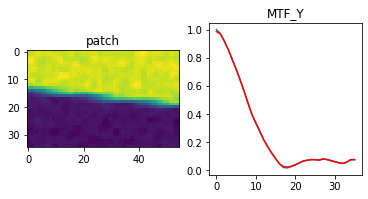

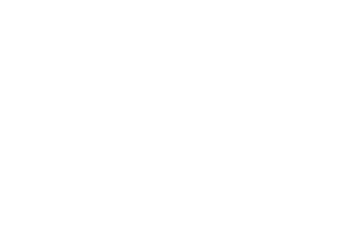

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 0.00029453542083501816
Epoch 372/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

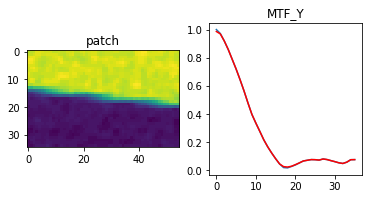

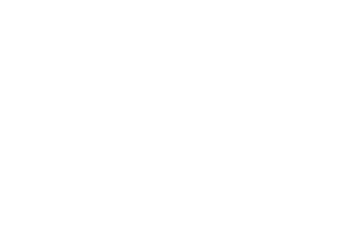

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.65it/s]


epoch_loss = 0.00029280150192789733
Epoch 373/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

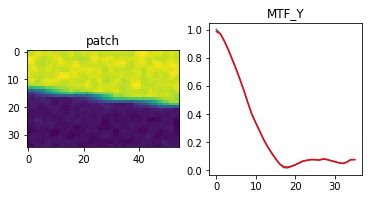

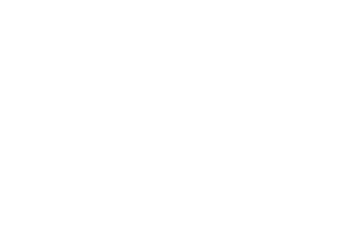

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]


epoch_loss = 0.000291084055788815
Epoch 374/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

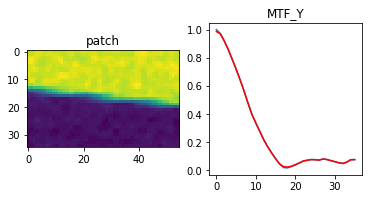

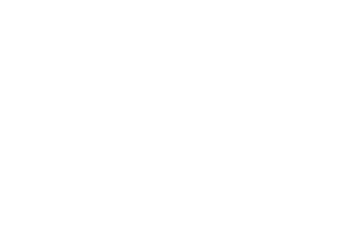

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 0.00028938284958712757
Epoch 375/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

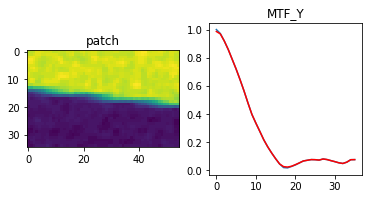

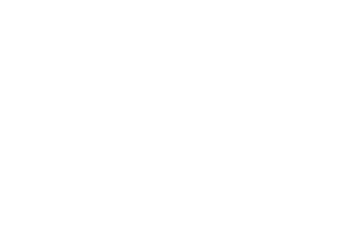

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 0.000287694507278502
Epoch 376/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

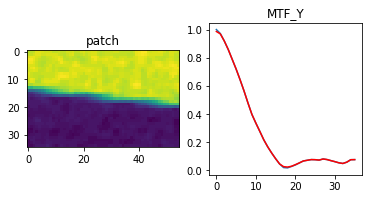

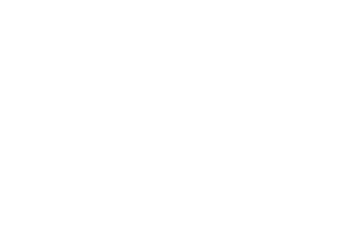

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.41it/s]


epoch_loss = 0.0002860214444808662
Epoch 377/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

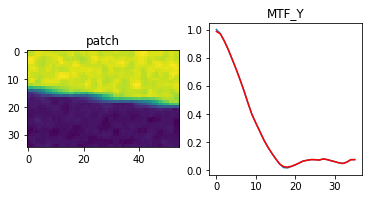

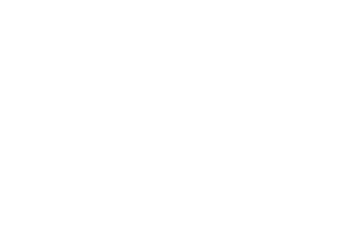

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.58it/s]


epoch_loss = 0.0002843668044079095
Epoch 378/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

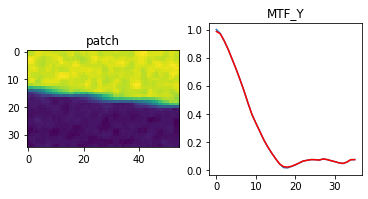

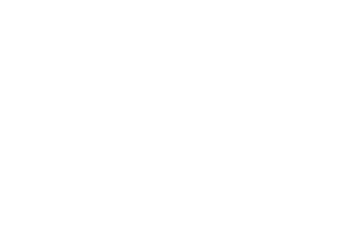

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 0.00028272109921090305
Epoch 379/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

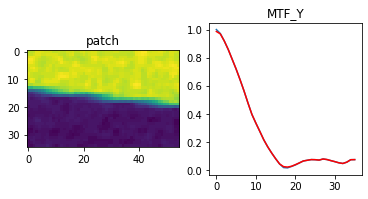

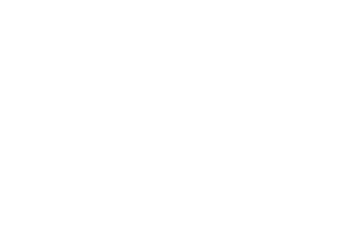

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.74it/s]


epoch_loss = 0.0002810925943776965
Epoch 380/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

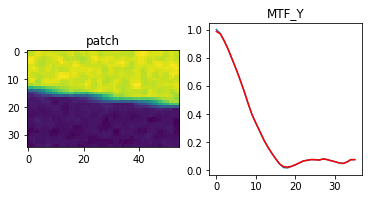

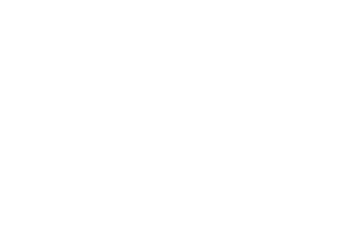

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.14it/s]


epoch_loss = 0.0002794769243337214
Epoch 381/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

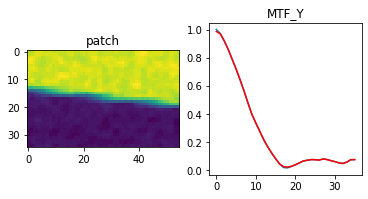

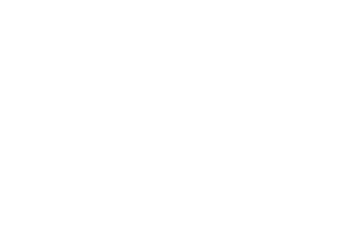

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 0.00027787539875134826
Epoch 382/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

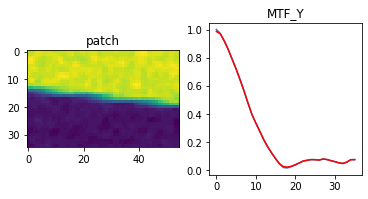

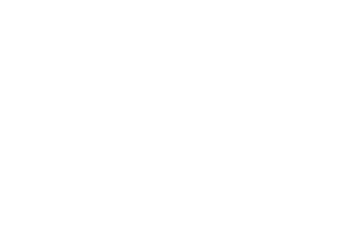

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 0.00027629153919406235
Epoch 383/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

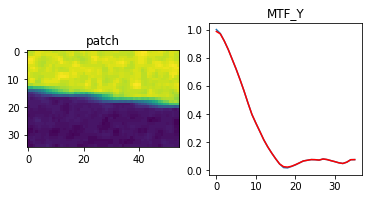

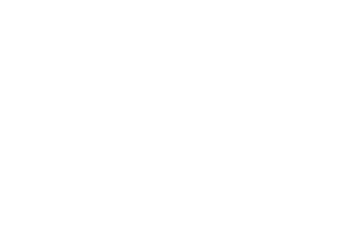

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]


epoch_loss = 0.00027471737121231854
Epoch 384/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

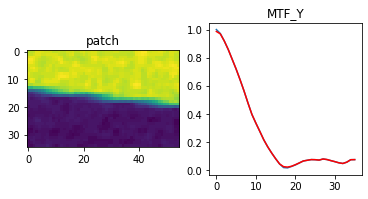

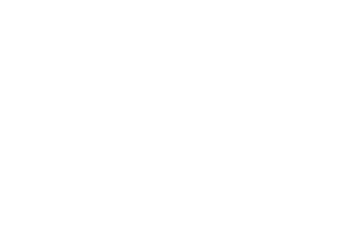

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 0.00027315845363773406
Epoch 385/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

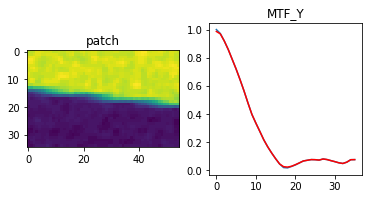

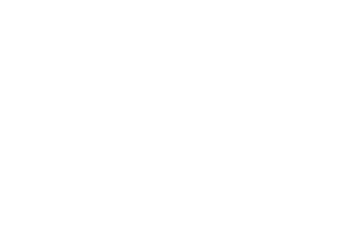

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 0.0002716118760872632
Epoch 386/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

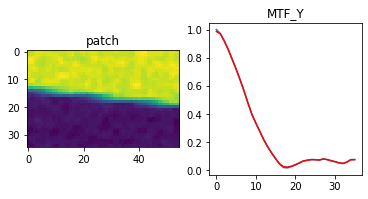

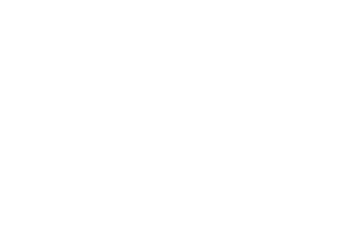

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.90it/s]


epoch_loss = 0.00027007836615666747
Epoch 387/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

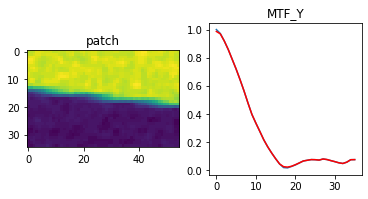

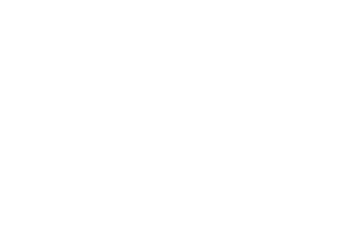

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.24it/s]


epoch_loss = 0.00026855862233787775
Epoch 388/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

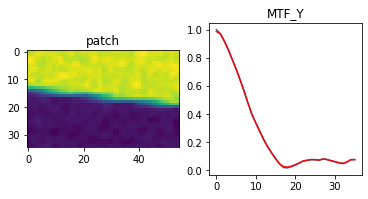

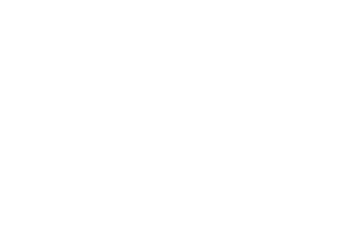

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.86it/s]


epoch_loss = 0.00026705217896960676
Epoch 389/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

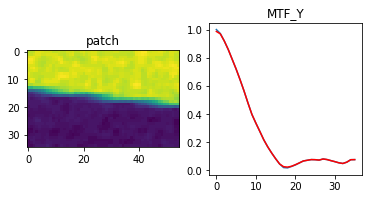

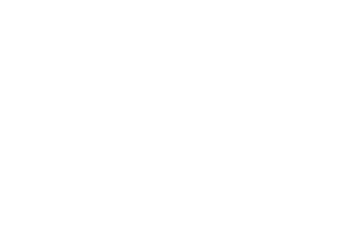

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.68it/s]


epoch_loss = 0.00026555886142887175
Epoch 390/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

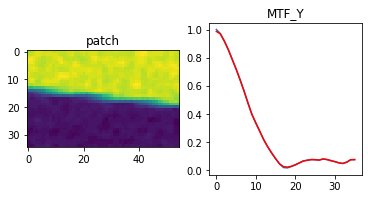

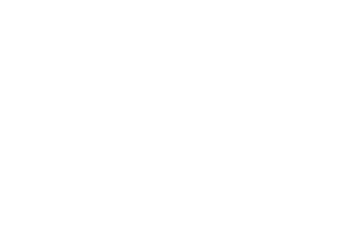

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.45it/s]


epoch_loss = 0.0002640785533003509
Epoch 391/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

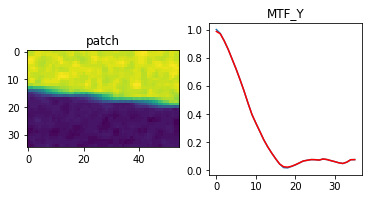

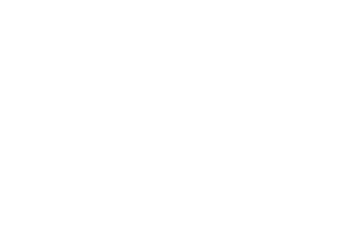

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 0.0002626078494358808
Epoch 392/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

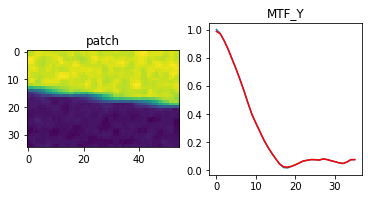

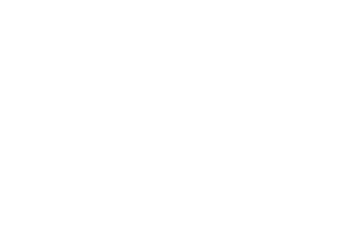

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 0.0002611532108858228
Epoch 393/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

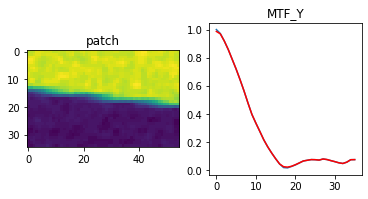

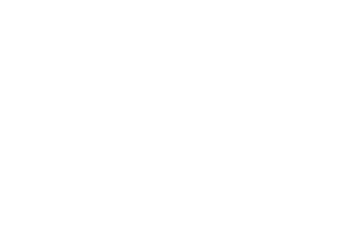

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.03it/s]


epoch_loss = 0.00025970939896069467
Epoch 394/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

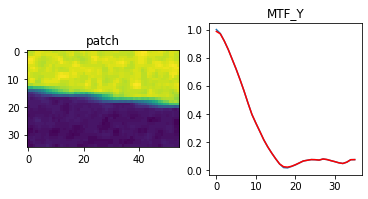

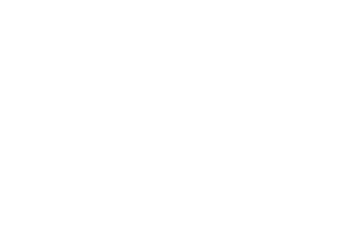

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.38it/s]


epoch_loss = 0.00025827629724517465
Epoch 395/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

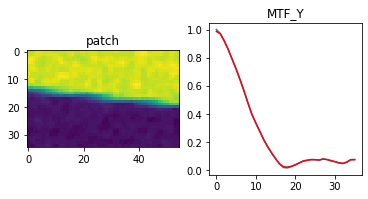

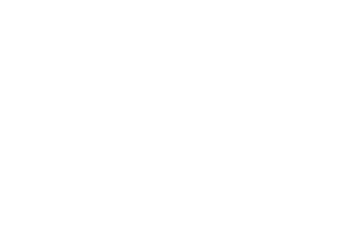

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 0.0002568592317402363
Epoch 396/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

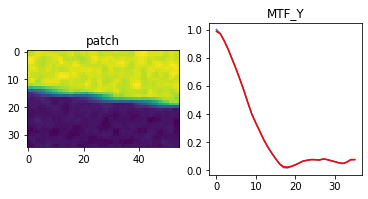

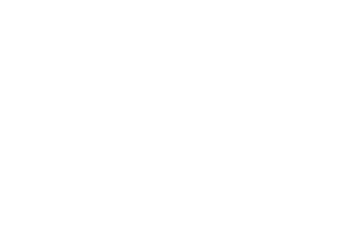

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.00025544967502355576
Epoch 397/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

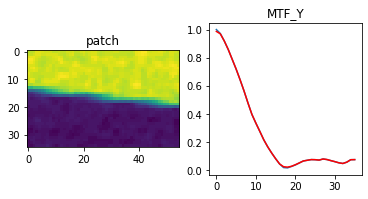

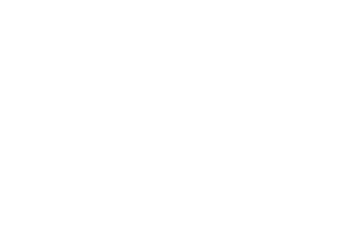

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 0.0002540528657846153
Epoch 398/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

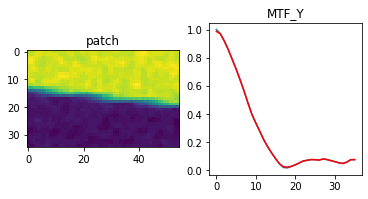

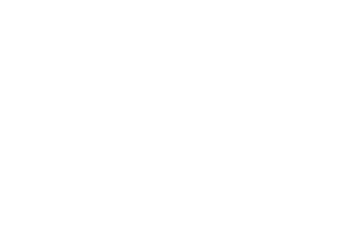

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 0.00025266935699619353
Epoch 399/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

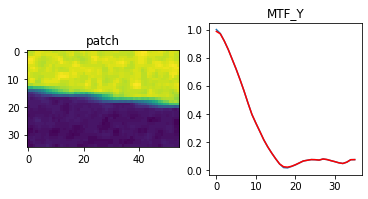

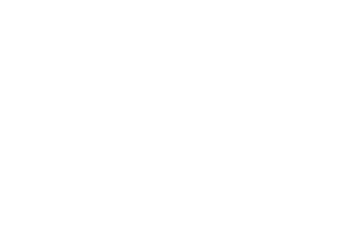

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.01it/s]


epoch_loss = 0.00025129609275609255
Epoch 400/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

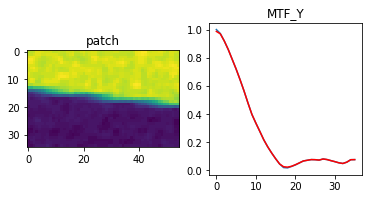

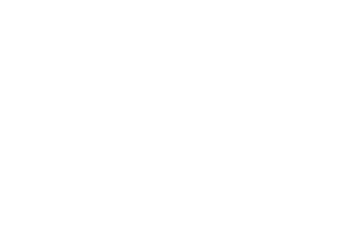

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.06it/s]


epoch_loss = 0.000249934644671157
Epoch 401/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

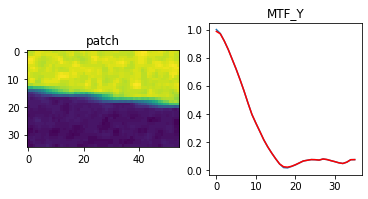

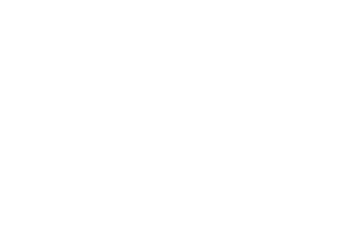

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]


epoch_loss = 0.0002485854201950133
Epoch 402/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

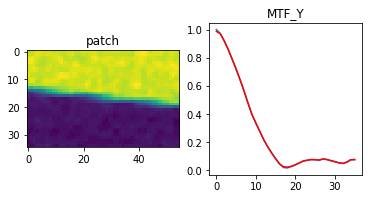

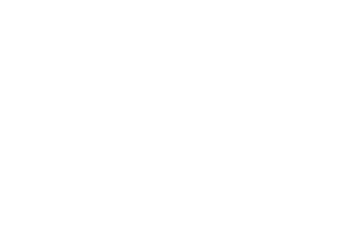

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]


epoch_loss = 0.00024724414106458426
Epoch 403/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

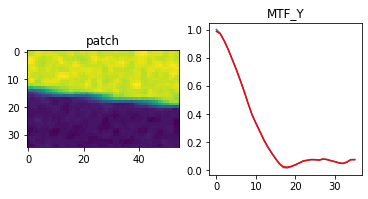

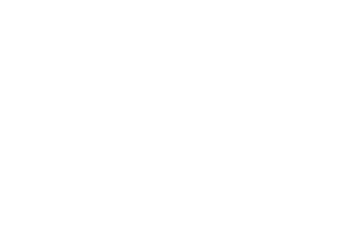

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 0.00024591846158728004
Epoch 404/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

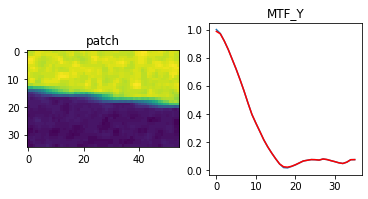

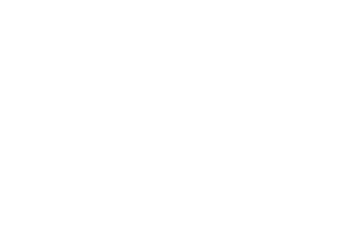

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 0.0002446008729748428
Epoch 405/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

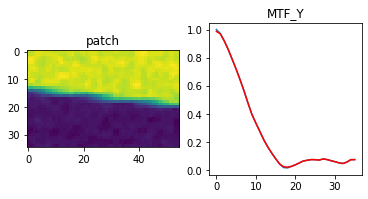

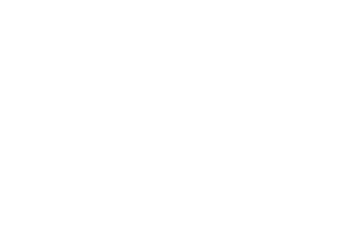

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.23it/s]


epoch_loss = 0.00024329440202564
Epoch 406/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

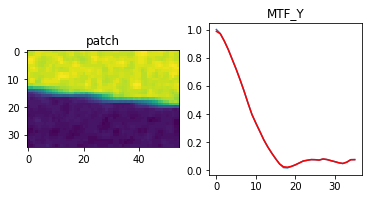

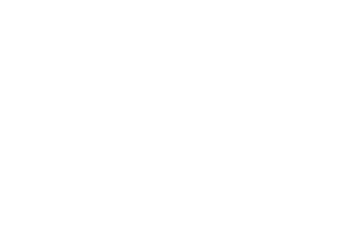

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]


epoch_loss = 0.00024199913605116308
Epoch 407/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

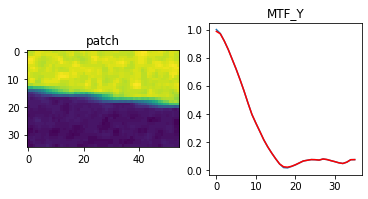

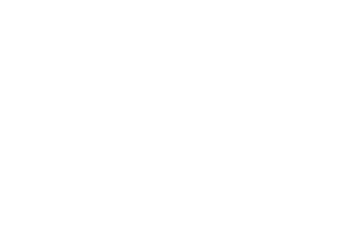

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.83it/s]


epoch_loss = 0.00024071545340120792
Epoch 408/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

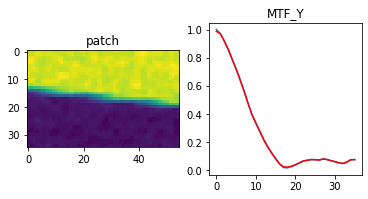

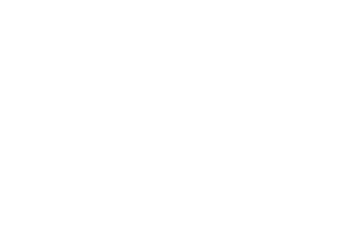

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 0.00023944131680764258
Epoch 409/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

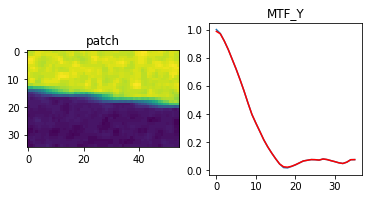

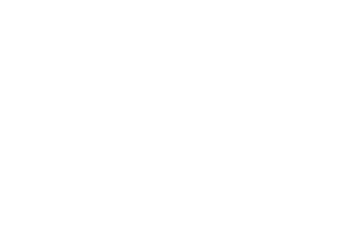

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]


epoch_loss = 0.0002381759404670447
Epoch 410/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

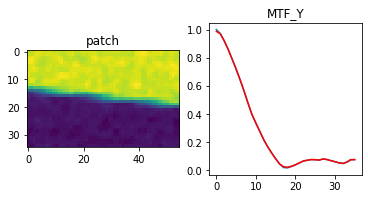

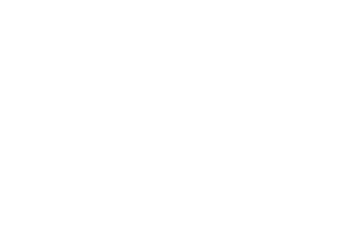

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.81it/s]


epoch_loss = 0.00023692537797614932
Epoch 411/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

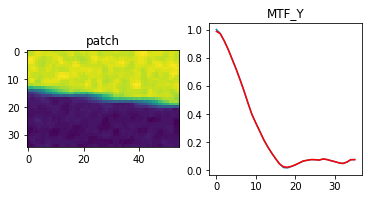

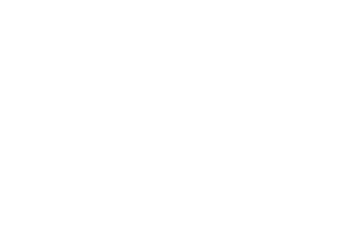

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]


epoch_loss = 0.00023568046162836254
Epoch 412/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

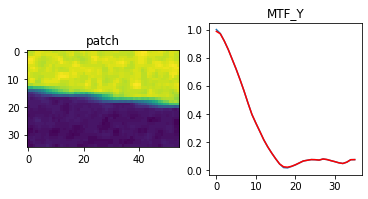

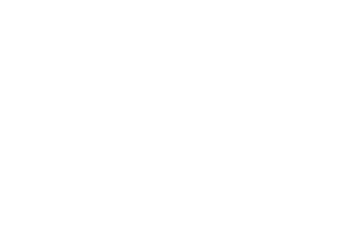

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]


epoch_loss = 0.00023444797261618078
Epoch 413/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

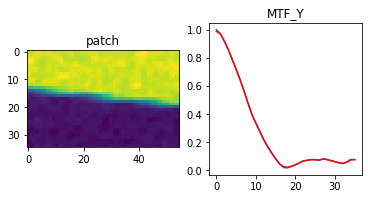

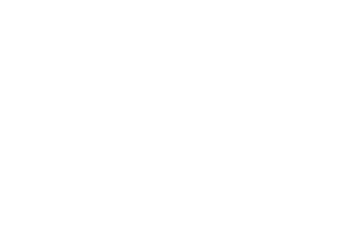

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.04it/s]


epoch_loss = 0.00023322177003137767
Epoch 414/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

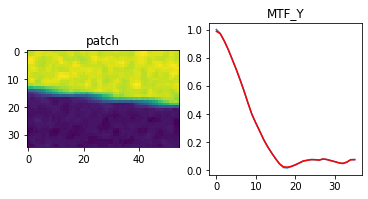

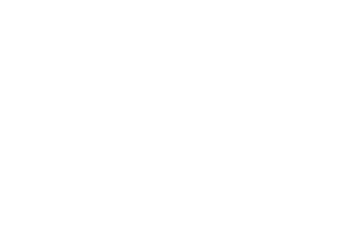

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.46it/s]


epoch_loss = 0.00023200905707199126
Epoch 415/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

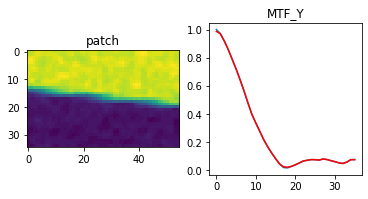

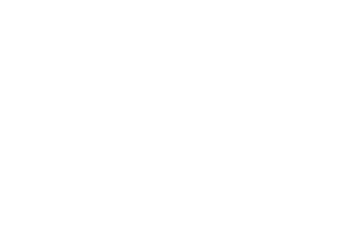

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]


epoch_loss = 0.00023080535174813122
Epoch 416/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

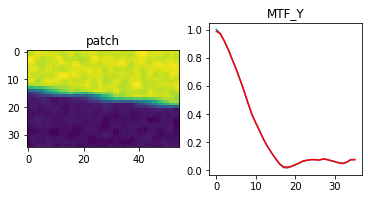

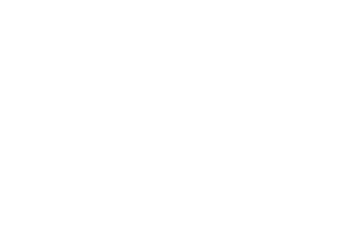

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.40it/s]


epoch_loss = 0.00022961331706028432
Epoch 417/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

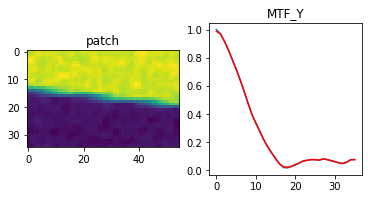

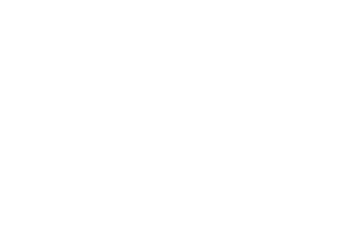

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.70it/s]


epoch_loss = 0.00022842841281089932
Epoch 418/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

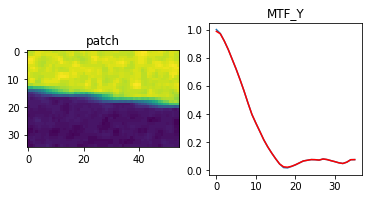

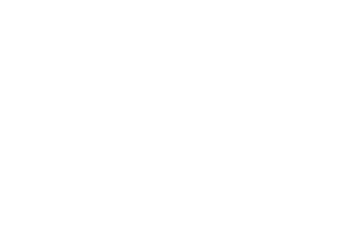

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]


epoch_loss = 0.00022725151211488992
Epoch 419/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

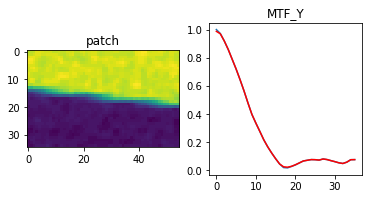

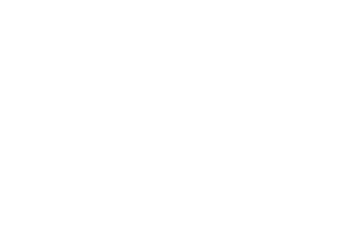

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 0.0002260869659949094
Epoch 420/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

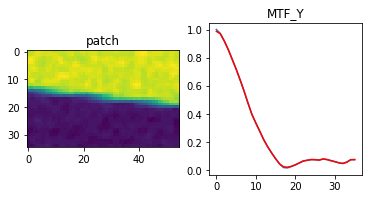

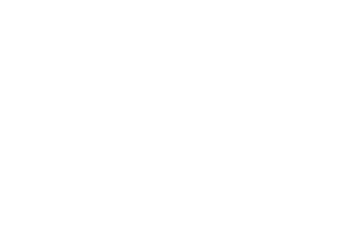

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 0.000224929244723171
Epoch 421/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

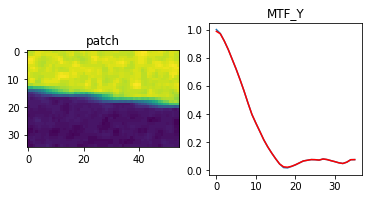

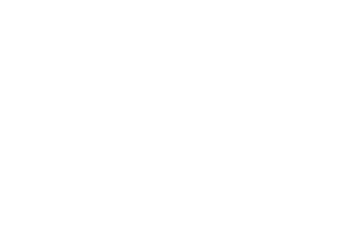

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]


epoch_loss = 0.00022378185531124473
Epoch 422/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

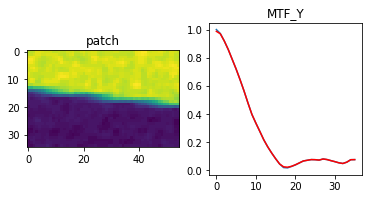

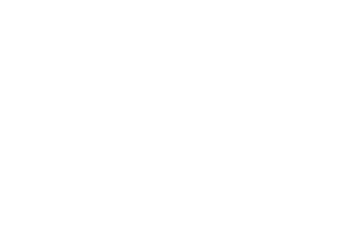

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]


epoch_loss = 0.00022264405561145395
Epoch 423/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

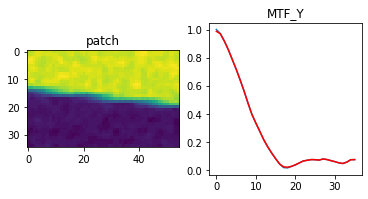

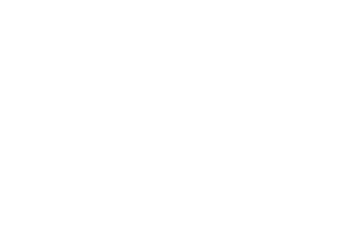

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]


epoch_loss = 0.000221513444557786
Epoch 424/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

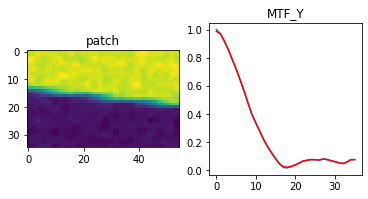

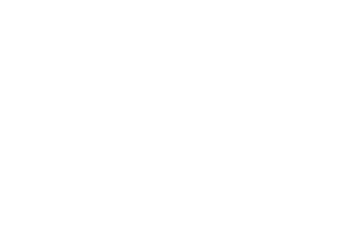

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]


epoch_loss = 0.00022039396571926773
Epoch 425/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

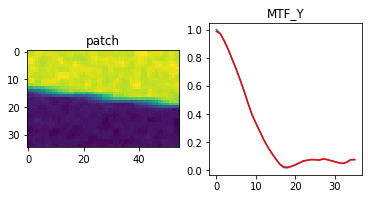

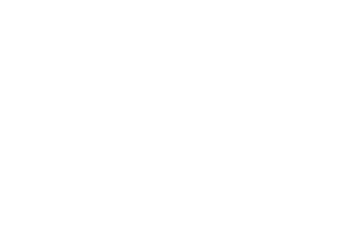

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.58it/s]


epoch_loss = 0.00021928257774561644
Epoch 426/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

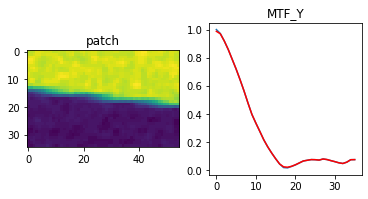

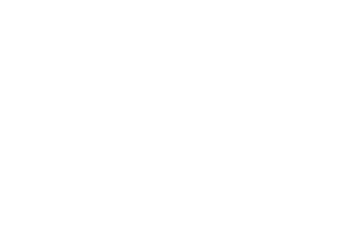

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]


epoch_loss = 0.00021818056120537221
Epoch 427/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

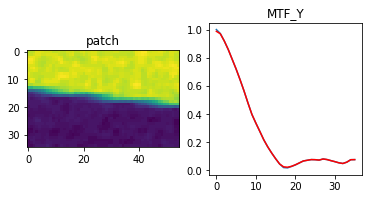

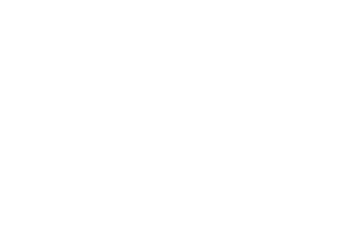

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]


epoch_loss = 0.00021708363783545792
Epoch 428/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

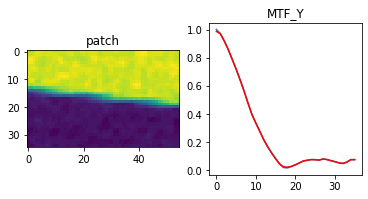

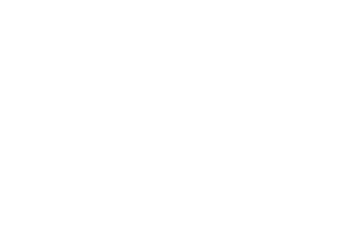

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]


epoch_loss = 0.00021599768660962582
Epoch 429/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

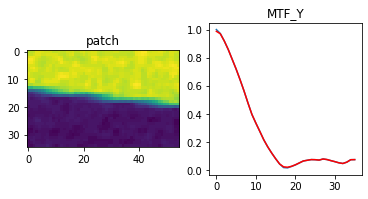

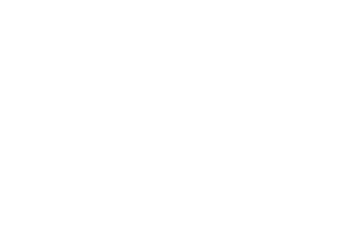

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 0.00021491938969120383
Epoch 430/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

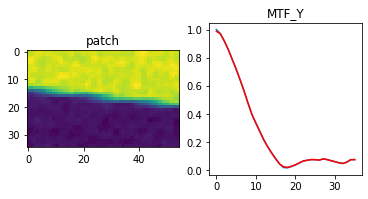

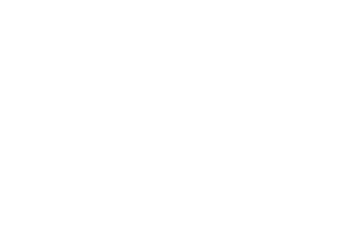

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.00021385181753430516
Epoch 431/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

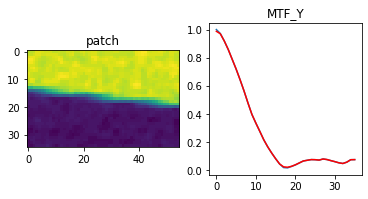

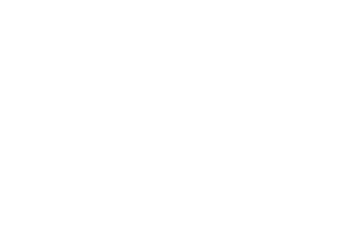

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 0.00021278890199027956
Epoch 432/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

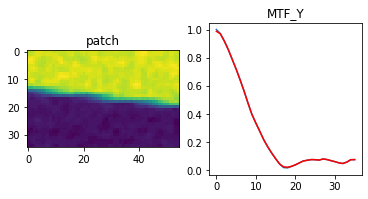

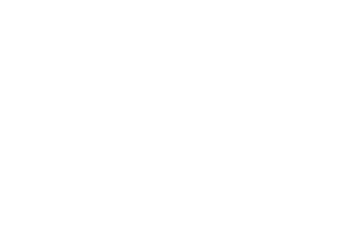

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 0.00021173828281462193
Epoch 433/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

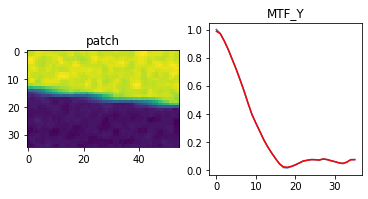

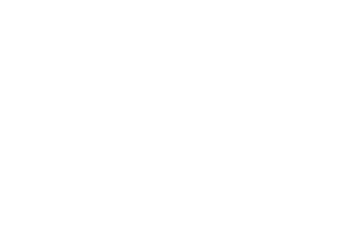

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.56it/s]


epoch_loss = 0.00021069246577098966
Epoch 434/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

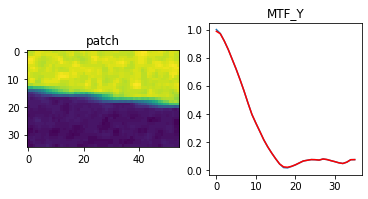

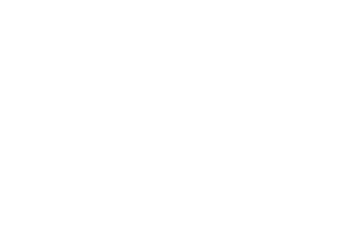

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.30it/s]


epoch_loss = 0.00020965683506801724
Epoch 435/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

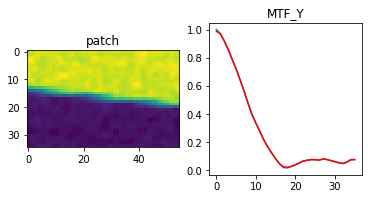

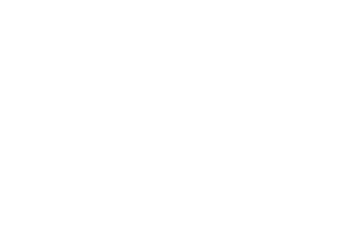

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]


epoch_loss = 0.0002086269378196448
Epoch 436/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

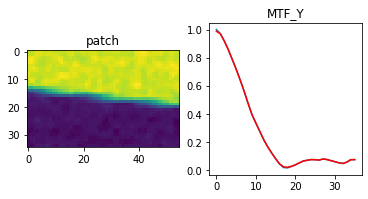

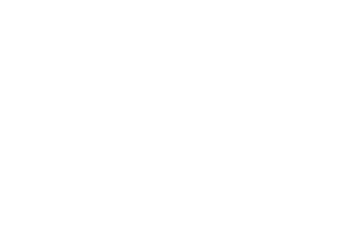

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.67it/s]


epoch_loss = 0.00020760578627232462
Epoch 437/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

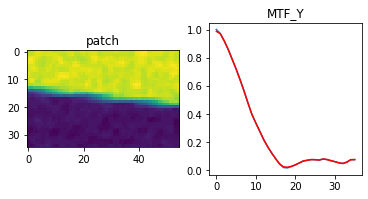

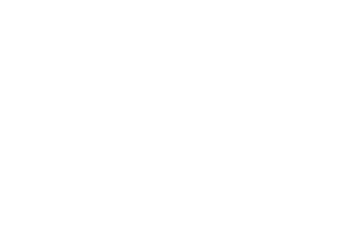

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]


epoch_loss = 0.0002065939479507506
Epoch 438/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

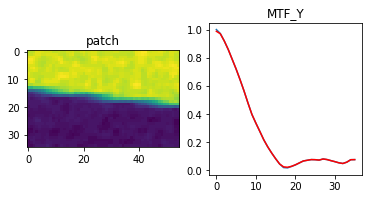

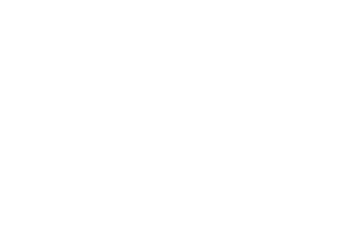

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.58it/s]


epoch_loss = 0.0002055879303952679
Epoch 439/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

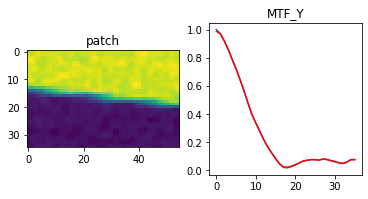

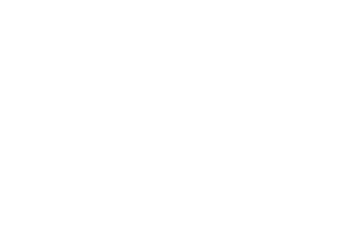

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.81it/s]


epoch_loss = 0.00020458977087400854
Epoch 440/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

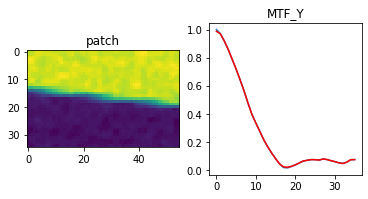

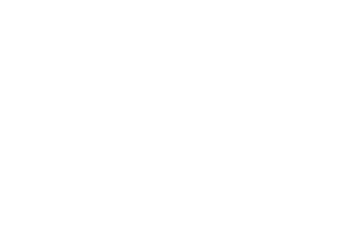

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.73it/s]


epoch_loss = 0.00020360072085168213
Epoch 441/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

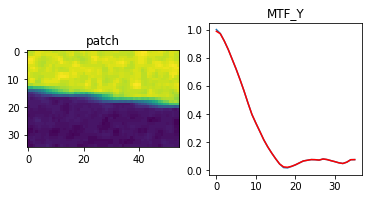

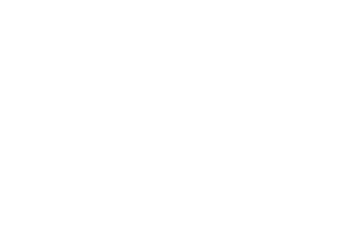

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.34it/s]


epoch_loss = 0.00020261724421288818
Epoch 442/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

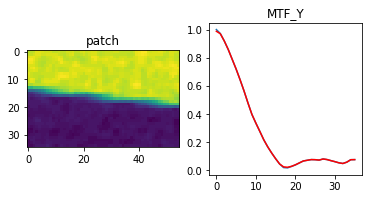

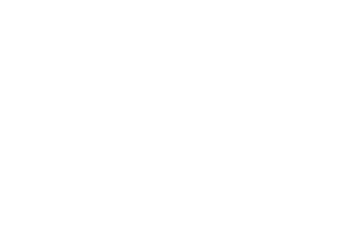

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.98it/s]


epoch_loss = 0.00020164161105640233
Epoch 443/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

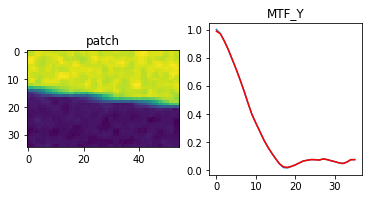

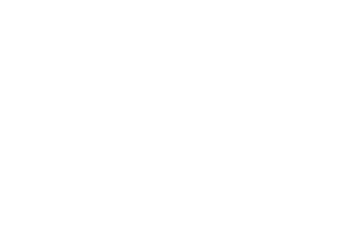

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]


epoch_loss = 0.00020067521836608648
Epoch 444/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

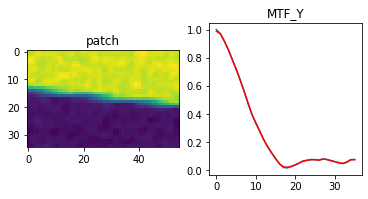

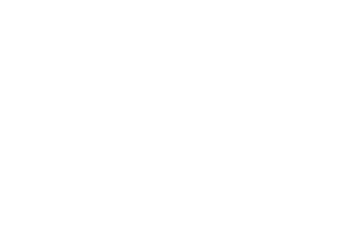

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 0.00019971544679719955
Epoch 445/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

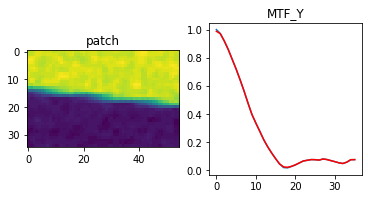

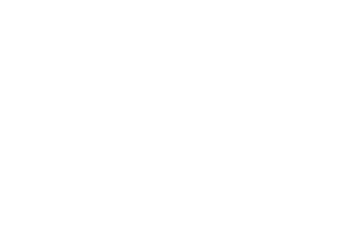

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]


epoch_loss = 0.00019876194710377604
Epoch 446/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

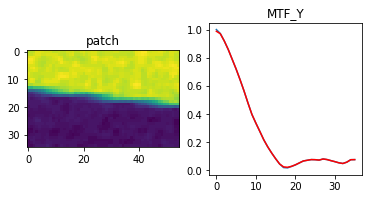

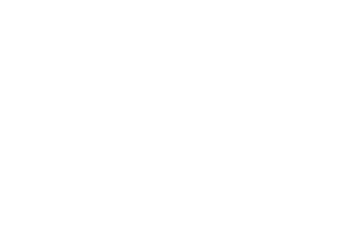

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]


epoch_loss = 0.0001978144282475114
Epoch 447/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

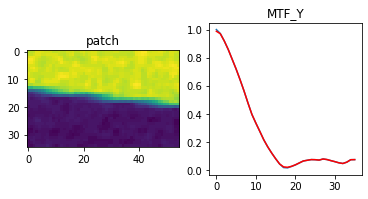

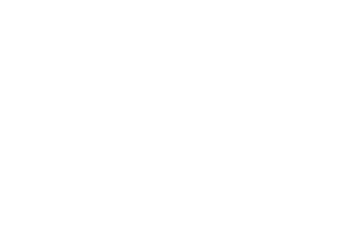

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.77it/s]


epoch_loss = 0.00019687604799401015
Epoch 448/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

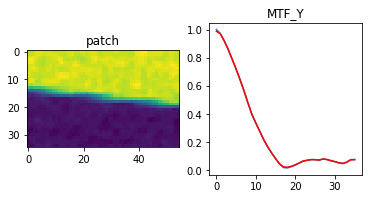

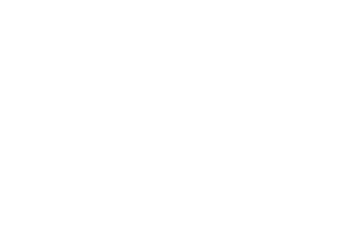

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]


epoch_loss = 0.00019594420155044645
Epoch 449/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

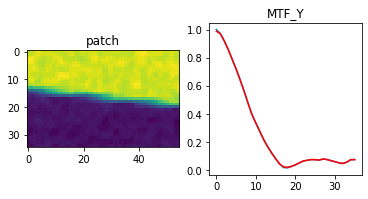

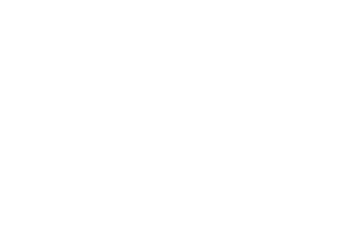

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.23it/s]


epoch_loss = 0.00019501926726661623
Epoch 450/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

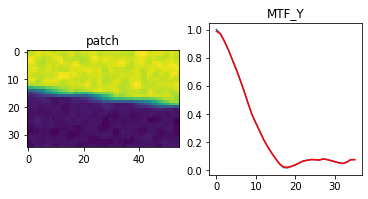

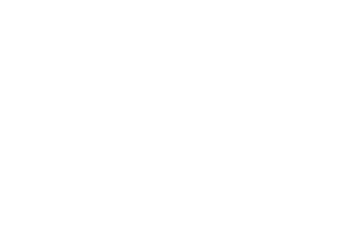

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]


epoch_loss = 0.00019410057575441897
Epoch 451/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

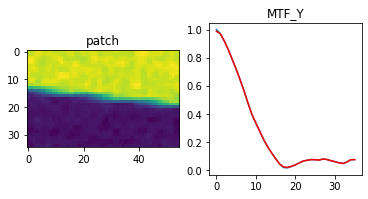

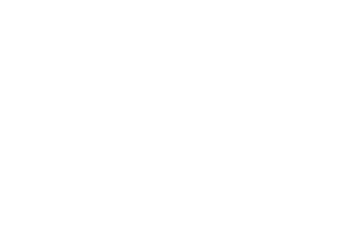

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 0.0001931883889483288
Epoch 452/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

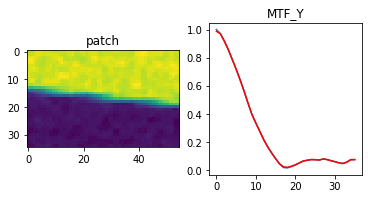

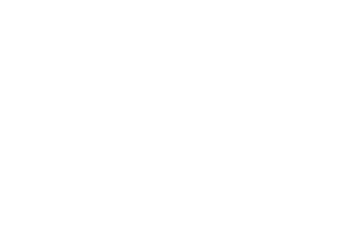

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.00019228244491387159
Epoch 453/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

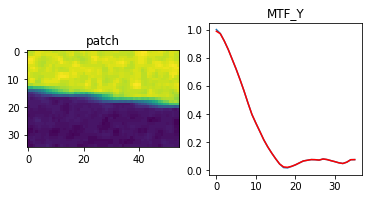

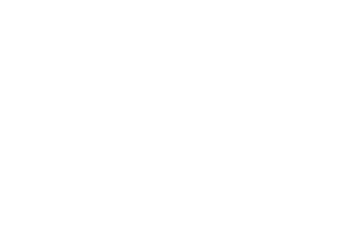

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]


epoch_loss = 0.00019138617790304124
Epoch 454/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

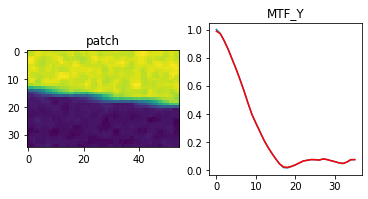

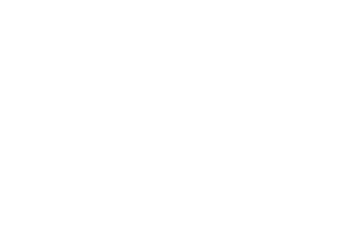

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 0.00019049443653784692
Epoch 455/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

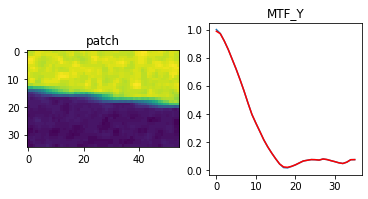

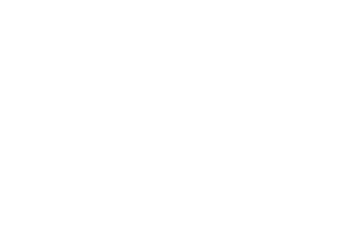

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 0.00018960738088935614
Epoch 456/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

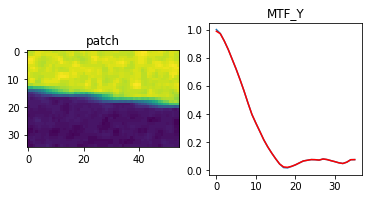

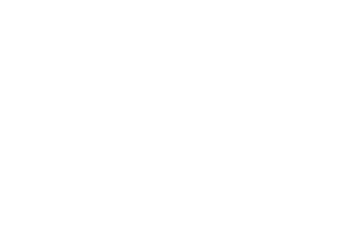

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]


epoch_loss = 0.00018872960936278105
Epoch 457/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

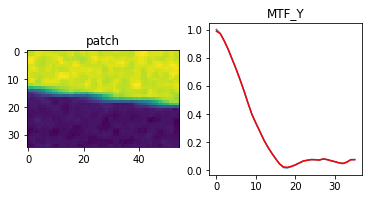

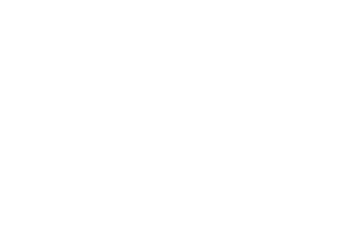

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 0.00018785794964060187
Epoch 458/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

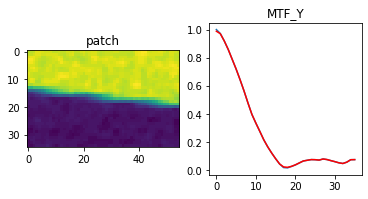

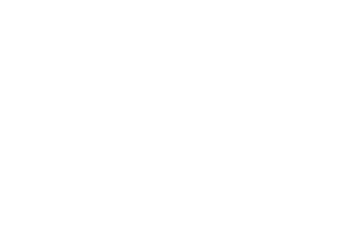

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]


epoch_loss = 0.00018699083011597395
Epoch 459/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

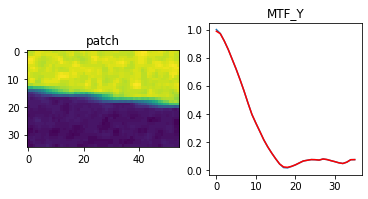

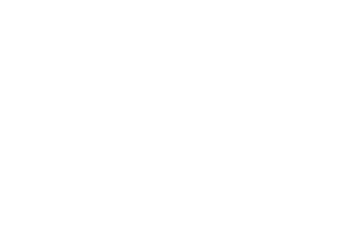

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.10it/s]


epoch_loss = 0.00018613124848343432
Epoch 460/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

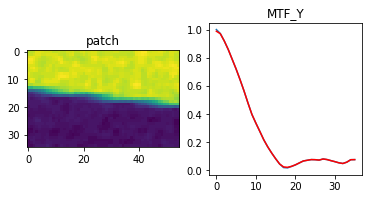

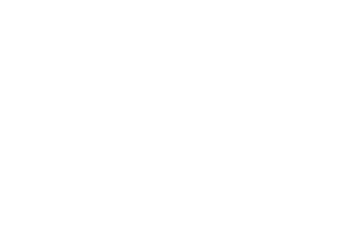

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.64it/s]


epoch_loss = 0.00018527904467191547
Epoch 461/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

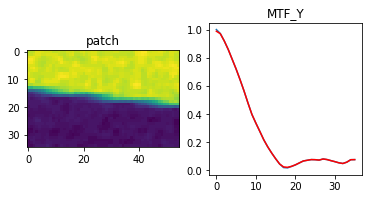

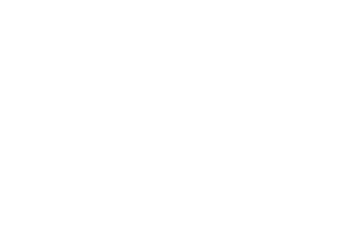

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 0.00018443130829837173
Epoch 462/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

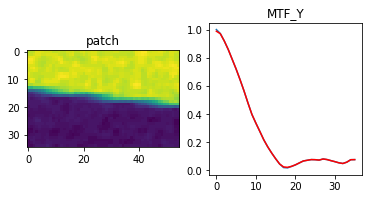

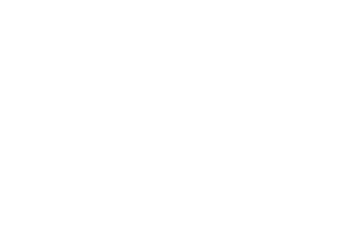

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.19it/s]


epoch_loss = 0.00018359074601903558
Epoch 463/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

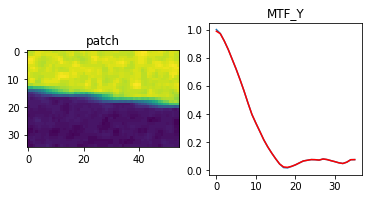

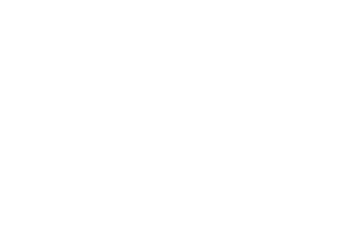

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.28it/s]


epoch_loss = 0.0001827546366257593
Epoch 464/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

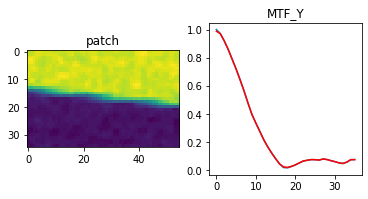

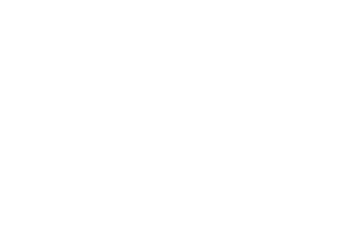

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]


epoch_loss = 0.00018192593415733427
Epoch 465/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

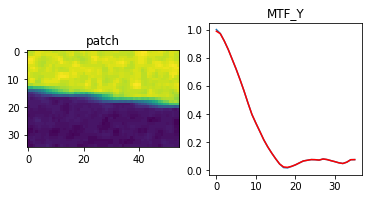

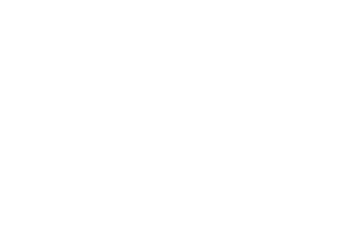

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.82it/s]


epoch_loss = 0.0001811028050724417
Epoch 466/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

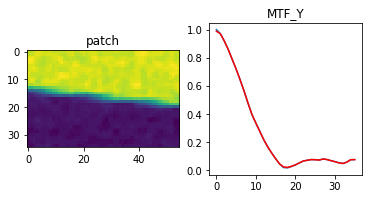

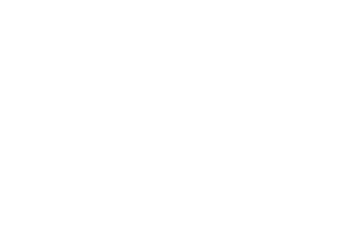

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 0.00018028548220172524
Epoch 467/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

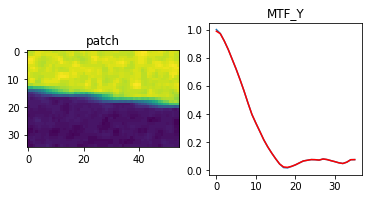

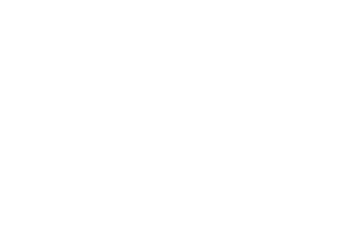

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.08it/s]


epoch_loss = 0.0001794751879060641
Epoch 468/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

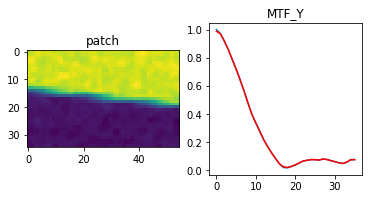

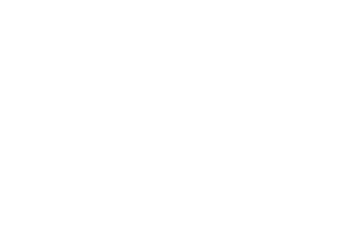

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.28it/s]


epoch_loss = 0.00017866930284071714
Epoch 469/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

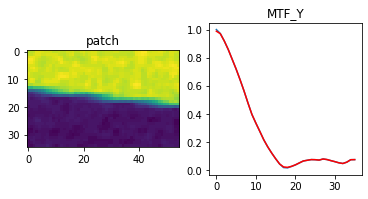

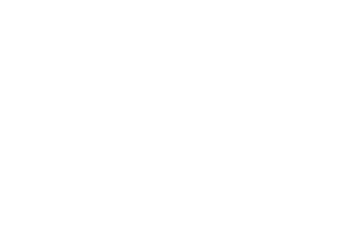

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 0.0001778683508746326
Epoch 470/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

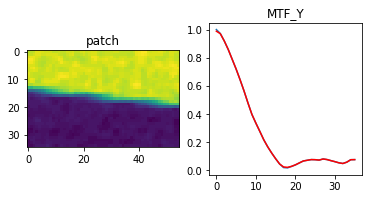

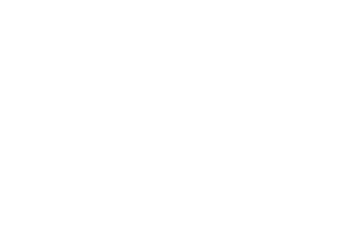

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.25it/s]


epoch_loss = 0.00017707627557683736
Epoch 471/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

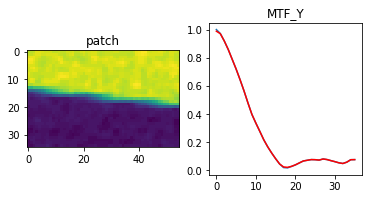

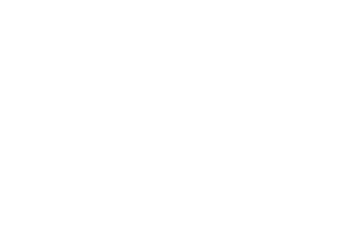

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 0.0001762865431373939
Epoch 472/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

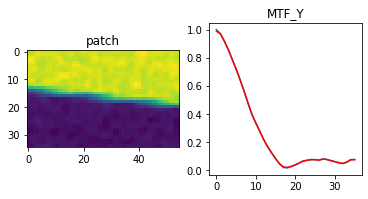

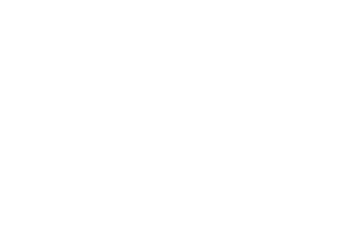

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.30it/s]


epoch_loss = 0.00017550517804920673
Epoch 473/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

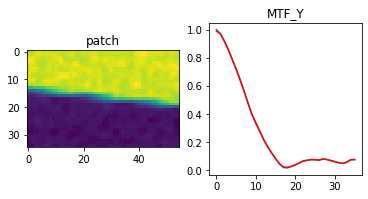

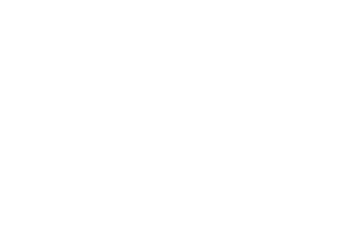

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]


epoch_loss = 0.00017472670879215002
Epoch 474/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

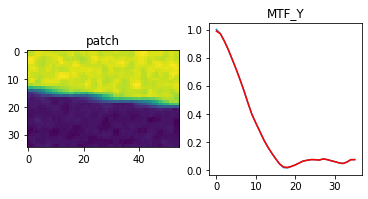

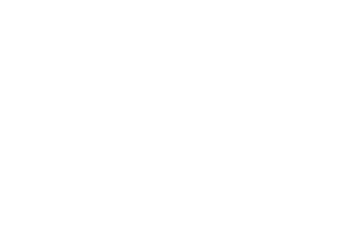

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]


epoch_loss = 0.00017395602480974048
Epoch 475/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

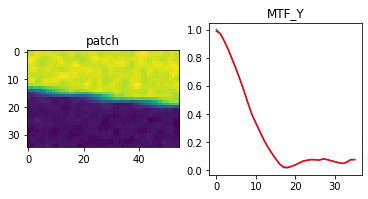

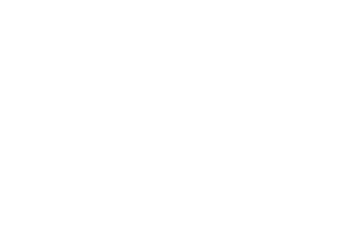

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]


epoch_loss = 0.0001731879310682416
Epoch 476/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

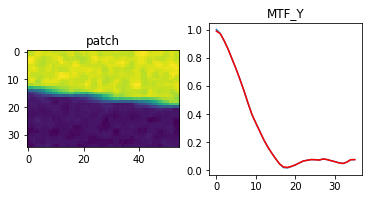

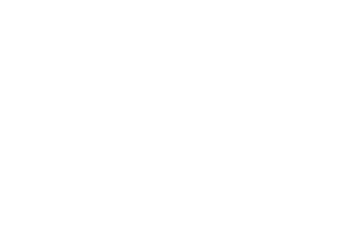

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.00017242782632820308
Epoch 477/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

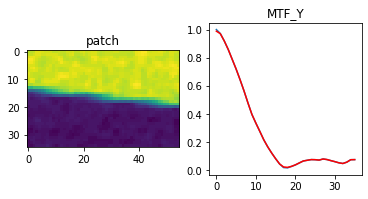

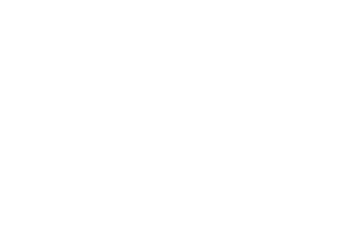

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.73it/s]


epoch_loss = 0.00017167010810226202
Epoch 478/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

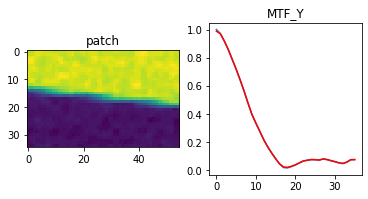

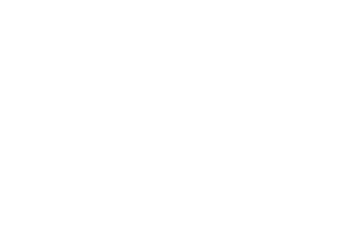

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 0.00017091889458242804
Epoch 479/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

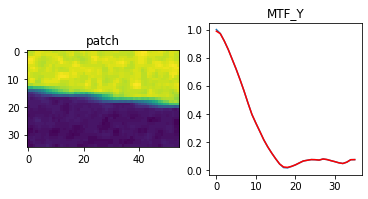

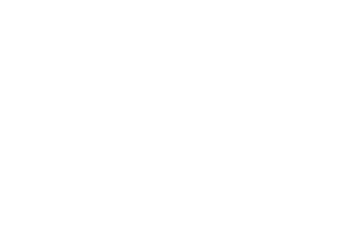

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.00017017552454490215
Epoch 480/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

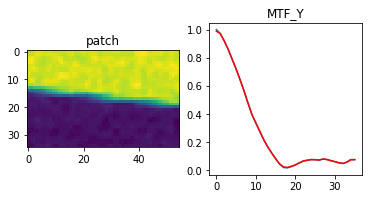

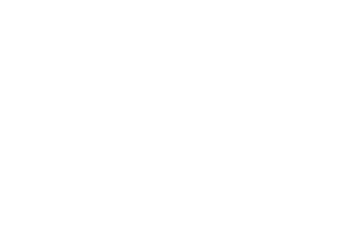

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 0.000169434686540626
Epoch 481/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

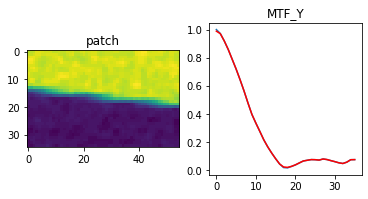

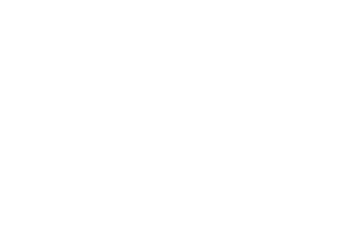

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]


epoch_loss = 0.00016869739920366555
Epoch 482/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

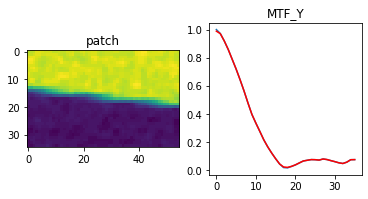

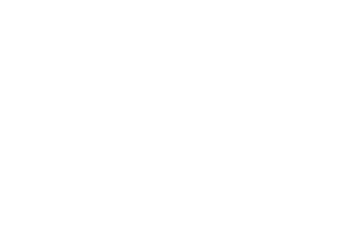

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 0.0001679693377809599
Epoch 483/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

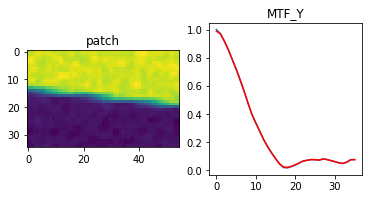

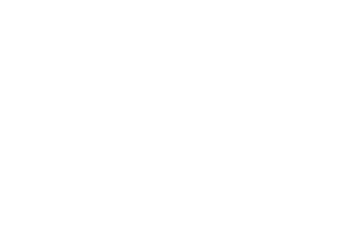

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]


epoch_loss = 0.0001672421785769984
Epoch 484/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

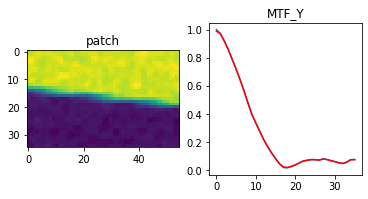

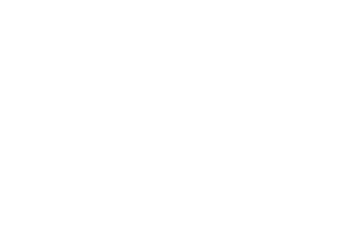

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.87it/s]


epoch_loss = 0.00016652130580041558
Epoch 485/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

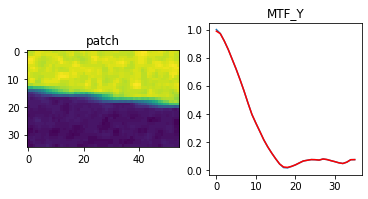

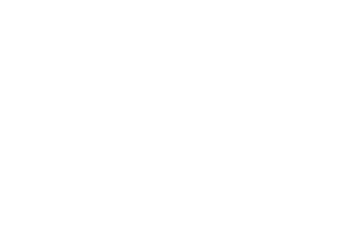

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.15it/s]


epoch_loss = 0.0001658065157243982
Epoch 486/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

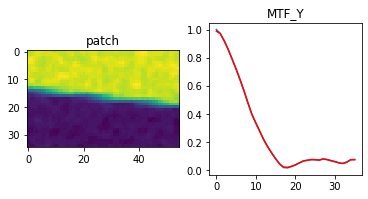

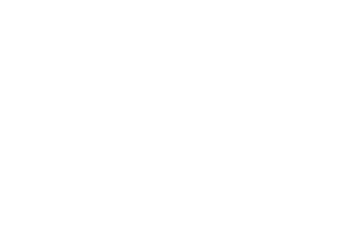

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.31it/s]


epoch_loss = 0.0001650958729442209
Epoch 487/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

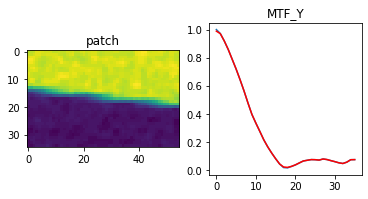

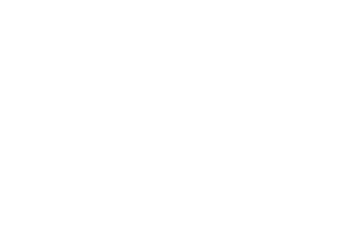

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]


epoch_loss = 0.00016439059982076287
Epoch 488/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

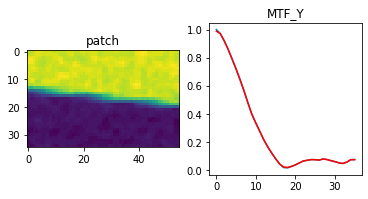

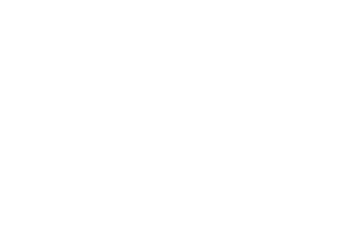

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]


epoch_loss = 0.00016368943033739924
Epoch 489/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

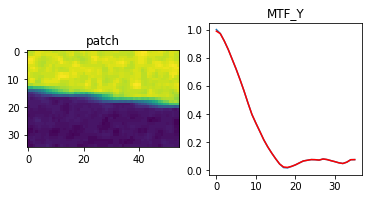

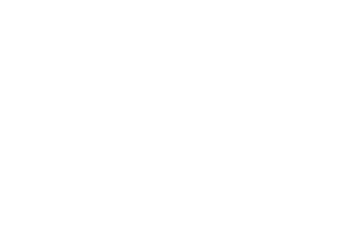

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 0.00016299402341246605
Epoch 490/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

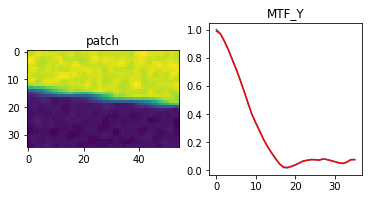

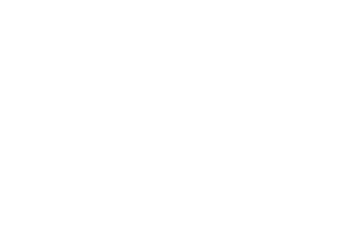

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]


epoch_loss = 0.00016230205073952675
Epoch 491/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

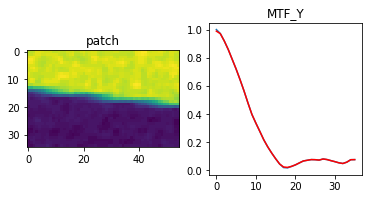

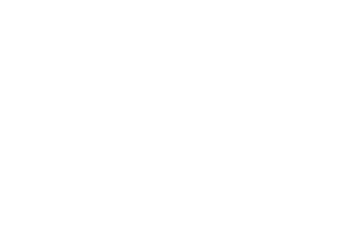

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.20it/s]


epoch_loss = 0.000161616102559492
Epoch 492/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

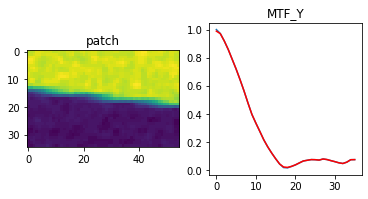

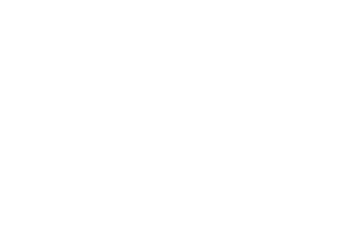

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]


epoch_loss = 0.00016093626618385315
Epoch 493/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

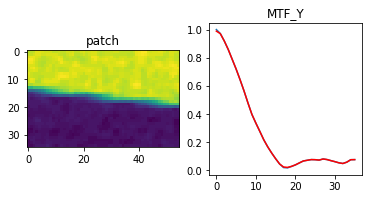

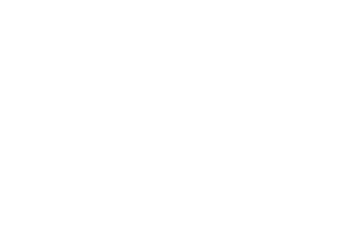

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 0.00016025947115849704
Epoch 494/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

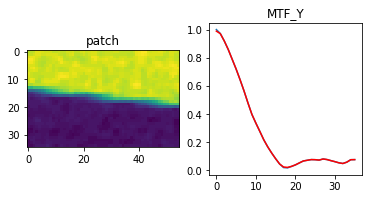

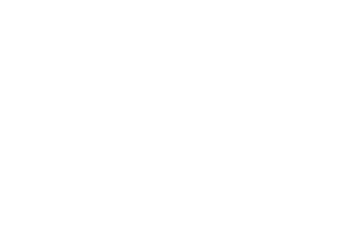

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 0.0001595848734723404
Epoch 495/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

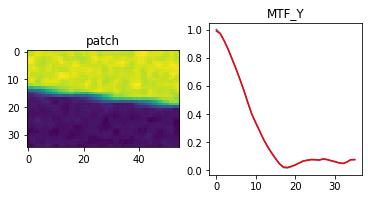

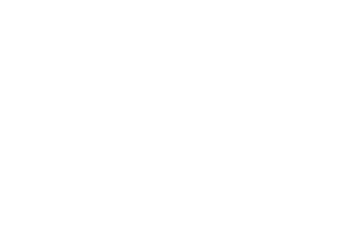

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 0.00015891739167273045
Epoch 496/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

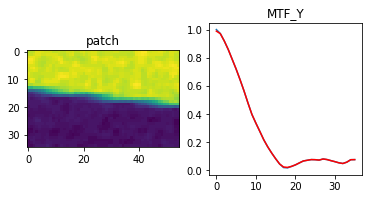

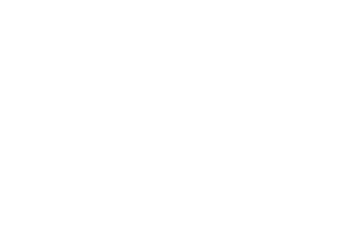

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.25it/s]


epoch_loss = 0.0001582527911523357
Epoch 497/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

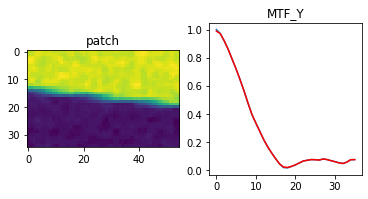

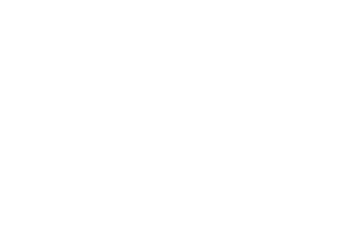

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]


epoch_loss = 0.00015759326925035566
Epoch 498/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

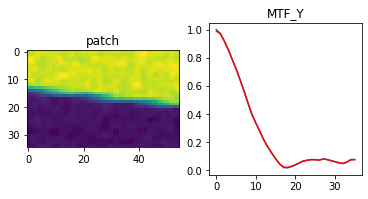

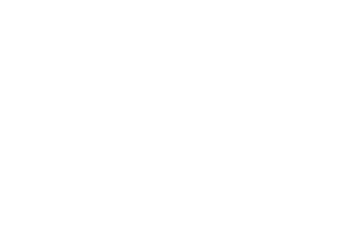

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.80it/s]


epoch_loss = 0.0001569375890539959
Epoch 499/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

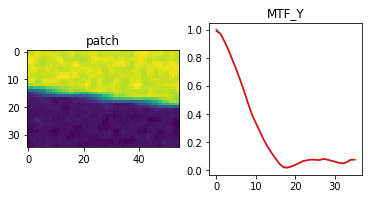

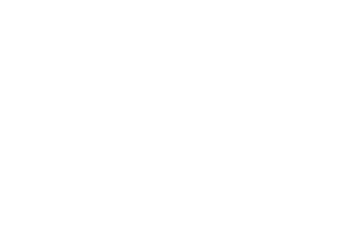

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 0.00015628816618118435
Epoch 500/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

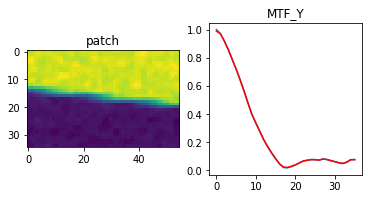

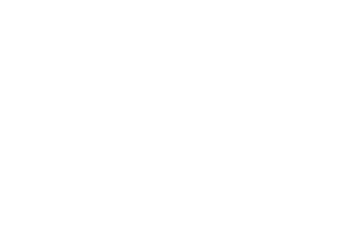

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]


epoch_loss = 0.00015564278874080628
Epoch 501/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

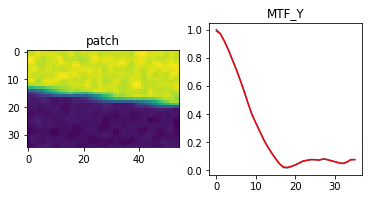

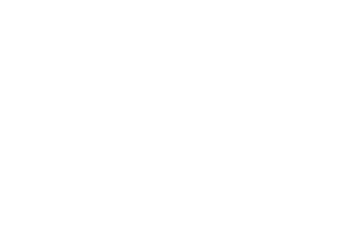

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 0.00015499927394557744
Epoch 502/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

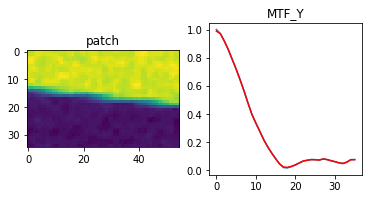

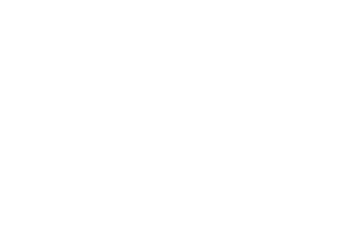

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.58it/s]


epoch_loss = 0.00015436306421179324
Epoch 503/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

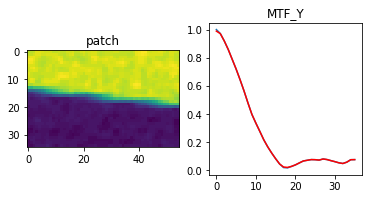

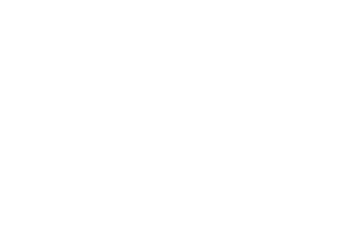

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.34it/s]


epoch_loss = 0.00015373073983937502
Epoch 504/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

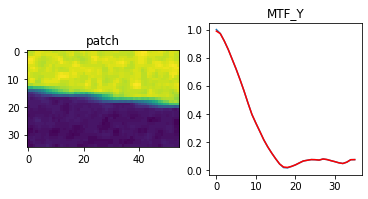

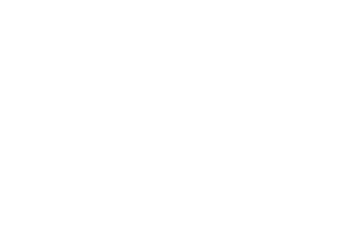

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]


epoch_loss = 0.0001531001180410385
Epoch 505/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

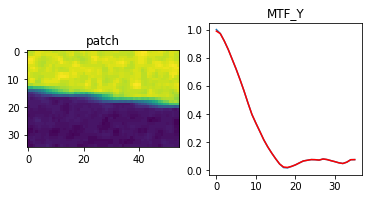

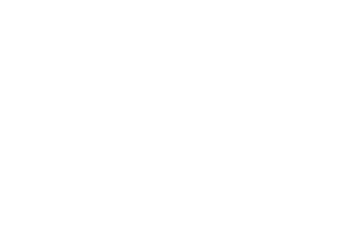

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]


epoch_loss = 0.00015247640840243548
Epoch 506/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

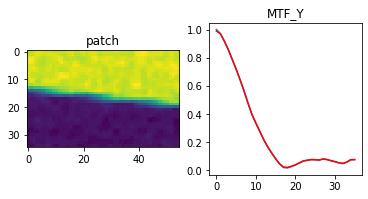

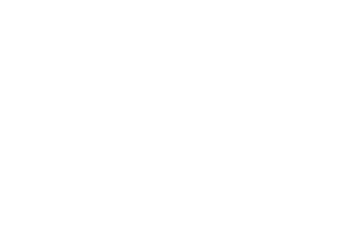

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]


epoch_loss = 0.00015185450320132077
Epoch 507/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

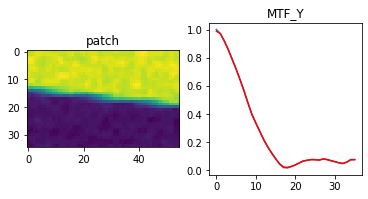

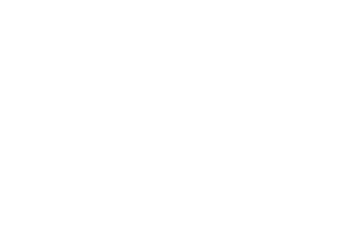

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.28it/s]


epoch_loss = 0.00015123792400117964
Epoch 508/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

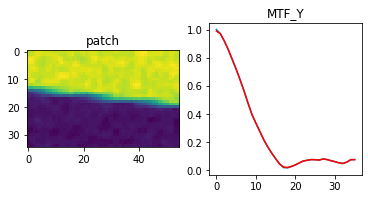

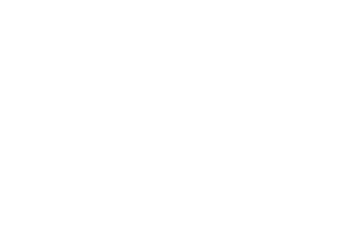

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.06it/s]


epoch_loss = 0.00015062552120070904
Epoch 509/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

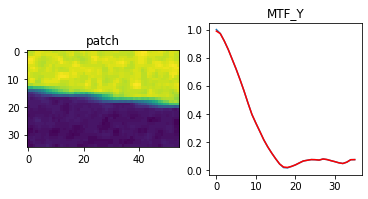

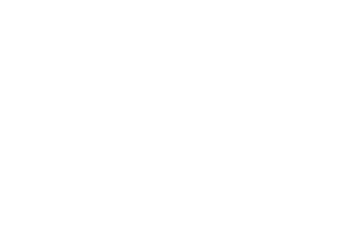

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.42it/s]


epoch_loss = 0.00015001726569607854
Epoch 510/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

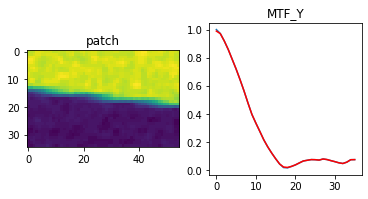

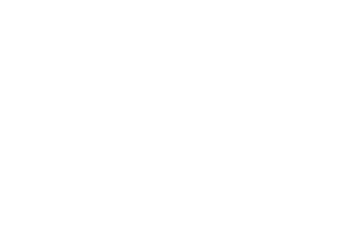

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 0.00014941170229576528
Epoch 511/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

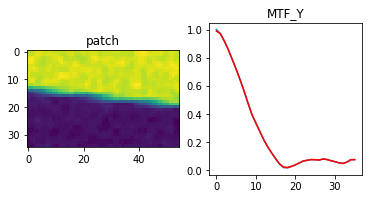

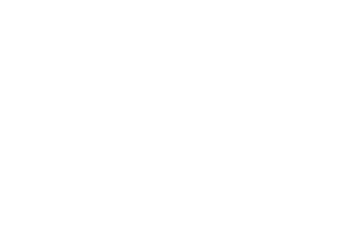

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.69it/s]


epoch_loss = 0.0001488088455516845
Epoch 512/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

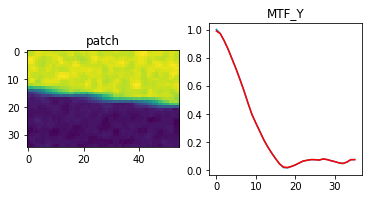

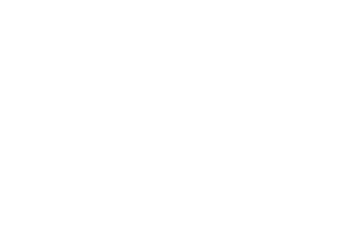

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.33it/s]


epoch_loss = 0.0001482128573115915
Epoch 513/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

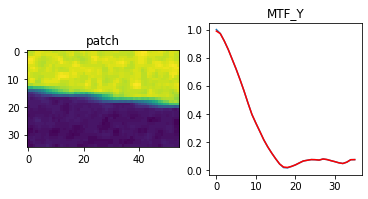

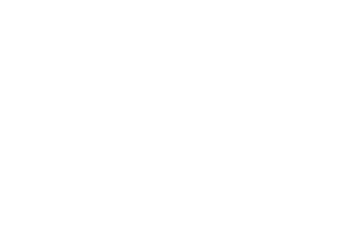

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 0.00014762089995201677
Epoch 514/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

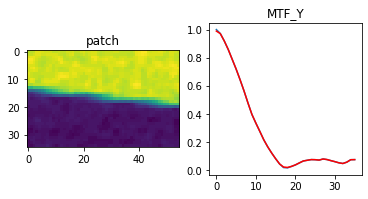

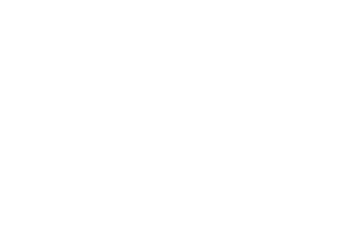

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.13it/s]


epoch_loss = 0.00014703130000270903
Epoch 515/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

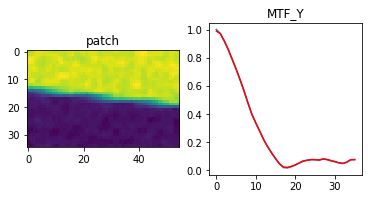

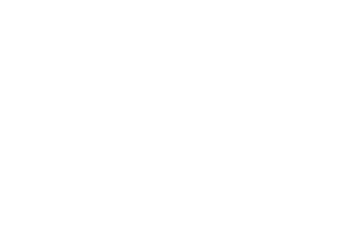

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 0.00014644484326709062
Epoch 516/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

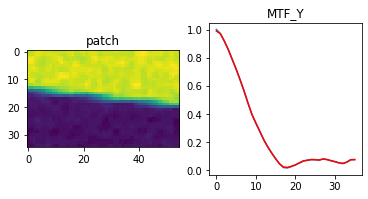

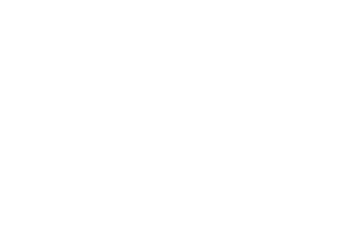

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 0.00014586327597498894
Epoch 517/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

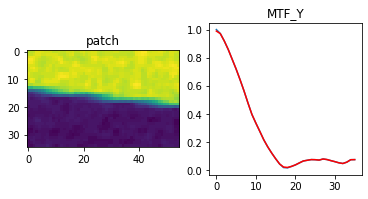

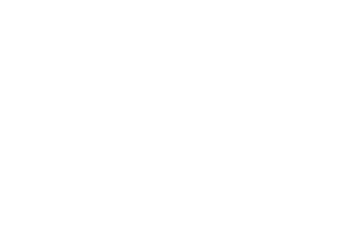

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]


epoch_loss = 0.00014528416795656085
Epoch 518/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

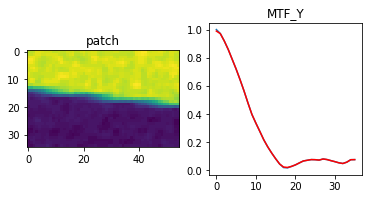

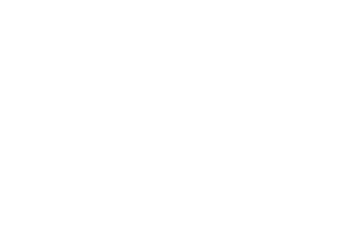

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]


epoch_loss = 0.0001447106769774109
Epoch 519/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

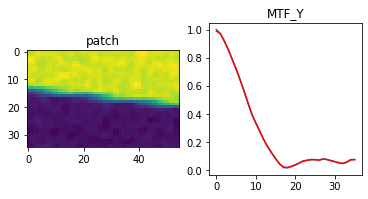

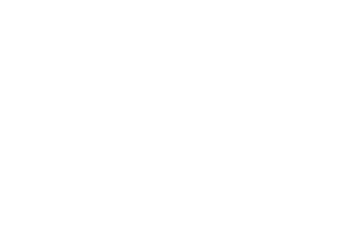

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.38it/s]


epoch_loss = 0.00014413949975278229
Epoch 520/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

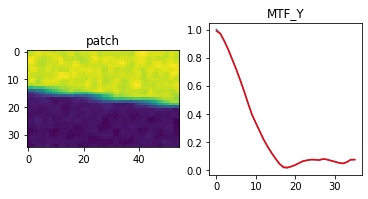

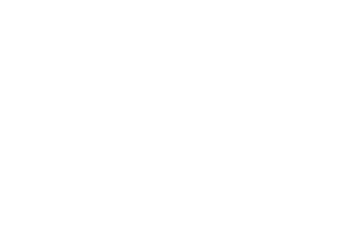

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]


epoch_loss = 0.00014357360487338156
Epoch 521/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

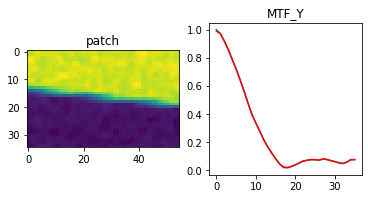

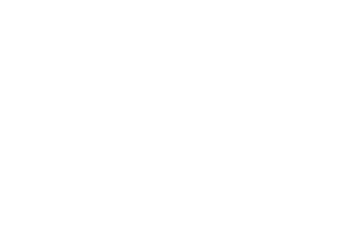

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 0.00014300977636594325
Epoch 522/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

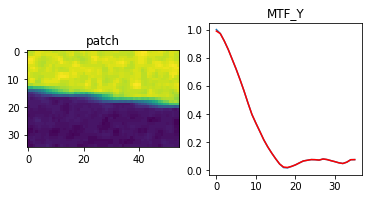

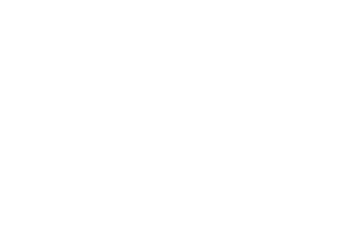

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 0.00014245131751522422
Epoch 523/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

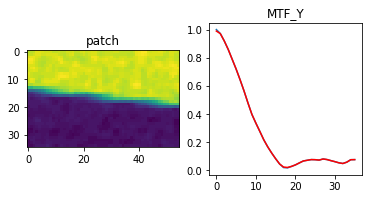

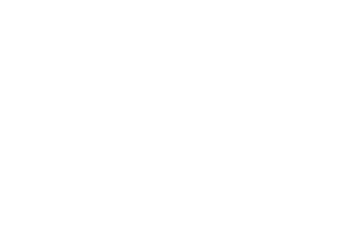

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]


epoch_loss = 0.00014189541980158538
Epoch 524/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

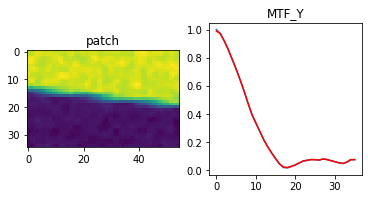

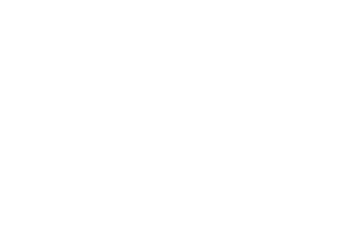

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]


epoch_loss = 0.00014134193770587444
Epoch 525/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

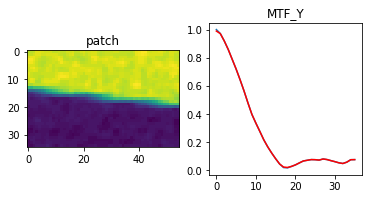

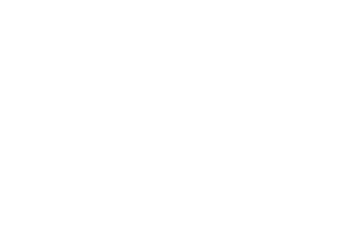

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 0.00014079191896598786
Epoch 526/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

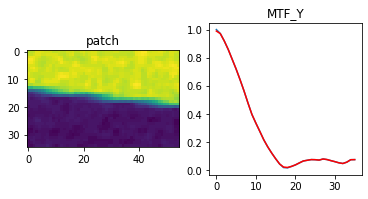

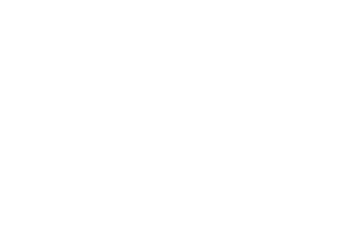

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.76it/s]


epoch_loss = 0.0001402457564836368
Epoch 527/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

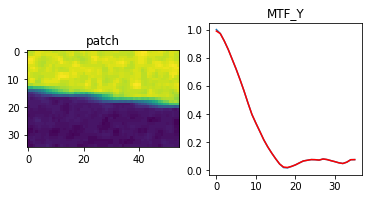

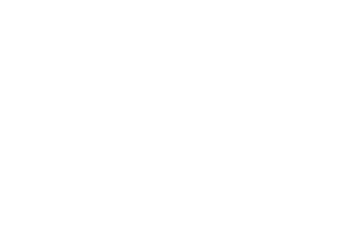

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]


epoch_loss = 0.0001397043961333111
Epoch 528/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

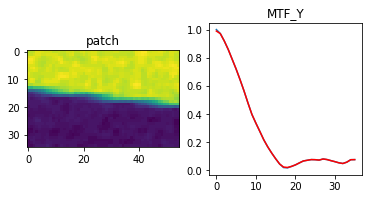

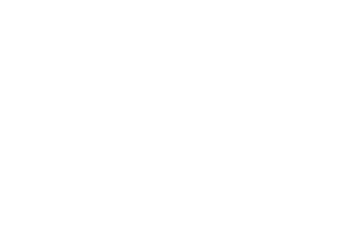

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 0.00013916543684899807
Epoch 529/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

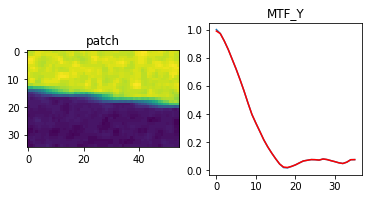

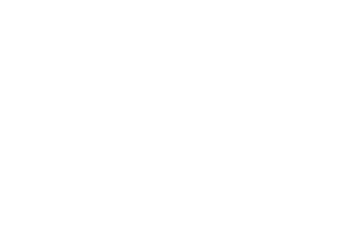

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]


epoch_loss = 0.00013863005733583122
Epoch 530/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

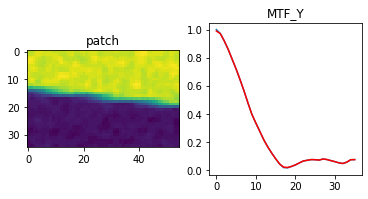

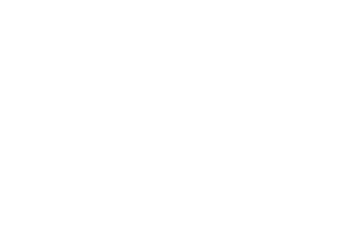

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]


epoch_loss = 0.00013809841766487807
Epoch 531/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

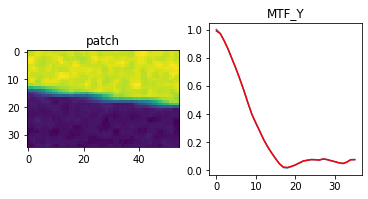

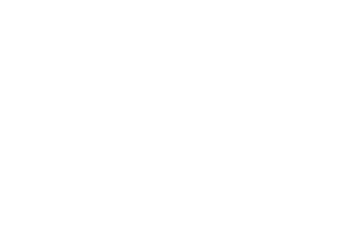

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 0.0001375687133986503
Epoch 532/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

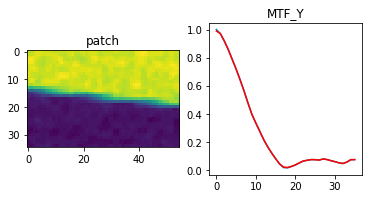

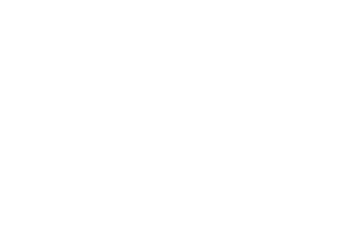

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 0.0001370428071822971
Epoch 533/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

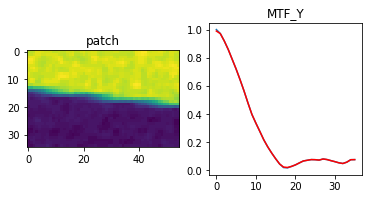

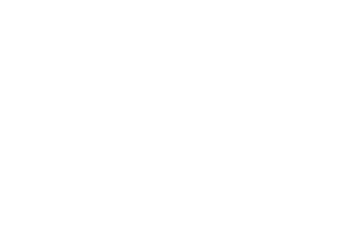

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.34it/s]


epoch_loss = 0.00013652055349666625
Epoch 534/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

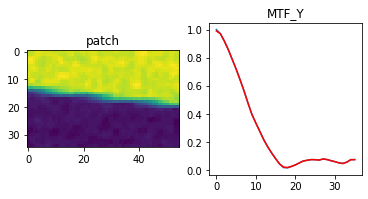

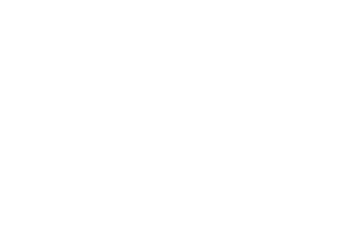

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.67it/s]


epoch_loss = 0.00013600288366433233
Epoch 535/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

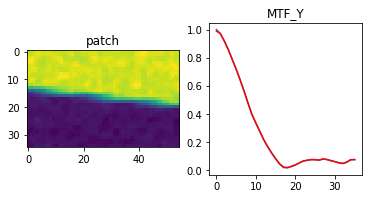

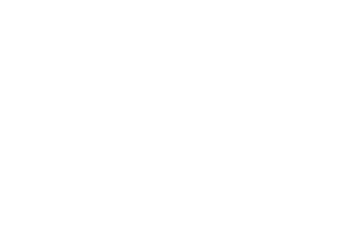

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.20it/s]


epoch_loss = 0.0001354860869469121
Epoch 536/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

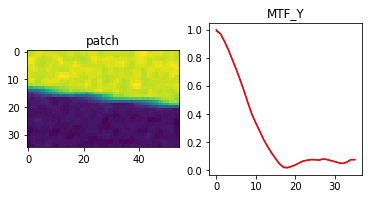

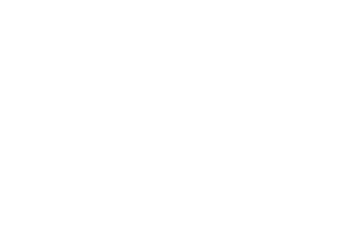

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.65it/s]


epoch_loss = 0.00013497287000063807
Epoch 537/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

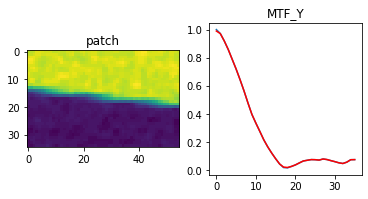

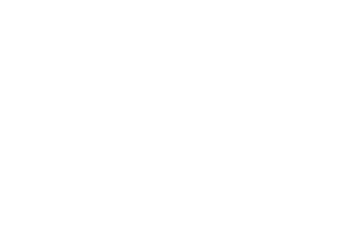

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.53it/s]


epoch_loss = 0.00013446281081996858
Epoch 538/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

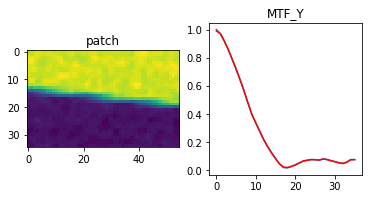

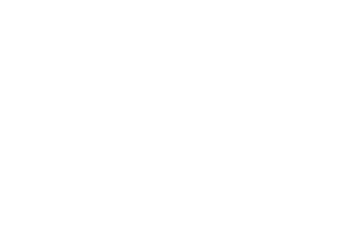

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.78it/s]


epoch_loss = 0.0001339566078968346
Epoch 539/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

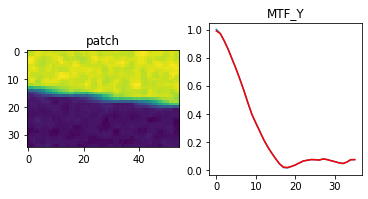

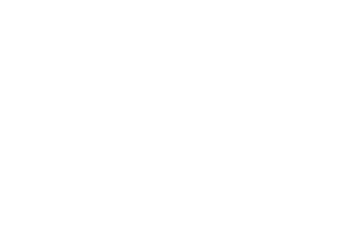

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 0.000133453359012492
Epoch 540/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

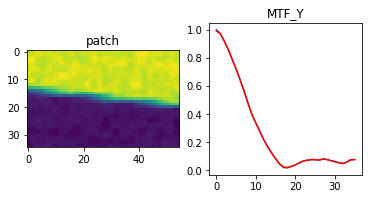

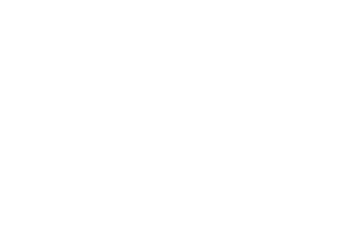

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]


epoch_loss = 0.00013295373355504125
Epoch 541/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

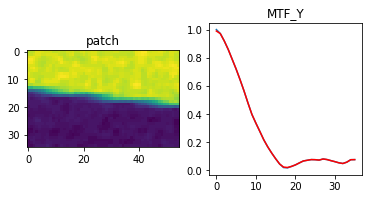

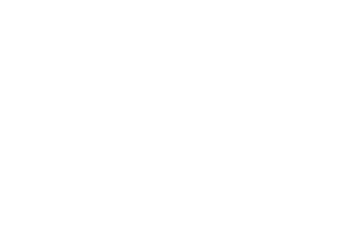

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]


epoch_loss = 0.0001324547192780301
Epoch 542/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

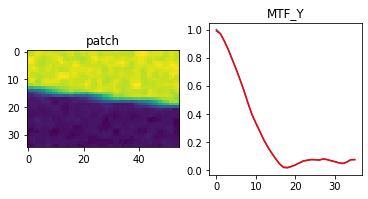

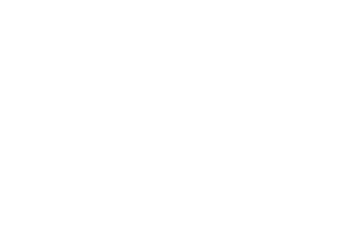

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.54it/s]


epoch_loss = 0.00013196043437346816
Epoch 543/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

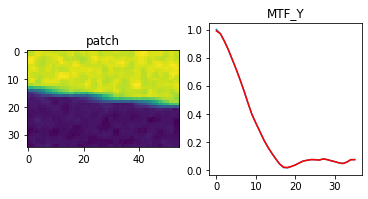

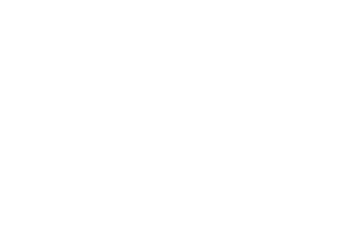

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]


epoch_loss = 0.0001314720429945737
Epoch 544/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

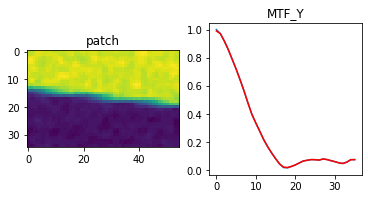

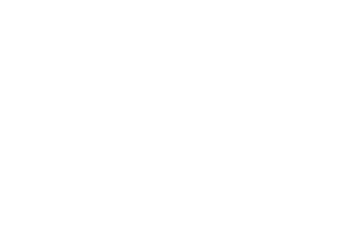

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 0.00013098173076286912
Epoch 545/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

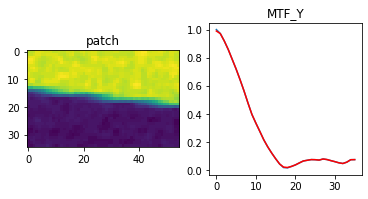

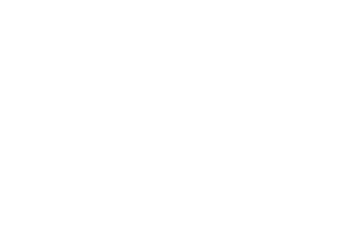

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]


epoch_loss = 0.00013049598783254623
Epoch 546/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

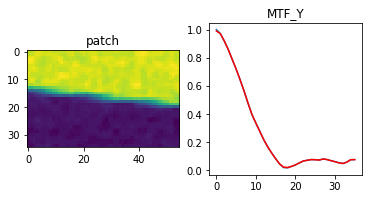

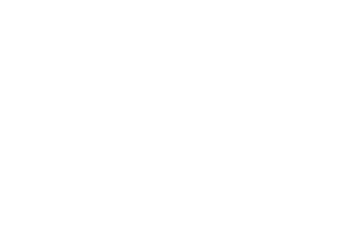

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]


epoch_loss = 0.00013001619663555175
Epoch 547/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

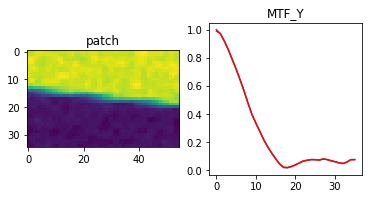

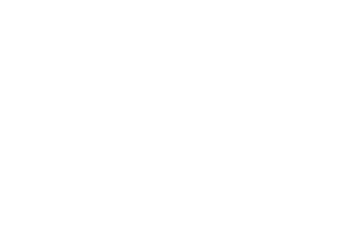

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.81it/s]


epoch_loss = 0.00012953679834026843
Epoch 548/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

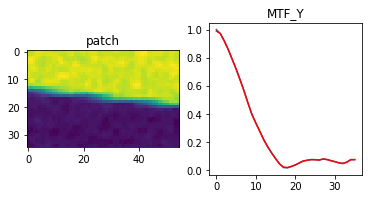

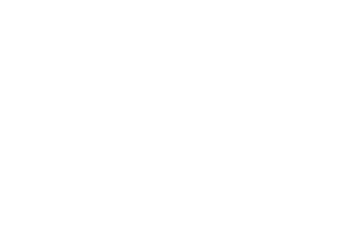

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 0.000129059495520778
Epoch 549/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

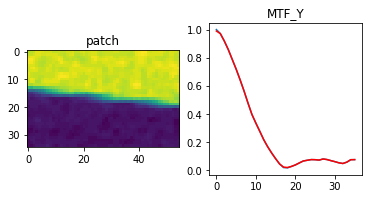

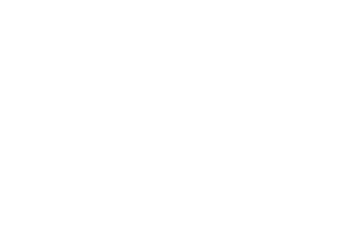

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 0.00012858430272899568
Epoch 550/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

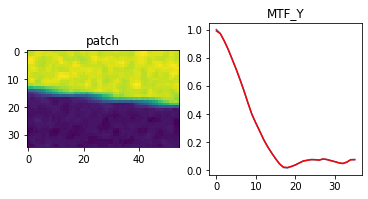

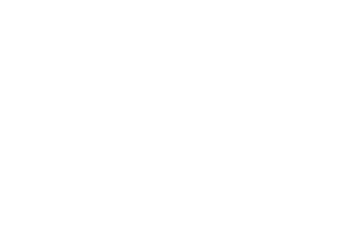

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 0.00012811455235350877
Epoch 551/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

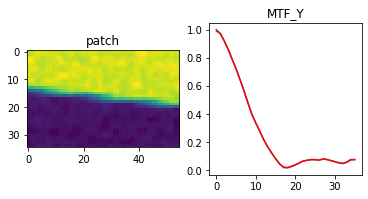

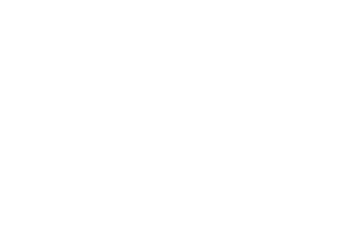

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 0.0001276480033993721
Epoch 552/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

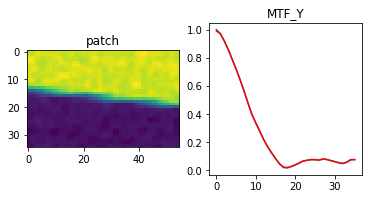

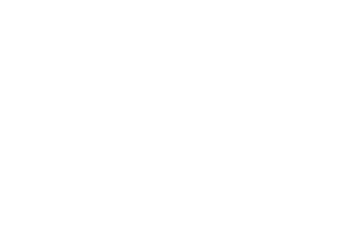

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]


epoch_loss = 0.0001271809305762872
Epoch 553/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

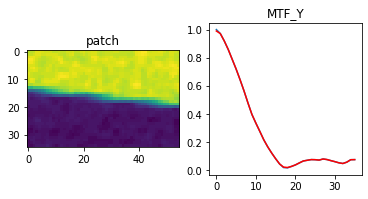

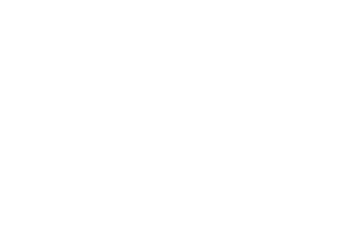

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]


epoch_loss = 0.00012671822332777083
Epoch 554/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

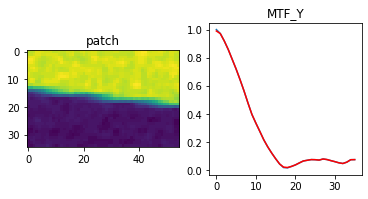

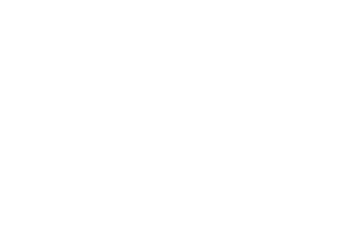

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.01it/s]


epoch_loss = 0.00012625982344616205
Epoch 555/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

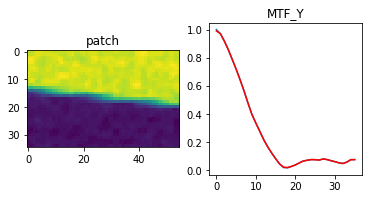

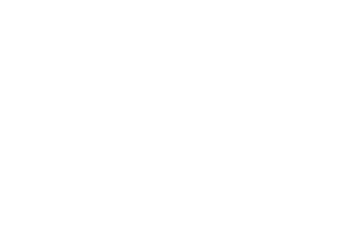

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.25it/s]


epoch_loss = 0.00012580312613863498
Epoch 556/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

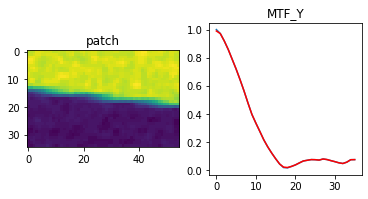

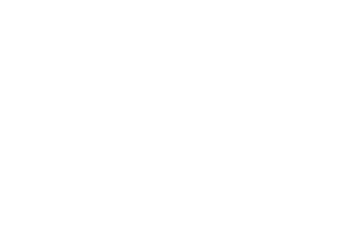

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]


epoch_loss = 0.00012534849520307034
Epoch 557/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

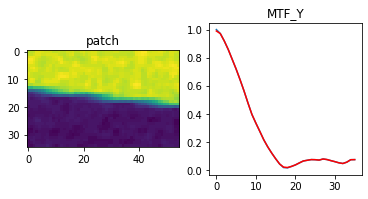

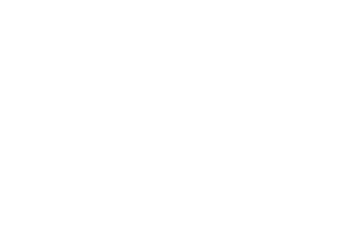

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]


epoch_loss = 0.0001248981134267524
Epoch 558/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

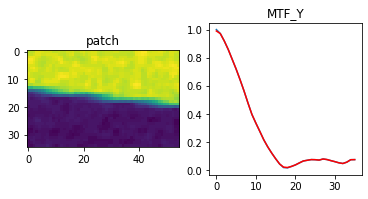

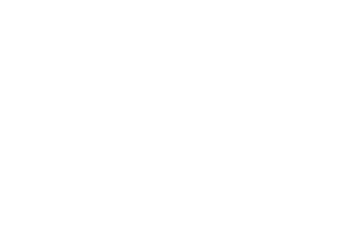

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]


epoch_loss = 0.0001244495069840923
Epoch 559/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

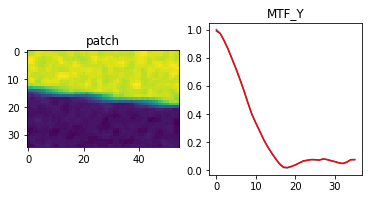

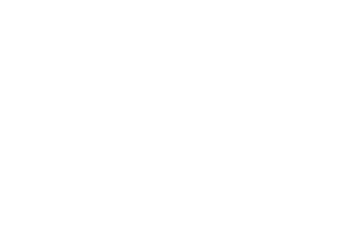

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 0.00012400231207720935
Epoch 560/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

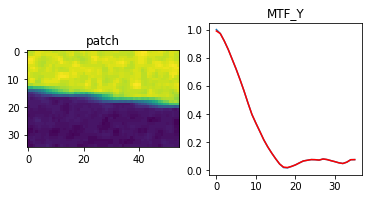

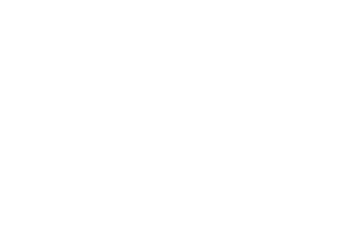

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.28it/s]


epoch_loss = 0.00012355964281596243
Epoch 561/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

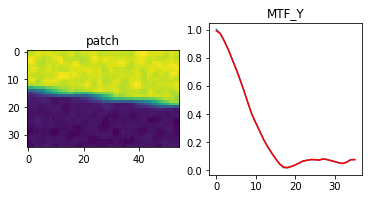

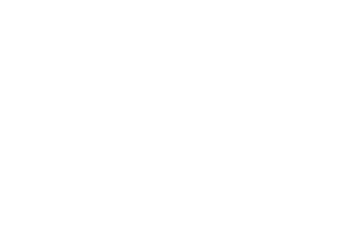

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.94it/s]


epoch_loss = 0.00012311867612879723
Epoch 562/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

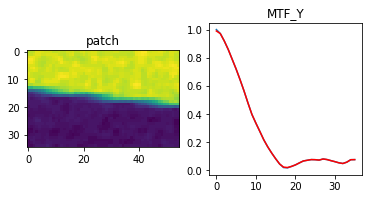

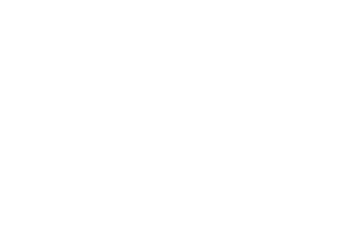

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.21it/s]


epoch_loss = 0.00012267939746379852
Epoch 563/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

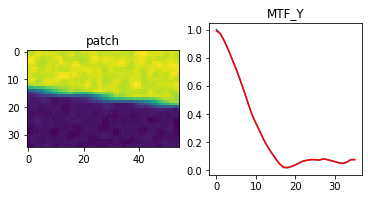

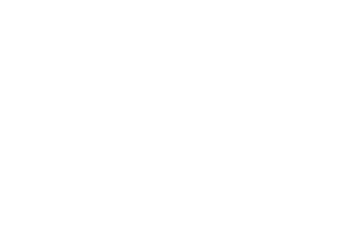

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 0.00012224445526953787
Epoch 564/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

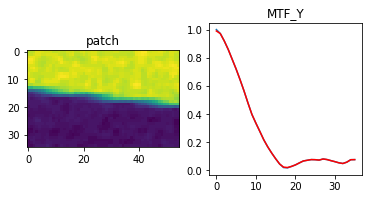

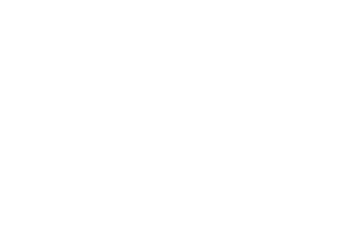

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 0.00012181101919850335
Epoch 565/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

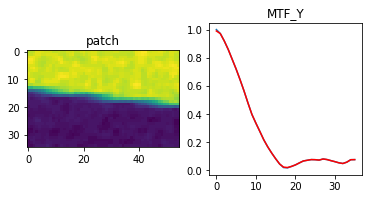

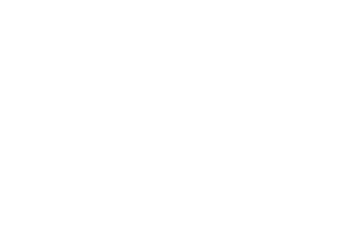

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 0.00012137929297750816
Epoch 566/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

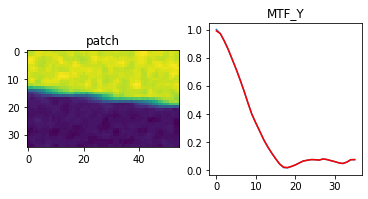

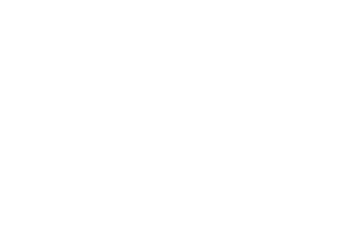

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 0.00012095177953597158
Epoch 567/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

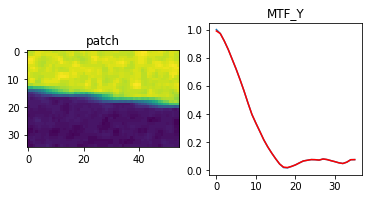

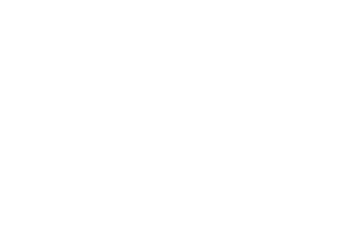

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.92it/s]


epoch_loss = 0.00012052583042532206
Epoch 568/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

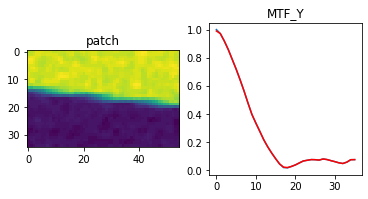

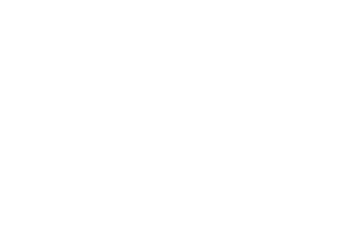

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]


epoch_loss = 0.00012010287173325196
Epoch 569/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

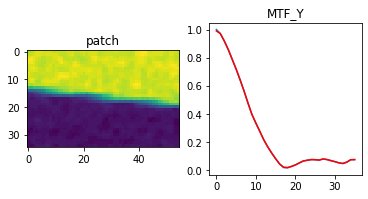

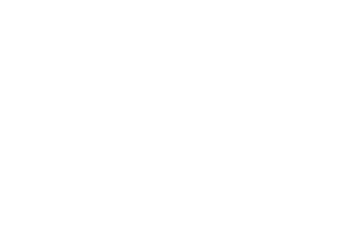

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]


epoch_loss = 0.00011968253966188058
Epoch 570/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

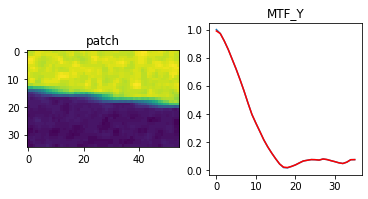

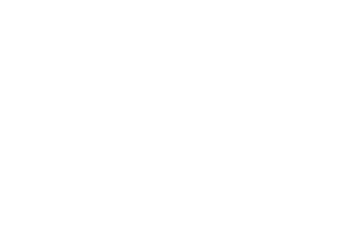

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]


epoch_loss = 0.00011926390288863331
Epoch 571/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

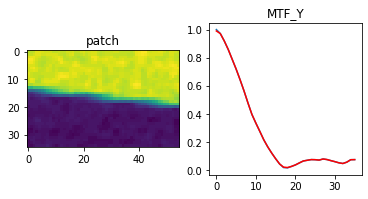

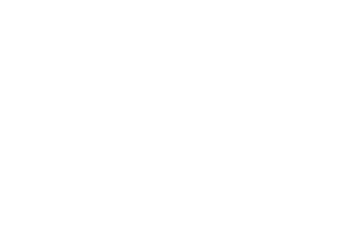

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 0.00011884933337569237
Epoch 572/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

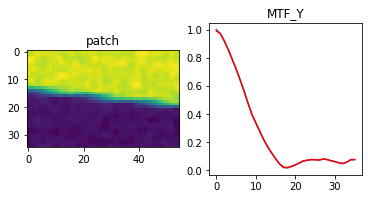

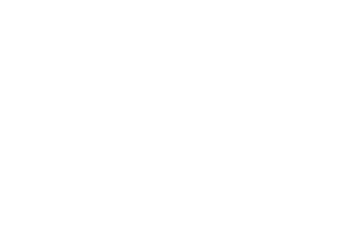

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 0.00011843266838695854
Epoch 573/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

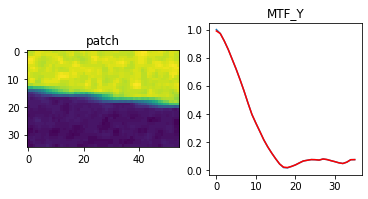

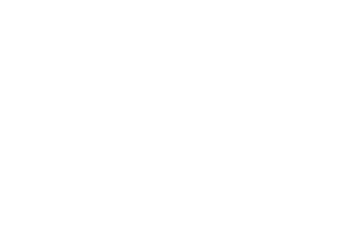

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]


epoch_loss = 0.00011802354856627062
Epoch 574/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

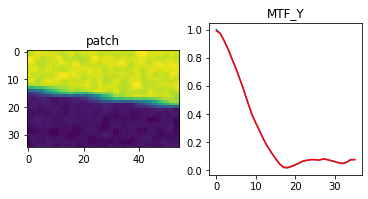

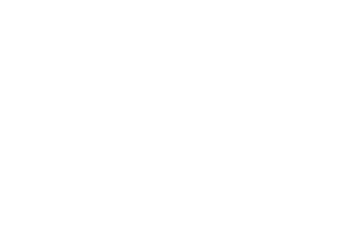

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 0.00011761357745854184
Epoch 575/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

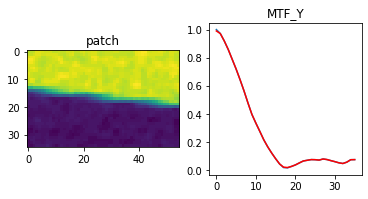

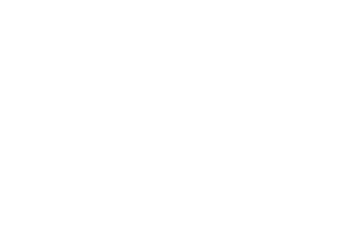

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.98it/s]


epoch_loss = 0.00011720771726686507
Epoch 576/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

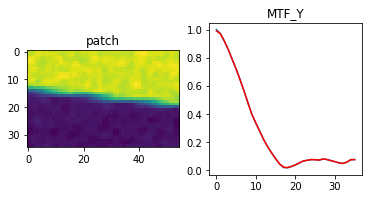

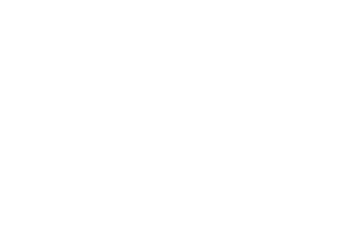

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 0.00011680464376695454
Epoch 577/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

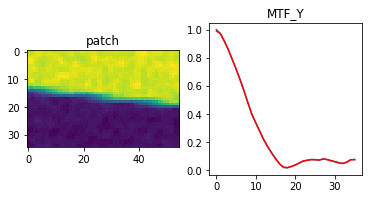

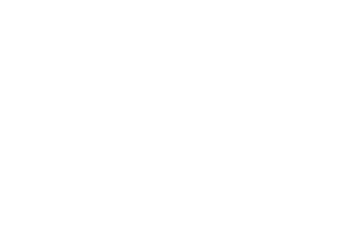

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 0.00011640162119874731
Epoch 578/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

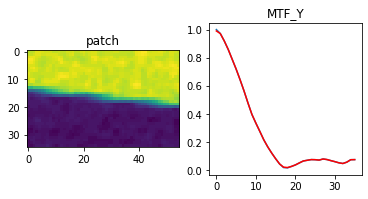

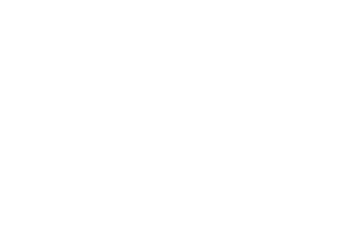

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.44it/s]


epoch_loss = 0.00011600121797528118
Epoch 579/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

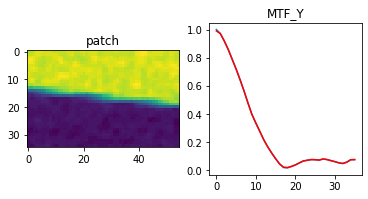

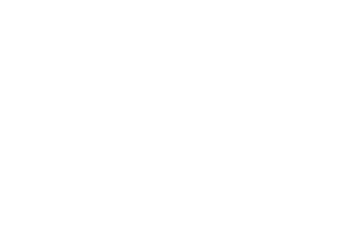

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.86it/s]


epoch_loss = 0.00011560375423869118
Epoch 580/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

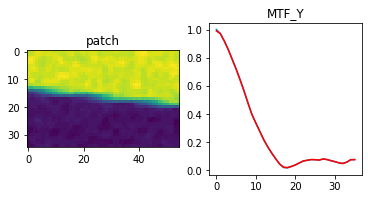

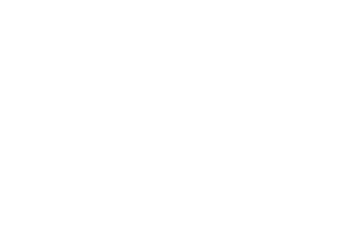

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.41it/s]


epoch_loss = 0.00011521019041538239
Epoch 581/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

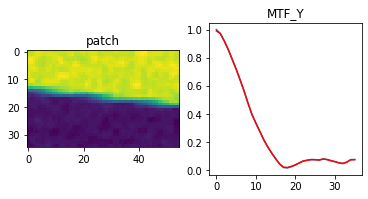

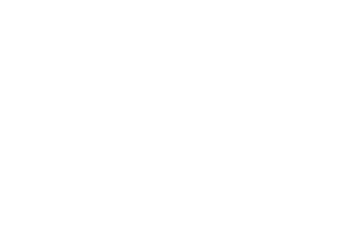

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]


epoch_loss = 0.00011481686669867486
Epoch 582/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

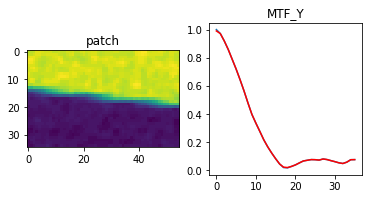

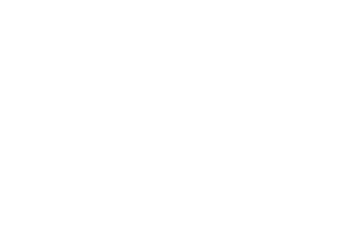

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.92it/s]


epoch_loss = 0.00011442612594692037
Epoch 583/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

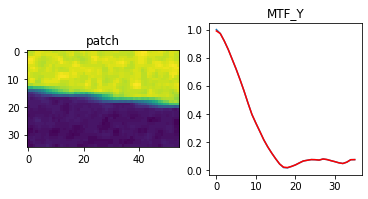

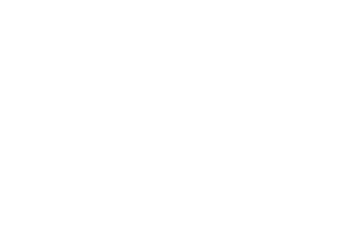

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]


epoch_loss = 0.00011403788084862754
Epoch 584/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

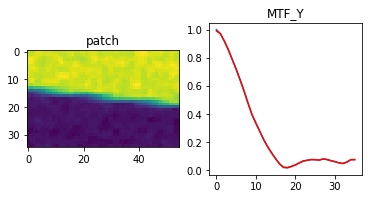

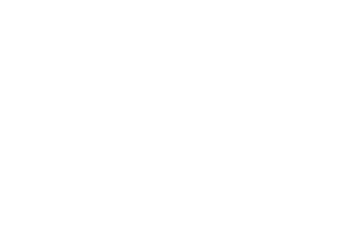

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 0.00011365256796125323
Epoch 585/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

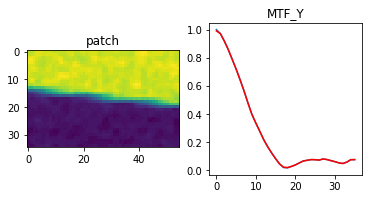

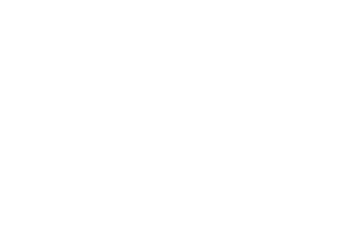

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.66it/s]


epoch_loss = 0.00011326721869409084
Epoch 586/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

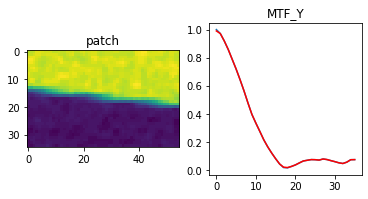

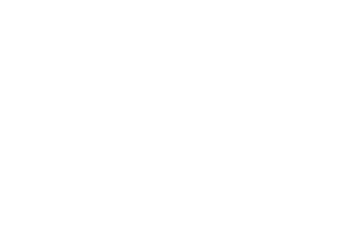

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.09it/s]


epoch_loss = 0.0001128845033235848
Epoch 587/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

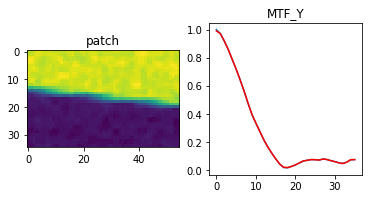

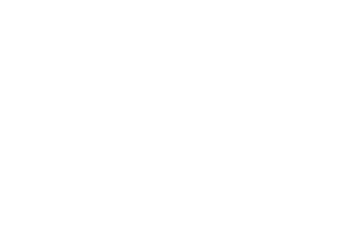

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]


epoch_loss = 0.00011250440002186224
Epoch 588/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

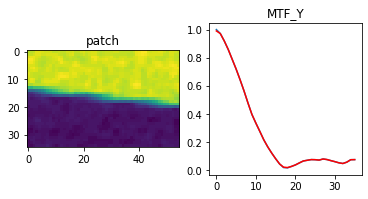

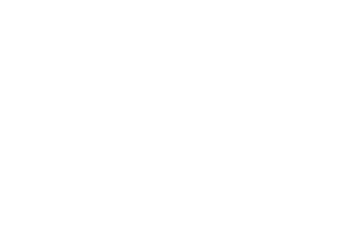

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 0.00011212581011932343
Epoch 589/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

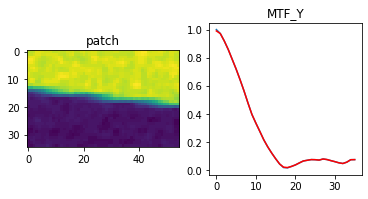

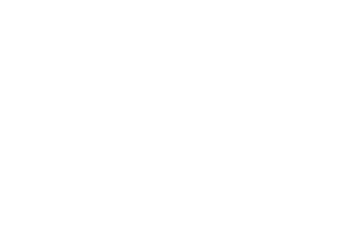

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.11it/s]


epoch_loss = 0.00011175204417668283
Epoch 590/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

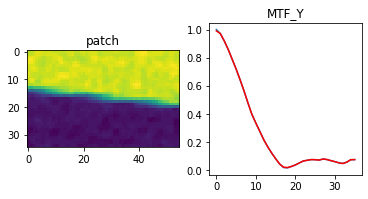

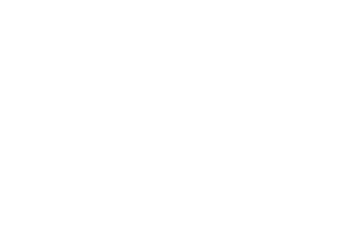

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.01it/s]


epoch_loss = 0.0001113784164772369
Epoch 591/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

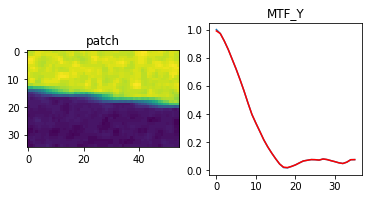

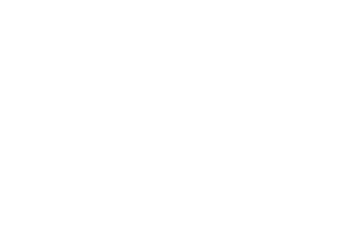

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]


epoch_loss = 0.00011100748815806583
Epoch 592/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

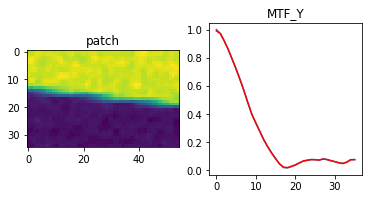

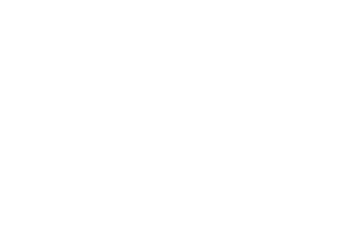

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 0.00011063638521591201
Epoch 593/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

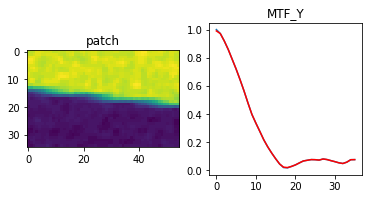

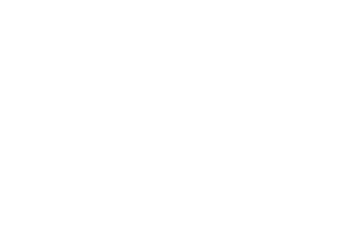

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]


epoch_loss = 0.00011026926222257316
Epoch 594/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

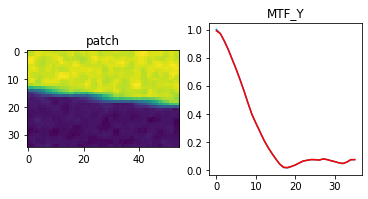

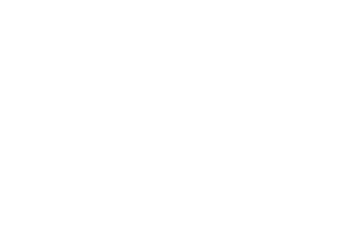

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 0.00010990447481162846
Epoch 595/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

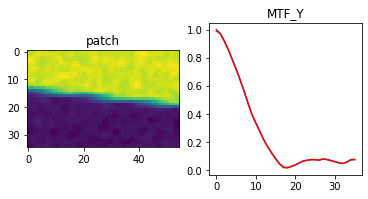

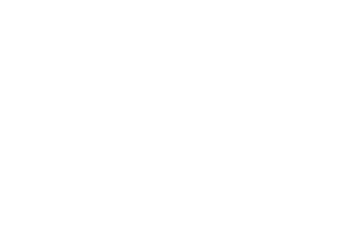

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.58it/s]


epoch_loss = 0.00010953994933515787
Epoch 596/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

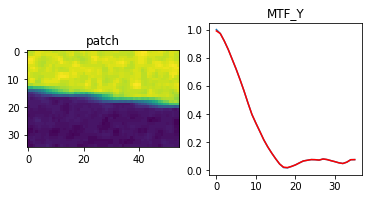

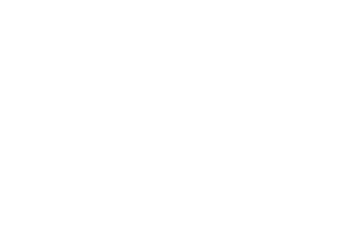

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.21it/s]


epoch_loss = 0.00010917895997408777
Epoch 597/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

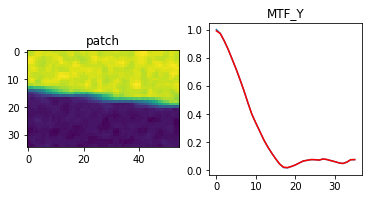

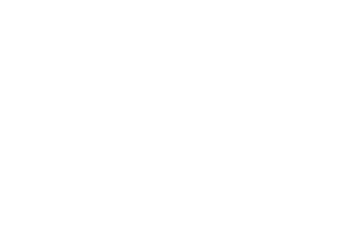

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 0.0001088191638700664
Epoch 598/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

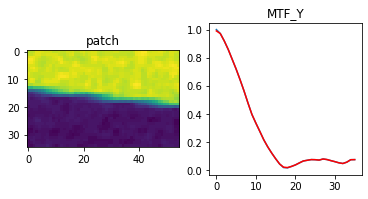

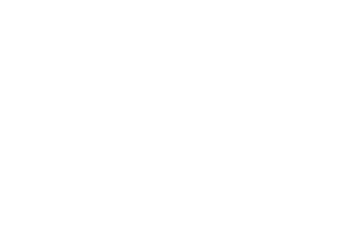

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 0.00010846441000467166
Epoch 599/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

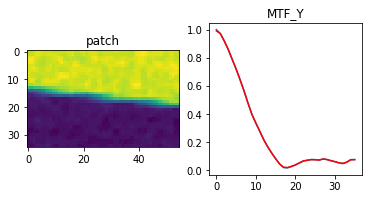

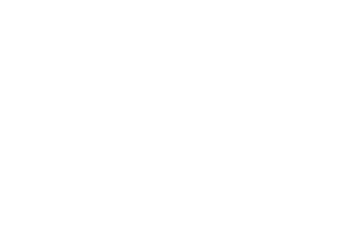

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]


epoch_loss = 0.00010810708772623911
Epoch 600/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

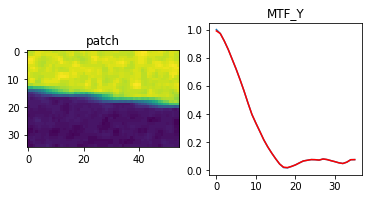

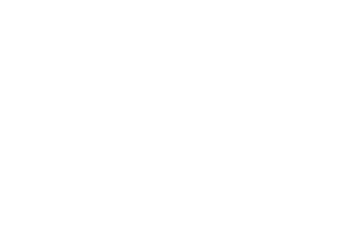

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 0.00010775354166980833
Epoch 601/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

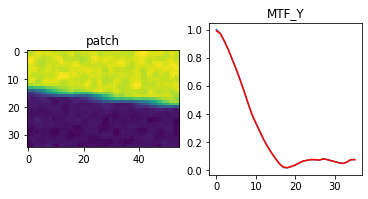

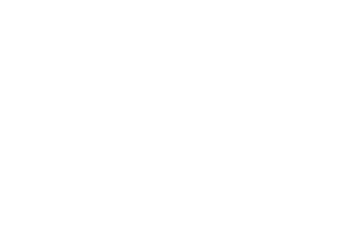

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.42it/s]


epoch_loss = 0.00010740117431851104
Epoch 602/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

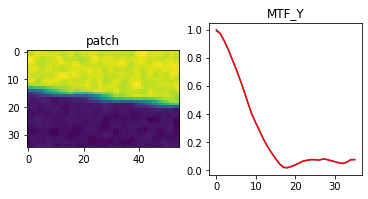

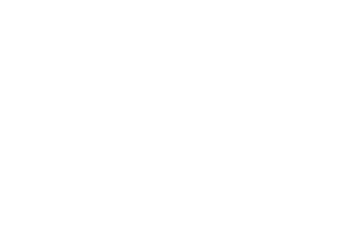

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.58it/s]


epoch_loss = 0.00010705248860176653
Epoch 603/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

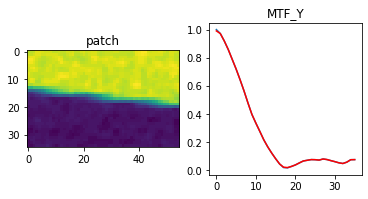

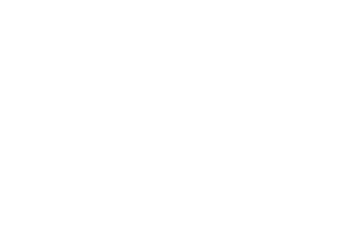

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.98it/s]


epoch_loss = 0.00010670612391550094
Epoch 604/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

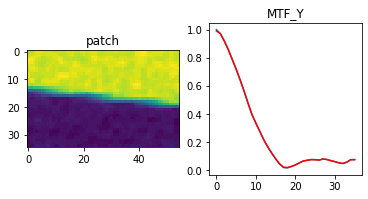

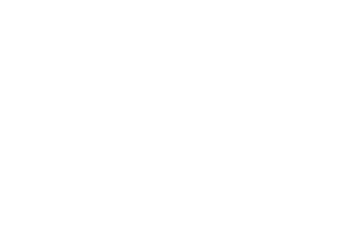

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.21it/s]


epoch_loss = 0.00010635965736582875
Epoch 605/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

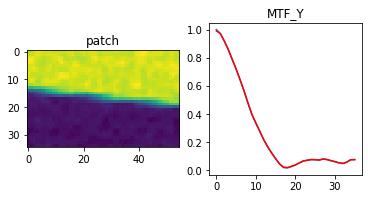

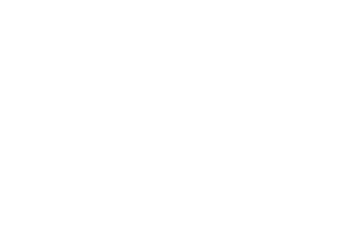

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 0.00010601450776448473
Epoch 606/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

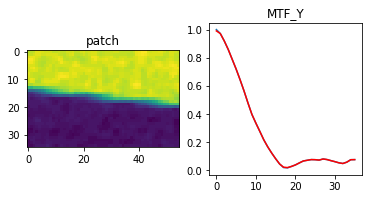

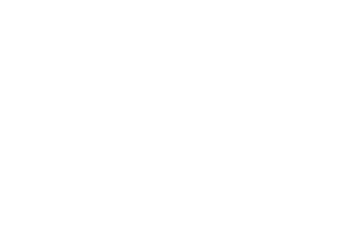

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.01it/s]


epoch_loss = 0.00010567293793428689
Epoch 607/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

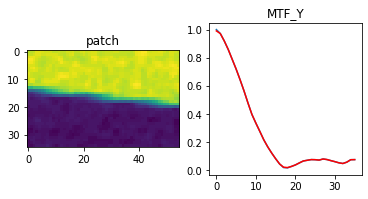

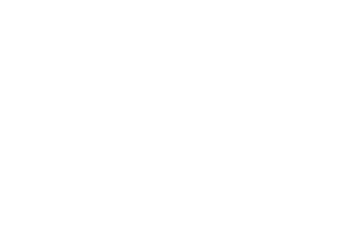

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]


epoch_loss = 0.0001053324158419855
Epoch 608/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

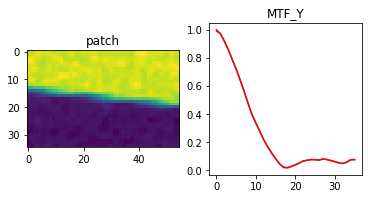

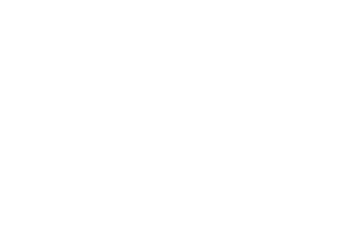

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.76it/s]


epoch_loss = 0.00010499321069801226
Epoch 609/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

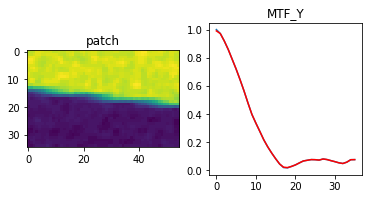

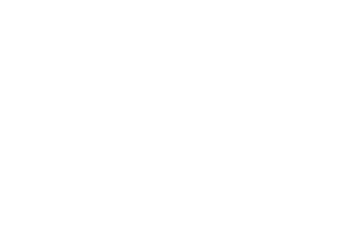

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.71it/s]


epoch_loss = 0.00010465719242347404
Epoch 610/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

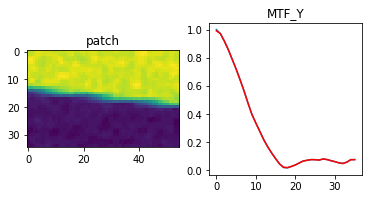

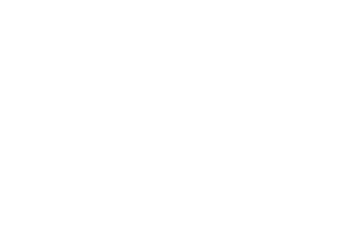

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.27it/s]


epoch_loss = 0.0001043225493049249
Epoch 611/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

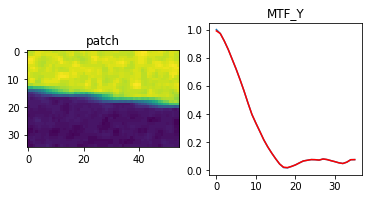

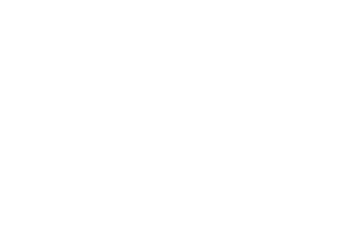

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]


epoch_loss = 0.00010398901940789074
Epoch 612/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

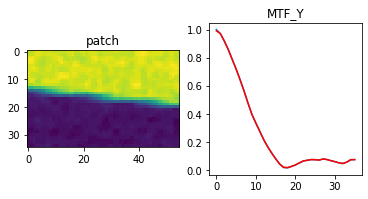

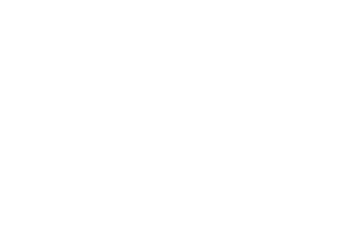

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 0.00010365650086896494
Epoch 613/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

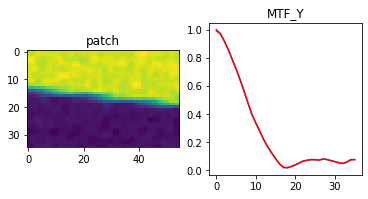

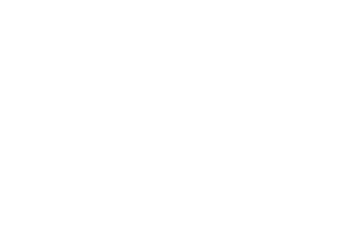

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 0.00010332761303288862
Epoch 614/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

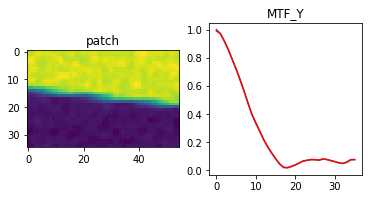

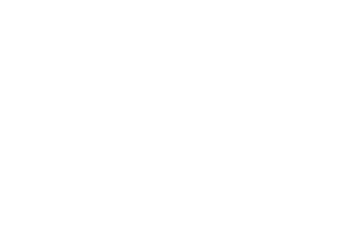

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.23it/s]


epoch_loss = 0.00010299970745109022
Epoch 615/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

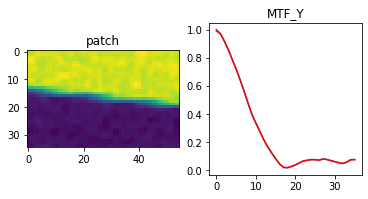

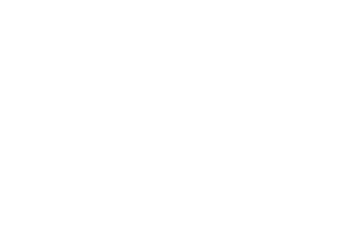

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]


epoch_loss = 0.00010267288598697633
Epoch 616/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

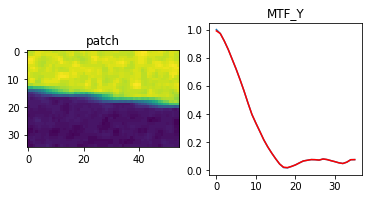

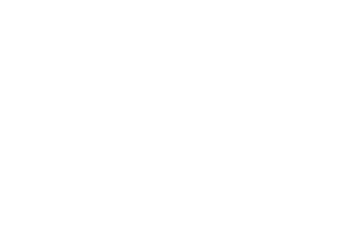

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 0.00010234941146336496
Epoch 617/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

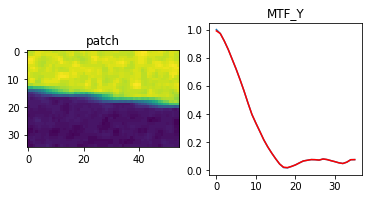

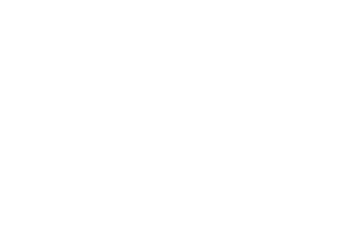

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]


epoch_loss = 0.00010202724661212415
Epoch 618/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

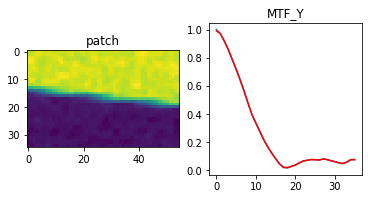

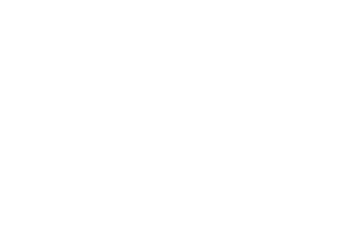

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]


epoch_loss = 0.00010170607856707647
Epoch 619/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

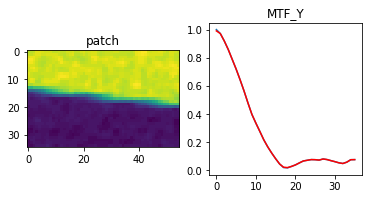

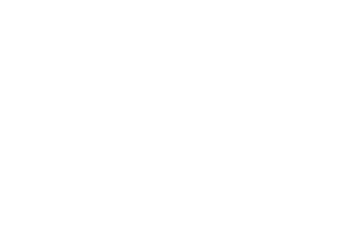

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]


epoch_loss = 0.00010138586367247626
Epoch 620/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

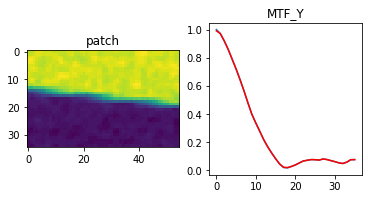

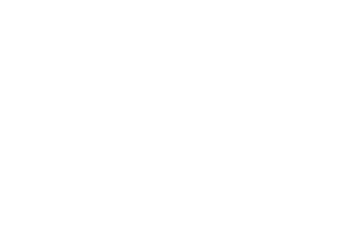

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 0.00010106895206263289
Epoch 621/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

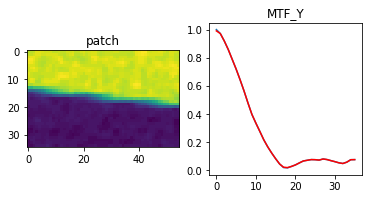

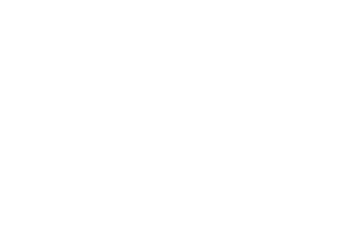

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]


epoch_loss = 0.00010075317550217733
Epoch 622/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

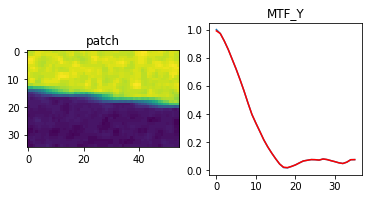

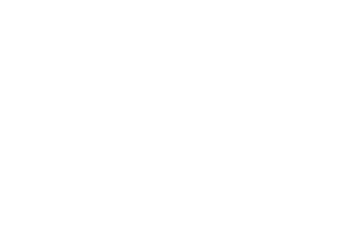

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 0.00010043742076959461
Epoch 623/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

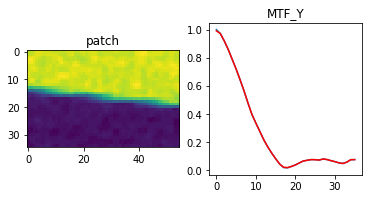

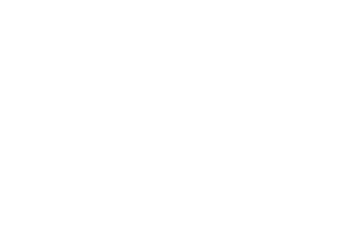

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]


epoch_loss = 0.00010012595157604665
Epoch 624/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

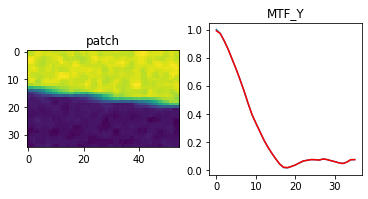

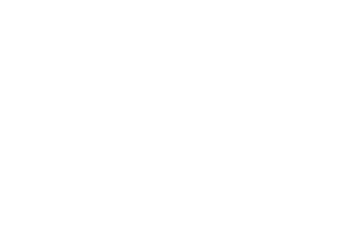

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.81it/s]


epoch_loss = 9.981555922422558e-05
Epoch 625/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

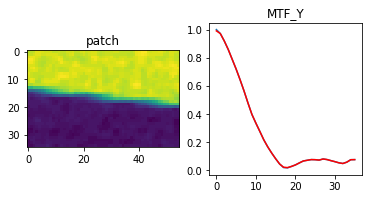

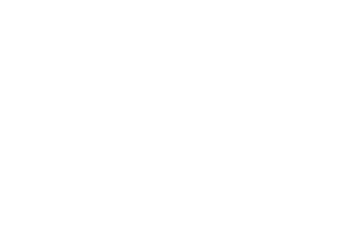

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.05it/s]


epoch_loss = 9.950629464583471e-05
Epoch 626/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

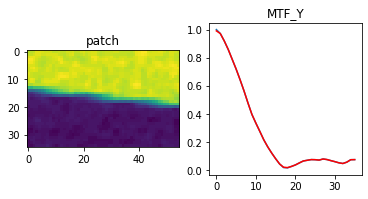

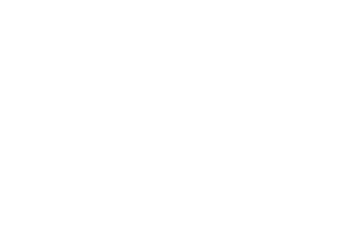

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.06it/s]


epoch_loss = 9.919775766320527e-05
Epoch 627/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

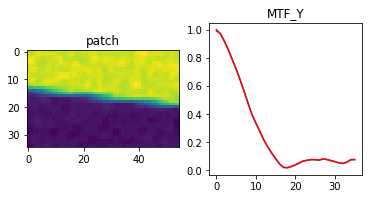

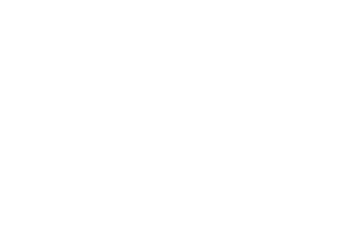

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]


epoch_loss = 9.88915708148852e-05
Epoch 628/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

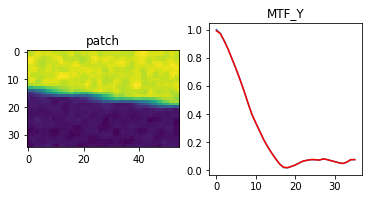

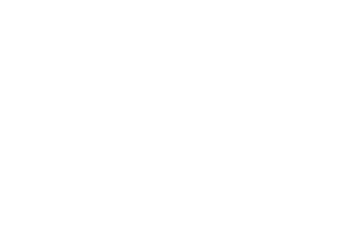

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]


epoch_loss = 9.858747944235802e-05
Epoch 629/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

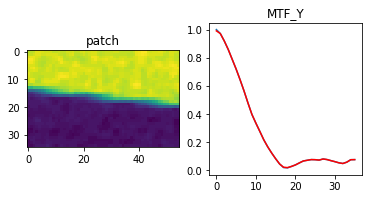

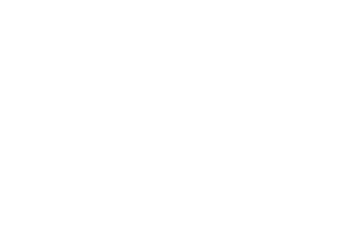

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.82it/s]


epoch_loss = 9.828437032410875e-05
Epoch 630/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

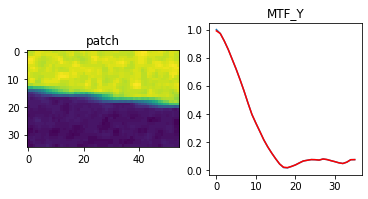

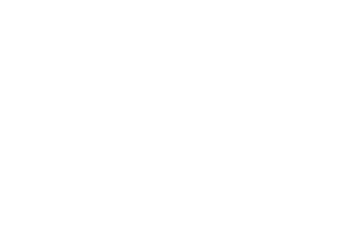

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.65it/s]


epoch_loss = 9.798225073609501e-05
Epoch 631/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

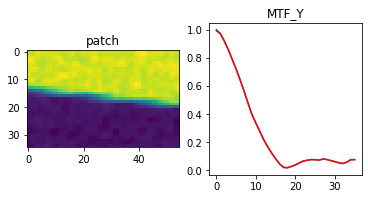

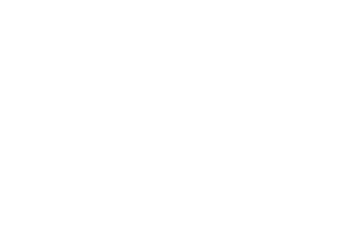

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]


epoch_loss = 9.768216841621324e-05
Epoch 632/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

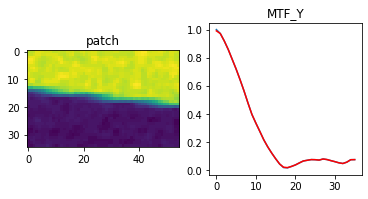

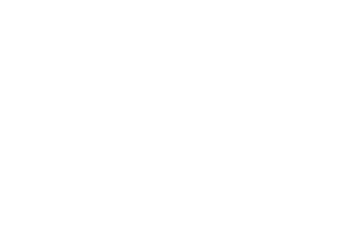

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.43it/s]


epoch_loss = 9.738407970871776e-05
Epoch 633/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

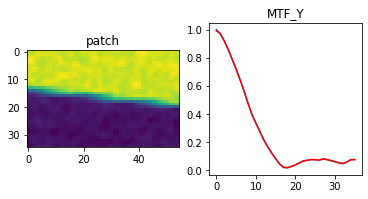

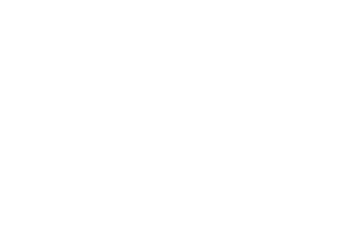

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 9.70871769823134e-05
Epoch 634/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

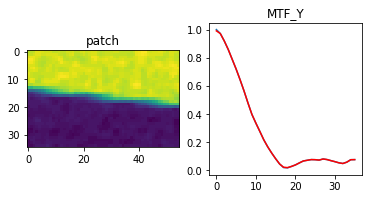

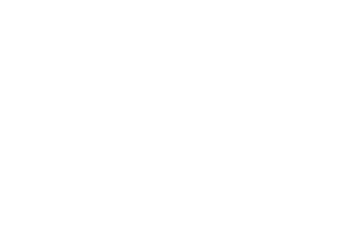

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.14it/s]


epoch_loss = 9.679226786829531e-05
Epoch 635/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

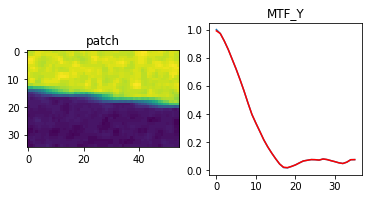

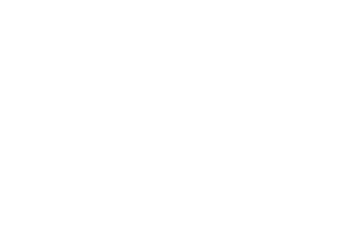

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]


epoch_loss = 9.649705316405743e-05
Epoch 636/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

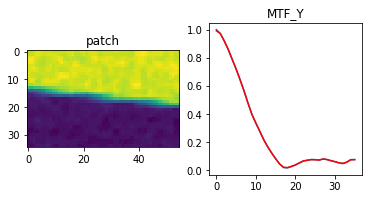

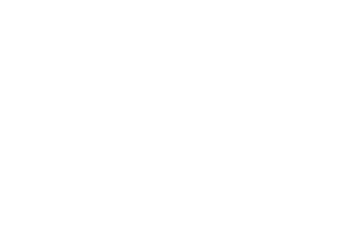

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 9.620522905606776e-05
Epoch 637/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

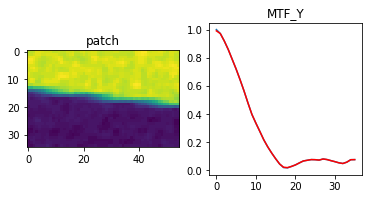

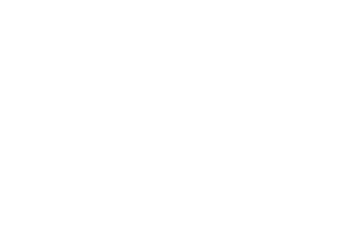

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 9.591538400854915e-05
Epoch 638/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

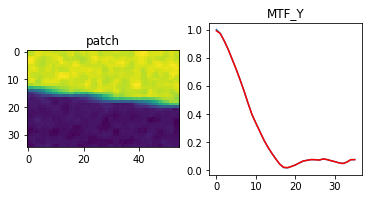

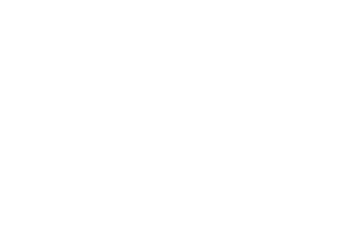

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]


epoch_loss = 9.562523337081075e-05
Epoch 639/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

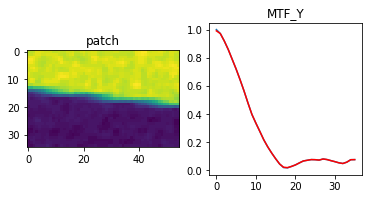

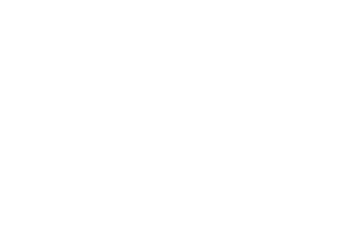

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]


epoch_loss = 9.533818229101598e-05
Epoch 640/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

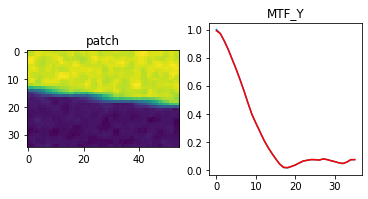

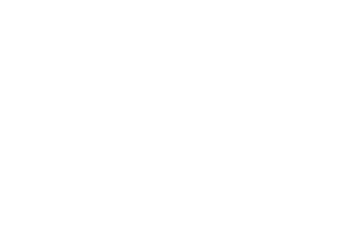

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 9.505102934781462e-05
Epoch 641/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

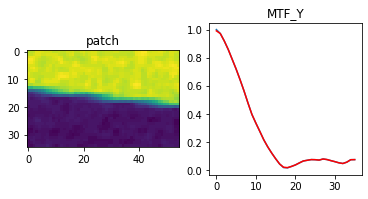

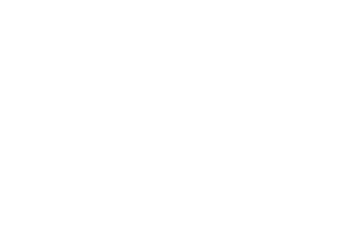

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]


epoch_loss = 9.476580453338102e-05
Epoch 642/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

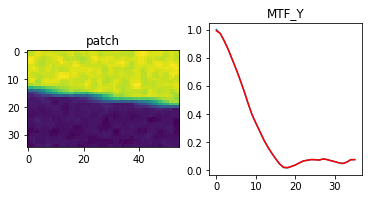

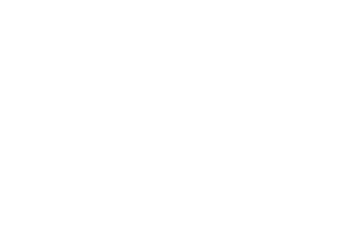

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 9.448266791878268e-05
Epoch 643/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

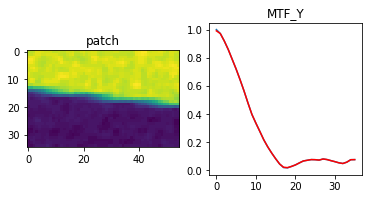

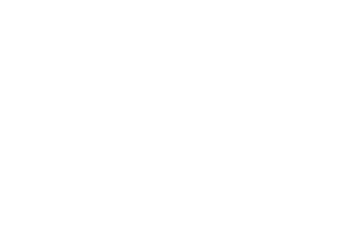

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]


epoch_loss = 9.420147398486733e-05
Epoch 644/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

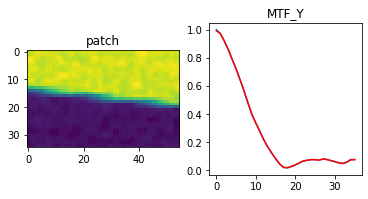

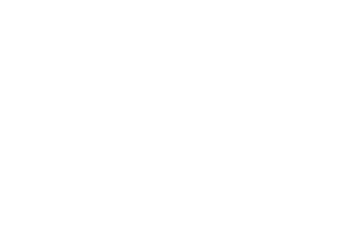

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]


epoch_loss = 9.392009087605402e-05
Epoch 645/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

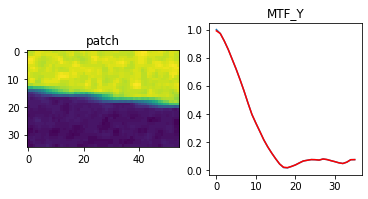

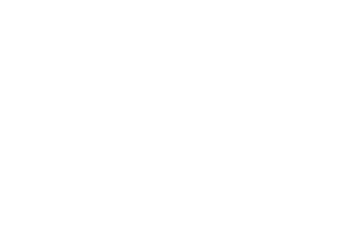

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.09it/s]


epoch_loss = 9.364071593154222e-05
Epoch 646/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

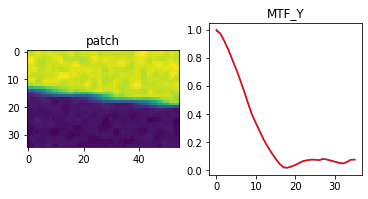

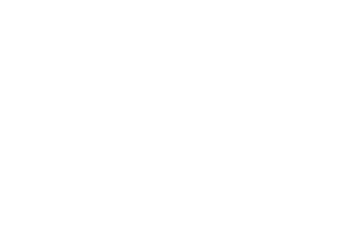

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 9.336314542451873e-05
Epoch 647/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

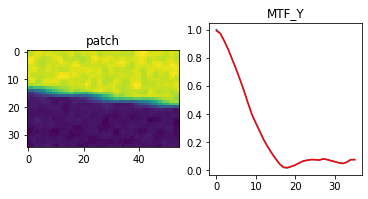

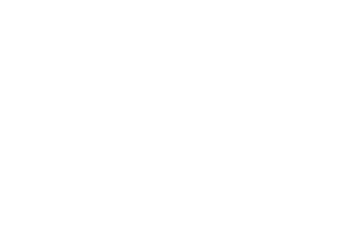

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 9.308550215791911e-05
Epoch 648/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

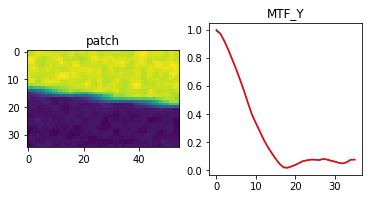

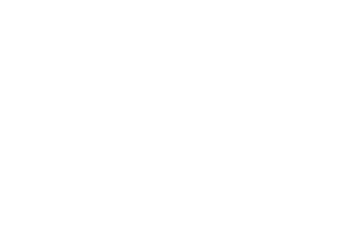

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 9.280975791625679e-05
Epoch 649/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

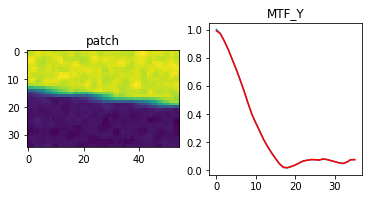

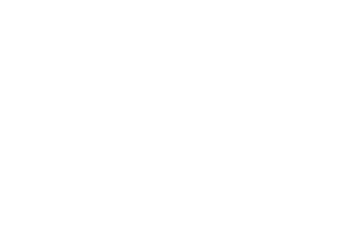

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]


epoch_loss = 9.25380882108584e-05
Epoch 650/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

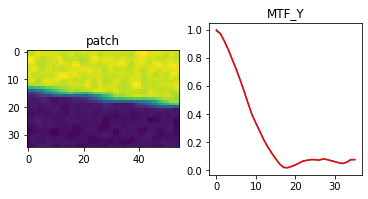

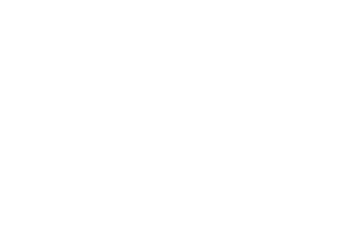

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.73it/s]


epoch_loss = 9.226403199136257e-05
Epoch 651/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

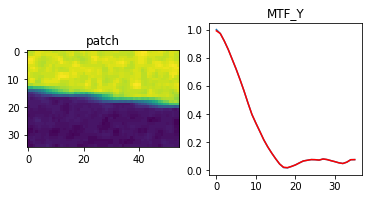

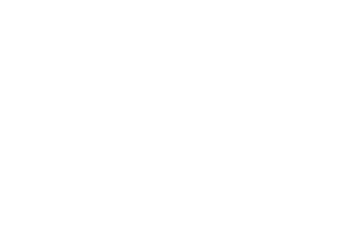

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 9.19940575840883e-05
Epoch 652/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

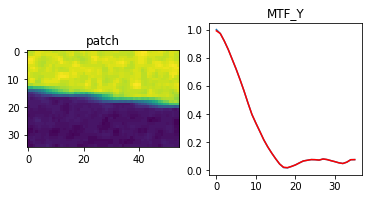

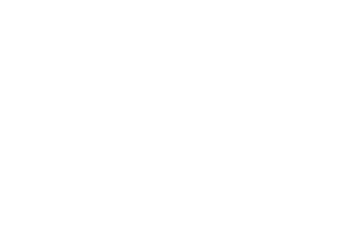

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.42it/s]


epoch_loss = 9.172384307021275e-05
Epoch 653/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

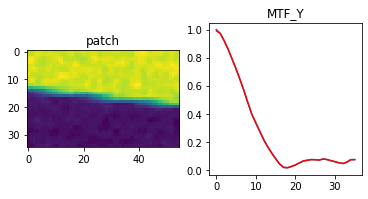

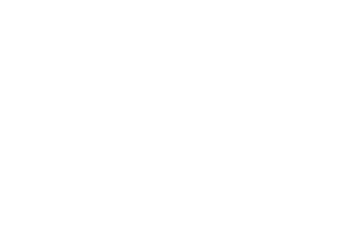

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 9.145554940914735e-05
Epoch 654/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

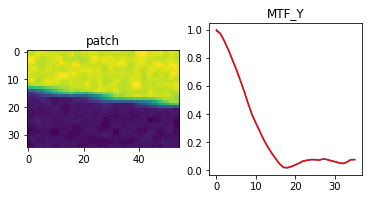

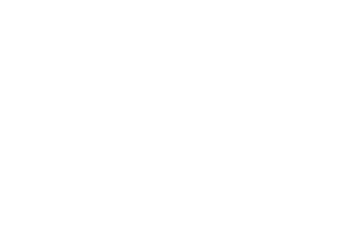

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 9.118908928940073e-05
Epoch 655/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

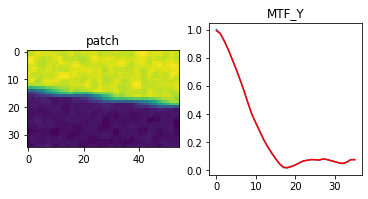

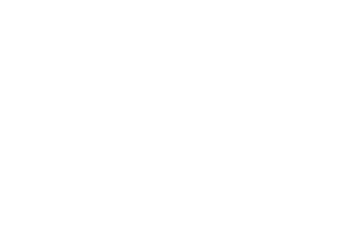

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.84it/s]


epoch_loss = 9.092358232010156e-05
Epoch 656/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

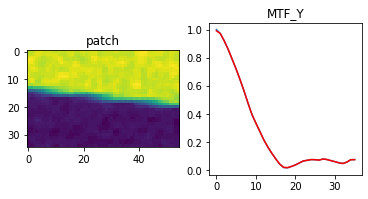

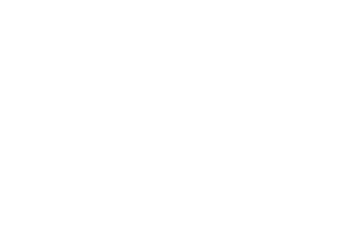

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.89it/s]


epoch_loss = 9.065762424143031e-05
Epoch 657/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

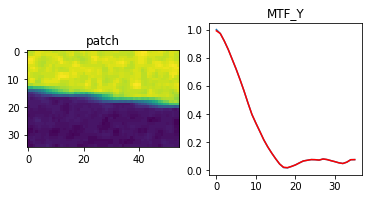

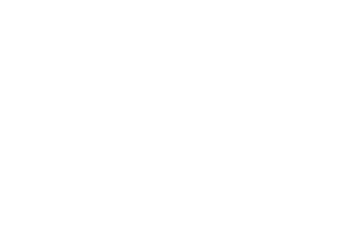

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 9.039584983838722e-05
Epoch 658/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

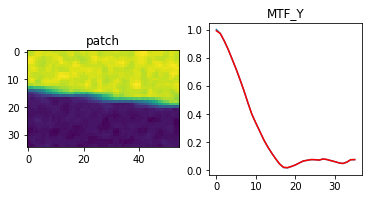

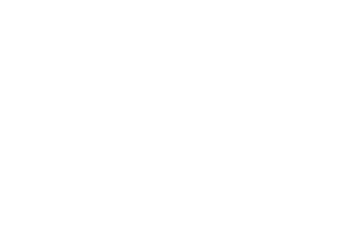

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 9.013257658807561e-05
Epoch 659/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

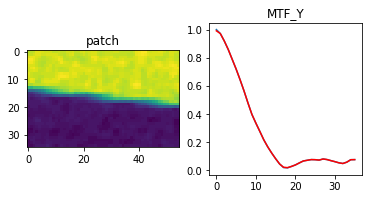

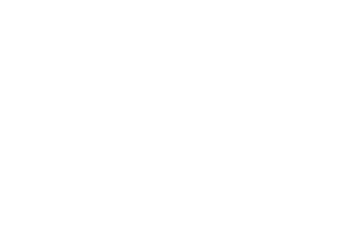

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.24it/s]


epoch_loss = 8.987342152977362e-05
Epoch 660/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

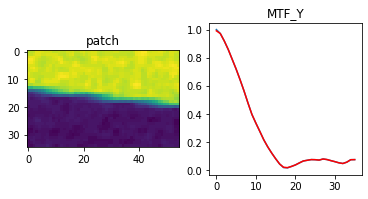

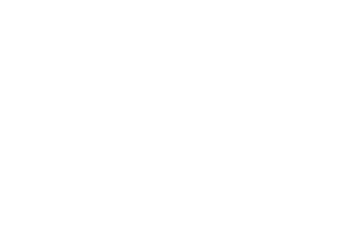

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 8.961395360529423e-05
Epoch 661/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

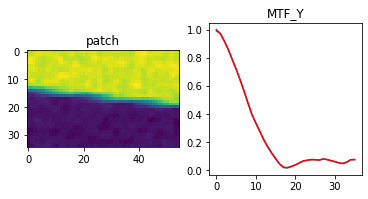

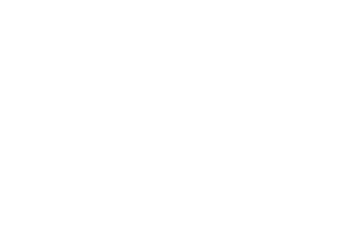

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 8.935526420827955e-05
Epoch 662/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

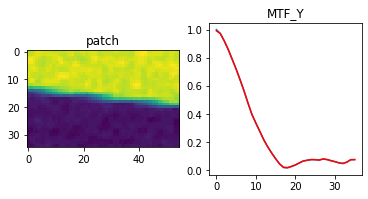

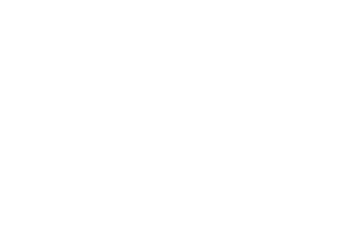

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]


epoch_loss = 8.90983865247108e-05
Epoch 663/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

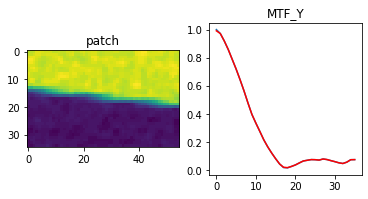

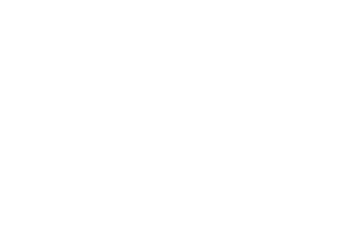

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.21it/s]


epoch_loss = 8.884335693437606e-05
Epoch 664/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

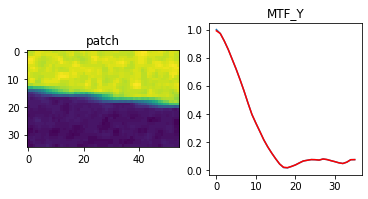

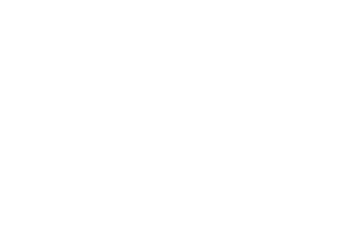

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 8.858913497533649e-05
Epoch 665/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

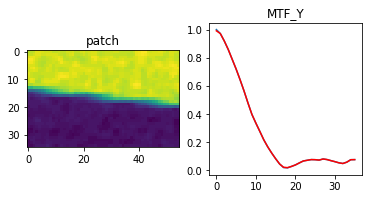

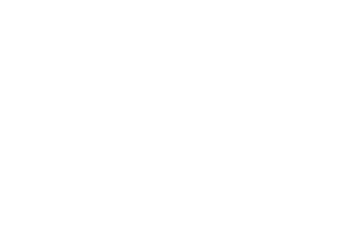

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 8.833663741825148e-05
Epoch 666/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

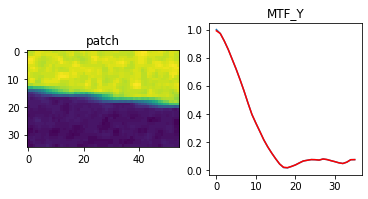

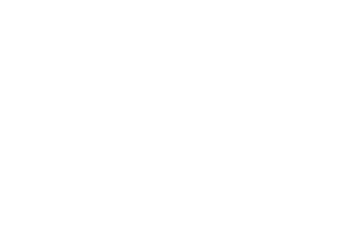

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.01it/s]


epoch_loss = 8.808383427094668e-05
Epoch 667/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

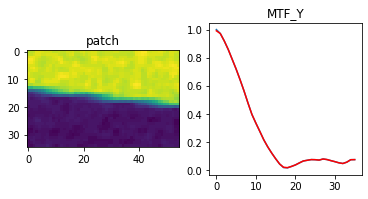

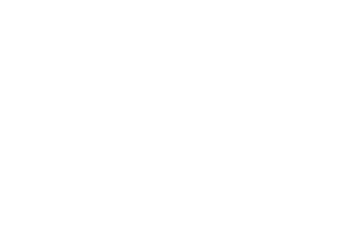

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 8.783395605860278e-05
Epoch 668/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

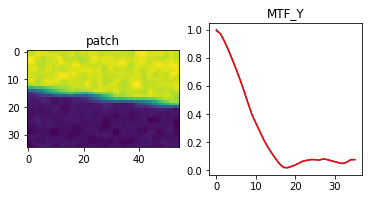

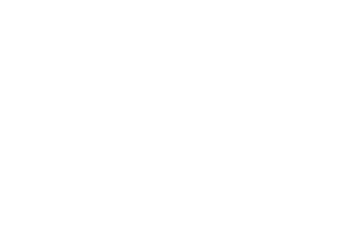

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 8.758260810282081e-05
Epoch 669/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

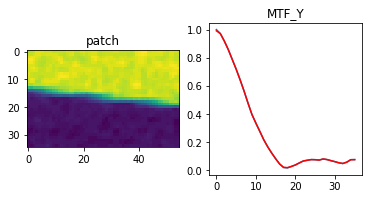

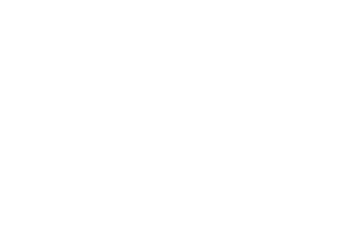

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 8.733417780604213e-05
Epoch 670/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

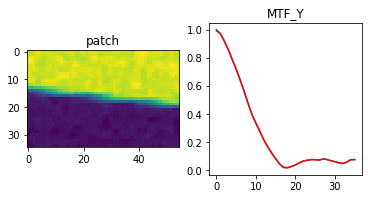

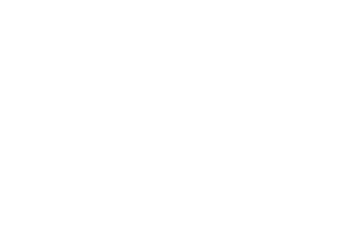

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 8.708966197445989e-05
Epoch 671/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

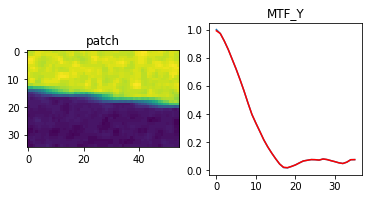

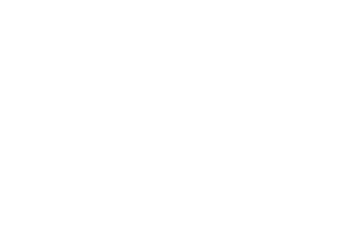

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 8.684268686920404e-05
Epoch 672/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

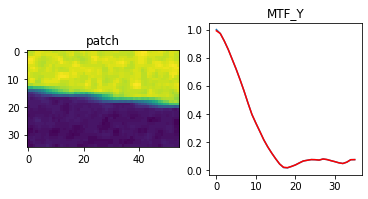

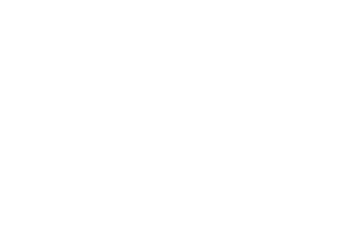

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]


epoch_loss = 8.659849845571443e-05
Epoch 673/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

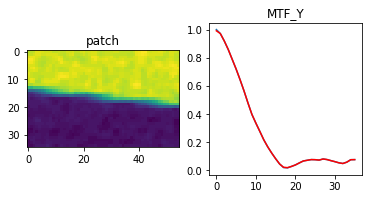

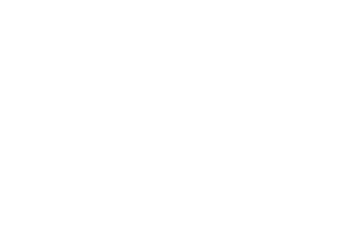

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.53it/s]


epoch_loss = 8.63549648784101e-05
Epoch 674/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

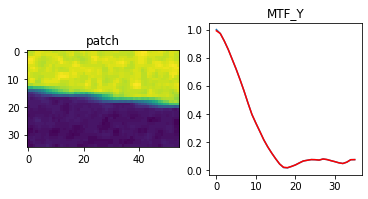

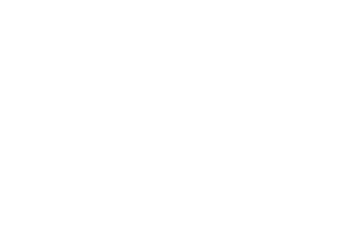

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.26it/s]


epoch_loss = 8.61122680362314e-05
Epoch 675/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

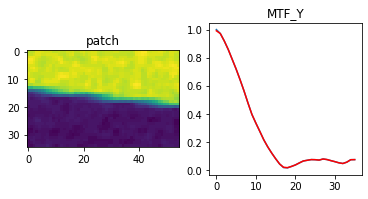

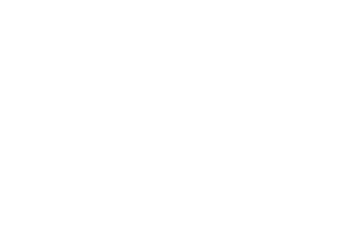

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 8.587127376813442e-05
Epoch 676/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

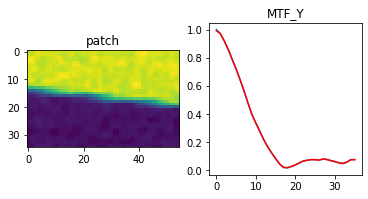

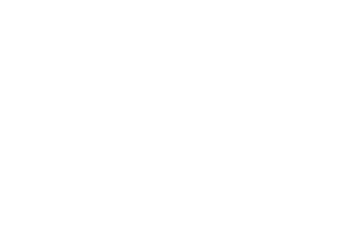

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 8.563197479816154e-05
Epoch 677/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

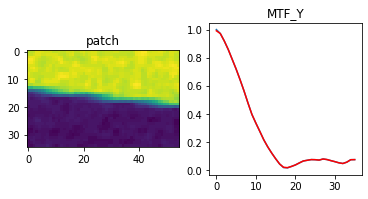

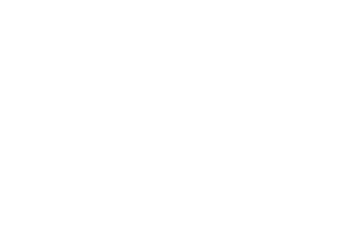

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]


epoch_loss = 8.539341069990769e-05
Epoch 678/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

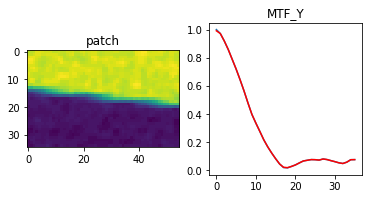

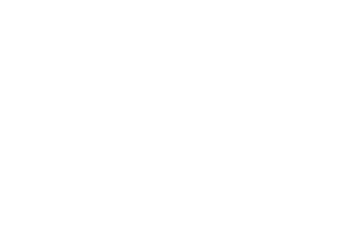

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]


epoch_loss = 8.515546505805105e-05
Epoch 679/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

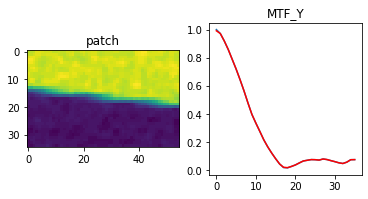

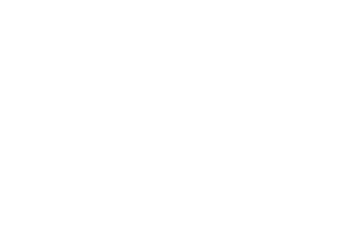

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]


epoch_loss = 8.491831249557436e-05
Epoch 680/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

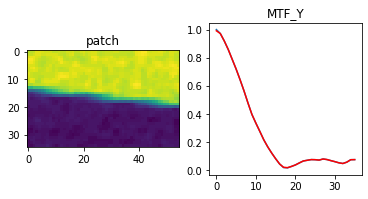

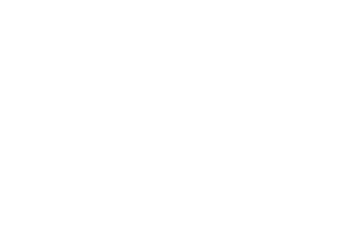

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]


epoch_loss = 8.468175656162202e-05
Epoch 681/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

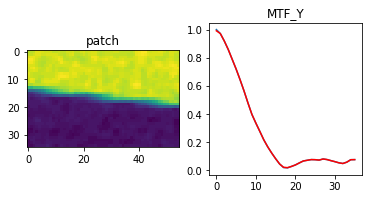

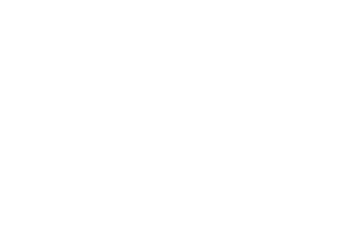

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 8.444790000794455e-05
Epoch 682/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

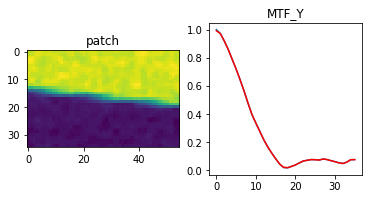

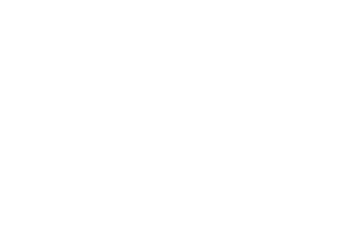

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 8.421481470577419e-05
Epoch 683/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

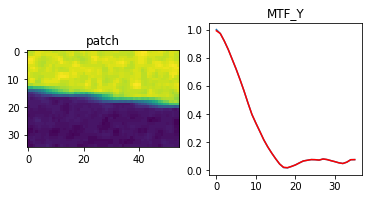

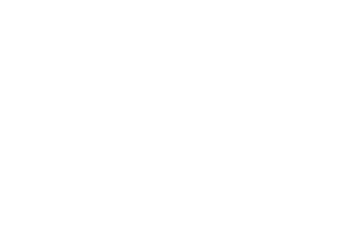

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.29it/s]


epoch_loss = 8.398237696383148e-05
Epoch 684/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

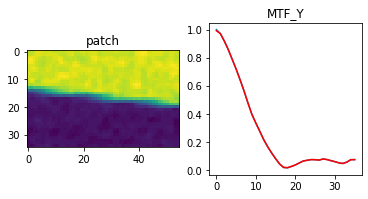

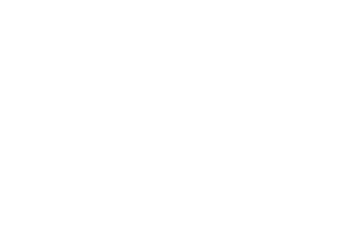

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]


epoch_loss = 8.375049947062507e-05
Epoch 685/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

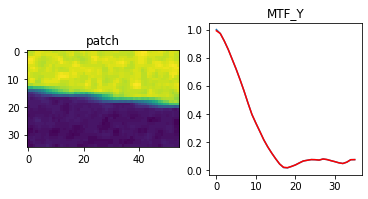

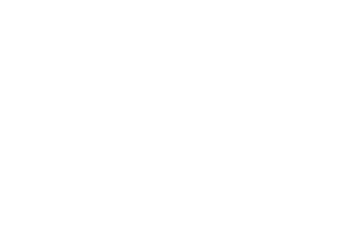

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 8.352148142876104e-05
Epoch 686/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

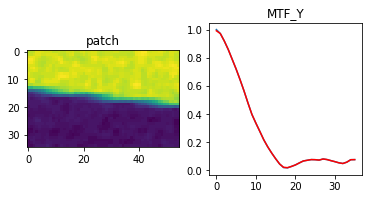

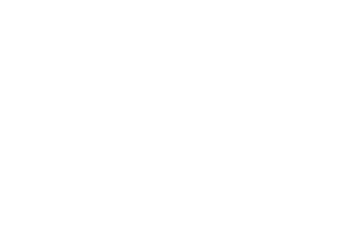

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]


epoch_loss = 8.329100091941655e-05
Epoch 687/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

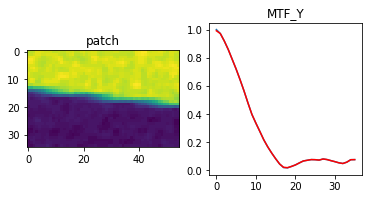

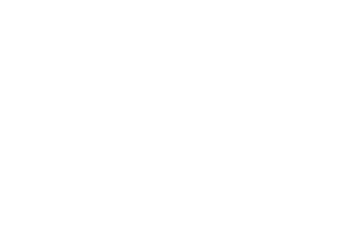

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.67it/s]


epoch_loss = 8.306313247885555e-05
Epoch 688/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

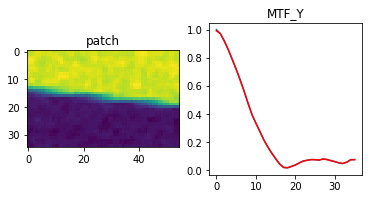

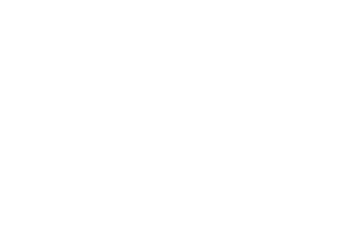

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]


epoch_loss = 8.283602801384404e-05
Epoch 689/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

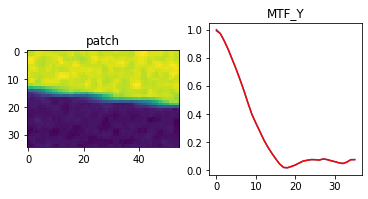

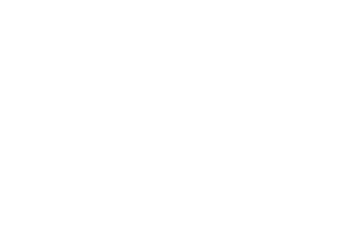

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]


epoch_loss = 8.26115719974041e-05
Epoch 690/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

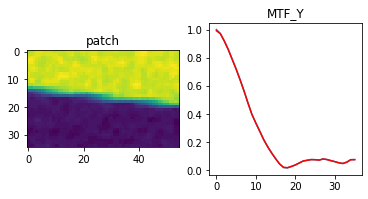

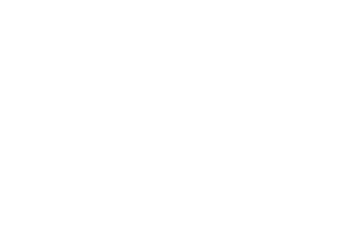

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 8.238569716922939e-05
Epoch 691/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

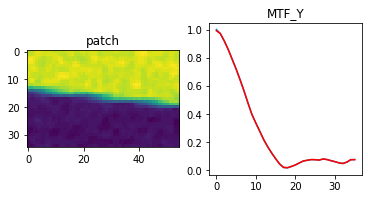

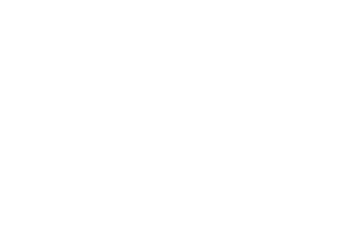

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 8.216243440983817e-05
Epoch 692/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

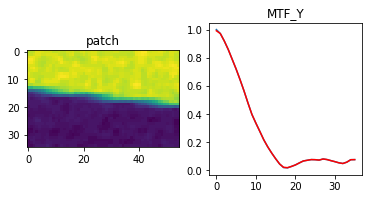

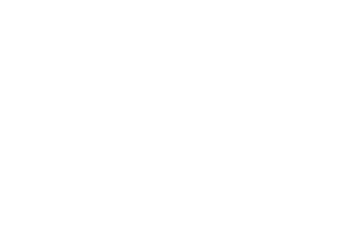

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 8.193987741833553e-05
Epoch 693/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

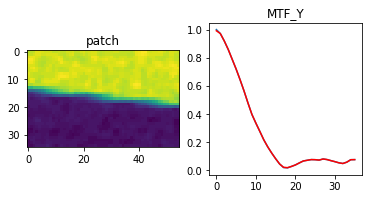

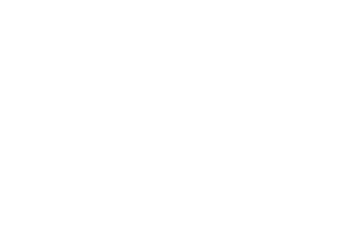

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]


epoch_loss = 8.17178952274844e-05
Epoch 694/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

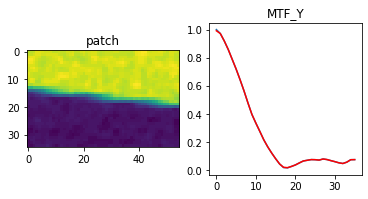

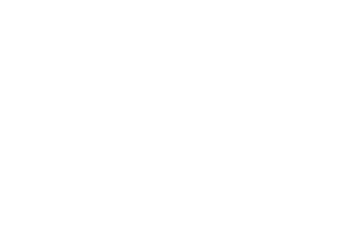

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.63it/s]


epoch_loss = 8.149858331307769e-05
Epoch 695/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

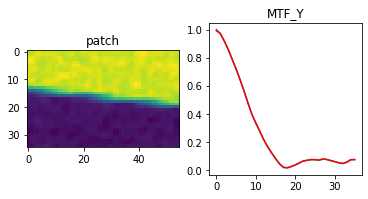

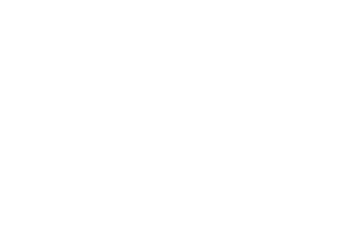

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 8.127778710331768e-05
Epoch 696/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

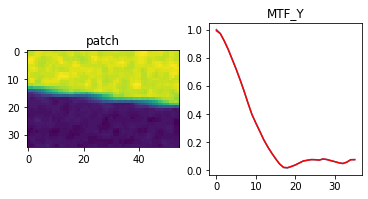

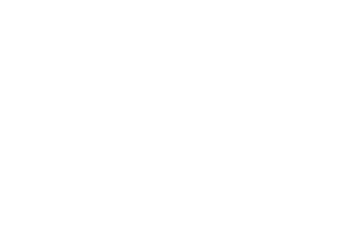

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]


epoch_loss = 8.105968299787492e-05
Epoch 697/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

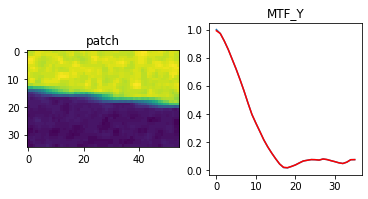

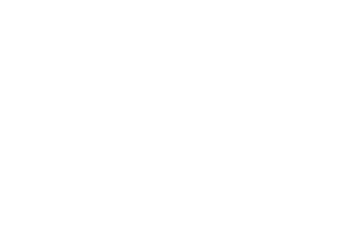

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]


epoch_loss = 8.084207365754992e-05
Epoch 698/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

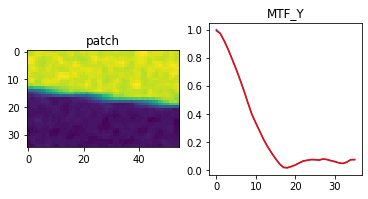

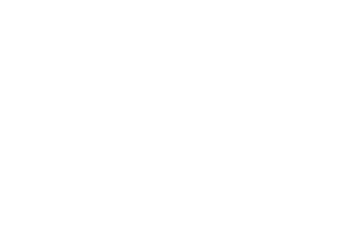

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]


epoch_loss = 8.062714186962694e-05
Epoch 699/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

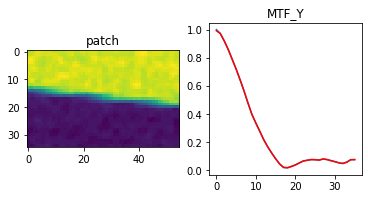

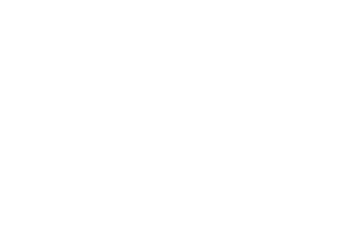

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.63it/s]


epoch_loss = 8.041078399401158e-05
Epoch 700/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

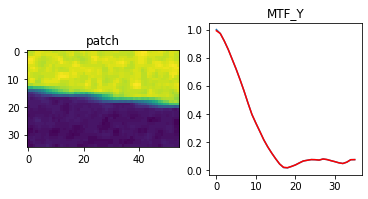

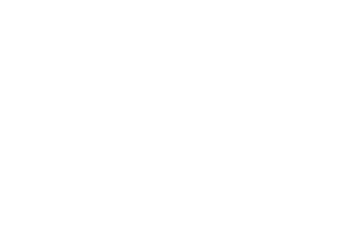

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]


epoch_loss = 8.019707456696779e-05
Epoch 701/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

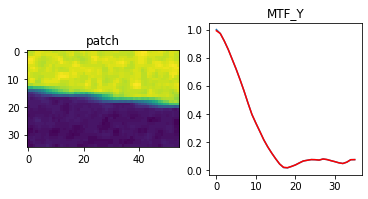

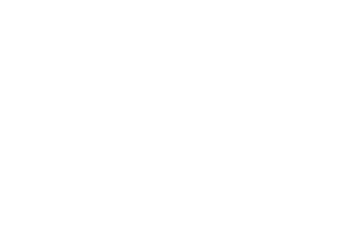

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.91it/s]


epoch_loss = 7.998084765858948e-05
Epoch 702/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

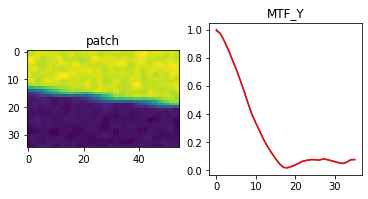

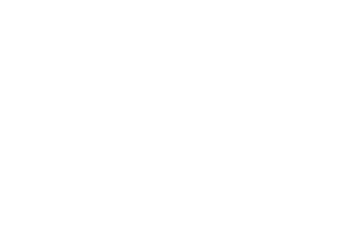

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.25it/s]


epoch_loss = 7.976818596944213e-05
Epoch 703/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

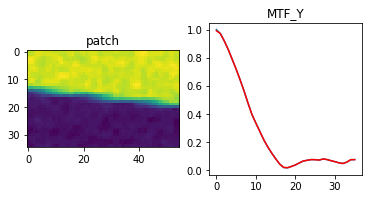

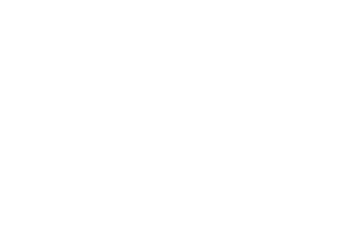

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.14it/s]


epoch_loss = 7.955818728078157e-05
Epoch 704/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

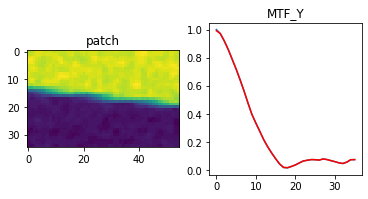

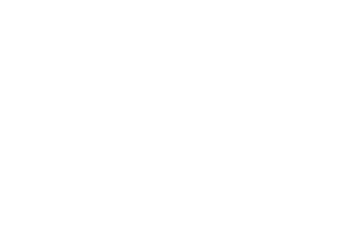

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.89it/s]


epoch_loss = 7.934676978038624e-05
Epoch 705/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

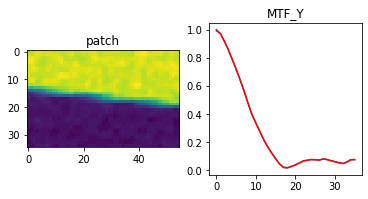

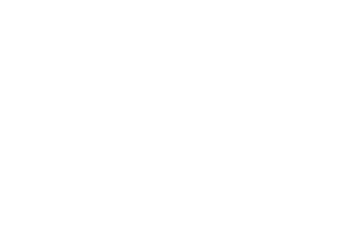

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 7.913787703728303e-05
Epoch 706/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

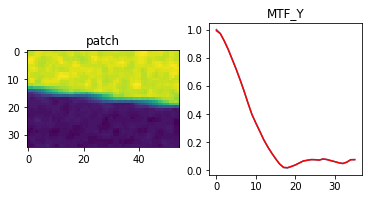

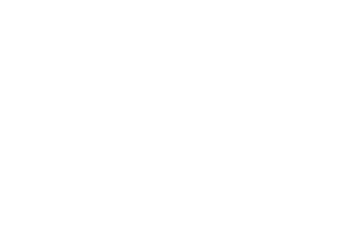

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.73it/s]


epoch_loss = 7.892959547461942e-05
Epoch 707/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

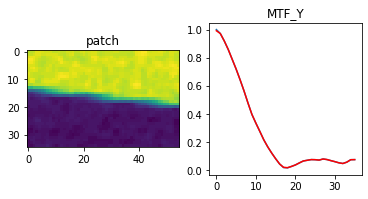

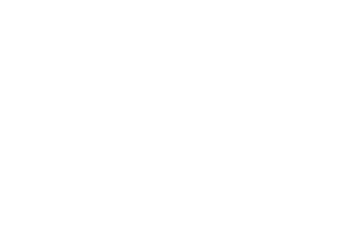

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]


epoch_loss = 7.872073911130428e-05
Epoch 708/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

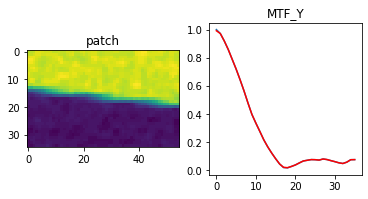

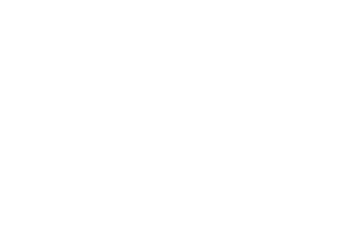

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]


epoch_loss = 7.851354166632518e-05
Epoch 709/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

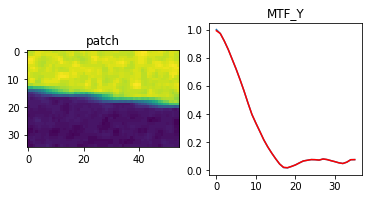

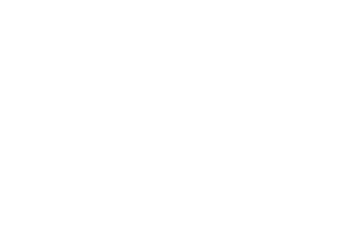

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.09it/s]


epoch_loss = 7.830687536625192e-05
Epoch 710/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

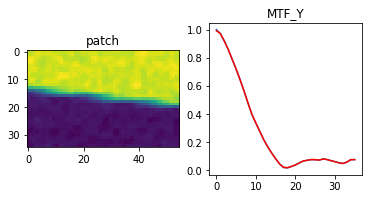

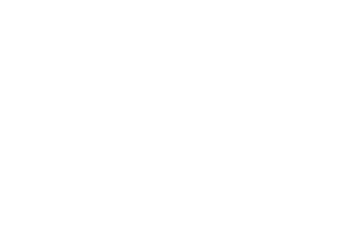

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 7.810279203113168e-05
Epoch 711/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

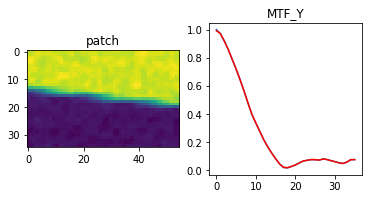

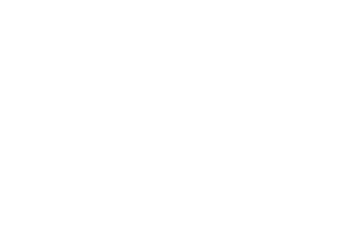

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.13it/s]


epoch_loss = 7.78992471168749e-05
Epoch 712/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

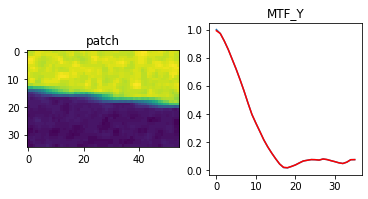

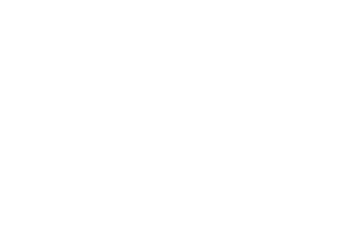

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]


epoch_loss = 7.76951274019666e-05
Epoch 713/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

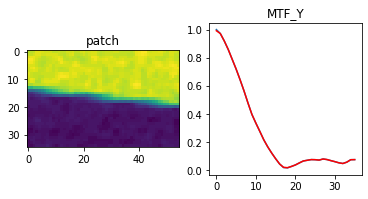

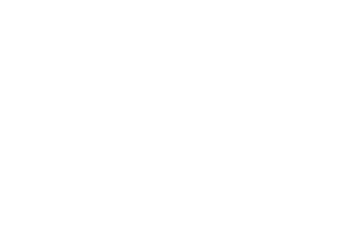

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]


epoch_loss = 7.749255746603012e-05
Epoch 714/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

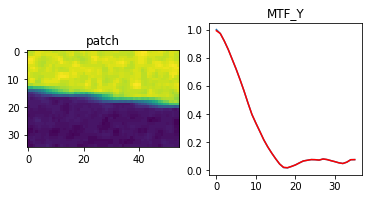

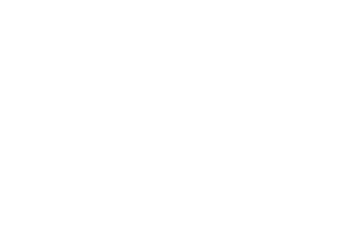

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 7.729056233074516e-05
Epoch 715/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

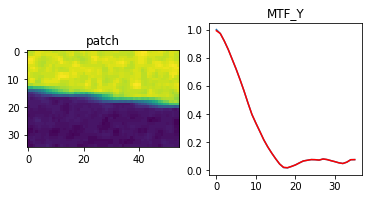

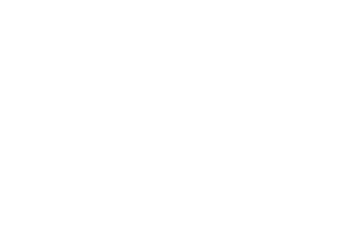

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]


epoch_loss = 7.709115016041324e-05
Epoch 716/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

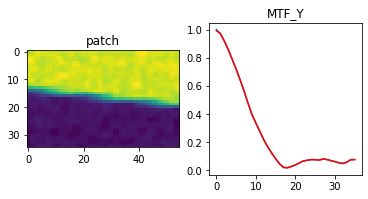

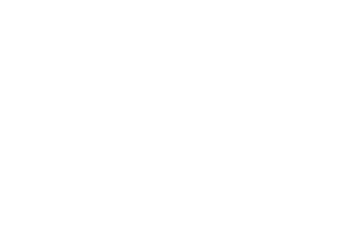

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]


epoch_loss = 7.688924233661965e-05
Epoch 717/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

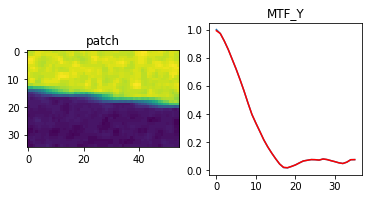

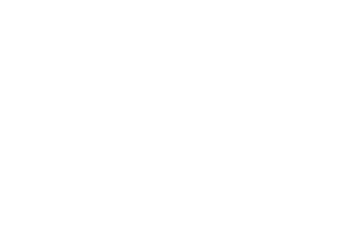

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 7.669069600524381e-05
Epoch 718/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

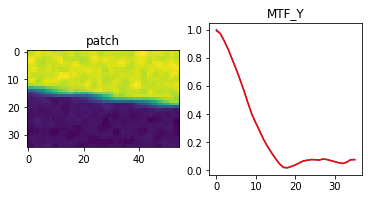

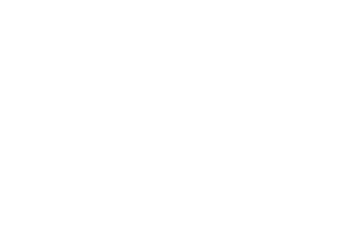

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 7.649279723409563e-05
Epoch 719/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

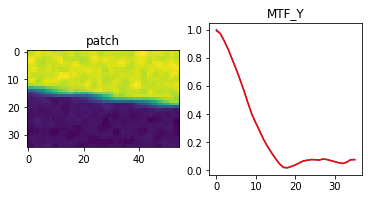

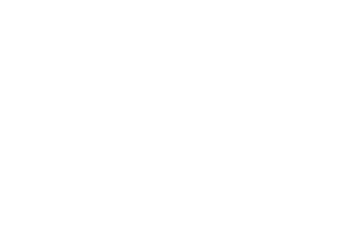

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]


epoch_loss = 7.629644096596166e-05
Epoch 720/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

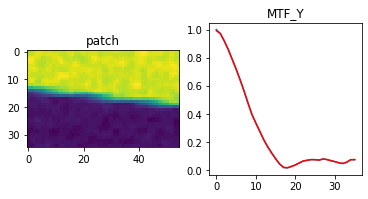

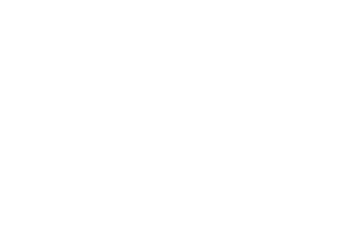

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 7.609945168951526e-05
Epoch 721/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

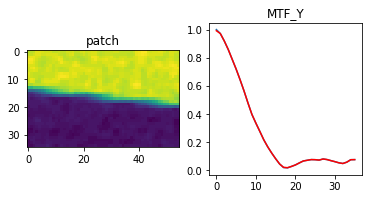

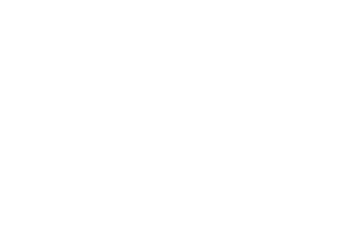

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]


epoch_loss = 7.590511086164042e-05
Epoch 722/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

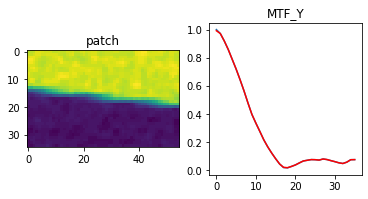

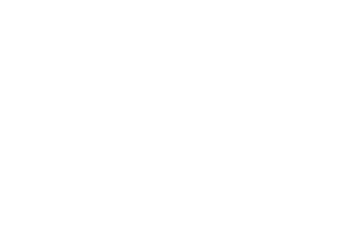

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.75it/s]


epoch_loss = 7.571015885332599e-05
Epoch 723/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

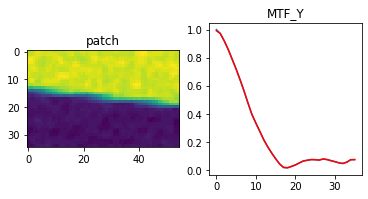

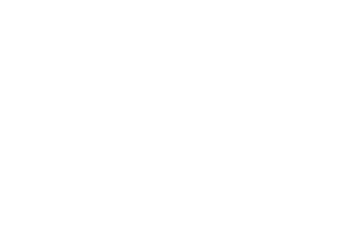

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.29it/s]


epoch_loss = 7.55167129682377e-05
Epoch 724/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

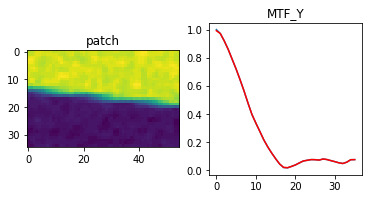

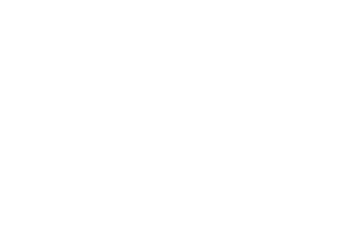

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.14it/s]


epoch_loss = 7.532374729635194e-05
Epoch 725/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

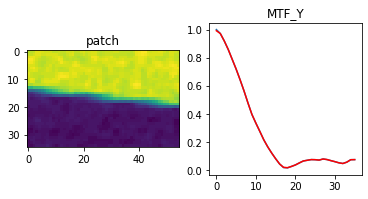

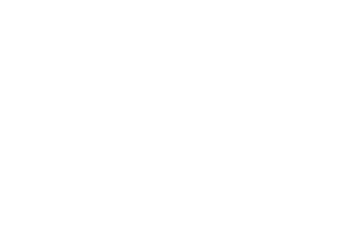

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.31it/s]


epoch_loss = 7.513031596317887e-05
Epoch 726/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

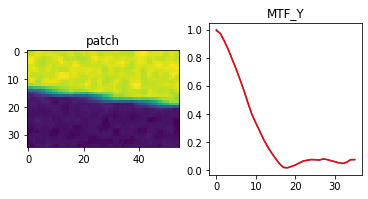

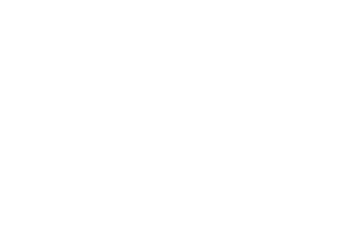

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.04it/s]


epoch_loss = 7.494031160604209e-05
Epoch 727/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

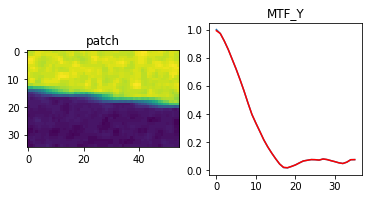

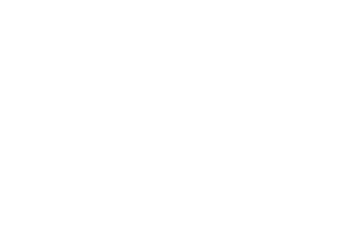

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.97it/s]


epoch_loss = 7.475083839381114e-05
Epoch 728/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

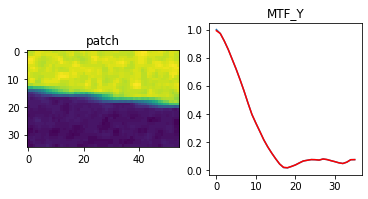

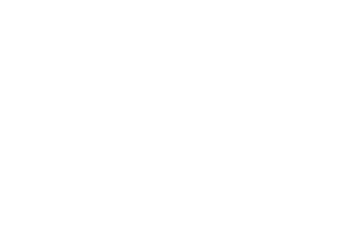

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.43it/s]


epoch_loss = 7.456079765688628e-05
Epoch 729/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

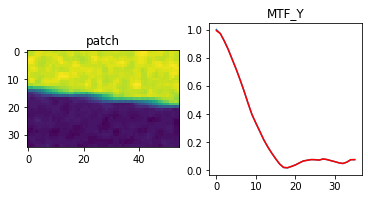

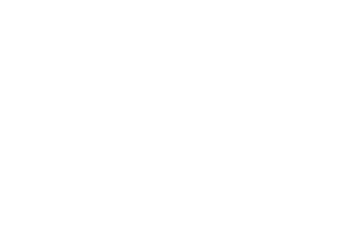

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]


epoch_loss = 7.437225576722994e-05
Epoch 730/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

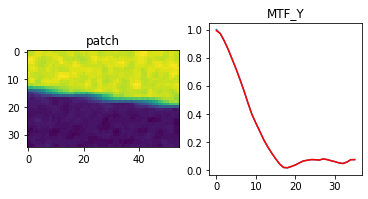

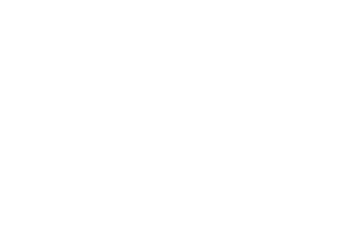

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]


epoch_loss = 7.41830444894731e-05
Epoch 731/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

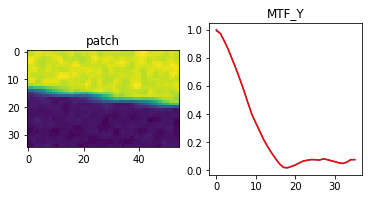

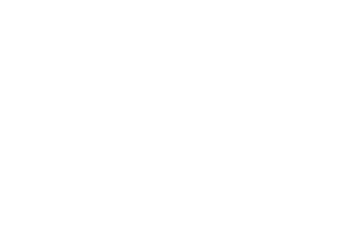

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 7.399741298286244e-05
Epoch 732/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

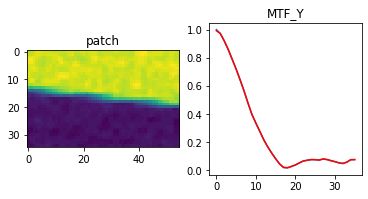

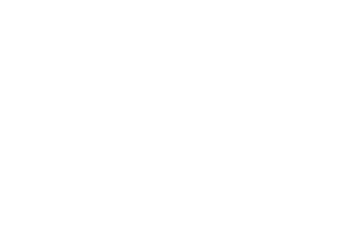

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 7.381023169727996e-05
Epoch 733/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

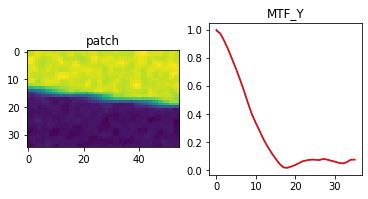

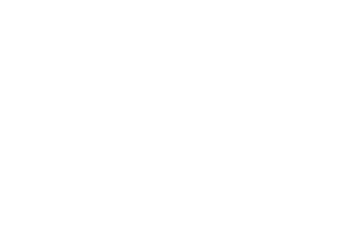

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]


epoch_loss = 7.362453470705077e-05
Epoch 734/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

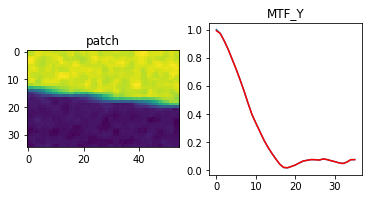

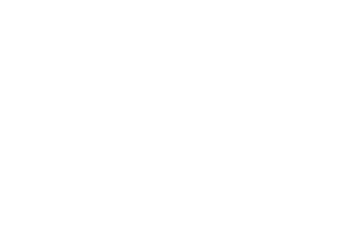

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]


epoch_loss = 7.344027835642919e-05
Epoch 735/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

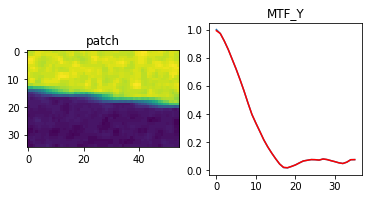

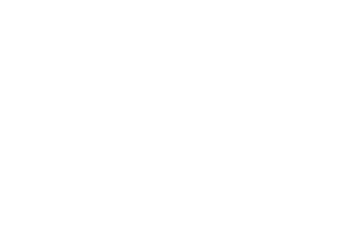

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]


epoch_loss = 7.32554544811137e-05
Epoch 736/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

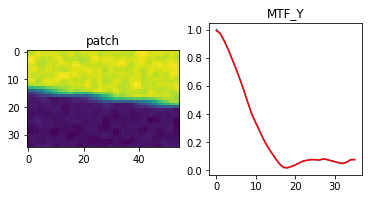

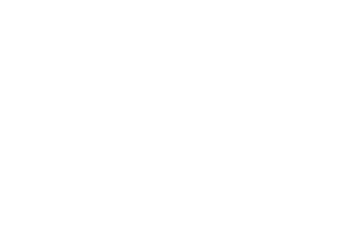

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]


epoch_loss = 7.30740066501312e-05
Epoch 737/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

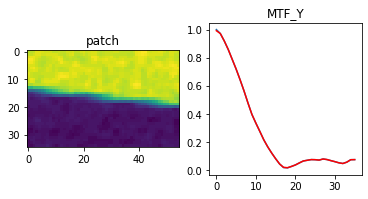

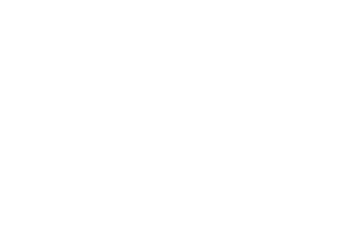

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.11it/s]


epoch_loss = 7.289014320122078e-05
Epoch 738/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

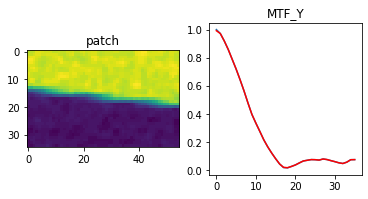

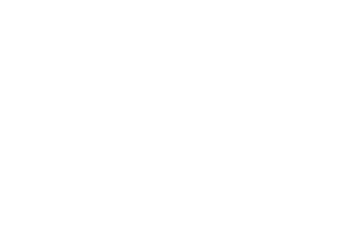

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]


epoch_loss = 7.270953938132152e-05
Epoch 739/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

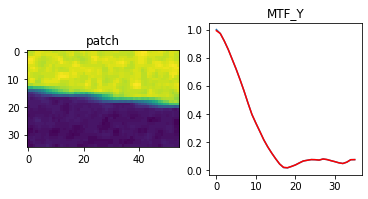

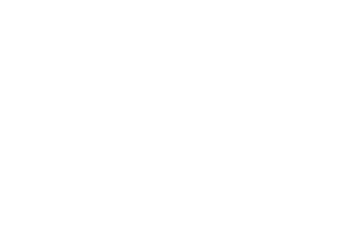

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 7.25284917280078e-05
Epoch 740/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

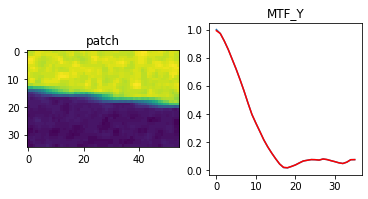

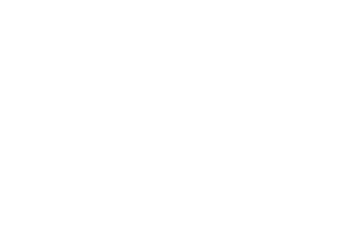

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.40it/s]


epoch_loss = 7.234884105855599e-05
Epoch 741/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

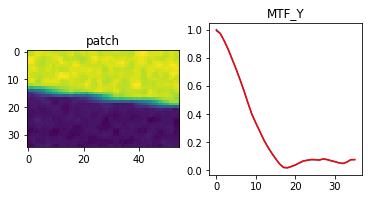

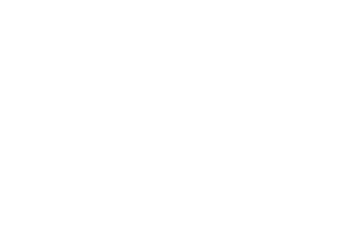

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]


epoch_loss = 7.216864469228312e-05
Epoch 742/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

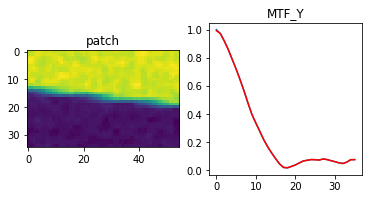

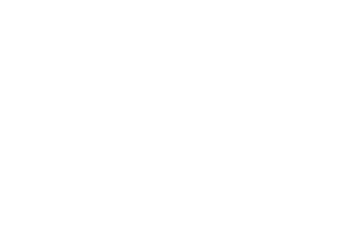

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]


epoch_loss = 7.199180981842801e-05
Epoch 743/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

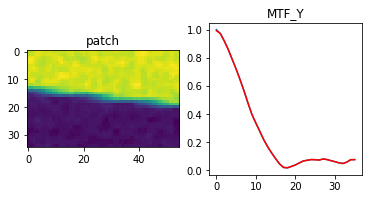

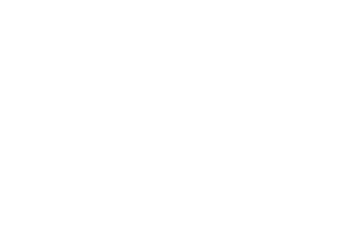

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 7.181245746323839e-05
Epoch 744/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

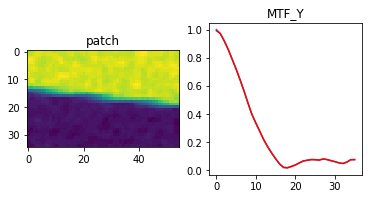

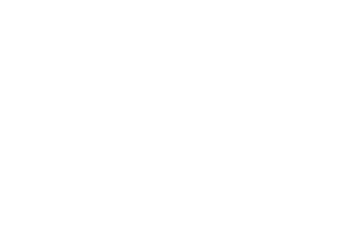

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]


epoch_loss = 7.163645204855129e-05
Epoch 745/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

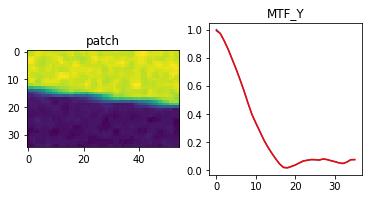

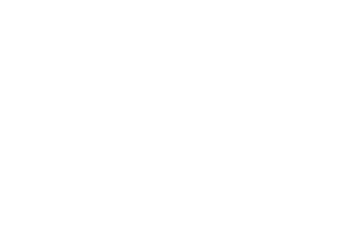

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]


epoch_loss = 7.145990093704313e-05
Epoch 746/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

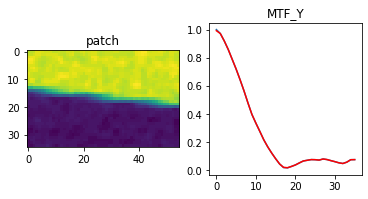

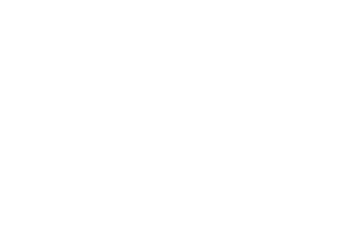

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.10it/s]


epoch_loss = 7.128470315365121e-05
Epoch 747/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

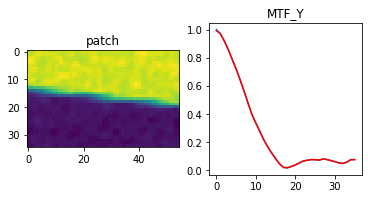

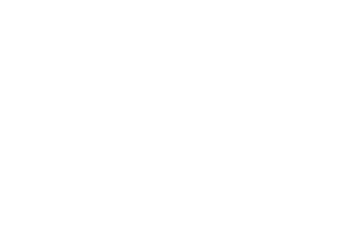

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]


epoch_loss = 7.110906153684482e-05
Epoch 748/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

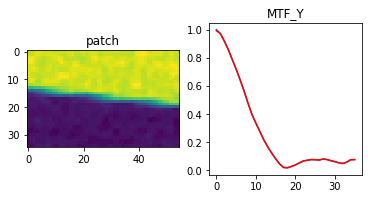

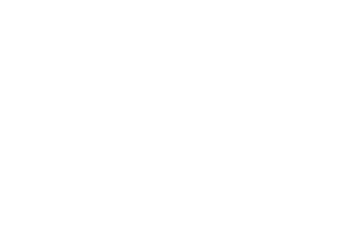

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.66it/s]


epoch_loss = 7.093665044521913e-05
Epoch 749/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

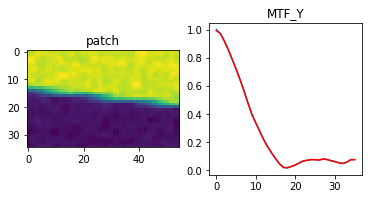

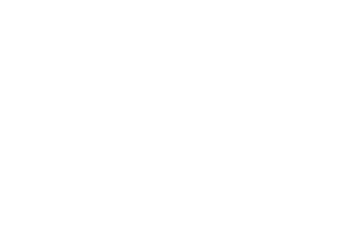

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 7.076172914821655e-05
Epoch 750/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

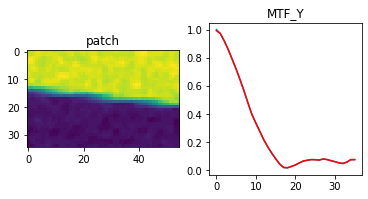

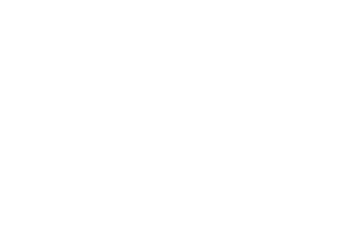

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 7.058919436531141e-05
Epoch 751/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

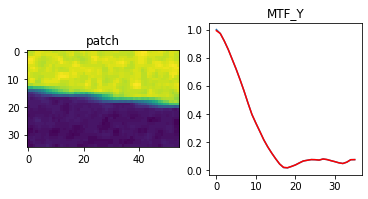

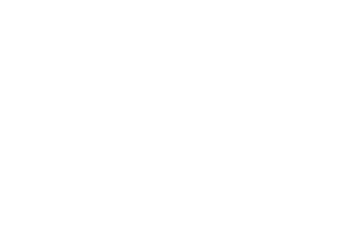

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 7.041802746243775e-05
Epoch 752/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

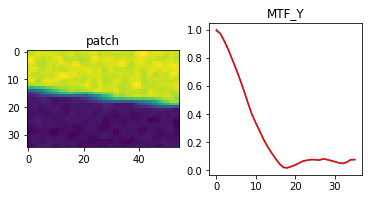

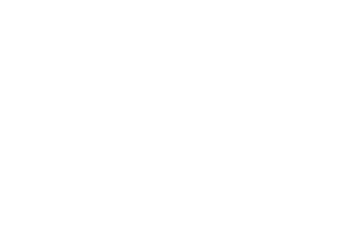

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.95it/s]


epoch_loss = 7.024627848295495e-05
Epoch 753/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

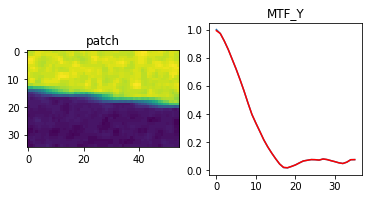

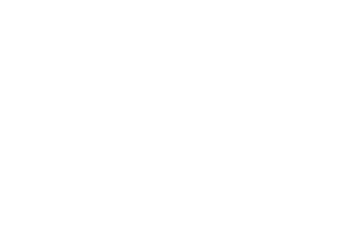

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]


epoch_loss = 7.007597014307976e-05
Epoch 754/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

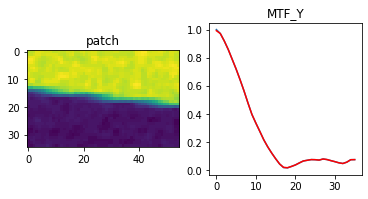

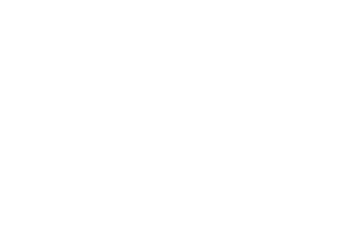

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 6.990684778429568e-05
Epoch 755/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

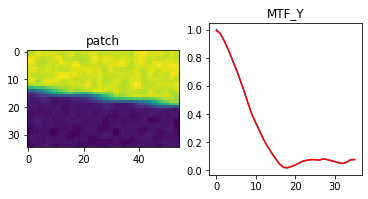

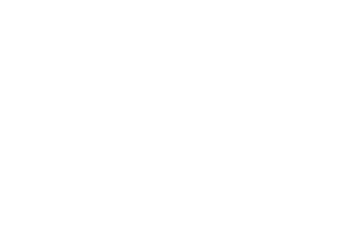

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.10it/s]


epoch_loss = 6.973822746658698e-05
Epoch 756/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

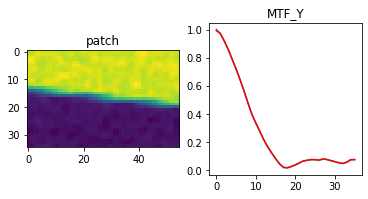

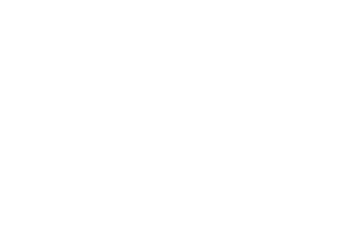

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.63it/s]


epoch_loss = 6.956901779631153e-05
Epoch 757/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

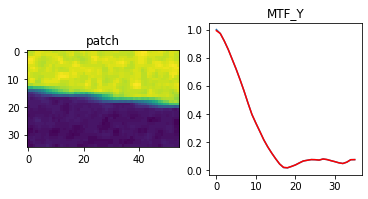

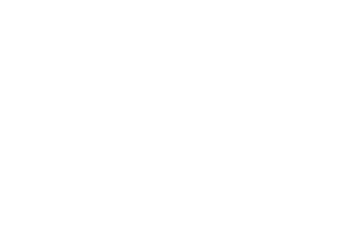

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 6.94011541781947e-05
Epoch 758/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

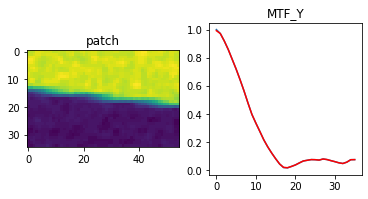

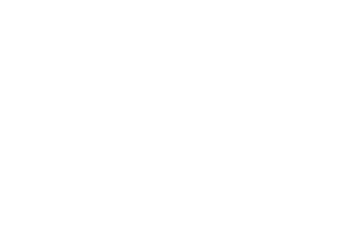

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]


epoch_loss = 6.923465116415173e-05
Epoch 759/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

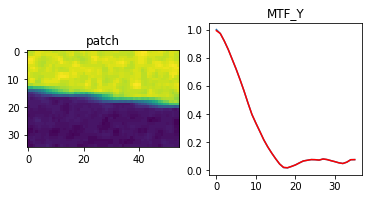

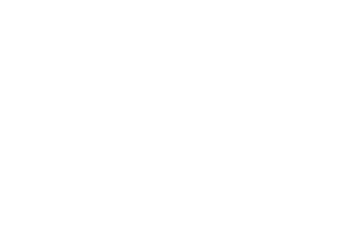

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.96it/s]


epoch_loss = 6.906756607349962e-05
Epoch 760/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

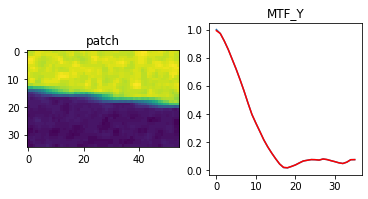

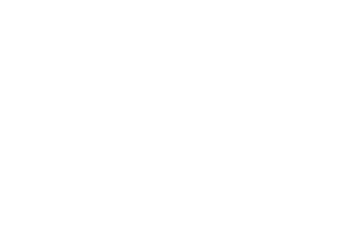

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.90it/s]


epoch_loss = 6.890281656524166e-05
Epoch 761/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

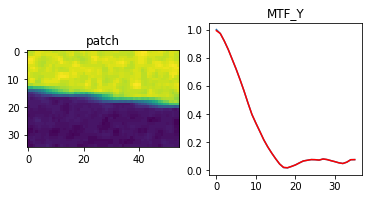

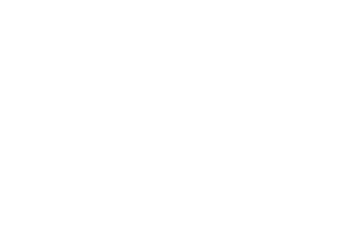

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 6.873935490148142e-05
Epoch 762/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

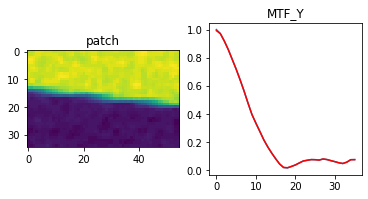

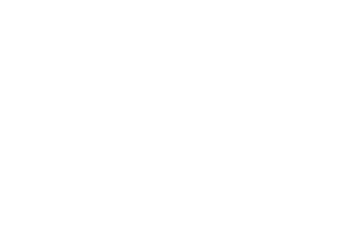

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 6.857347034383565e-05
Epoch 763/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

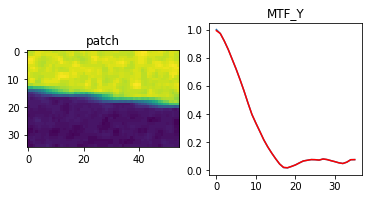

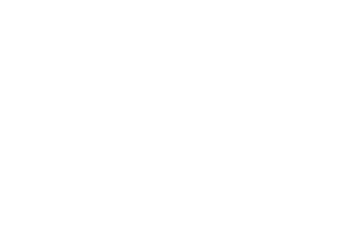

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.91it/s]


epoch_loss = 6.840978312538937e-05
Epoch 764/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

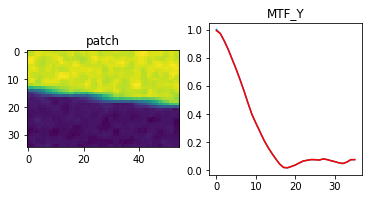

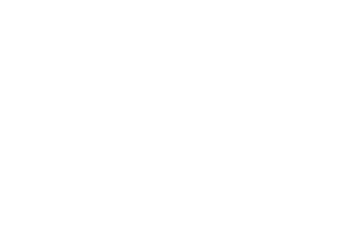

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 6.824747106293216e-05
Epoch 765/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

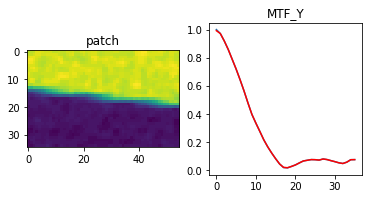

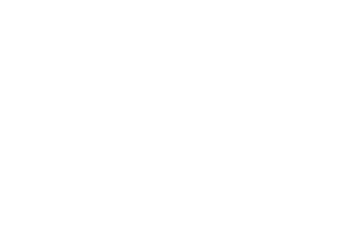

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]


epoch_loss = 6.808448961237445e-05
Epoch 766/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

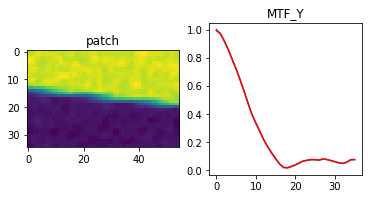

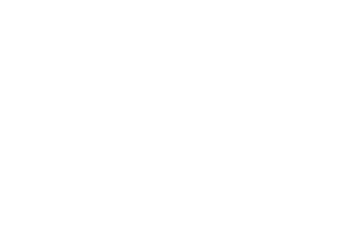

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]


epoch_loss = 6.792387284804136e-05
Epoch 767/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

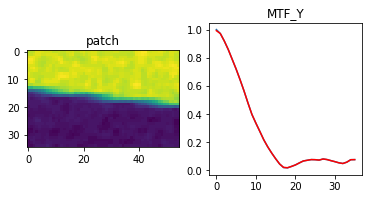

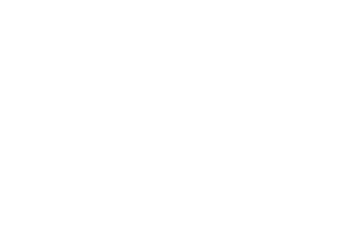

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.84it/s]


epoch_loss = 6.776264490326867e-05
Epoch 768/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

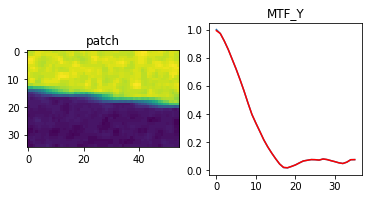

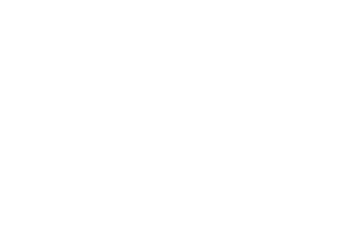

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]


epoch_loss = 6.760274118278176e-05
Epoch 769/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

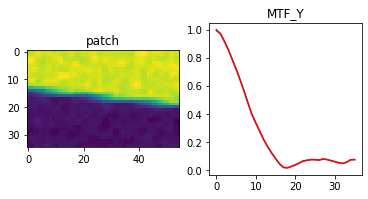

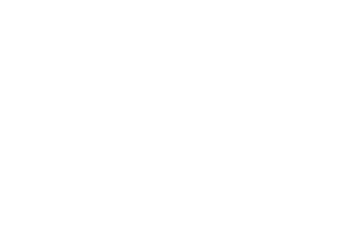

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 6.74431212246418e-05
Epoch 770/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

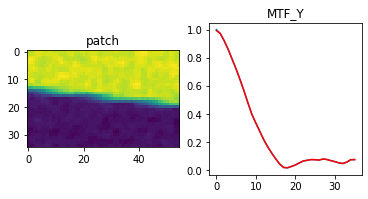

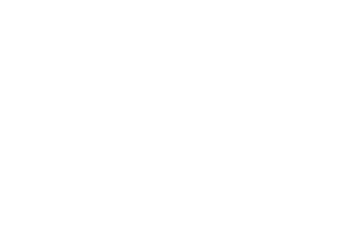

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.23it/s]


epoch_loss = 6.728394509991631e-05
Epoch 771/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

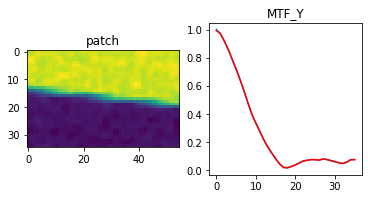

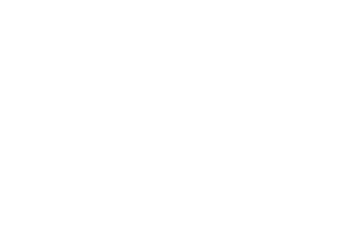

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.20it/s]


epoch_loss = 6.712601316394284e-05
Epoch 772/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

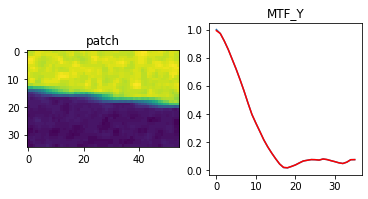

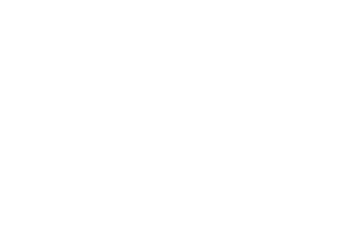

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]


epoch_loss = 6.696752097923309e-05
Epoch 773/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

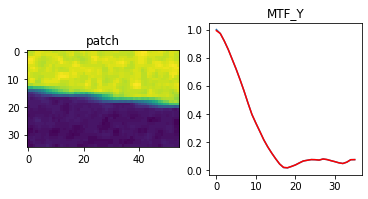

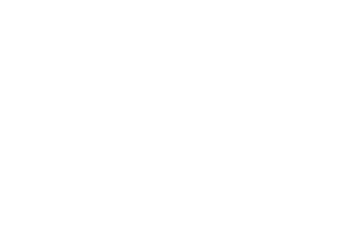

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.98it/s]


epoch_loss = 6.681121158180758e-05
Epoch 774/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

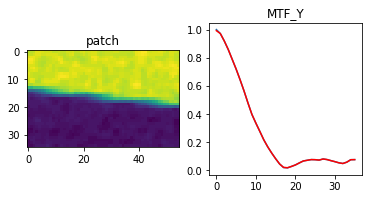

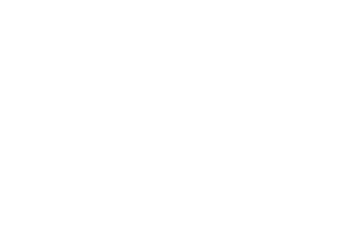

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.76it/s]


epoch_loss = 6.665340333711356e-05
Epoch 775/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

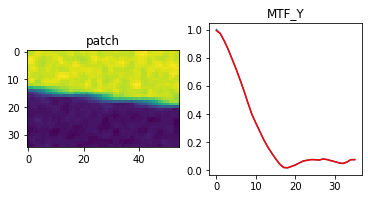

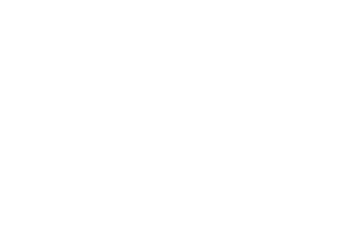

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.85it/s]


epoch_loss = 6.649875285802409e-05
Epoch 776/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

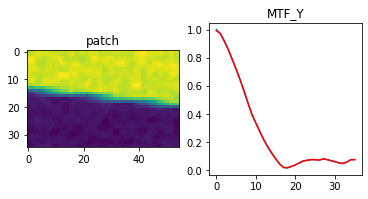

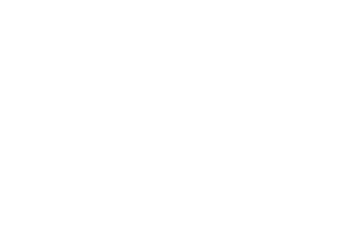

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 6.634354213019833e-05
Epoch 777/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

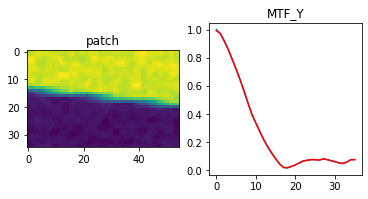

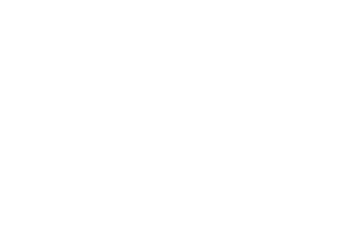

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.75it/s]


epoch_loss = 6.618866609642282e-05
Epoch 778/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

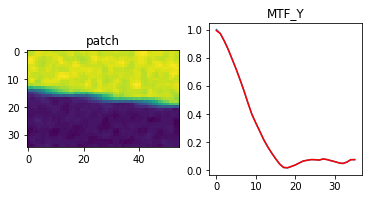

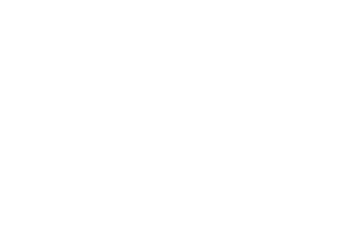

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 6.603410292882472e-05
Epoch 779/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

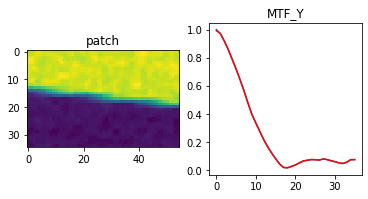

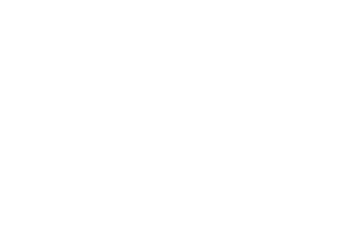

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 6.588171527255327e-05
Epoch 780/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

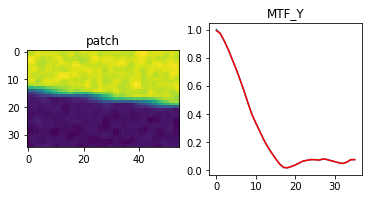

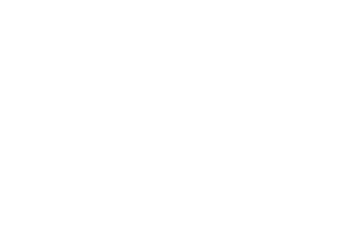

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]


epoch_loss = 6.572876736754552e-05
Epoch 781/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

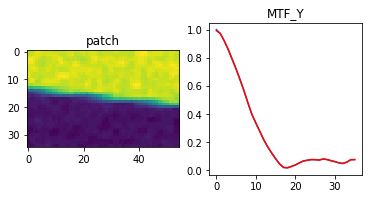

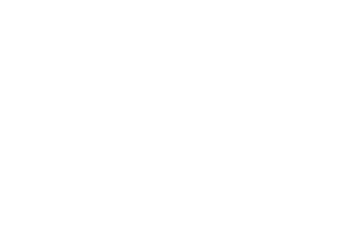

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]


epoch_loss = 6.557710003107786e-05
Epoch 782/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

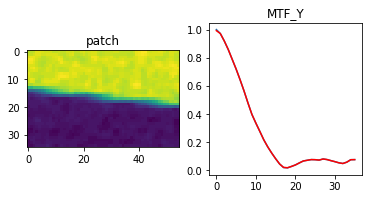

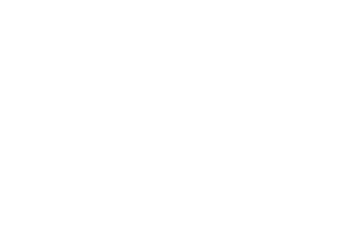

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.98it/s]


epoch_loss = 6.542574556078762e-05
Epoch 783/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

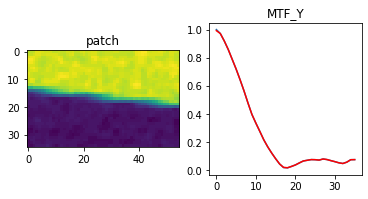

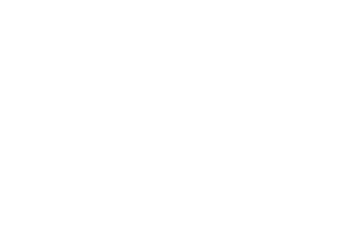

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 6.52747112326324e-05
Epoch 784/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

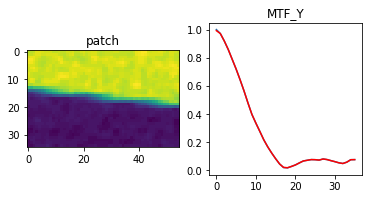

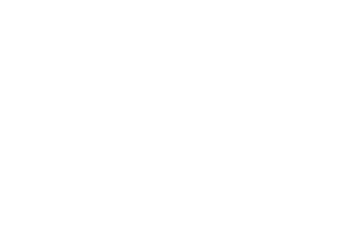

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 6.51240479783155e-05
Epoch 785/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

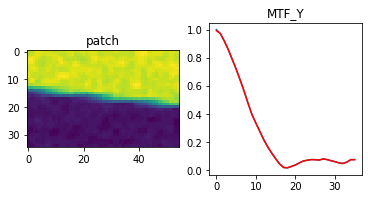

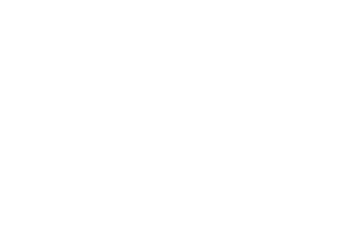

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 6.497458525700495e-05
Epoch 786/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

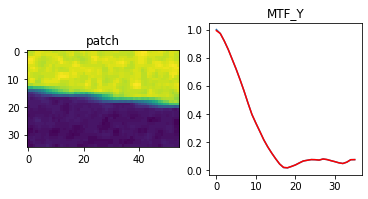

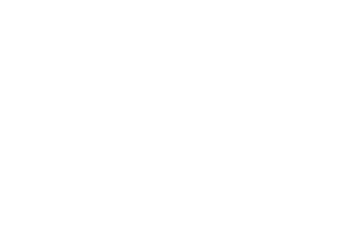

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 6.48245113552548e-05
Epoch 787/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

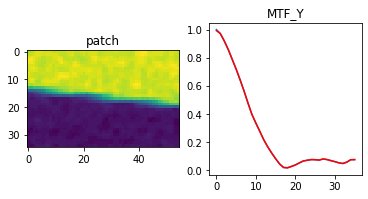

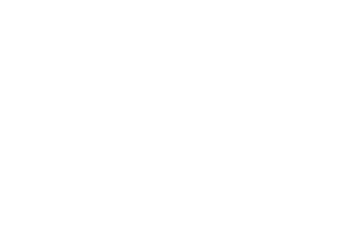

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 6.467661296483129e-05
Epoch 788/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

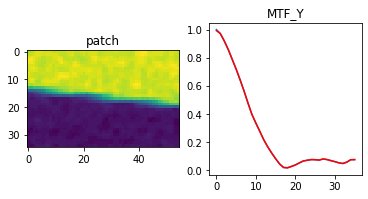

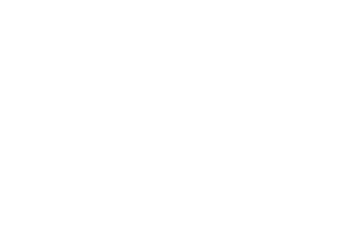

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]


epoch_loss = 6.452905654441565e-05
Epoch 789/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

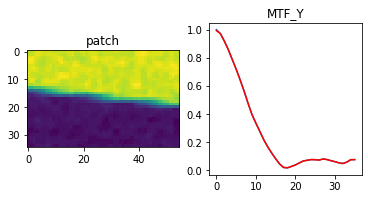

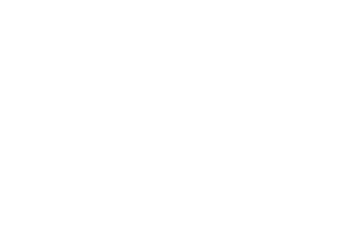

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.76it/s]


epoch_loss = 6.437992851715535e-05
Epoch 790/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

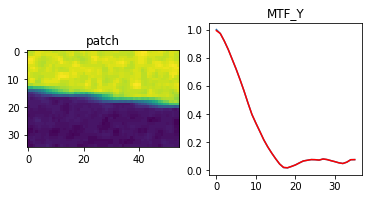

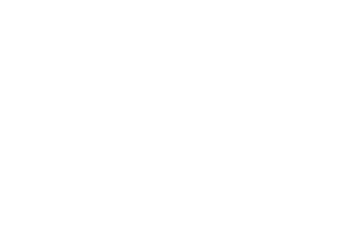

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 6.423301965696737e-05
Epoch 791/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

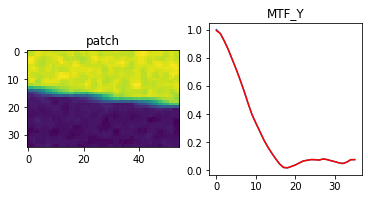

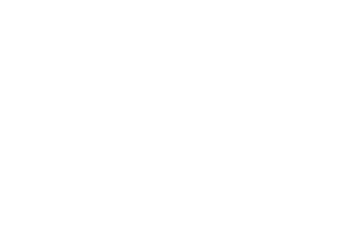

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 6.408822810044512e-05
Epoch 792/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

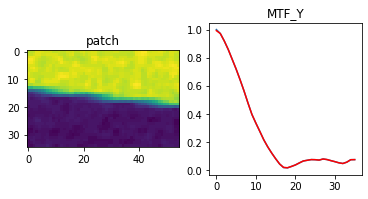

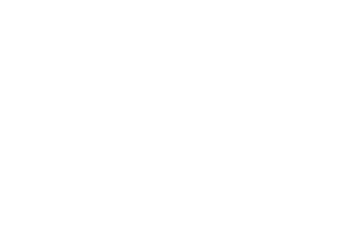

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.86it/s]


epoch_loss = 6.394286901922897e-05
Epoch 793/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

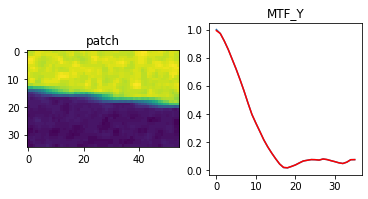

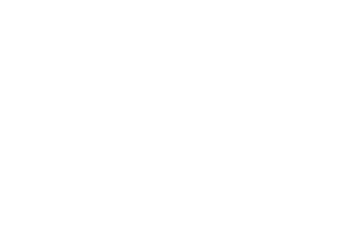

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.08it/s]


epoch_loss = 6.379681872203946e-05
Epoch 794/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

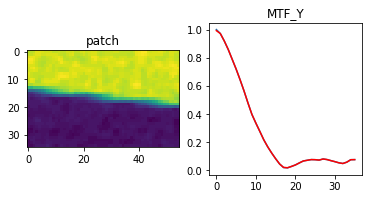

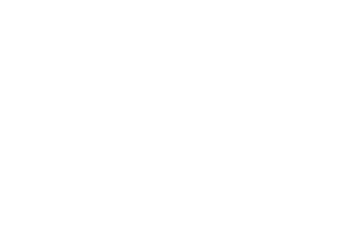

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 6.365298759192228e-05
Epoch 795/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

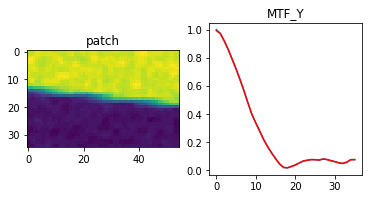

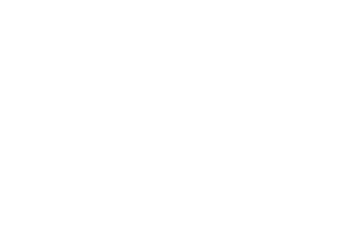

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.31it/s]


epoch_loss = 6.350943294819444e-05
Epoch 796/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

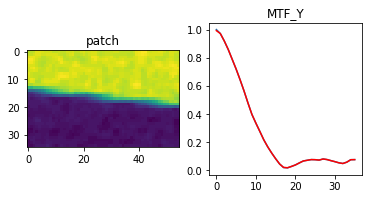

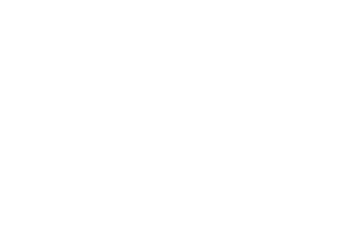

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.80it/s]


epoch_loss = 6.336429942166433e-05
Epoch 797/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

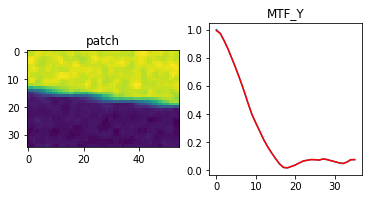

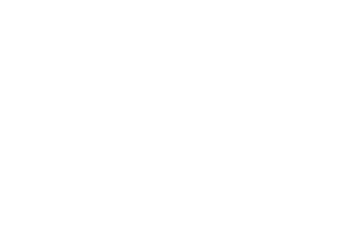

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.61it/s]


epoch_loss = 6.322322587948292e-05
Epoch 798/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

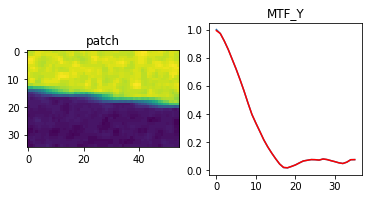

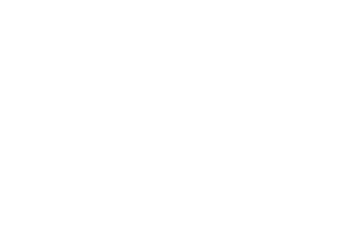

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.22it/s]


epoch_loss = 6.308058800641447e-05
Epoch 799/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

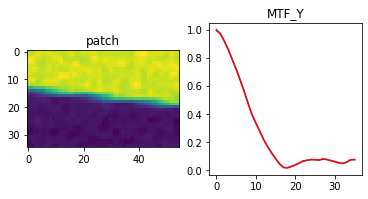

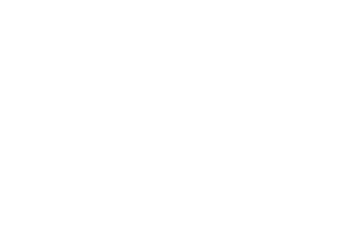

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 6.29381975159049e-05
Epoch 800/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

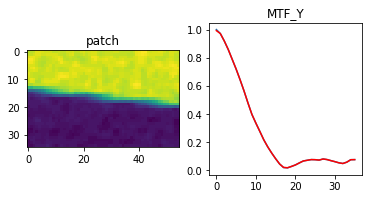

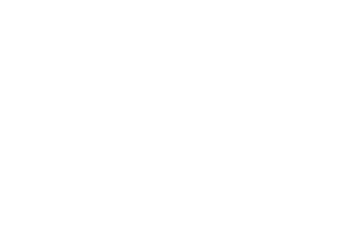

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.49it/s]


epoch_loss = 6.27960980636999e-05
Epoch 801/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

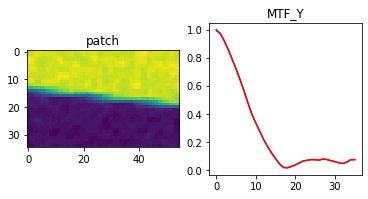

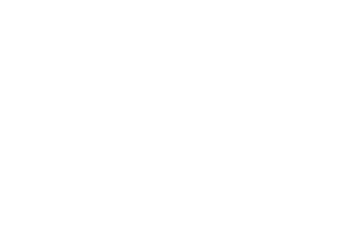

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.71it/s]


epoch_loss = 6.265607225941494e-05
Epoch 802/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

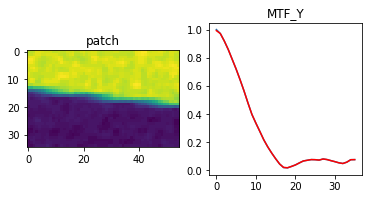

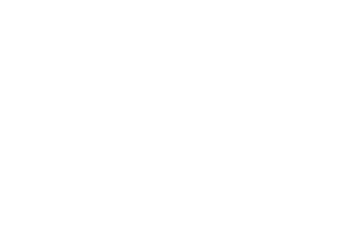

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]


epoch_loss = 6.251648301258683e-05
Epoch 803/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

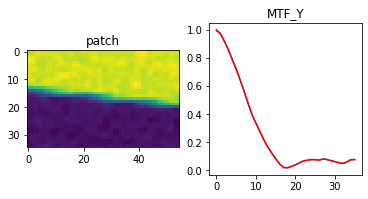

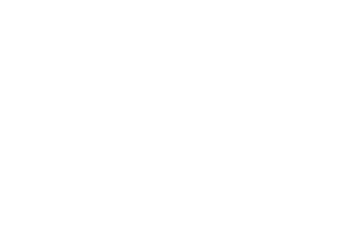

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]


epoch_loss = 6.237522757146508e-05
Epoch 804/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

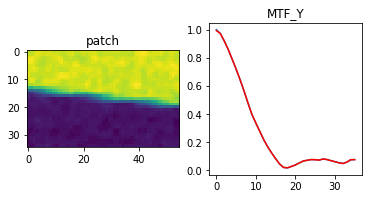

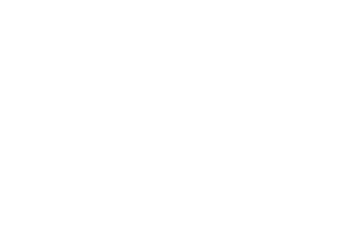

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.51it/s]


epoch_loss = 6.223612581379712e-05
Epoch 805/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

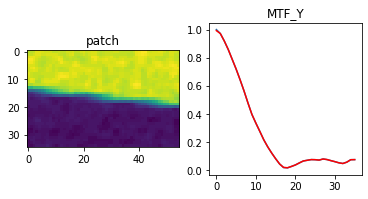

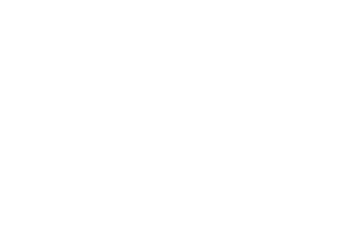

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]


epoch_loss = 6.209915591171011e-05
Epoch 806/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

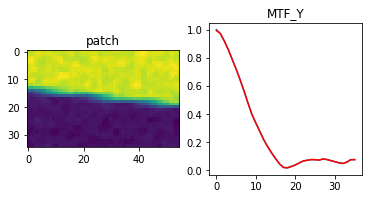

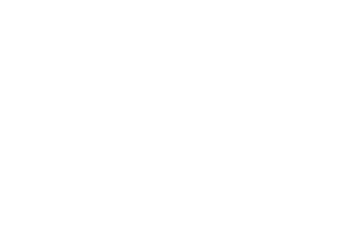

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]


epoch_loss = 6.196063623065129e-05
Epoch 807/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

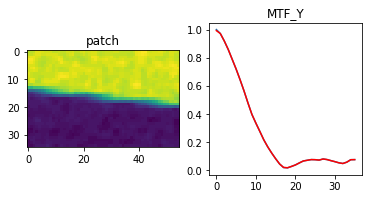

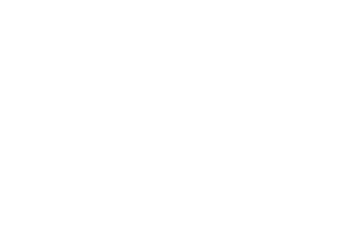

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 6.182328070281073e-05
Epoch 808/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

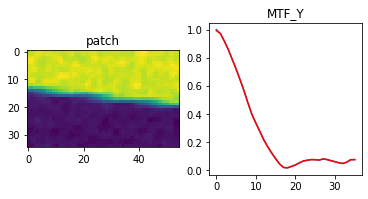

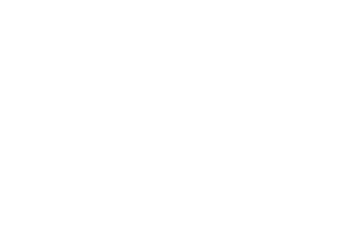

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]


epoch_loss = 6.168713298393413e-05
Epoch 809/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

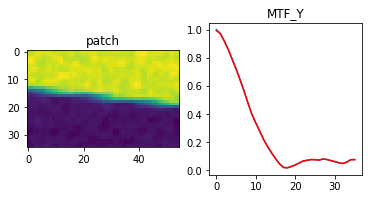

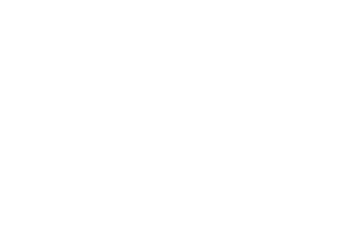

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 6.155125447548926e-05
Epoch 810/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

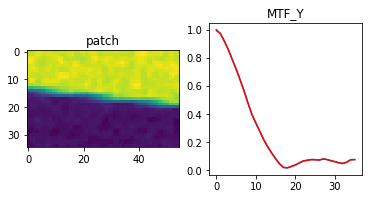

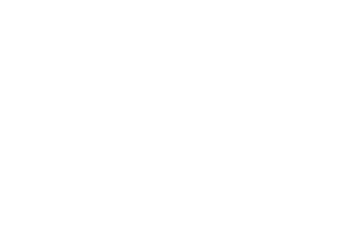

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 6.14137970842421e-05
Epoch 811/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

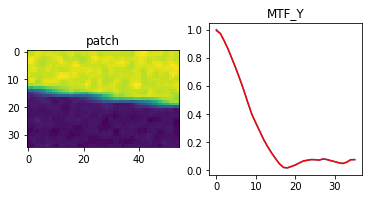

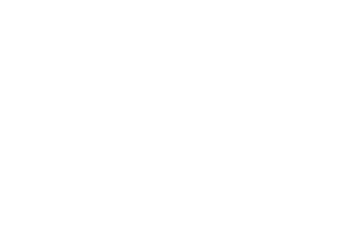

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 6.127848610049114e-05
Epoch 812/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

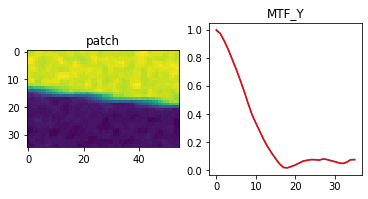

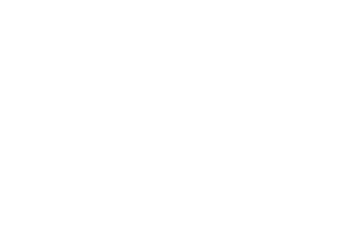

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.90it/s]


epoch_loss = 6.114343705121428e-05
Epoch 813/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

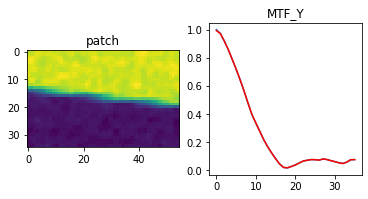

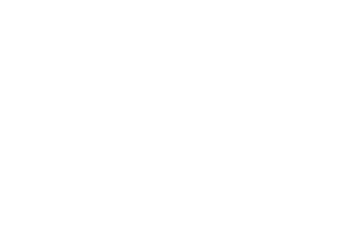

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 6.100954851717688e-05
Epoch 814/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

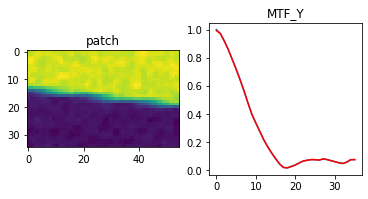

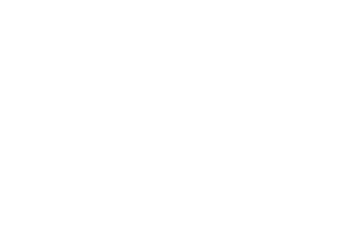

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]


epoch_loss = 6.0875034250784665e-05
Epoch 815/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

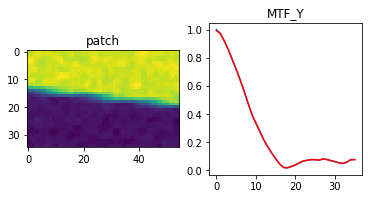

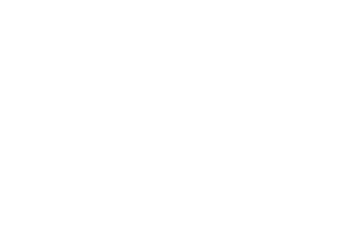

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]


epoch_loss = 6.0740723711205646e-05
Epoch 816/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

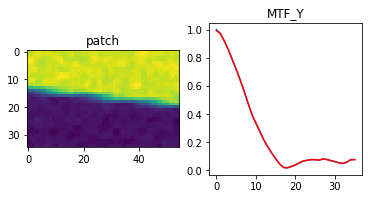

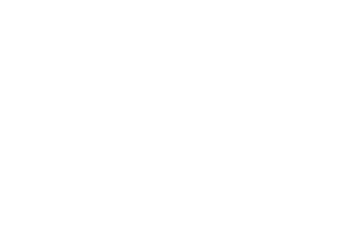

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.48it/s]


epoch_loss = 6.060853411327116e-05
Epoch 817/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

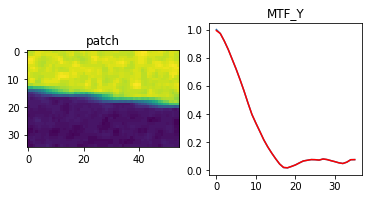

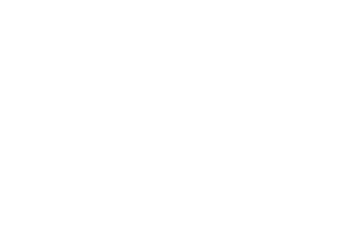

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]


epoch_loss = 6.047660281183198e-05
Epoch 818/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

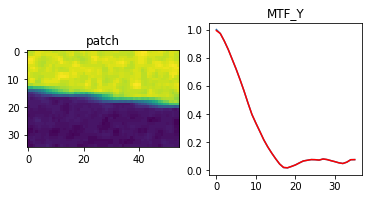

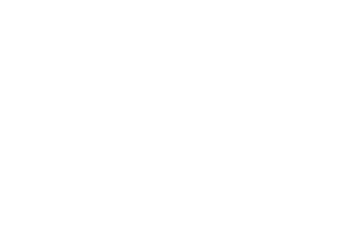

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.39it/s]


epoch_loss = 6.034496254869737e-05
Epoch 819/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

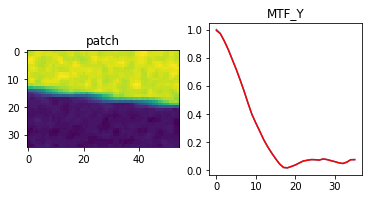

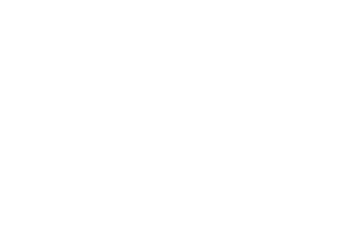

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.91it/s]


epoch_loss = 6.0213544202269986e-05
Epoch 820/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

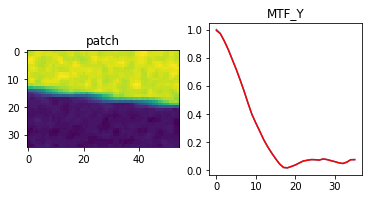

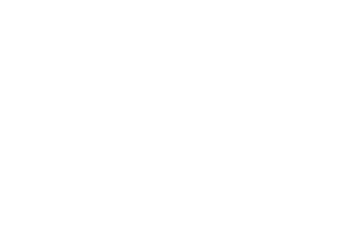

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.26it/s]


epoch_loss = 6.0082376876380295e-05
Epoch 821/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

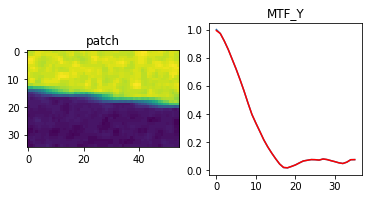

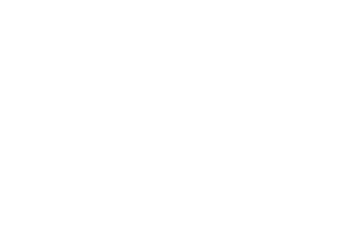

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]


epoch_loss = 5.9951456933049485e-05
Epoch 822/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

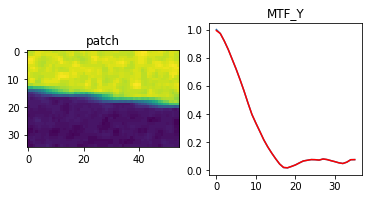

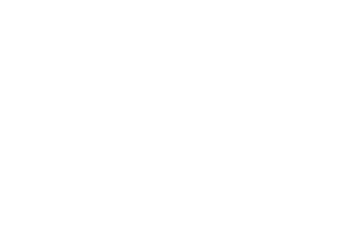

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.89it/s]


epoch_loss = 5.9822625189553946e-05
Epoch 823/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

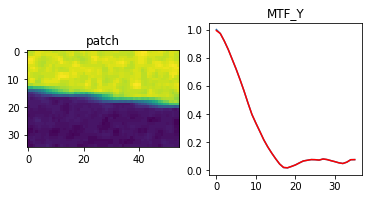

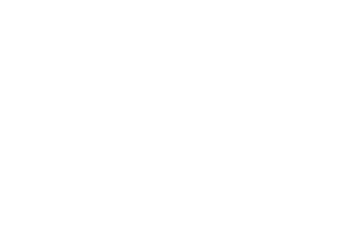

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]


epoch_loss = 5.969220364931971e-05
Epoch 824/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

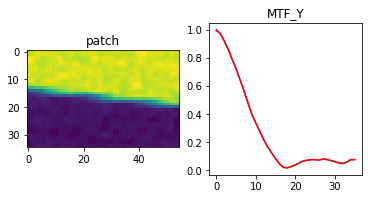

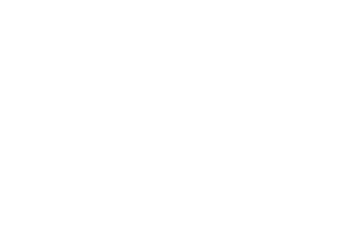

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]


epoch_loss = 5.956384484306909e-05
Epoch 825/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

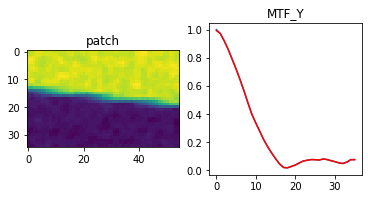

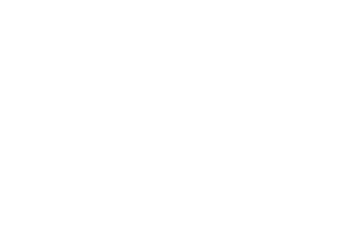

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.80it/s]


epoch_loss = 5.943573341937736e-05
Epoch 826/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

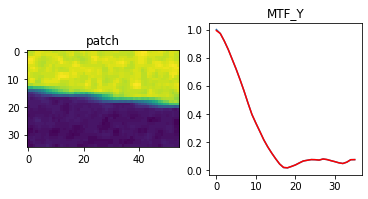

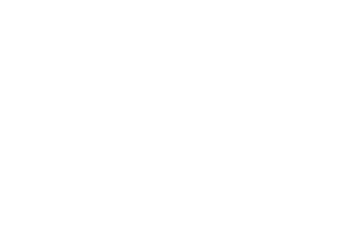

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 5.930789120611735e-05
Epoch 827/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

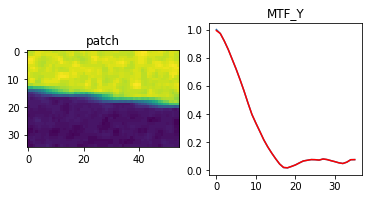

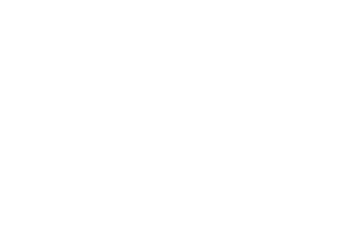

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.92it/s]


epoch_loss = 5.918031092733145e-05
Epoch 828/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

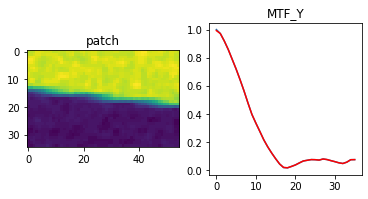

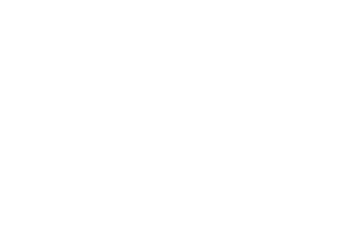

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 5.905289435759187e-05
Epoch 829/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

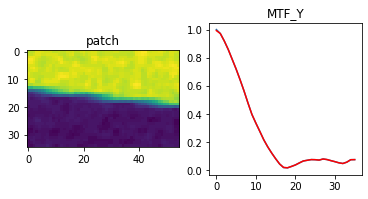

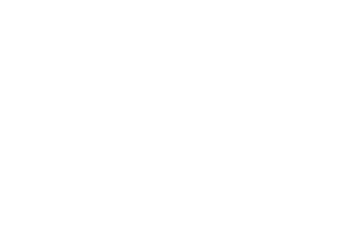

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.01it/s]


epoch_loss = 5.8924866607412696e-05
Epoch 830/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

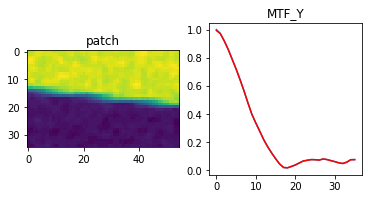

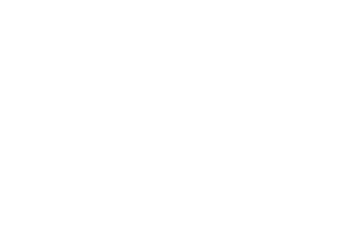

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 5.879976015421562e-05
Epoch 831/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

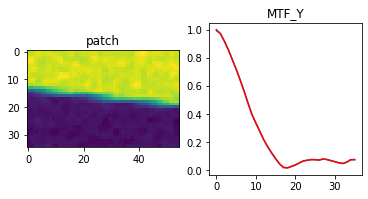

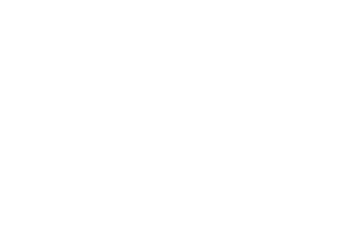

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.25it/s]


epoch_loss = 5.867310756002553e-05
Epoch 832/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

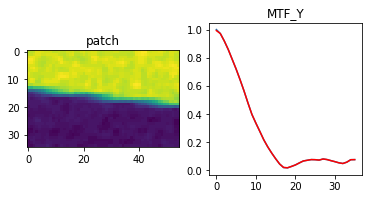

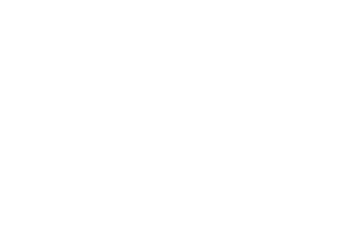

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 5.8548510423861444e-05
Epoch 833/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

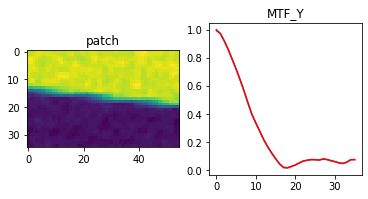

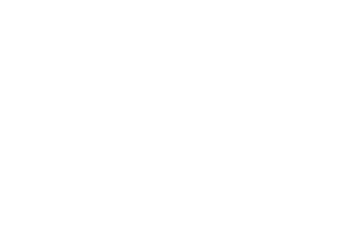

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 5.8424120652489364e-05
Epoch 834/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

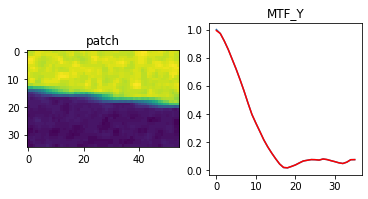

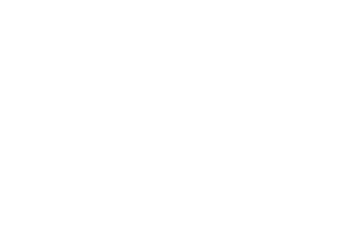

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.11it/s]


epoch_loss = 5.8299978263676167e-05
Epoch 835/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

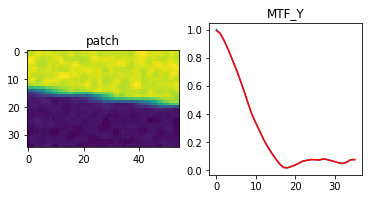

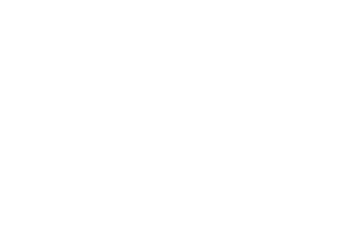

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 5.8176017773803324e-05
Epoch 836/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

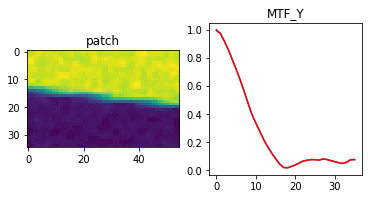

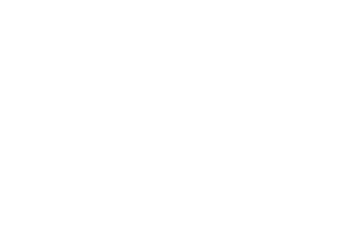

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]


epoch_loss = 5.8052341046277434e-05
Epoch 837/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

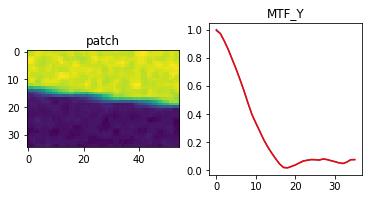

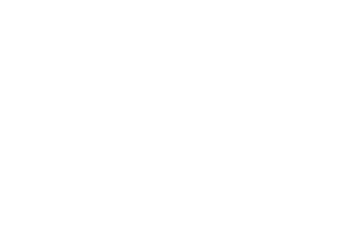

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 5.792796582682058e-05
Epoch 838/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

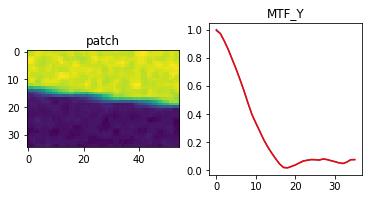

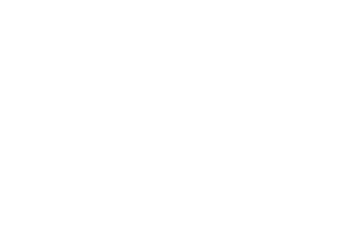

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]


epoch_loss = 5.780653009423986e-05
Epoch 839/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

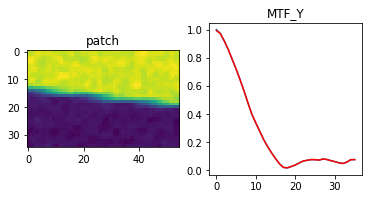

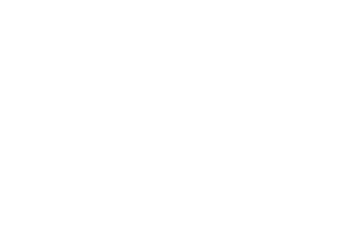

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]


epoch_loss = 5.768351547885686e-05
Epoch 840/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

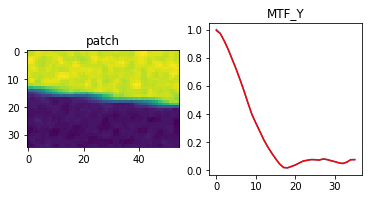

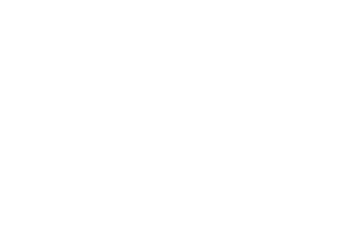

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]


epoch_loss = 5.7562487199902534e-05
Epoch 841/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

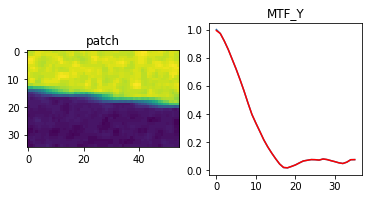

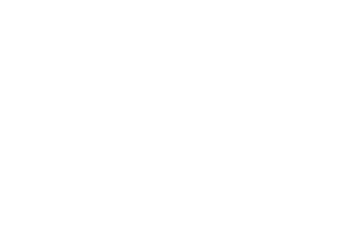

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.58it/s]


epoch_loss = 5.744173176935874e-05
Epoch 842/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

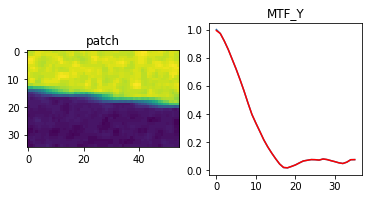

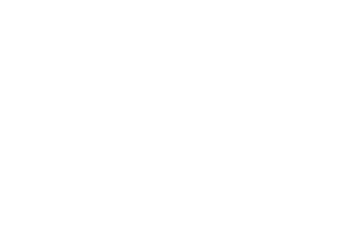

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.31it/s]


epoch_loss = 5.732112913392484e-05
Epoch 843/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

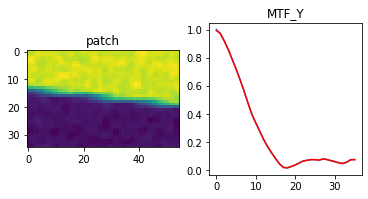

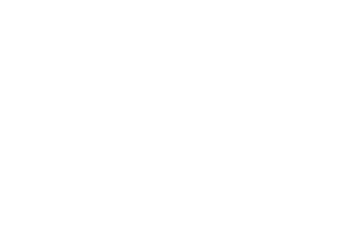

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.42it/s]


epoch_loss = 5.7199926231987774e-05
Epoch 844/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

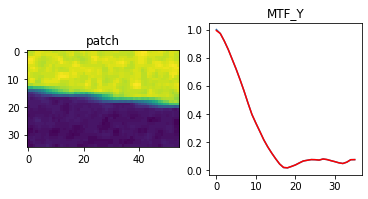

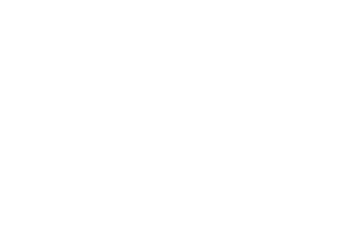

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 5.707979289581999e-05
Epoch 845/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

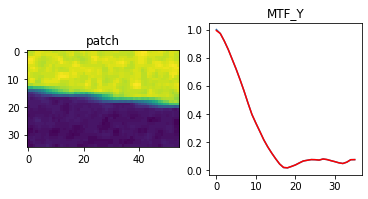

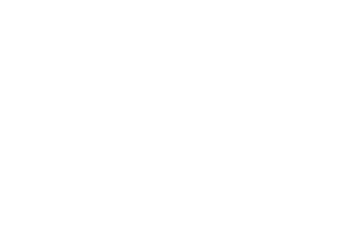

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]


epoch_loss = 5.696167499991134e-05
Epoch 846/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

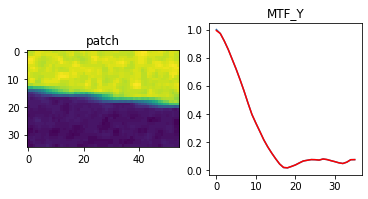

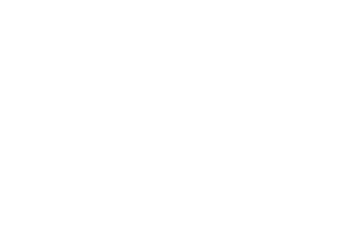

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.87it/s]


epoch_loss = 5.6841941841412336e-05
Epoch 847/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

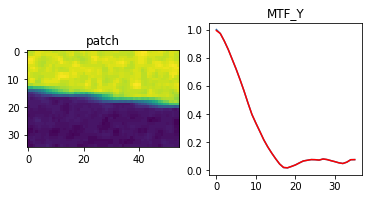

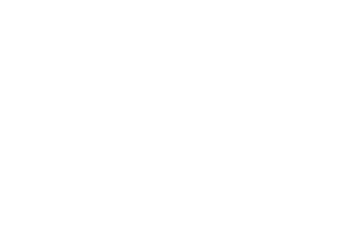

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.90it/s]


epoch_loss = 5.6724245951045305e-05
Epoch 848/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

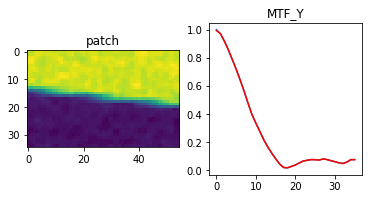

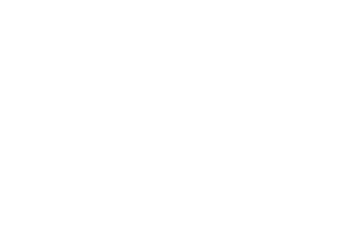

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]


epoch_loss = 5.660410533891991e-05
Epoch 849/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

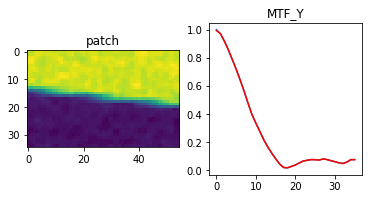

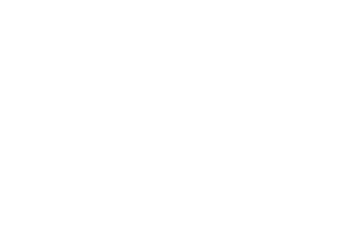

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.54it/s]


epoch_loss = 5.6486860557924956e-05
Epoch 850/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

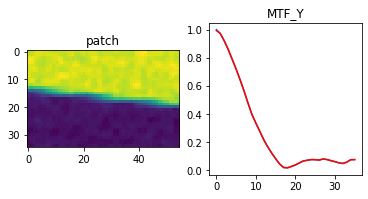

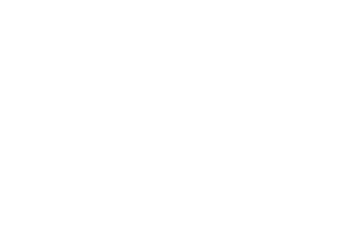

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 5.63697685720399e-05
Epoch 851/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

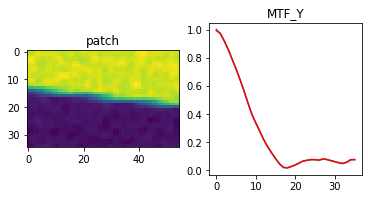

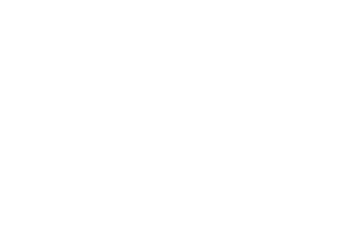

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 5.625294943456538e-05
Epoch 852/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

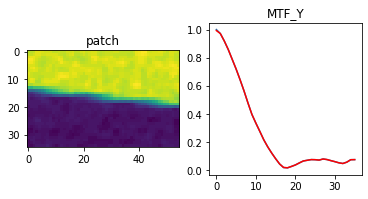

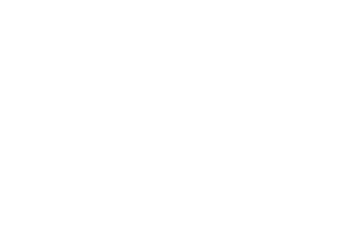

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]


epoch_loss = 5.61353808734566e-05
Epoch 853/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

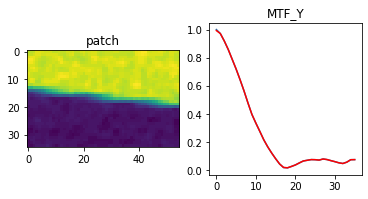

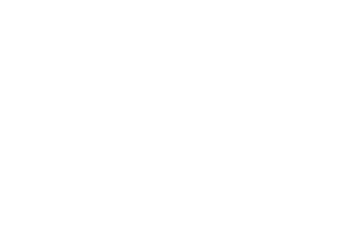

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.74it/s]


epoch_loss = 5.6018910981947556e-05
Epoch 854/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

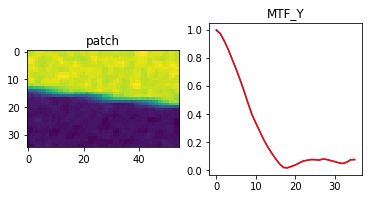

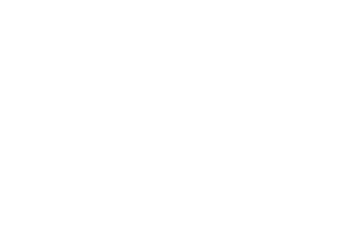

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]


epoch_loss = 5.590442742686719e-05
Epoch 855/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

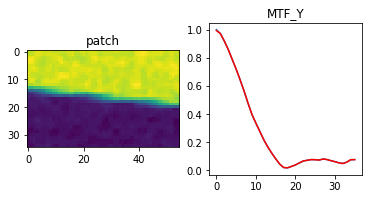

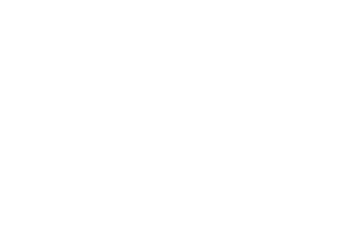

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 5.5788383178878576e-05
Epoch 856/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

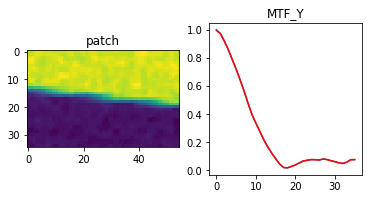

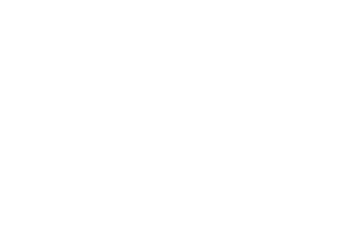

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]


epoch_loss = 5.567345579038374e-05
Epoch 857/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

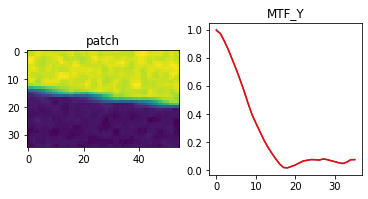

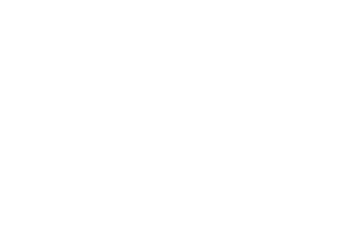

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.62it/s]


epoch_loss = 5.5559579777764156e-05
Epoch 858/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

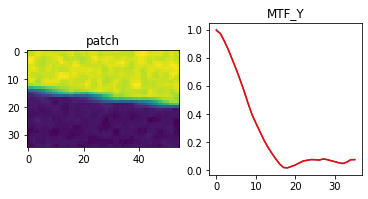

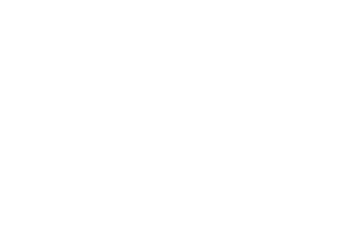

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 5.5445900216000155e-05
Epoch 859/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

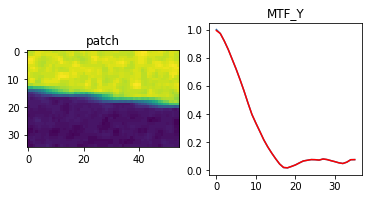

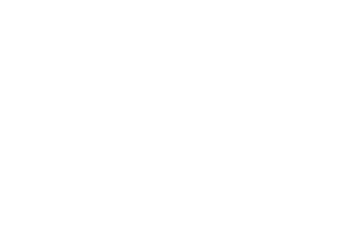

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 5.533243529498577e-05
Epoch 860/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

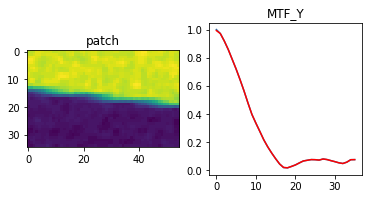

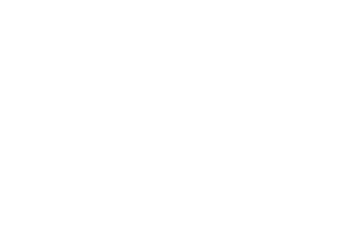

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]


epoch_loss = 5.521830462384969e-05
Epoch 861/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

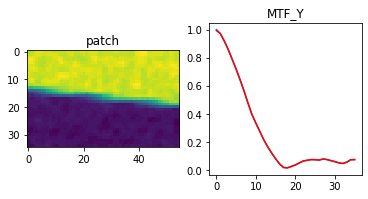

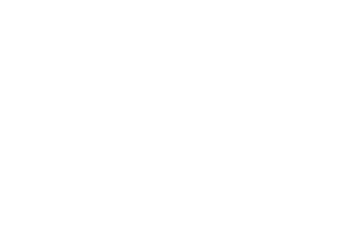

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 5.5105152569012716e-05
Epoch 862/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

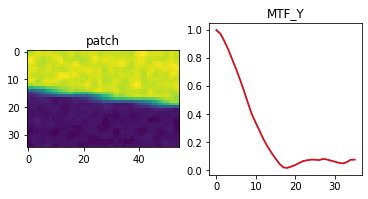

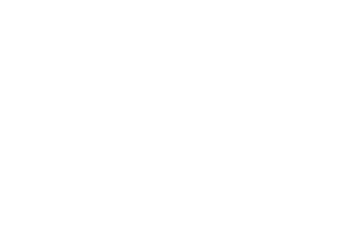

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 5.499226608662866e-05
Epoch 863/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

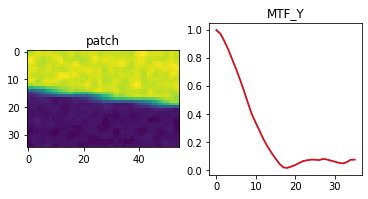

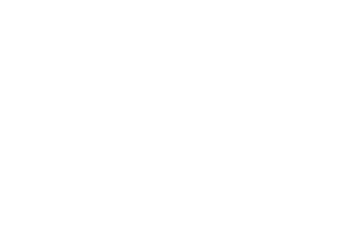

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.49it/s]


epoch_loss = 5.4880492825759575e-05
Epoch 864/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

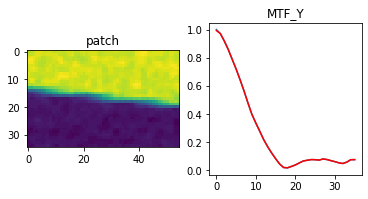

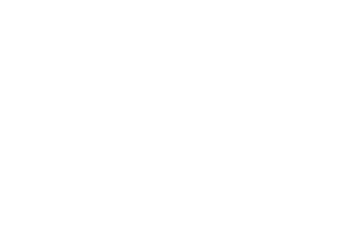

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.30it/s]


epoch_loss = 5.4767962865298614e-05
Epoch 865/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

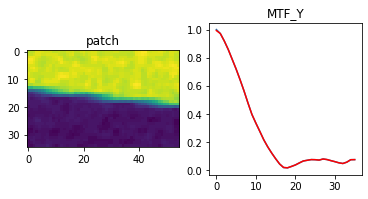

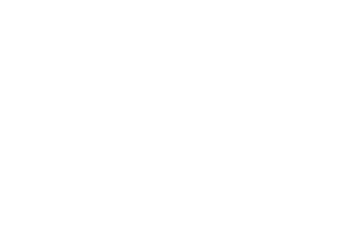

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 5.465742651722394e-05
Epoch 866/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

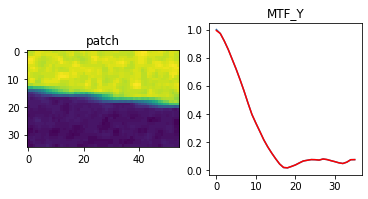

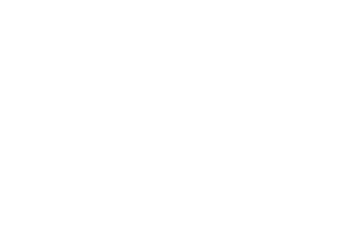

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.91it/s]


epoch_loss = 5.454707206808962e-05
Epoch 867/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

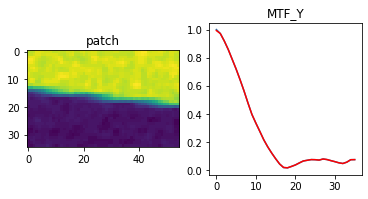

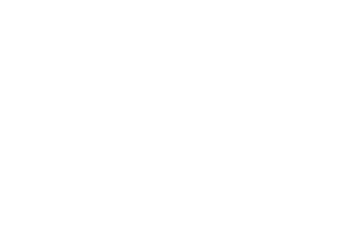

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.17it/s]


epoch_loss = 5.44342547073029e-05
Epoch 868/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

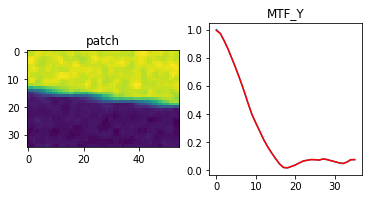

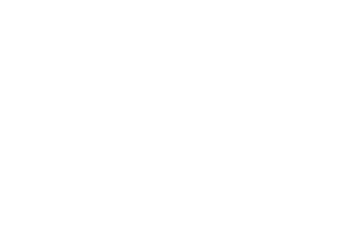

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.14it/s]


epoch_loss = 5.432599573396146e-05
Epoch 869/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

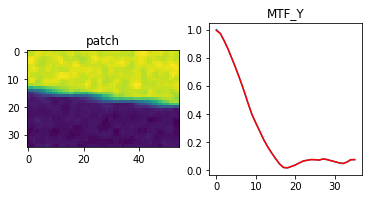

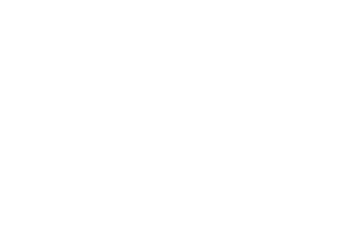

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.54it/s]


epoch_loss = 5.421619789558463e-05
Epoch 870/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

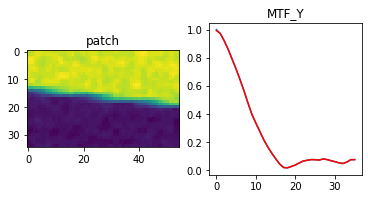

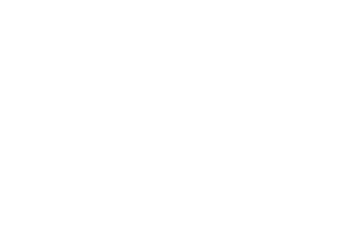

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.69it/s]


epoch_loss = 5.410569428931922e-05
Epoch 871/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

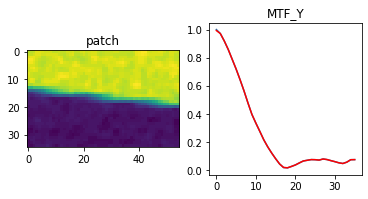

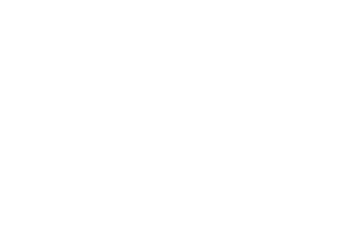

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]


epoch_loss = 5.399624569690786e-05
Epoch 872/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

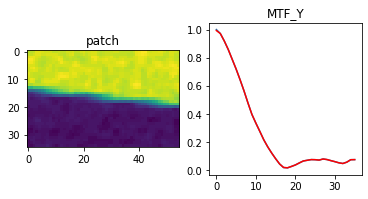

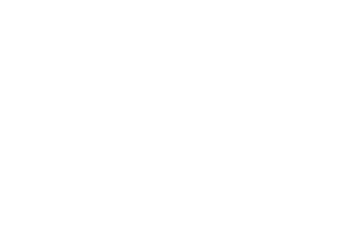

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.04it/s]


epoch_loss = 5.388872523326427e-05
Epoch 873/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

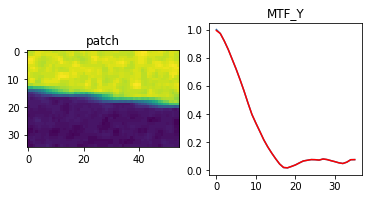

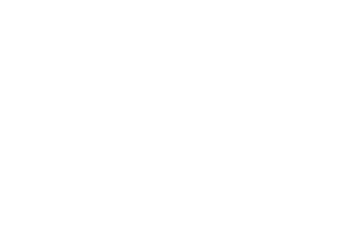

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]


epoch_loss = 5.3778760047862306e-05
Epoch 874/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

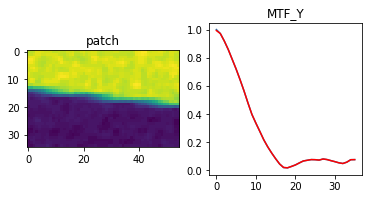

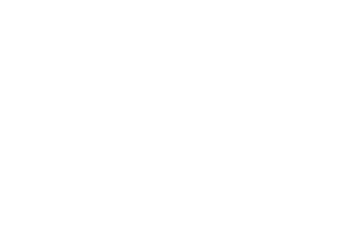

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.11it/s]


epoch_loss = 5.367161793401465e-05
Epoch 875/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

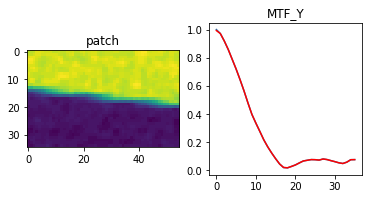

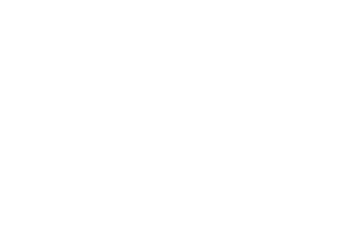

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 5.356465044314973e-05
Epoch 876/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

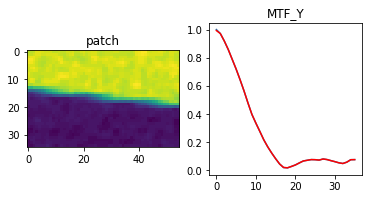

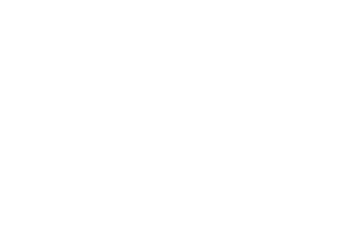

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]


epoch_loss = 5.34569589945022e-05
Epoch 877/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

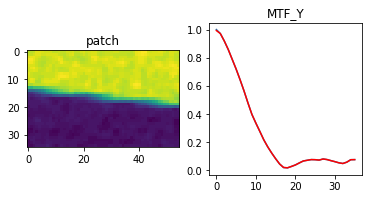

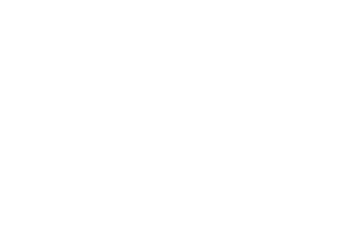

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 5.3350326197687536e-05
Epoch 878/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

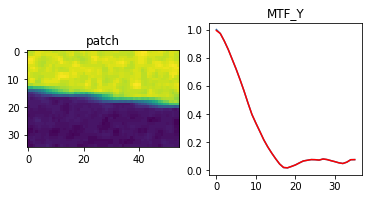

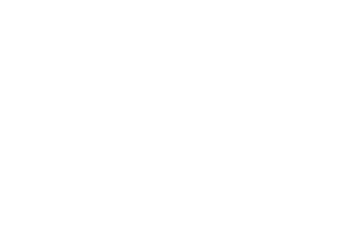

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 5.324388257577084e-05
Epoch 879/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

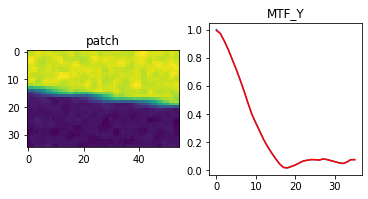

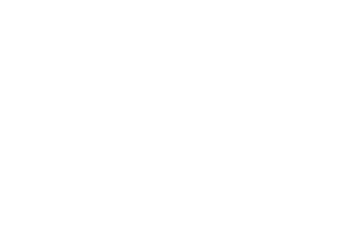

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]


epoch_loss = 5.313673318596557e-05
Epoch 880/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

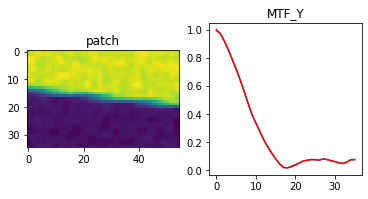

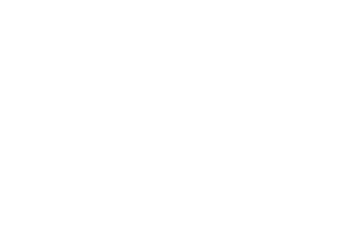

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 5.303061698214151e-05
Epoch 881/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

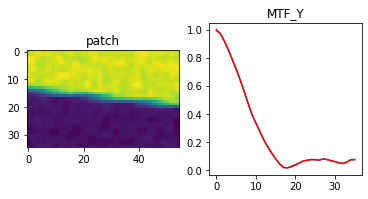

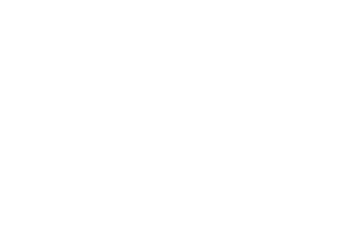

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]


epoch_loss = 5.2925559430150315e-05
Epoch 882/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

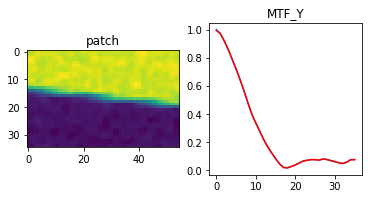

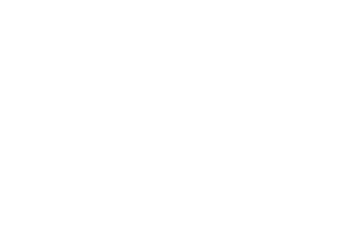

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]


epoch_loss = 5.281980338622816e-05
Epoch 883/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

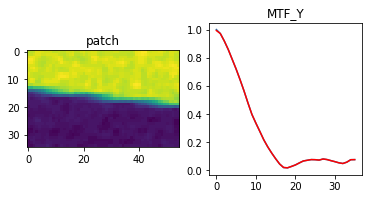

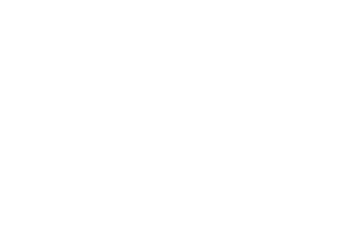

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]


epoch_loss = 5.2715946367243305e-05
Epoch 884/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

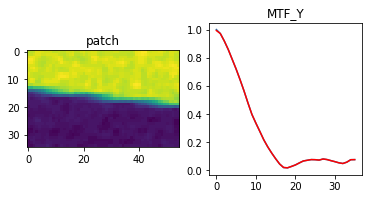

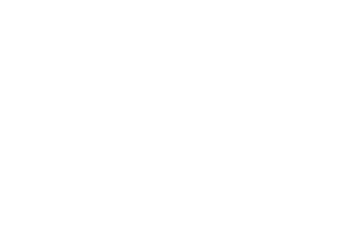

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]


epoch_loss = 5.261138721834868e-05
Epoch 885/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

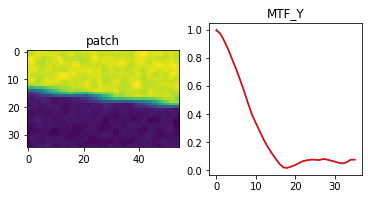

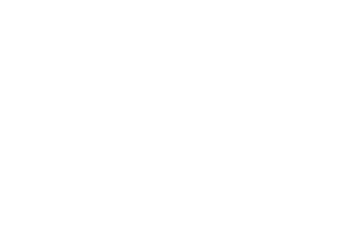

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.28it/s]


epoch_loss = 5.250786125543527e-05
Epoch 886/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

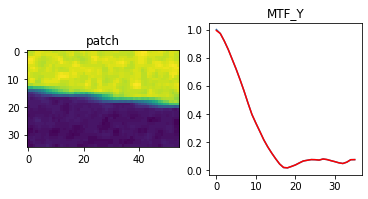

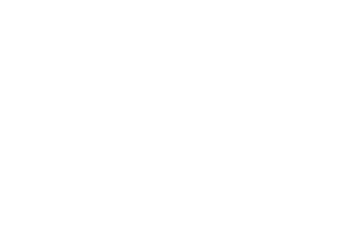

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]


epoch_loss = 5.24036368005909e-05
Epoch 887/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

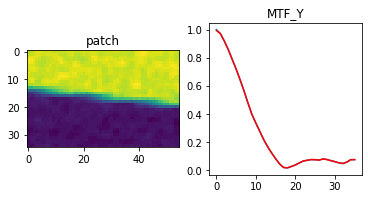

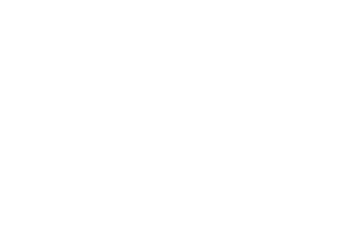

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]


epoch_loss = 5.230044189374894e-05
Epoch 888/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

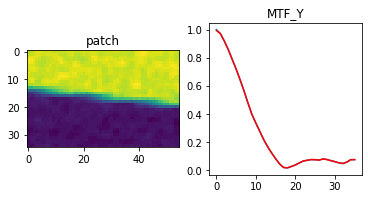

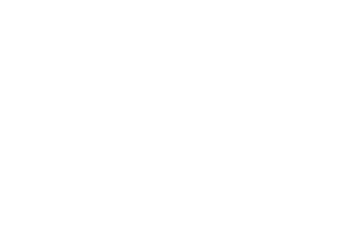

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.71it/s]


epoch_loss = 5.2197421609889716e-05
Epoch 889/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

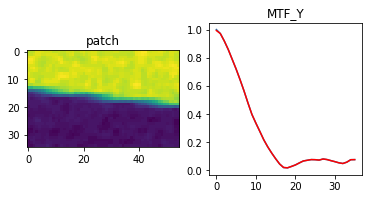

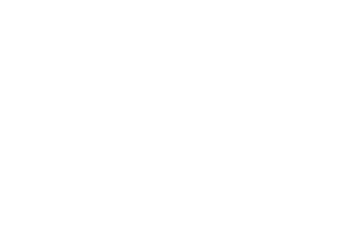

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.95it/s]


epoch_loss = 5.2093684644205496e-05
Epoch 890/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

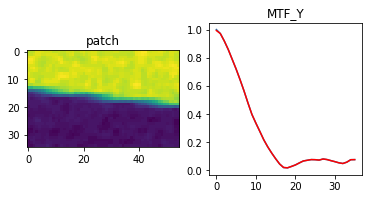

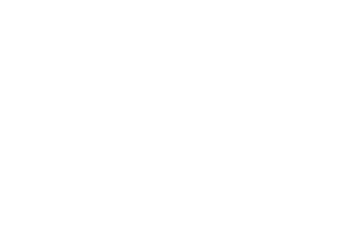

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]


epoch_loss = 5.199271981837228e-05
Epoch 891/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

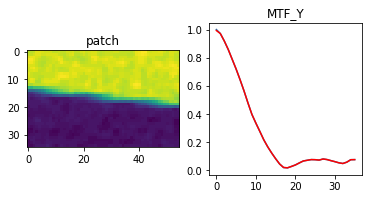

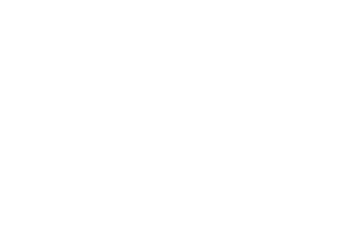

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]


epoch_loss = 5.188932118471712e-05
Epoch 892/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

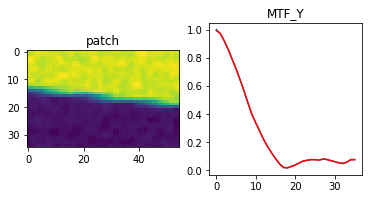

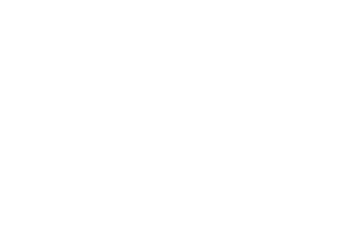

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]


epoch_loss = 5.1788629207294434e-05
Epoch 893/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

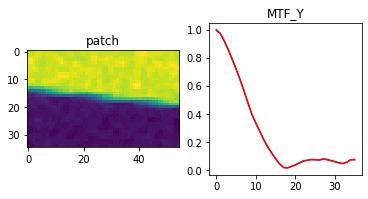

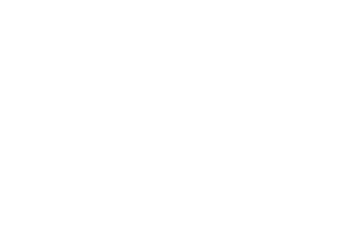

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 5.1686456572497264e-05
Epoch 894/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

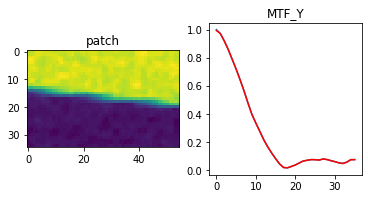

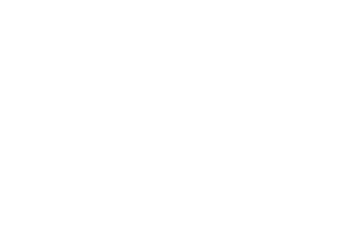

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.27it/s]


epoch_loss = 5.158522617421113e-05
Epoch 895/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

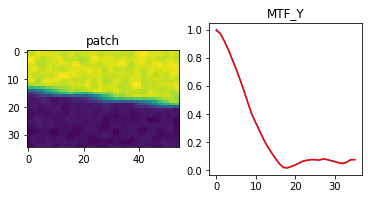

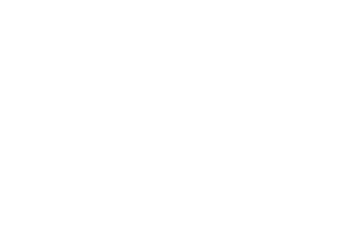

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 5.148506534169428e-05
Epoch 896/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

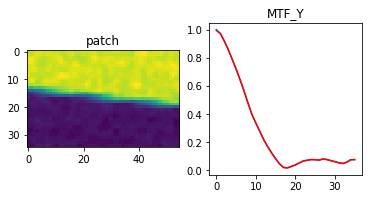

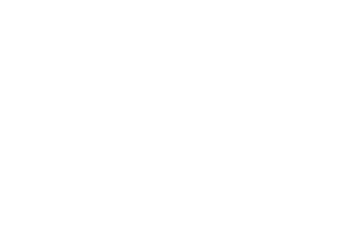

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]


epoch_loss = 5.138419146533124e-05
Epoch 897/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

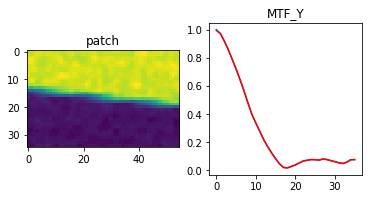

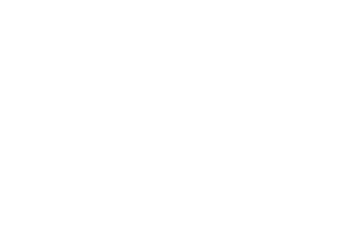

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 5.128431075718254e-05
Epoch 898/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

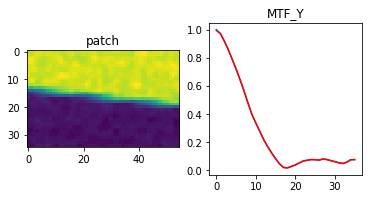

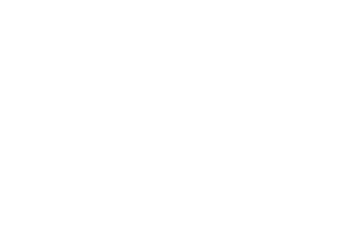

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]


epoch_loss = 5.118544868309982e-05
Epoch 899/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

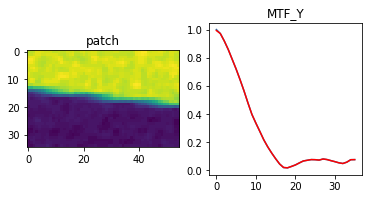

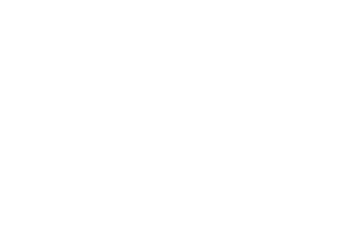

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 5.1085873565170914e-05
Epoch 900/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

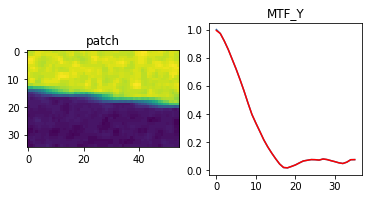

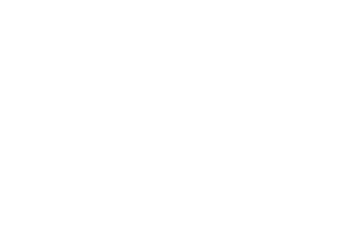

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 5.098562178318389e-05
Epoch 901/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

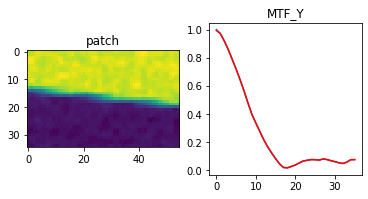

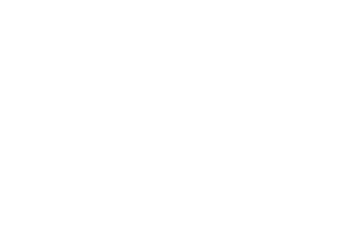

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]


epoch_loss = 5.088806938147172e-05
Epoch 902/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

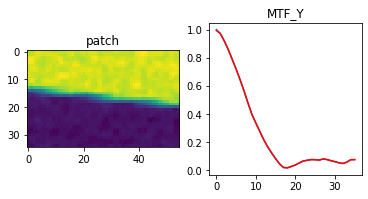

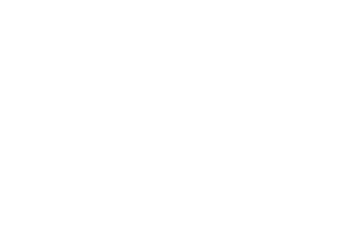

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]


epoch_loss = 5.079065158497542e-05
Epoch 903/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

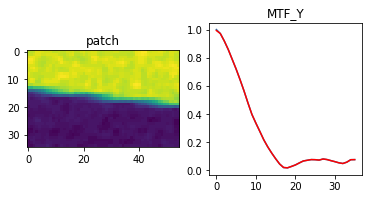

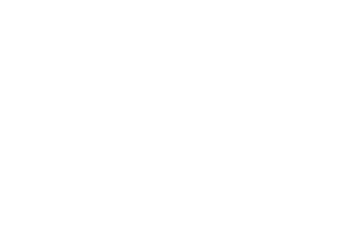

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 5.069086910225451e-05
Epoch 904/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

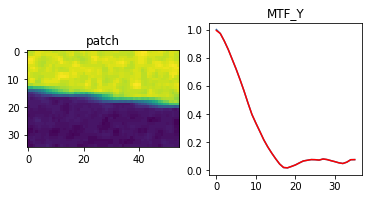

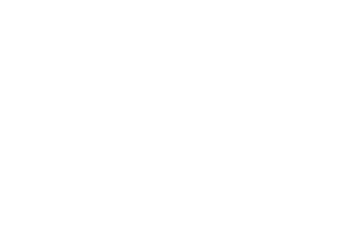

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]


epoch_loss = 5.05937532579992e-05
Epoch 905/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

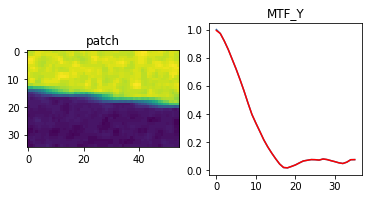

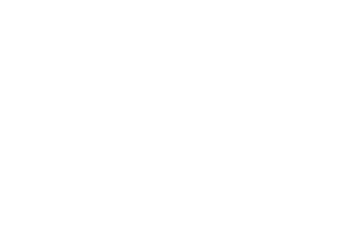

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]


epoch_loss = 5.049595347372815e-05
Epoch 906/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

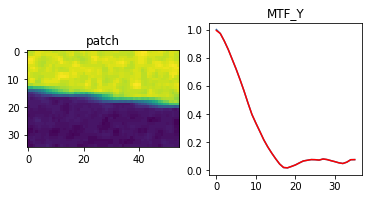

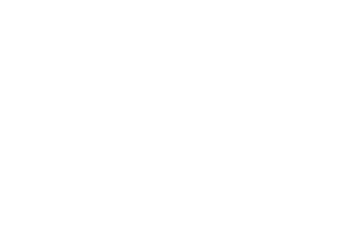

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


epoch_loss = 5.0399114115862176e-05
Epoch 907/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

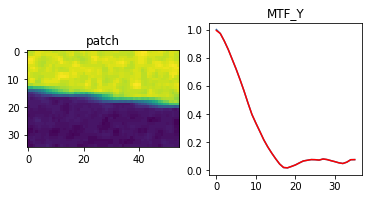

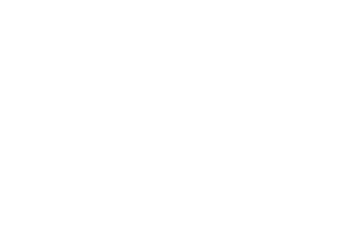

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 5.030163447372615e-05
Epoch 908/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

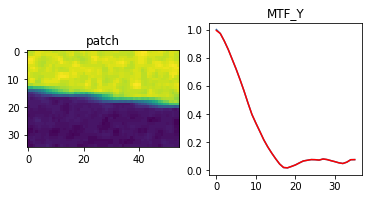

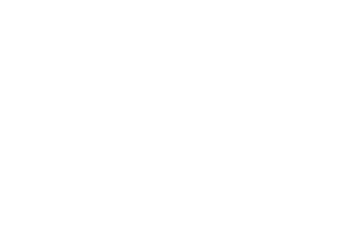

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]


epoch_loss = 5.0206777814310044e-05
Epoch 909/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

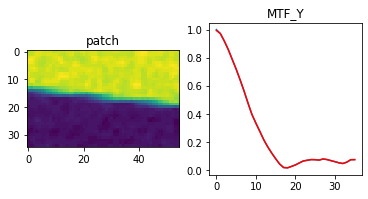

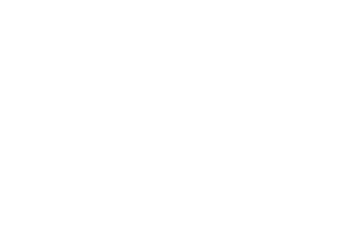

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.24it/s]


epoch_loss = 5.010958557249978e-05
Epoch 910/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

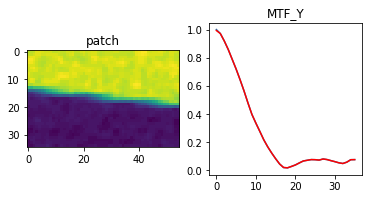

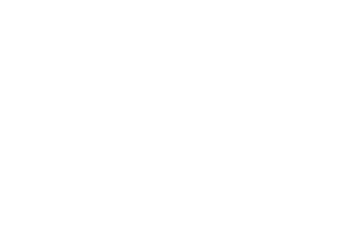

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.84it/s]


epoch_loss = 5.001504541723989e-05
Epoch 911/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

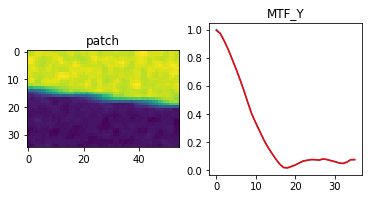

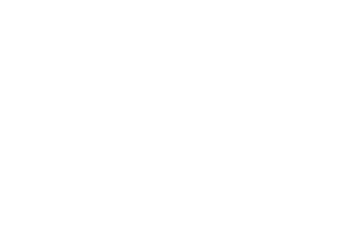

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.86it/s]


epoch_loss = 4.991813329979777e-05
Epoch 912/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

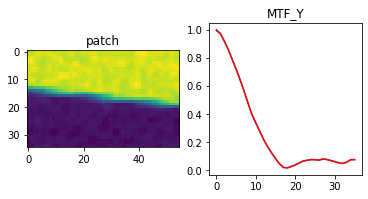

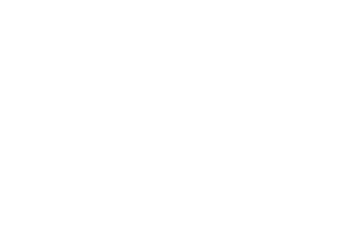

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 4.982385507901199e-05
Epoch 913/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

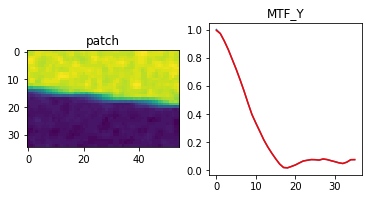

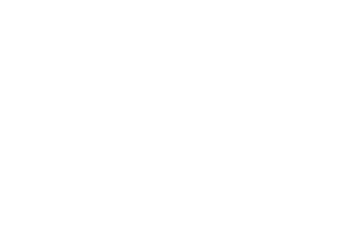

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.58it/s]


epoch_loss = 4.972891110810451e-05
Epoch 914/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

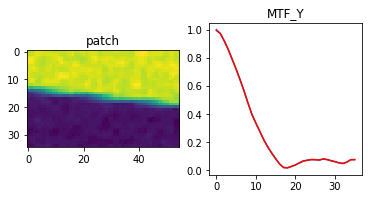

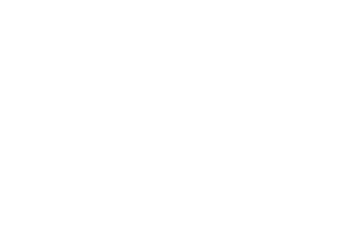

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]


epoch_loss = 4.963327228324488e-05
Epoch 915/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

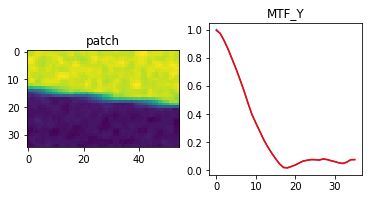

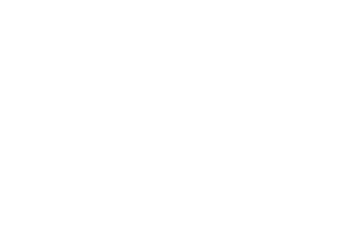

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.40it/s]


epoch_loss = 4.953862662659958e-05
Epoch 916/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

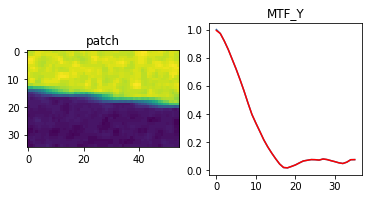

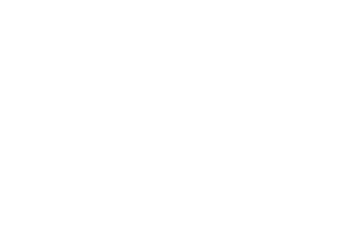

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 4.944490865455009e-05
Epoch 917/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

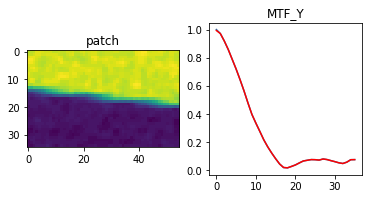

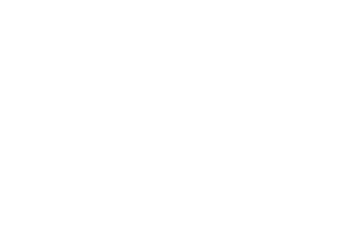

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.11it/s]


epoch_loss = 4.935218385071494e-05
Epoch 918/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

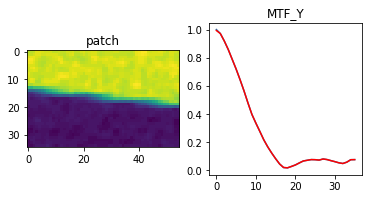

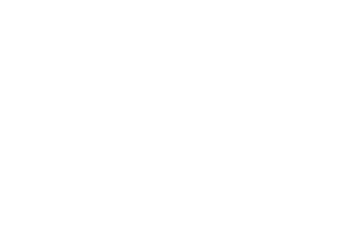

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]


epoch_loss = 4.925794564769603e-05
Epoch 919/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

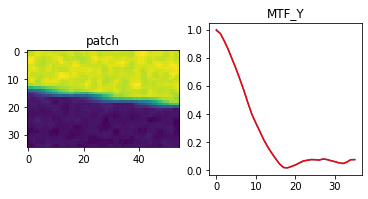

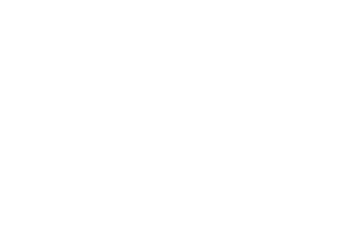

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.13it/s]


epoch_loss = 4.916466059512459e-05
Epoch 920/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

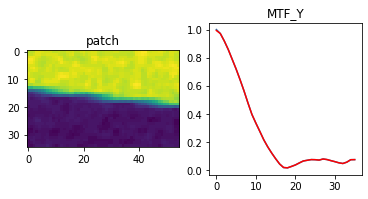

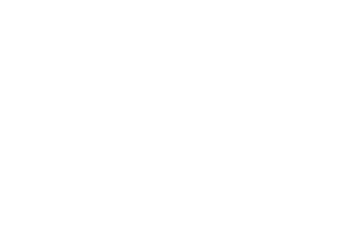

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]


epoch_loss = 4.907236507278867e-05
Epoch 921/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

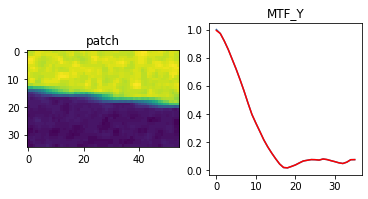

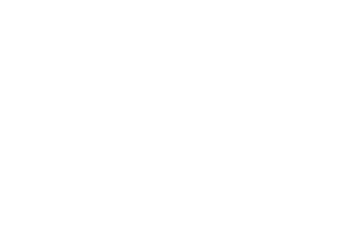

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 4.8979367420542985e-05
Epoch 922/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

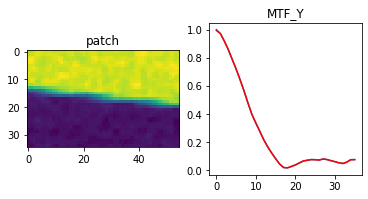

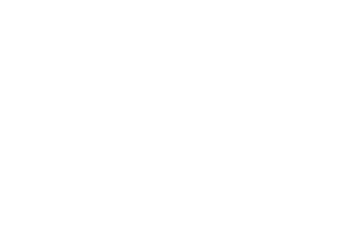

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 4.888733019470237e-05
Epoch 923/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

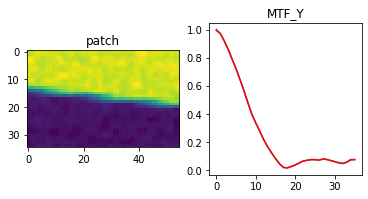

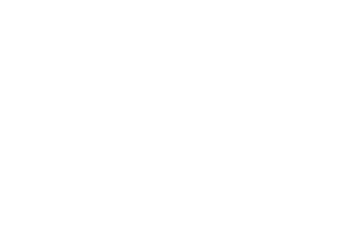

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 4.8796260671224445e-05
Epoch 924/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

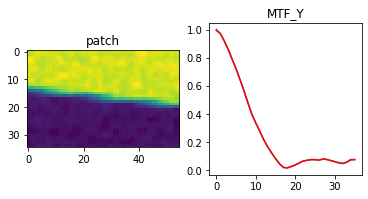

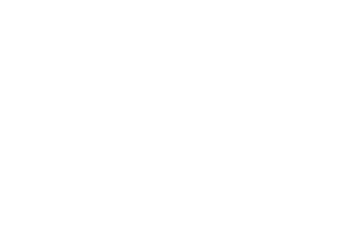

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]


epoch_loss = 4.8702830099500716e-05
Epoch 925/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

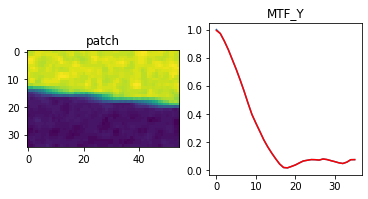

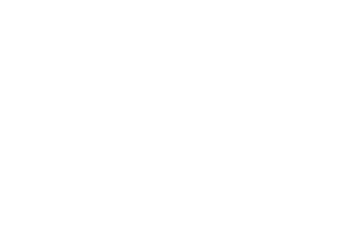

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 4.861203342443332e-05
Epoch 926/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

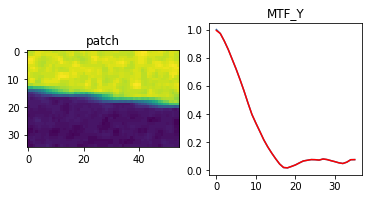

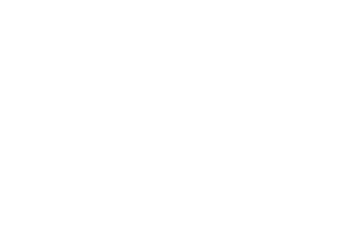

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 4.8520523705519736e-05
Epoch 927/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

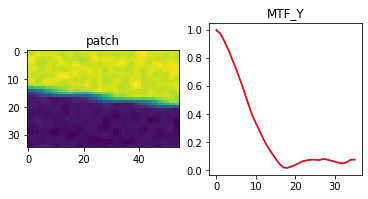

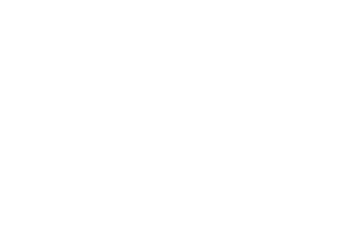

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.40it/s]


epoch_loss = 4.843082933803089e-05
Epoch 928/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

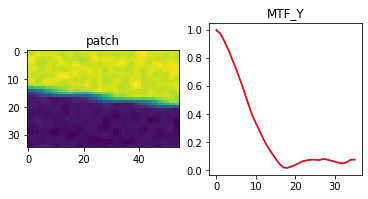

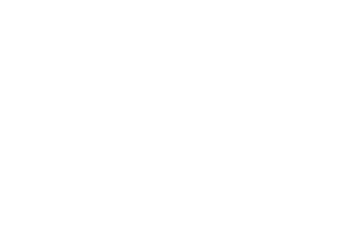

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 4.834042556467466e-05
Epoch 929/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

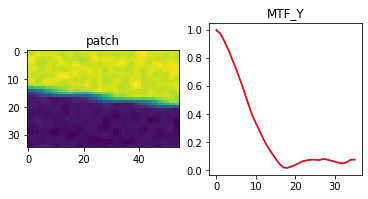

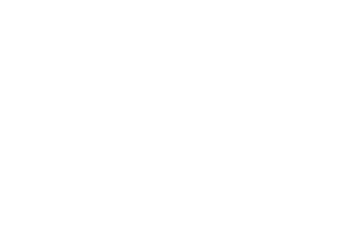

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]


epoch_loss = 4.824931966140866e-05
Epoch 930/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

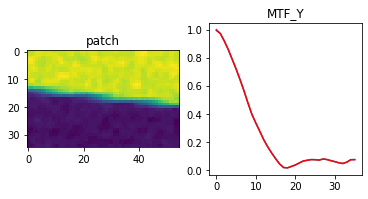

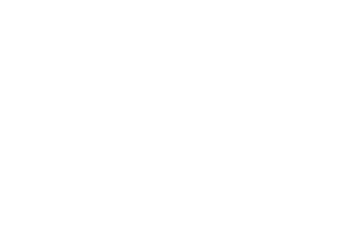

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.77it/s]


epoch_loss = 4.8159177822526544e-05
Epoch 931/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

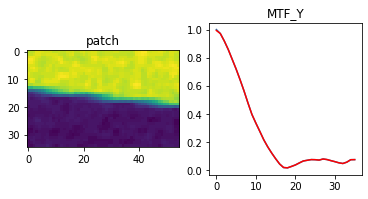

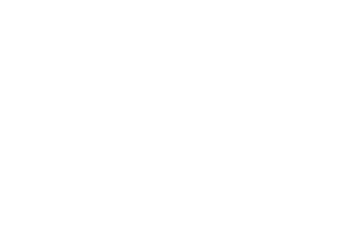

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.42it/s]


epoch_loss = 4.806998549611308e-05
Epoch 932/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

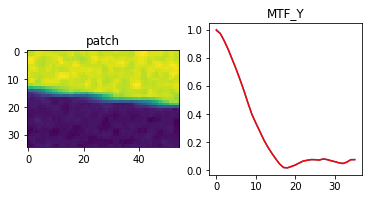

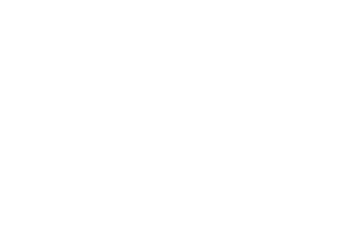

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.09it/s]


epoch_loss = 4.7980087401811033e-05
Epoch 933/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

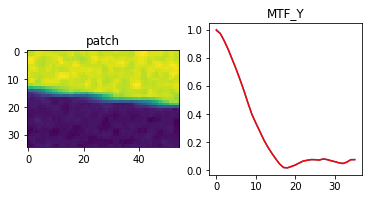

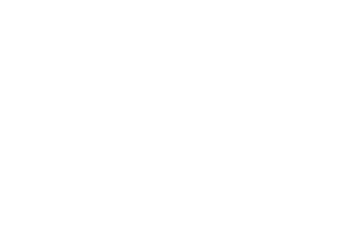

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]


epoch_loss = 4.789113881997764e-05
Epoch 934/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

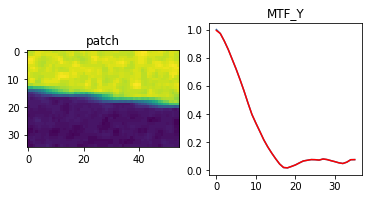

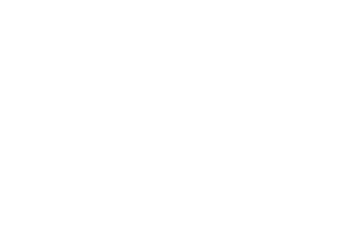

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.14it/s]


epoch_loss = 4.7802343033254147e-05
Epoch 935/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

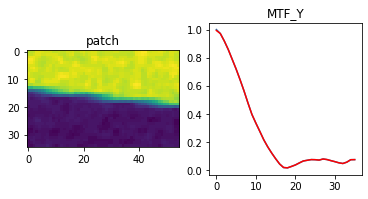

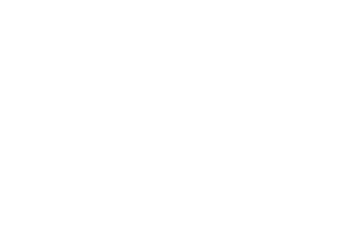

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.54it/s]


epoch_loss = 4.771447493112646e-05
Epoch 936/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

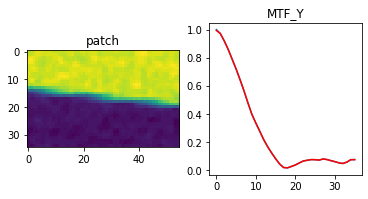

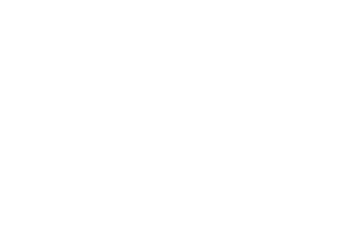

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.11it/s]


epoch_loss = 4.762591561302543e-05
Epoch 937/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

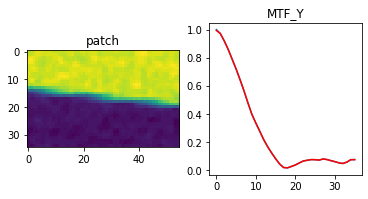

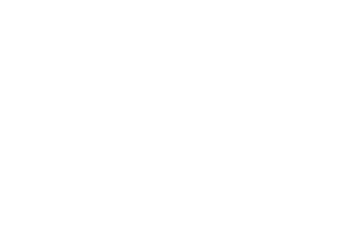

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 4.753829489345662e-05
Epoch 938/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

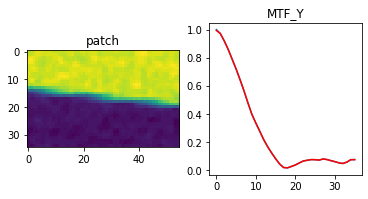

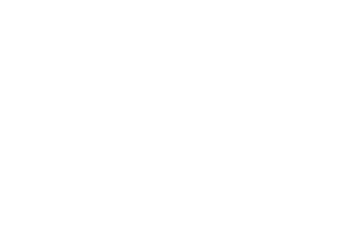

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]


epoch_loss = 4.744996113004163e-05
Epoch 939/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

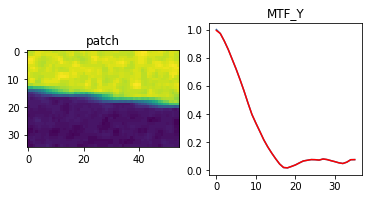

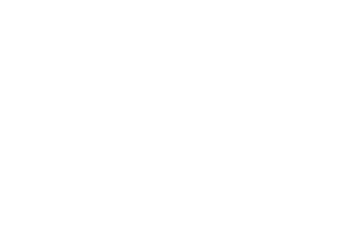

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]


epoch_loss = 4.736178379971534e-05
Epoch 940/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

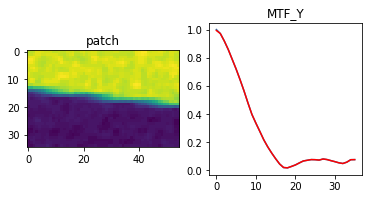

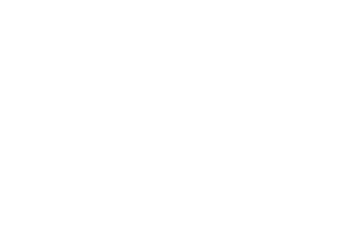

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.67it/s]


epoch_loss = 4.727617124444805e-05
Epoch 941/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

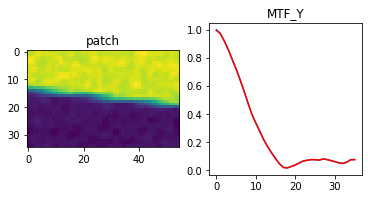

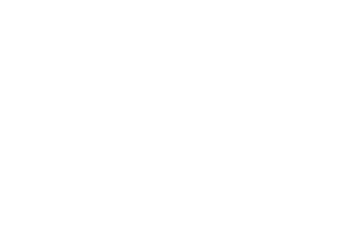

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]


epoch_loss = 4.718823038274422e-05
Epoch 942/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

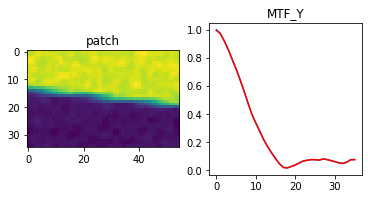

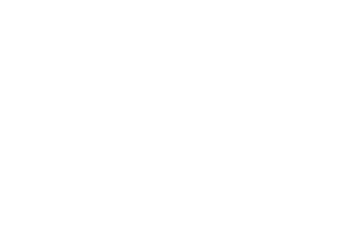

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.25it/s]


epoch_loss = 4.710041685029864e-05
Epoch 943/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

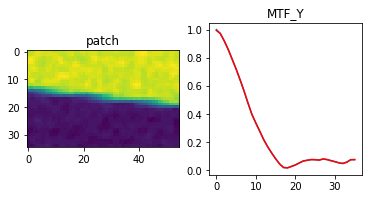

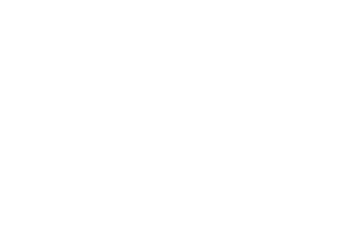

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]


epoch_loss = 4.701517173089087e-05
Epoch 944/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

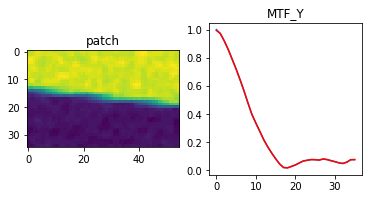

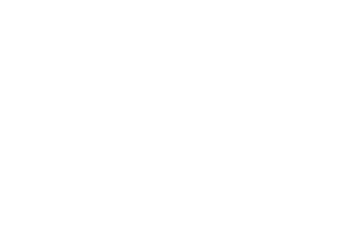

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 4.692920629167929e-05
Epoch 945/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

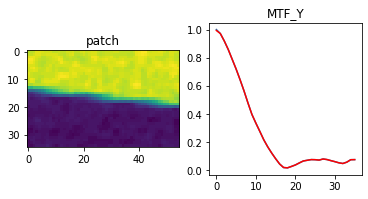

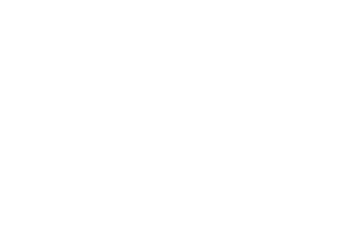

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]


epoch_loss = 4.6844168537063524e-05
Epoch 946/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

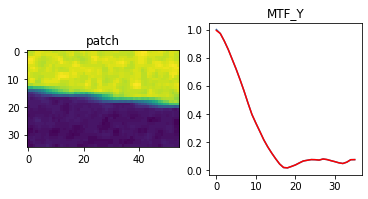

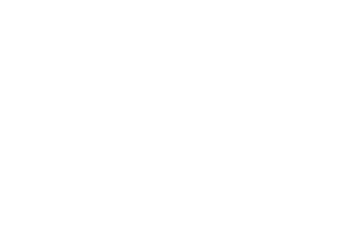

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]


epoch_loss = 4.67568461317569e-05
Epoch 947/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

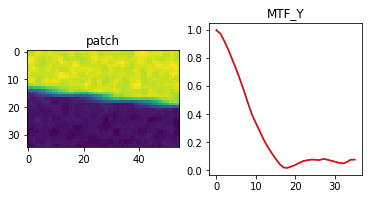

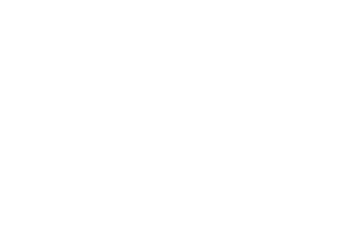

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.77it/s]


epoch_loss = 4.667125176638365e-05
Epoch 948/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

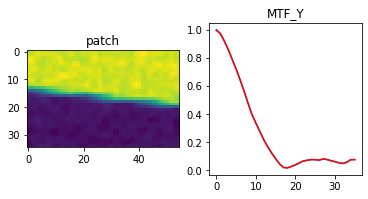

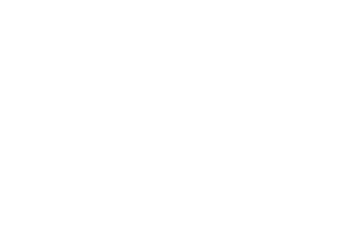

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]


epoch_loss = 4.658657417166978e-05
Epoch 949/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

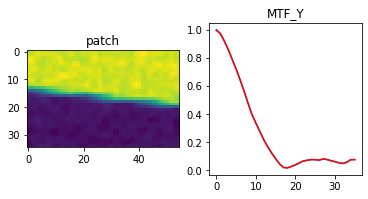

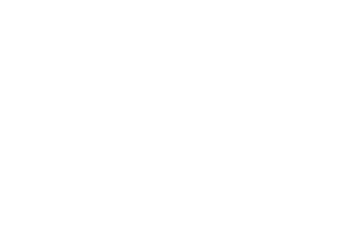

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]


epoch_loss = 4.650285700336099e-05
Epoch 950/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

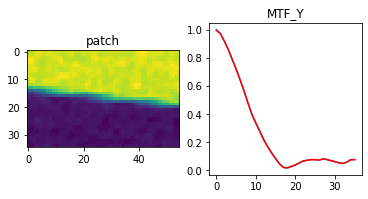

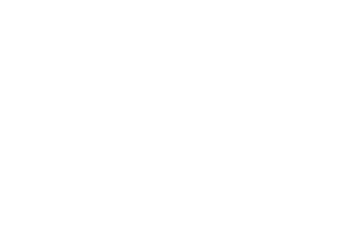

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]


epoch_loss = 4.6417611883953214e-05
Epoch 951/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

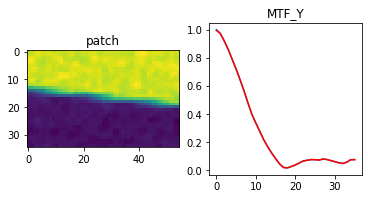

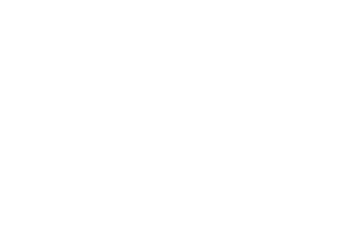

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.39it/s]


epoch_loss = 4.6333272621268407e-05
Epoch 952/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

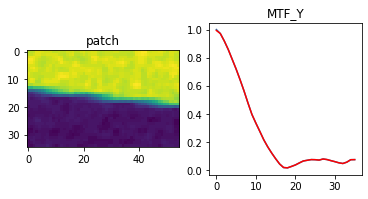

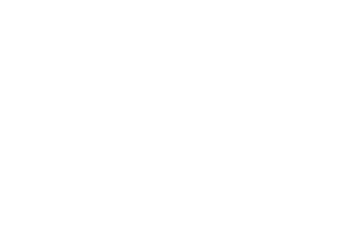

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]


epoch_loss = 4.624988287105225e-05
Epoch 953/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

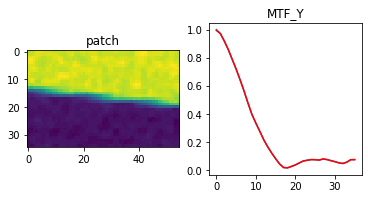

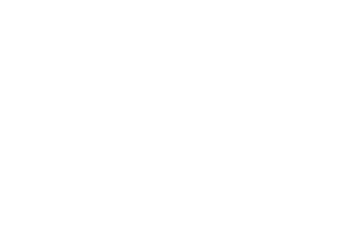

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.75it/s]


epoch_loss = 4.616498335963115e-05
Epoch 954/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

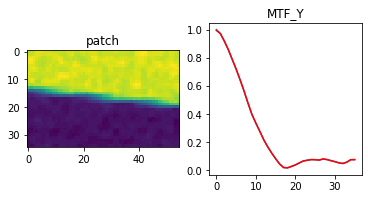

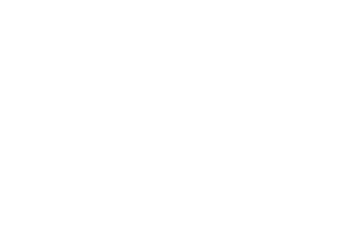

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.80it/s]


epoch_loss = 4.60826231574174e-05
Epoch 955/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

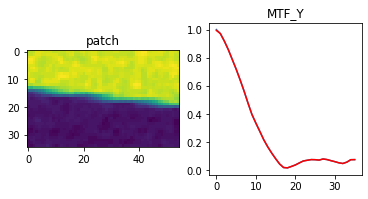

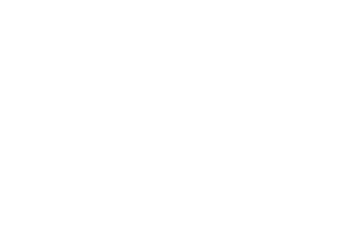

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.86it/s]


epoch_loss = 4.599796739057638e-05
Epoch 956/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

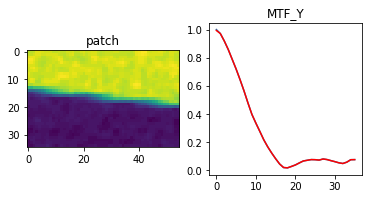

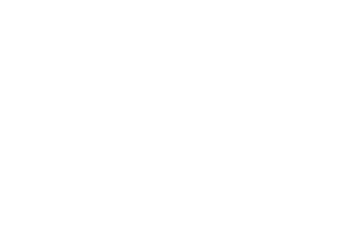

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]


epoch_loss = 4.5915021473774686e-05
Epoch 957/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

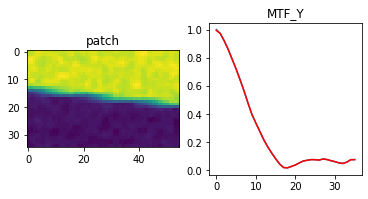

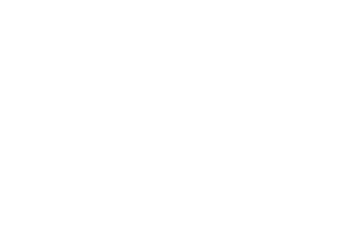

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.02it/s]


epoch_loss = 4.583298505167477e-05
Epoch 958/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

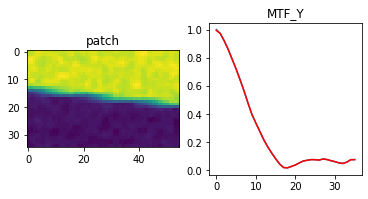

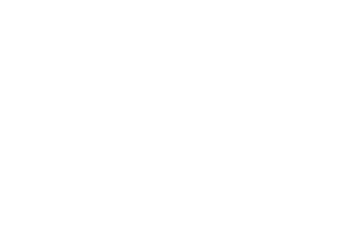

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 4.575027196551673e-05
Epoch 959/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

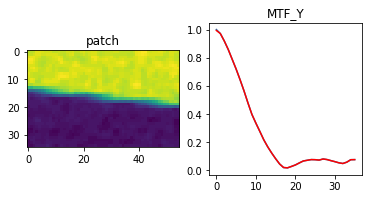

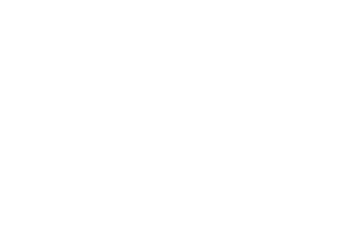

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.14it/s]


epoch_loss = 4.5667671656701714e-05
Epoch 960/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

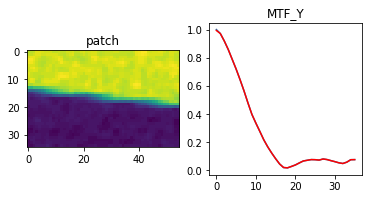

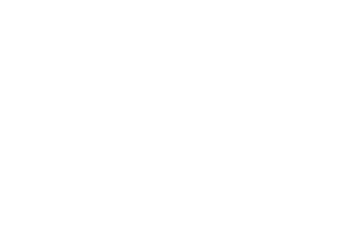

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]


epoch_loss = 4.5585973566630855e-05
Epoch 961/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

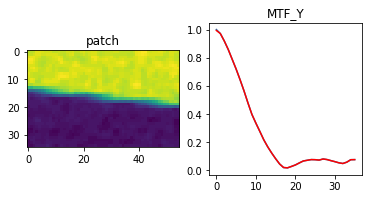

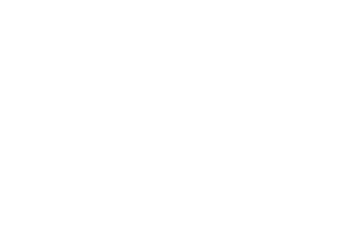

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]


epoch_loss = 4.5503576984629035e-05
Epoch 962/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

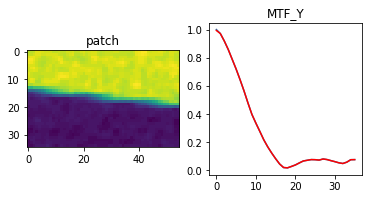

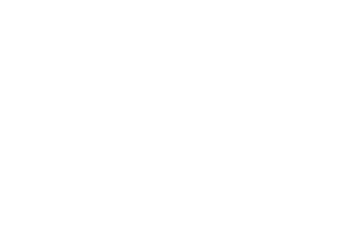

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.63it/s]


epoch_loss = 4.542128226603381e-05
Epoch 963/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

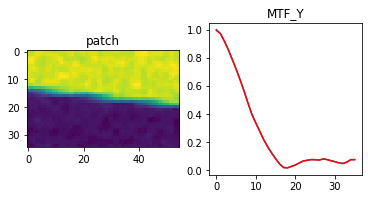

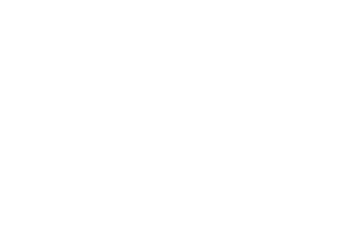

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]


epoch_loss = 4.5340722863329574e-05
Epoch 964/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

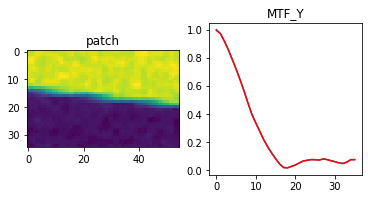

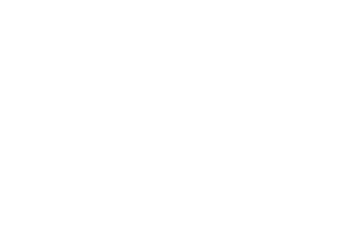

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 4.5259450416779146e-05
Epoch 965/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

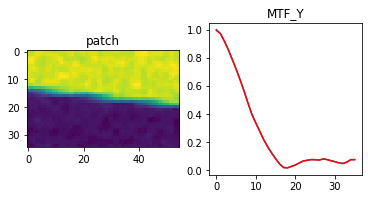

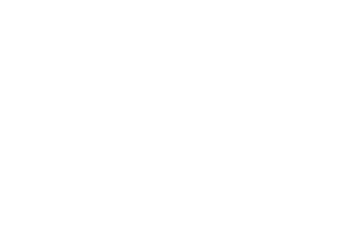

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]


epoch_loss = 4.517908746493049e-05
Epoch 966/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

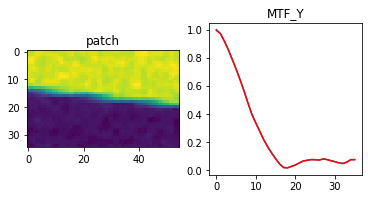

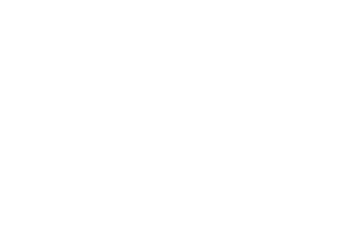

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]


epoch_loss = 4.509723657974973e-05
Epoch 967/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

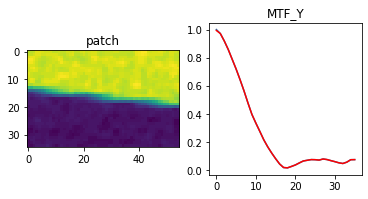

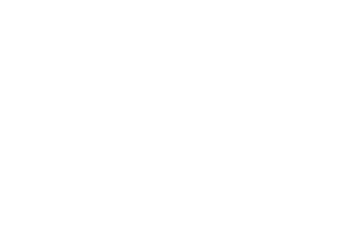

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]


epoch_loss = 4.501789589994587e-05
Epoch 968/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

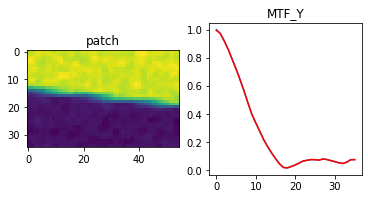

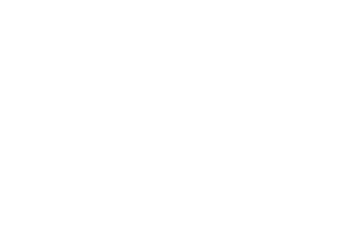

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]


epoch_loss = 4.493786036618985e-05
Epoch 969/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

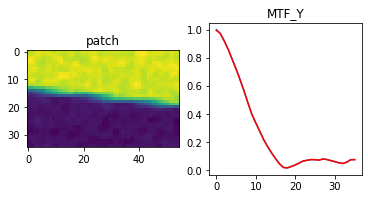

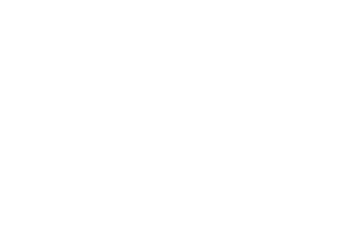

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.01it/s]


epoch_loss = 4.485790486796759e-05
Epoch 970/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

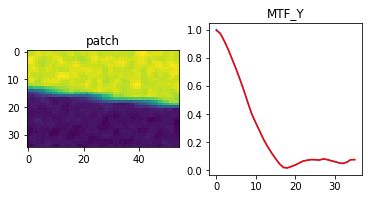

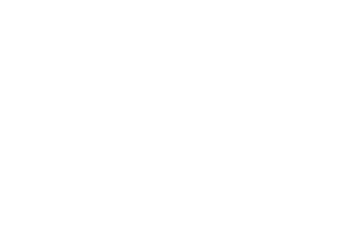

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.42it/s]


epoch_loss = 4.477807306102477e-05
Epoch 971/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

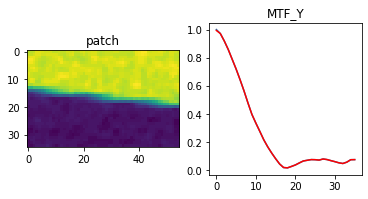

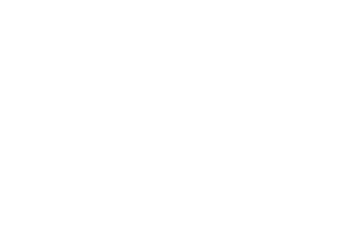

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 4.469913255888969e-05
Epoch 972/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

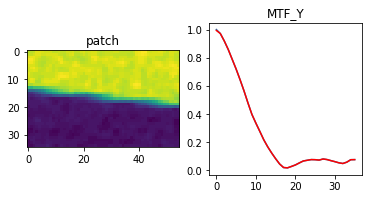

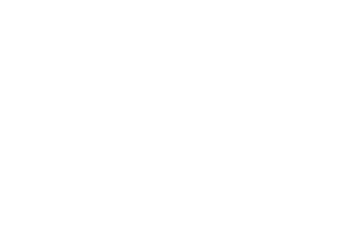

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]


epoch_loss = 4.461950811673887e-05
Epoch 973/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

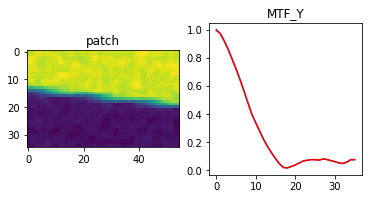

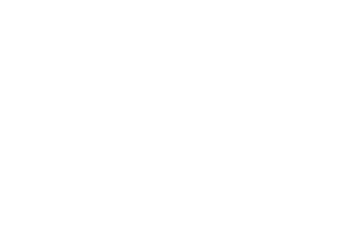

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.28it/s]


epoch_loss = 4.453998553799465e-05
Epoch 974/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

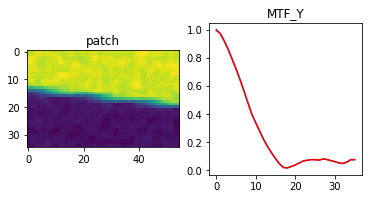

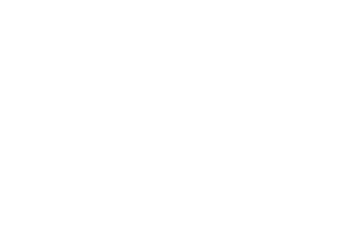

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.58it/s]


epoch_loss = 4.446137245395221e-05
Epoch 975/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

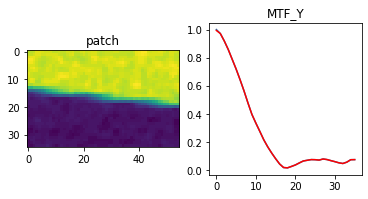

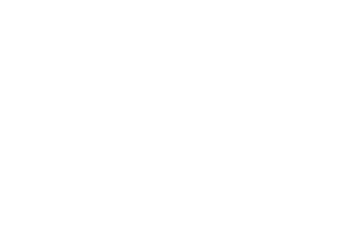

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.75it/s]


epoch_loss = 4.438361793290824e-05
Epoch 976/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

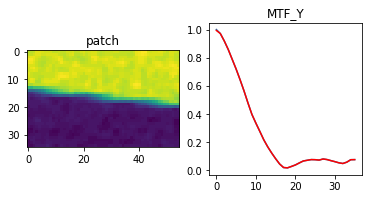

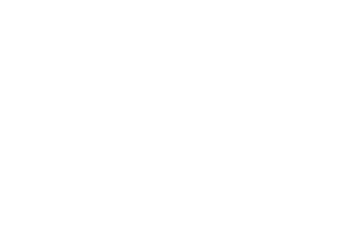

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.28it/s]


epoch_loss = 4.4304400944383815e-05
Epoch 977/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

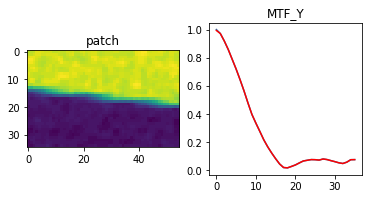

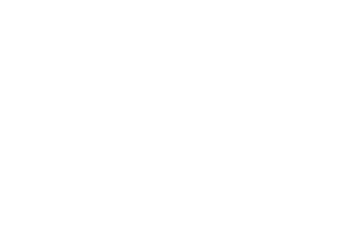

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.14it/s]


epoch_loss = 4.4226871978025883e-05
Epoch 978/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

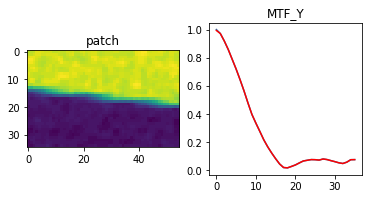

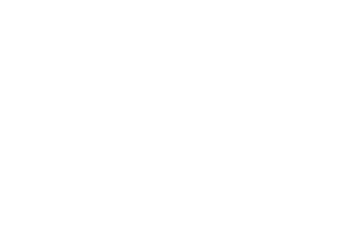

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 4.414863360580057e-05
Epoch 979/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

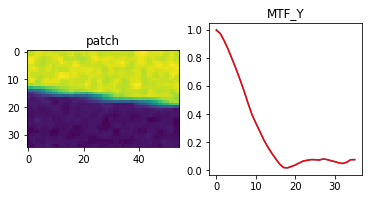

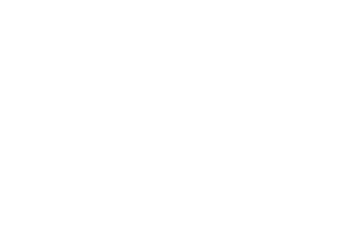

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.09it/s]


epoch_loss = 4.4071297452319413e-05
Epoch 980/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

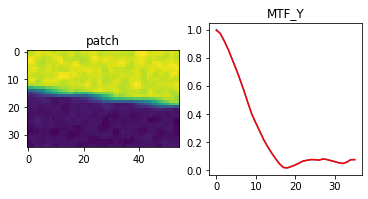

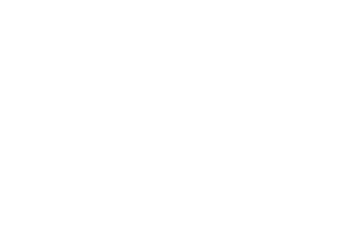

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


epoch_loss = 4.399405952426605e-05
Epoch 981/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

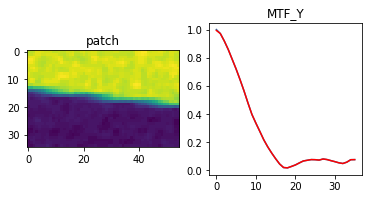

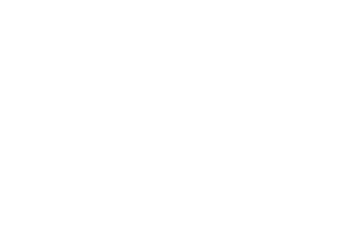

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.70it/s]


epoch_loss = 4.391691618366167e-05
Epoch 982/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

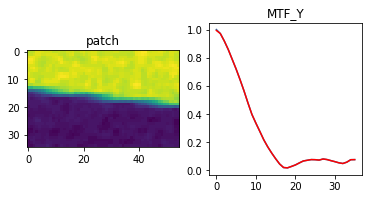

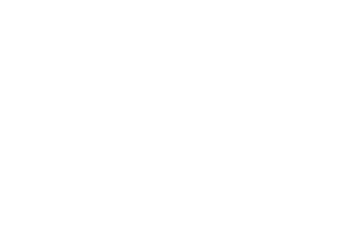

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]


epoch_loss = 4.3840653233928606e-05
Epoch 983/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

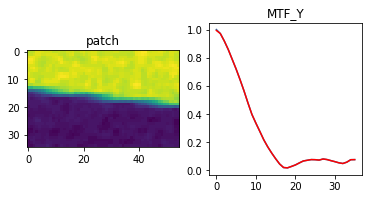

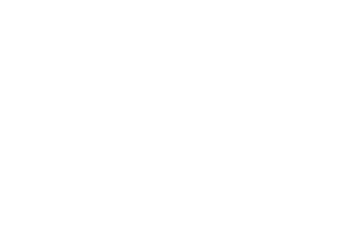

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 4.376371362013742e-05
Epoch 984/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

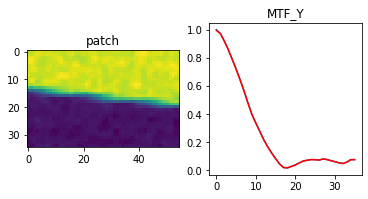

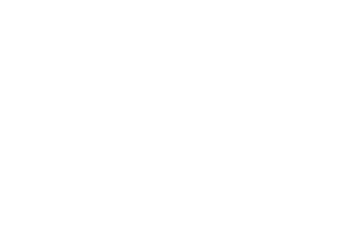

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.48it/s]


epoch_loss = 4.368686495581642e-05
Epoch 985/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

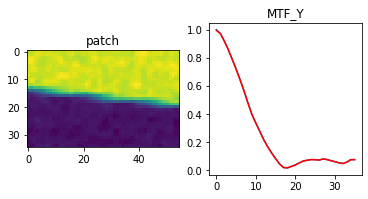

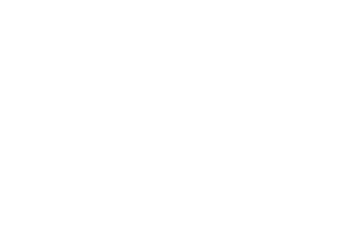

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]


epoch_loss = 4.3610089051071554e-05
Epoch 986/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

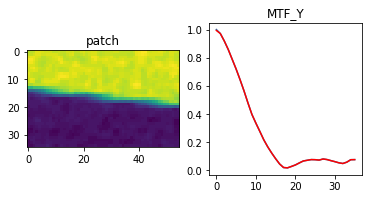

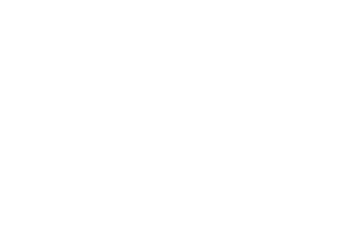

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]


epoch_loss = 4.353342956164852e-05
Epoch 987/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

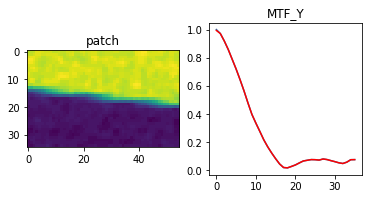

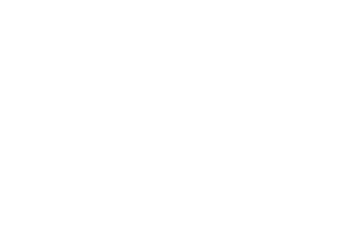

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]


epoch_loss = 4.3459243897814304e-05
Epoch 988/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

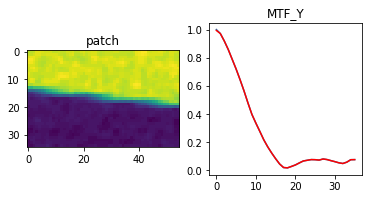

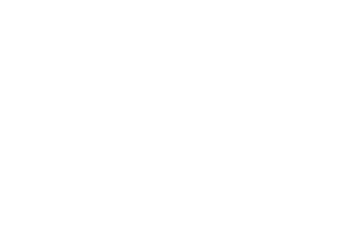

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]


epoch_loss = 4.338275903137401e-05
Epoch 989/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

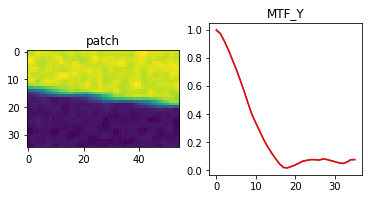

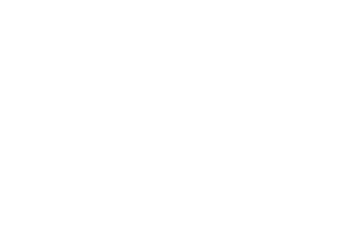

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]


epoch_loss = 4.330796582507901e-05
Epoch 990/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

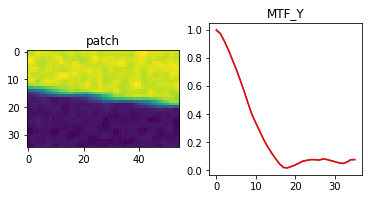

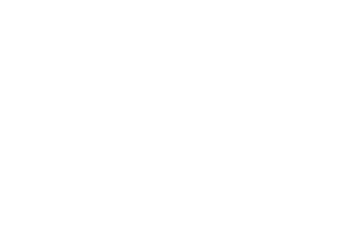

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]


epoch_loss = 4.3231666495557874e-05
Epoch 991/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

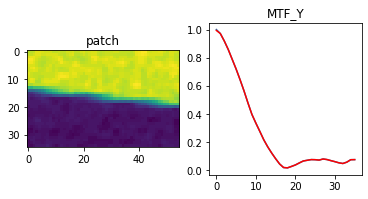

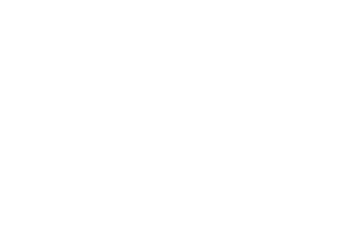

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]


epoch_loss = 4.315705882618204e-05
Epoch 992/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

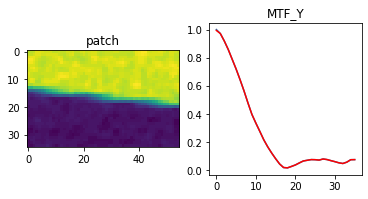

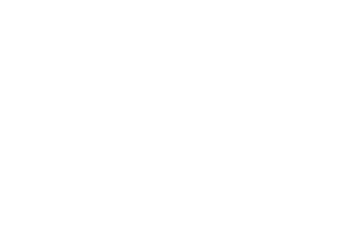

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.59it/s]


epoch_loss = 4.308330608182587e-05
Epoch 993/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

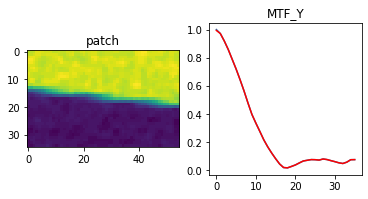

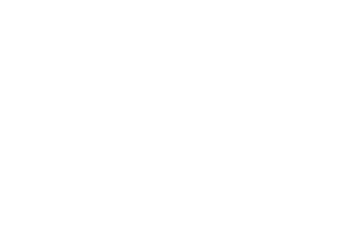

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]


epoch_loss = 4.300730142858811e-05
Epoch 994/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

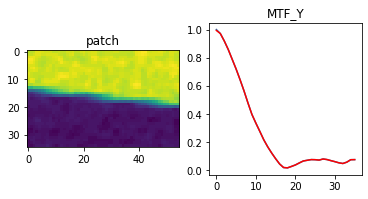

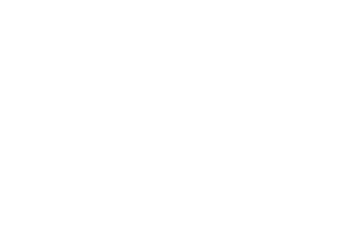

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]


epoch_loss = 4.2932962969643995e-05
Epoch 995/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

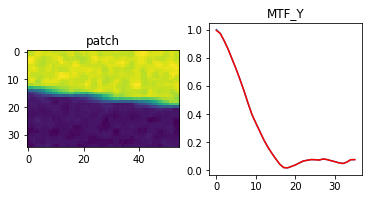

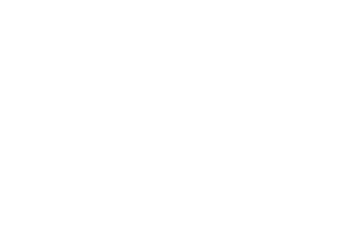

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]


epoch_loss = 4.285871546017006e-05
Epoch 996/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

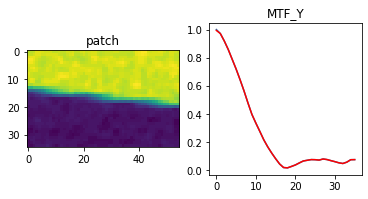

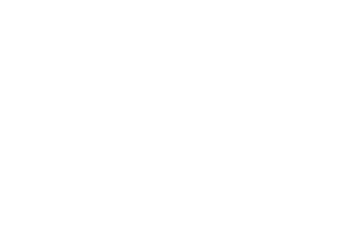

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.04it/s]


epoch_loss = 4.278530468582176e-05
Epoch 997/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

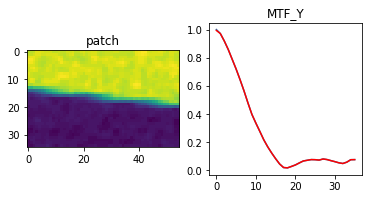

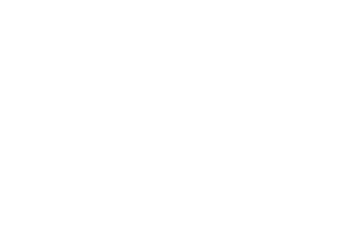

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.56it/s]


epoch_loss = 4.2712792492238805e-05
Epoch 998/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

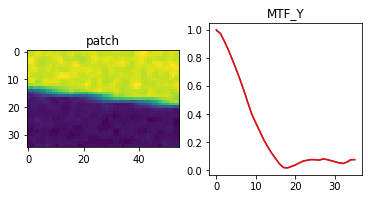

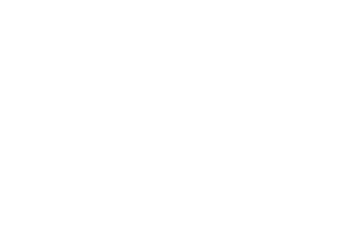

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.87it/s]


epoch_loss = 4.2638799641281366e-05
Epoch 999/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

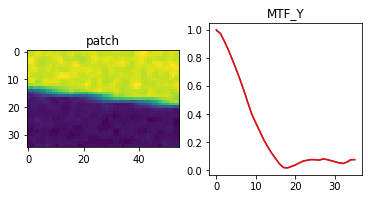

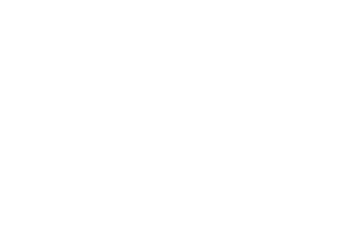

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]


epoch_loss = 4.256490501575172e-05
Epoch 1000/1000
----------


  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

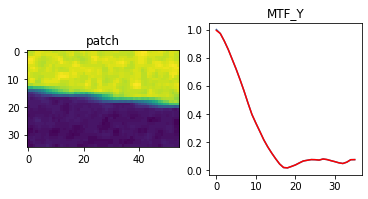

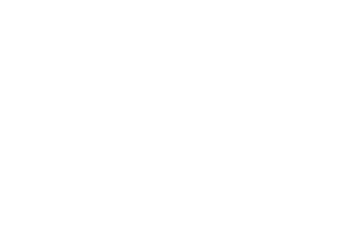

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.94it/s]


epoch_loss = 4.249109770171344e-05
Training complete in 4m 13s


In [43]:

sched = torch.optim.lr_scheduler.StepLR(optimizer, step_size=4) #TODO
criterion = torch.nn.MSELoss(reduction='none')
epochs =100
net.to(device)
net.train()
net = train_model(net, criterion, optimizer, sched, epochs)

In [ ]:
val_dataset = FGDataset(csv_file=str(Path(LocalAppPath) / 'val.csv'),val_mode = True,scale = 10)

dataloader['val'] = DataLoader(val_dataset, batch_size=batch_size,
                        shuffle=True, num_workers=0)
net.eval()
for i_batch, sample_batched in enumerate(tqdm(dataloader['val'])):

    
    inputs = sample_batched['image'].to(device)
    background = sample_batched['background'].to(device)
    labels = sample_batched['gt_image'].to(device)
    
    print(inputs.shape)
    import time
    sss = 1
    t = time.time()
    for i in range(sss):
        output = net(torch.cat((inputs,background),1))
        
    print((time.time() - t)/sss)
        


    plt.figure()
    show_sample(sample_batched,torch.sigmoid(output))
    plt.axis('off')
    plt.ioff()
    plt.show()

In [11]:
# Saving the checkpoint
# model.class_to_idx = image_datasets['train'].class_to_idx

checkpoint = {'input_size': 2208,
              'output_size': 102,
              'epochs': epochs,
              'batch_size': 64,
              'model': net,
              'scheduler': sched,
              'optimizer': optimizer.state_dict(),
              'state_dict': net.state_dict(),
             }
torch.save(checkpoint, LocalAppPath + '/checkpoint/checkpoint_ic_d161.pth')


In [12]:
# Load a checkpoint and rebuild the model
def load_checkpoint(filepath):
    checkpoint = torch.load(filepath)
    model = checkpoint['model']
    model.load_state_dict(checkpoint['state_dict'])
    optimizer = checkpoint['optimizer']
    epochs = checkpoint['epochs']
    
    for param in model.parameters():
        param.requires_grad = False
        
    return model

model = load_checkpoint(LocalAppPath + '/checkpoint/checkpoint_ic_d161.pth')
model

UNet(
  (inc): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(6, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace)
    )
  )
  (down1): Down(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=

In [13]:
def predict2(inputs , background , model):
    ''' Predict the class (or classes) of an image using a trained deep learning model.
    '''
    
    # Implement the code to predict the class from an image file

    
    model.eval()

    
    output = model.forward(torch.cat((inputs,background),1))
    output = torch.sigmoid(output)
    
   
    
    return output




  0%|                                                                                          | 0/862 [00:00<?, ?it/s]C:\Users\erez.posner\AppData\Local\Continuum\anaconda3\envs\test\lib\site-packages\ipykernel_launcher.py:39: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.3.0.
Use Pillow instead: ``numpy.array(Image.fromarray(arr).resize())``.
C:\Users\erez.posner\AppData\Local\Continuum\anaconda3\envs\test\lib\site-packages\ipykernel_launcher.py:40: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.3.0.
Use Pillow instead: ``numpy.array(Image.fromarray(arr).resize())``.
C:\Users\erez.posner\AppData\Local\Continuum\anaconda3\envs\test\lib\site-packages\ipykernel_launcher.py:41: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.3.0.
Use Pillow instead: ``numpy.array(Image.fromarray(arr).resize())

torch.Size([1, 3, 614, 513])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 432x288 with 0 Axes>

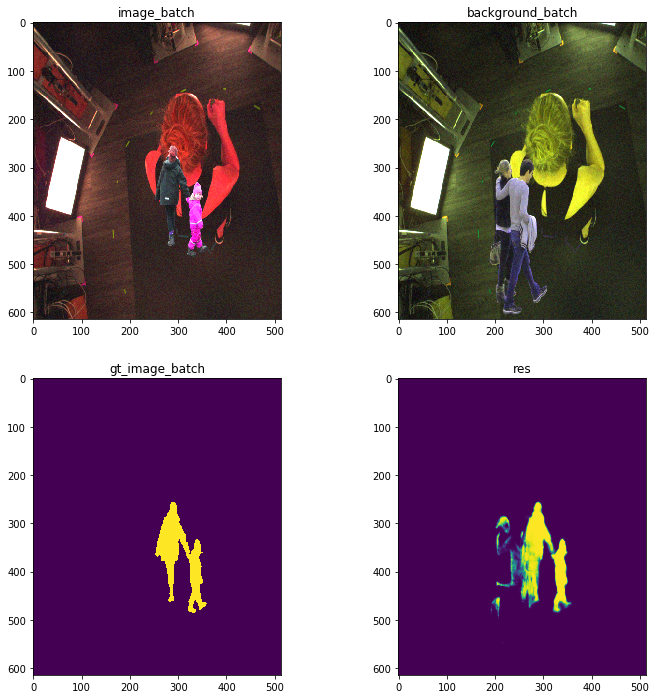

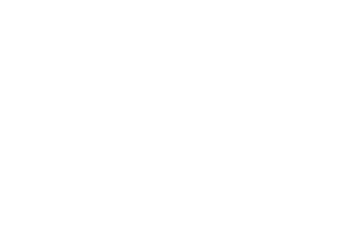

In [25]:
batch_size = 1
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

val_dataset = FGDataset(csv_file=str(Path(LocalAppPath) / 'val.csv'),val_mode = True,scale = 2) #4

dataloader_ = DataLoader(val_dataset, batch_size=batch_size,
                        shuffle=True, num_workers=0)

for i_batch, sample_batched in enumerate(tqdm(dataloader_)):

    
    inputs = sample_batched['image'].to(device)
    print(inputs.shape)
    background = sample_batched['background'].to(device)
    labels = sample_batched['gt_image'].to(device)
    output = predict2(inputs,background, model.to(device))
    plt.figure()
    show_sample(sample_batched,output)
    plt.axis('off')
    plt.ioff()
    plt.show()
    break

    
